In [3]:
import pandas as pd
import warnings
import japanize_matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from IPython.core.display import display, HTML 
# display(HTML("<style>.container { width:80% !important; }</style>"))
warnings.filterwarnings('ignore')
train=pd.read_csv("train_data.csv")
test=pd.read_csv("test_data.csv")
import pandas_profiling as pdp
df=pd.concat([train,test],sort=False)


In [42]:
import pandas_profiling as pdp
from sklearn.decomposition import PCA
def preprocess():
    
    train=pd.read_csv("train_data.csv")
    test=pd.read_csv("test_data.csv")
#     print(train)
    df=pd.concat([train,test],sort=False)
    df.age=df.age.map(lambda x:57 if x>58 else x)
    df.num_child=df.num_child.map(lambda x:7 if x>7 else x)
    df.study=df.study_time.map(lambda x:17 if x>17 else x)
    df["familiy_num"]=1+df.partner+df.num_child
    arealist=list(train.groupby("area").mean().salary.sort_values().index)
    areadic={}
#     df.loc[((df["area"]=="東京都") | (df["area"]=="大阪府")) & (df["partner"]==1), "commute"] = \
#       df[((df["area"]=="東京都") | (df["area"]=="大阪府")) & (df["partner"]==1)]["commute"].apply(lambda x : max(x/2 - 1, 0))
#     df.loc[((df["area"]!="東京都") | (df["area"]!="大阪府")) & (df["partner"]==1), "commute"] = \
#       df[((df["area"]!="東京都") | (df["area"]!="大阪府")) & (df["partner"]==1)]["commute"].apply(lambda x : max(x-1, 0))
#     df.loc[((df["area"]=="東京都") | (df["area"]=="大阪府")) & (df["partner"]==0), "commute"] = \
#       df[((df["area"]=="東京都") | (df["area"]=="大阪府")) & (df["partner"]==0)]["commute"].apply(lambda x : max(x-1, 0))
    for i,area in enumerate(arealist):
        areadic[area]=i+1
    df.area=df.area.map(areadic)
    df.position=df.position+1
    df.sex=df.sex-1
    df.salary=np.log(df.salary)
    df["agexposition"]=df.age*df.position.map(lambda x:1 if x==1 else x)
    df["age_layer"] = 0
    df.loc[20>=df["age"], "age_layer"] = 0
    df.loc[(30>=df["age"])&(df["age"]>20), "age_layer"] = 1
    df.loc[df["age"]>30, "age_layer"] = 2
    df["agelayer_and_position"] = df["age_layer"].astype(str) + "_" + df["position"].astype(str)
    aplist=list(df.groupby("agelayer_and_position").mean().salary.sort_values().index)
    apdic={}
    for i,area in enumerate(aplist):
        apdic[area]=i+1
    df.agelayer_and_position=df.agelayer_and_position.map(apdic)
#     df["overxstudy"]=df.overtime +4*df.study_time
    df["area_partner"] = df.area.map(lambda x:1if (x==47)|(x==46) else 0).astype(str) + "_" + df["partner"].astype(str)
    applist=list(df.groupby("area_partner").mean().salary.sort_values().index)
    print(applist)
    appdic={}
    for i,area in enumerate(applist):
        appdic[area]=i+1
    df.area_partner=df.area_partner.map(appdic)
#     splist=list(df.groupby("education_and_position").mean().salary.sort_values().index)
#     spdic={}
#     for i,area in enumerate(splist):
#         spdic[area]=i+1
#     df.education_and_position=df.education_and_position.map(spdic)
    
#     df["overtime_by_age"] = df["overtime"] / df["age"]
    
#     df.education=df.education+1
    
#     train["eduxposi"]=train.education*train.position
#     eduposi=list(train.groupby("eduxposi").mean().salary.sort_values().index)
#     eduposidic={}
#     for i,x in enumerate(eduposi):
#         eduposidic[x]=i+1
#     df["eduxposi"]=(df.education*df.position).map(eduposidic)

#     pca = PCA(n_components=1)
#     #モデルのパラメータをfitして取得しPCAオブジェクトへ格納
#     pca.fit(df.drop(["id","salary"],axis=1))

# #     print('Variance ratio: ' + str(pca.explained_variance_ratio_))
# #     print('Singular values: ' + str(pca.singular_values_))

#     #fitで取得したパラメータを参考にXを変換する
#     pca_X = pca.transform(df.drop(["id","salary"],axis=1))
#     df["pca"]=pca_X
#     df.drop(["sex"],axis=1)
#     print(df)
    train=df.dropna().drop(["id"],axis=1)
    test=df[df.salary.isnull()].drop(["id"],axis=1)
    test=test.drop(["salary",],axis=1)
    X = train.drop(["salary"],axis=1)
    y = train.salary
    return X,y,test,df
X,y,test,df=preprocess()
#original 23.625521293118492
train=pd.concat([X,y],axis=1)

['0_0', '0_1', '1_0', '1_1']


In [44]:
# df.area_partner.unique()

In [45]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error
import lightgbm as lgb
def fair(preds,dtrain):
    x=pred-dtrain.get_labels()
    c=1
    den=abs(x)+c
    grad=c*x/den
    hess=c*c/den**2
    return grad,hess
model=lgb.LGBMRegressor(**{'objective':'huber','booster': 'gblinear',
                           'iterations': 309, 'depth': 16, 'learning_rate': 0.1,
                           'random_strength': 48, 'bagging_temperature': 19.715729096205934, 
                           'od_type': 'Iter', 'od_wait': 26, 'lambda_l1': 0.726486176355415, 
                           'lambda_l2': 0.00044177449020498015, 'num_leaves': 188,
                           'feature_fraction': 0.9443254919883529, 'bagging_fraction': 0.9271673814820428, 
                           'bagging_freq': 2, 'min_child_samples': 17})
scores = []
kf = KFold(n_splits=5, shuffle=True, random_state=0)
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    model.fit(X_train, y_train)
    scores.append(mean_absolute_error(np.exp(model.predict(X_test)),np.exp( y_test)))
print(scores)
print(np.array(scores).mean())

[22.48421178725824, 22.339682221232056, 22.88441202302768, 22.96277856315466, 21.949700674405033]
22.524157053815536


In [95]:
df

,id,position,age,area,sex,partner,num_child,education,service_length,study_time,commute,overtime,salary,familiy_num,agexposition
0,0,2,44,45,1,1,2,1,24,2.0,0.6,9.2,6.059298,4,88
1,1,3,31,28,0,0,0,0,13,9.0,0.7,12.4,5.761833,1,93
2,2,3,36,26,0,0,0,2,14,4.0,0.4,16.9,5.878717,1,108
3,3,1,22,47,1,0,0,0,4,3.0,0.0,6.1,5.304851,1,22
4,4,1,25,14,1,0,0,1,5,3.0,0.2,4.9,5.182163,1,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8995,8995,2,43,14,1,0,0,0,25,3.0,0.7,0.0,NaN,1,86
8996,8996,3,40,5,1,0,0,0,22,8.0,0.7,5.7,NaN,1,120
8997,8997,5,46,24,0,0,0,0,28,2.0,0.8,0.0,NaN,1,230
8998,8998,1,22,13,0,0,0,0,4,0.0,0.1,0.7,NaN,1,22


# Learning

In [144]:
from sklearn.model_selection import train_test_split, GridSearchCV

train_X, valid_X,train_y, valid_y = train_test_split(X,y,test_size=0.2,random_state=43)

In [150]:
pdp.ProfileReport(X)

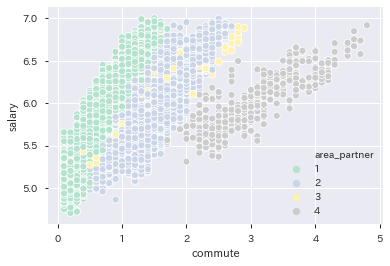

In [46]:
sns.scatterplot(x="commute",y="salary",data=pd.concat([X,y],axis=1),hue="area_partner",palette="Pastel2")

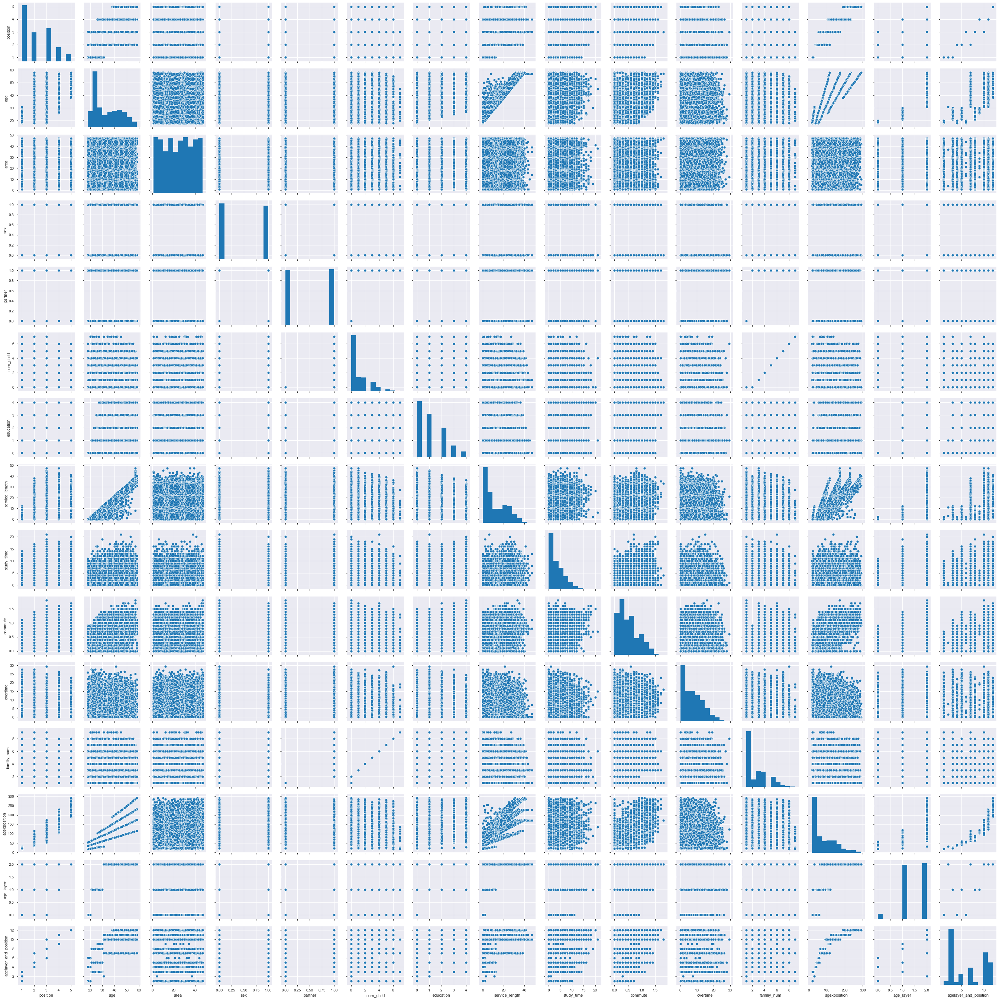

In [154]:
sns.pairplot(test)

In [151]:
pdp.ProfileReport(test)

In [145]:
from sklearn.ensemble import RandomForestRegressor as RFR
import numpy as np
from sklearn.metrics import mean_absolute_error

rg = RFR(n_jobs=-1, random_state=2525)
 
rg.fit(train_X,train_y)
print(rg.score(valid_X,valid_y))
from sklearn.metrics import mean_squared_error
score=mean_absolute_error(np.exp(valid_y),np.exp(rg.predict(valid_X)))
print(f'MAE:{score:4f}')
fti = rg.feature_importances_

print('Feature Importances:')
for i,feat in enumerate(valid_X.columns):
    print('\t{0:10s} : {1:>.6f}'.format(feat, fti[i]))
col_names = test.columns.values
col_names_ = col_names[np.argsort(rg.feature_importances_)[::-1]]
col_names_

0.955957465061955
MAE:23.548876
Feature Importances:
	position   : 0.001678
	age        : 0.003416
	area       : 0.012546
	sex        : 0.001082
	partner    : 0.013460
	num_child  : 0.023856
	education  : 0.010383
	service_length : 0.004392
	study_time : 0.004504
	commute    : 0.222954
	overtime   : 0.024835
	familiy_num : 0.038837
	agexposition : 0.579737
	age_layer  : 0.000163
	agelayer_and_position : 0.058157


array(['agexposition', 'commute', 'agelayer_and_position', 'familiy_num',
       'overtime', 'num_child', 'partner', 'area', 'education',
       'study_time', 'service_length', 'age', 'position', 'sex',
       'age_layer'], dtype=object)

In [91]:
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgb
model=lgb.LGBMRegressor()
scores = []
kf = KFold(n_splits=5, shuffle=True, random_state=0)
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    model.fit(X_train, y_train)
    scores.append(mean_absolute_error(np.exp(model.predict(X_test)),np.exp( y_test)))
print(scores)
print(np.array(scores).mean())

[22.20712780200383, 22.274226836844047, 22.832789187009194, 23.111309043914087, 22.01745419330349]
22.48858141261493


# ModelSelection

In [7]:
# 特徴量を選択して、複数のモデルで精度を調査する
from scipy.stats import mstats
from tqdm import tqdm
import matplotlib
from sklearn import metrics,  feature_selection, ensemble, gaussian_process, linear_model, naive_bayes, neighbors, svm, tree, discriminant_analysis, model_selection
# from imblearn import under_sampling, over_sampling
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import make_scorer
import lightgbm as lgb
import xgboost as xgb
import catboost as cat
base_color = 'darkturquoise'
base_color2 = 'gray'

def generate_cmap(colors):
    
    values = range(len(colors))
    vmax = np.ceil(np.max(values))
    color_list = []
    for v, c in zip(values, colors):
        color_list.append((v/vmax, c))
    return matplotlib.colors.LinearSegmentedColormap.from_list('custom_cmap', color_list)
cm = generate_cmap([base_color2, 'white', base_color])

def rmse_score(y_true, y_pred):
    """RMSE (Root Mean Square Error: 平均二乗誤差平方根) を計算する関数"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return rmse

params={'booster': 'dart', 
        'alpha': 0.009385870161072372, 
        'max_depth': 9, 'eta': 2.3698818355249718e-07,
        'gamma': 3.167530221746867e-05, 
        'grow_policy': 'lossguide',
        'sample_type': 'weighted',
        'normalize_type': 'forest',
        'rate_drop': 3.1207262366715483e-08,
        'skip_drop': 1.2650261386504368e-05}


models = [
 
    #Ensemble Methods
    ensemble.AdaBoostRegressor(),
    ensemble.BaggingRegressor(),
    ensemble.ExtraTreesRegressor(),
    ensemble.GradientBoostingRegressor(),
    ensemble.RandomForestRegressor(),
    HistGradientBoostingRegressor(),
 
    #Gaussian Processes
#     gaussian_process.GaussianProcessRegressor(),
    
    #GLM
    linear_model.Ridge(),

    
    #Trees    
    tree.DecisionTreeRegressor(),
    tree.ExtraTreeRegressor(),
 
    #xgboost
    xgb. XGBRegressor(),
    lgb.LGBMRegressor(),
#     cat.CatBoostRegressor(),
    
]
 
df_compare = pd.DataFrame(columns=['name', 'train_rmse', 'valid_rmse', 'time'])
score_funcs = {
    'rmse': make_scorer(rmse_score),
}

for model in tqdm(models):
    
    name = model.__class__.__name__
    
    cv_rlts = model_selection.cross_validate(model,X,y, scoring=score_funcs, cv=10, return_train_score=True)
 
    for i in range(10):
        s = pd.Series([name, cv_rlts['train_rmse'][i], cv_rlts['test_rmse'][i], cv_rlts['fit_time'][i]], index=df_compare.columns, name=name+str(i))
        df_compare = df_compare.append(s)
        
plt.figure(figsize=(12,8))
sns.boxplot(data=df_compare, y='name', x='valid_rmse', orient='h', color=base_color, linewidth=0.5, width=0.5)
plt.grid()
plt.show()

  9%|▉         | 1/11 [00:16<02:49, 16.97s/it]

KeyboardInterrupt: 

 71%|███████▏  | 5/7 [00:53<00:20, 10.25s/it]

[10:57:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:57:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:57:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:57:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:57:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:57:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:57:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:57:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:57:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

100%|██████████| 7/7 [01:10<00:00, 10.06s/it]


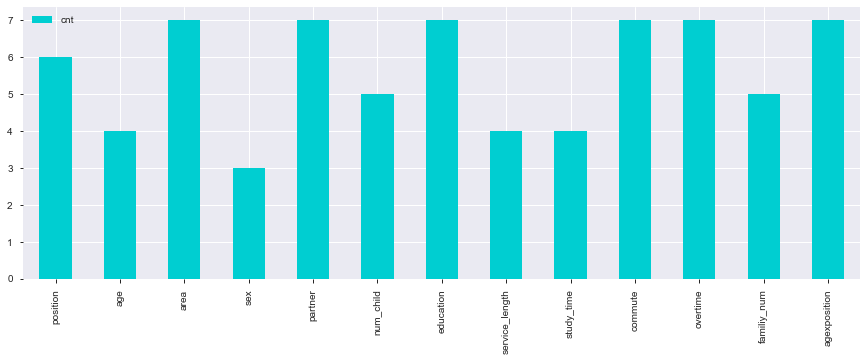

In [9]:
cols = X.columns.tolist()
 
# positive_cnt = int(df['salary'].sum())

feature_importance_models = [
    ensemble.AdaBoostRegressor(),
    ensemble.ExtraTreesRegressor(),
    ensemble.GradientBoostingRegressor(),
    ensemble.RandomForestRegressor(),
    tree.DecisionTreeRegressor(),
    xgb.XGBRegressor(),
    lgb.LGBMRegressor()
]
 
scoring = ['rsme']
df_rfe_cols_cnt = pd.DataFrame(columns=['cnt'], index=cols)
df_rfe_cols_cnt['cnt'] = 0
 
for i, model in tqdm(enumerate(feature_importance_models), total=len(feature_importance_models)):
    
    rfe = feature_selection.RFECV(model, step=2)
    rfe.fit(X, y)
#     print(rfe.get_support())
    rfe_cols = X[cols].columns.values[rfe.get_support()]
    df_rfe_cols_cnt.loc[rfe_cols, 'cnt'] += 1
    
df_rfe_cols_cnt.plot(kind='bar', color=base_color, figsize=(15, 5))
plt.show()

In [10]:
x_cols = df_rfe_cols_cnt[df_rfe_cols_cnt['cnt'] < 4].index
X=X.drop(x_cols,axis=1)
test=test.drop(x_cols,axis=1)
train_X, valid_X,train_y, valid_y = train_test_split(X,y,test_size=0.2,random_state=43)

## XGBoost+optuna

In [100]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold
import optuna
from sklearn.metrics import r2_score

class RidgeCV():
    model_cls = Ridge

    def __init__(self, n_trials=100):
        self.n_trials = n_trials

    def fit(self, X, y):
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X)
            y = pd.DataFrame(y)
        elif isinstance(X, pd.DataFrame):
            X = X.reset_index(drop=True)
            y = y.reset_index(drop=True)

        self.X = X
        self.y = y

#         study = optuna.create_study(direction='maximize')
        study = optuna.create_study(direction='minimize')
        study.optimize(self, n_trials=self.n_trials)
        self.best_trial = study.best_trial

        print()
        print("Best score:", round(self.best_trial.value, 2))
        print("Best params:", self.best_trial.params)
        print()

        self.best_model = self.model_cls(**self.best_trial.params)
        self.best_model.fit(self.X, self.y)

    def predict(self, X):
        if isinstance(X, pd.Series):
            X = pd.DataFrame(X.values.reshape(1, -1))
        elif isinstance(X, np.ndarray):
            X = pd.DataFrame(X)

        return self.best_model.predict(X)

    def score(self, X, y):
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X)
            y = pd.DataFrame(y)

        return self.best_model.score(X, y)

    def kfold_cv(self, model, splits=5):
        scores = []

        kf = KFold(n_splits=splits, shuffle=True)
        for train_index, test_index in kf.split(self.X):
            X_train, X_test = self.X.iloc[train_index], self.X.iloc[test_index]
            y_train, y_test = self.y.iloc[train_index], self.y.iloc[test_index]
            model.fit(X_train, y_train)
            scores.append(mean_absolute_error(np.exp(model.predict(X_test)),np.exp(y_test)))

        score = np.array(scores).mean()
        return score

In [146]:


import xgboost as xgb
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold
def fair(preds,dtrain):
    x=pred-dtrain.get_labels()
    c=1
    den=abs(x)+c
    grad=c*x/den
    hess=c*c/den**2
    return grad,hess

class XGBRegressorCV(RidgeCV):
    model_cls = xgb.XGBRegressor

    def __call__(self, trial):
        booster = trial.suggest_categorical('booster', ['gbtree', 'dart'])
        alpha = trial.suggest_loguniform('alpha', 1e-8, 1.0)

        max_depth = trial.suggest_int('max_depth', 1, 20)
        eta = trial.suggest_loguniform('eta', 1e-8, 1.0)
        gamma = trial.suggest_loguniform('gamma', 1e-8, 1.0)
        grow_policy = trial.suggest_categorical(
            'grow_policy', ['depthwise', 'lossguide'])

        if booster == 'gbtree':
            model = self.model_cls(silent=1, booster=booster,
                                   alpha=alpha, max_depth=max_depth, eta=eta,
                                   gamma=gamma, grow_policy=grow_policy,obj=fair)
        elif booster == 'dart':
            sample_type = trial.suggest_categorical('sample_type',
                                                    ['uniform', 'weighted'])
            normalize_type = trial.suggest_categorical('normalize_type',
                                                       ['tree', 'forest'])
            rate_drop = trial.suggest_loguniform('rate_drop', 1e-8, 1.0)
            skip_drop = trial.suggest_loguniform('skip_drop', 1e-8, 1.0)
            model = self.model_cls(silent=1, booster=booster,
                                   alpha=alpha, max_depth=max_depth, eta=eta,
                                   gamma=gamma, grow_policy=grow_policy,
                                   sample_type=sample_type,
                                   normalize_type=normalize_type,
                                   rate_drop=rate_drop, skip_drop=skip_drop,obj=fair)

        score = self.kfold_cv(model)
        return score

xgbr = XGBRegressorCV(n_trials=100)
xgbr.fit(X, y)

# pred_y=xgbr.predict(valid_X)
# score=mean_absolute_error(np.exp(valid_y),np.exp(xgbr.predict(valid_X)))
# print(f'MAE:{score:4f}')
# from sklearn.model_selection import KFold
# from sklearn.model_selection import cross_val_score
# kf = KFold(n_splits=3, shuffle=True, random_state=0)
# model = XGBRegressorCV(n_trials=10)
# scores = []


# for train_index, test_index in kf.split(X):
#     X_train, X_test = X.iloc[train_index], X.iloc[test_index]
#     y_train, y_test = y.iloc[train_index], y.iloc[test_index]
#     model.fit(X_train, y_train)
#     scores.append(mean_absolute_error(np.exp(model.predict(X_test)),np.exp( y_test)))
# print(scores)
# print(np.array(scores).mean())
#MAE:22.821581(drop)dummy
#MAE:22.753628(nodrop)dummy

[I 2019-12-09 09:44:19,454] Finished trial#0 resulted in value: 25.582195900655563. Current best value is 25.582195900655563 with parameters: {'booster': 'gbtree', 'alpha': 0.0053254695575013595, 'max_depth': 11, 'eta': 0.321773854959494, 'gamma': 0.5940008771419107, 'grow_policy': 'lossguide'}.
[I 2019-12-09 09:44:28,805] Finished trial#1 resulted in value: 26.21978375312982. Current best value is 25.582195900655563 with parameters: {'booster': 'gbtree', 'alpha': 0.0053254695575013595, 'max_depth': 11, 'eta': 0.321773854959494, 'gamma': 0.5940008771419107, 'grow_policy': 'lossguide'}.
[I 2019-12-09 09:44:59,367] Finished trial#2 resulted in value: 25.19373392901273. Current best value is 25.19373392901273 with parameters: {'booster': 'gbtree', 'alpha': 7.916389047891893e-05, 'max_depth': 14, 'eta': 5.790997339110928e-07, 'gamma': 0.4965011601892479, 'grow_policy': 'depthwise'}.
[I 2019-12-09 09:45:06,605] Finished trial#3 resulted in value: 23.496625148380826. Current best value is 23

KeyboardInterrupt: 

# LightGBM+optuna

In [147]:
# coding:utf-8
import lightgbm as lgb
# from sklearn.metrics import log_loss
def min_max_normalization(x):
    x_min = x.min()
    x_max = x.max()
    x_norm = (x - x_min) / ( x_max - x_min)
    return x_norm
def min_max_renormalization(x1,x2):
    x_min = x2.min()
    x_max = x2.max()
#     x_norm = (x2 - x_min) / ( x_max - x_min)
    x=x1*  ( x_max - x_min)+x_min
    return x

import lightgbm as lgb
# from sklearn.metrics import log_loss
cat_list = ['area', 'sex', 'partner','education']
class LGBRegressorCV(RidgeCV):
    model_cls = lgb.LGBMRegressor
    def __call__(self, trial):
        params = {
#             'eval_metric':'mae',
#             'booster':trial.suggest_categorical('booster',['gbtree','gblinear']),
#             'loss_function': 'fair',
#             'iterations' : trial.suggest_int('iterations', 50, 400),                      
            'min_data_in_leaf' : trial.suggest_int('min_data_in_leaf' , 0, 300),  
#             'depth':16,
            'regression_l1':'mean_absolute_error',
            'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 1),               
#             'random_strength' :trial.suggest_int('random_strength', 0, 100),                       
#             'bagging_temperature' :trial.suggest_loguniform('bagging_temperature', 0.01, 100.00), 
#             'od_type': trial.suggest_categorical('od_type', ['IncToDec', 'Iter']),
#             'od_wait' :trial.suggest_int('od_wait', 10, 50),
            'metric': 'binary_logloss',
            'verbosity': -1,
            'boosting_type': 'gbdt',
            'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
            'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
            'num_leaves': trial.suggest_int('num_leaves', 2, 256),
            'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
            'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
            'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
    }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score

model=LGBRegressorCV(n_trials=1000)

# kf = KFold(n_splits=3, shuffle=True, random_state=0)
# model = XGBRegressorCV(n_trials=20)
model.fit(X,y)
# scores = []


# for train_index, test_index in kf.split(X):
#     X_train, X_test = X.iloc[train_index], X.iloc[test_index]
#     y_train, y_test = y.iloc[train_index], y.iloc[test_index]
#     model.fit(X_train, y_train)
#     scores.append(mean_absolute_error(np.exp(model.predict(X_test)),np.exp( y_test)))
# print(scores)
# print(np.array(scores).mean())
# checktesty=valid_y.sort_values()
# checktestX=valid_X.ix[list(checktesty.index)]
# checktesty=checktesty.reset_index(drop=True)#これと

# checkpred=pd.DataFrame(model.predict(checktestX))#これ
# check=pd.concat([checktesty,checkpred], axis=1)
# check.columns=["actual","predict"]
# check.plot(alpha=0.5)
#MAE:23.144563 (nodrop)dummy
#MAE:23.742147(drop)dummy
#MAE:23.902507nodummy
# {'min_data_in_leaf': 0, 'learning_rate': 0.07131890785023809, 'lambda_l1': 0.008778053223443966, 'lambda_l2': 0.0027277990779868114, 'num_leaves': 132, 'feature_fraction': 0.9229335416500064, 'bagging_fraction': 0.7089417478461842, 'bagging_freq': 2, 'min_child_samples': 43}
# {'min_data_in_leaf': 5, 'learning_rate': 0.07638638625945278, 'lambda_l1': 2.1020653691858665e-07, 'lambda_l2': 0.010561897128809217, 'num_leaves': 161, 'feature_fraction': 0.9892805155059393, 'bagging_fraction': 0.9415631406590197, 'bagging_freq': 6, 'min_child_samples': 31}
model_cls = lgb.LGBMRegressor()

[I 2019-12-09 10:01:12,781] Finished trial#0 resulted in value: 60.77219636143494. Current best value is 60.77219636143494 with parameters: {'min_data_in_leaf': 234, 'learning_rate': 0.011548752360520371, 'lambda_l1': 0.7341979020634783, 'lambda_l2': 0.009374655001534529, 'num_leaves': 215, 'feature_fraction': 0.5309868772987844, 'bagging_fraction': 0.5465618202116282, 'bagging_freq': 2, 'min_child_samples': 60}.
[I 2019-12-09 10:01:16,082] Finished trial#1 resulted in value: 38.033567771444815. Current best value is 38.033567771444815 with parameters: {'min_data_in_leaf': 127, 'learning_rate': 0.02950615221876544, 'lambda_l1': 5.8363679272601076e-08, 'lambda_l2': 0.22231458429808726, 'num_leaves': 6, 'feature_fraction': 0.6202120911429395, 'bagging_fraction': 0.5358289460321846, 'bagging_freq': 3, 'min_child_samples': 23}.
[I 2019-12-09 10:01:21,399] Finished trial#2 resulted in value: 25.48162400829642. Current best value is 25.48162400829642 with parameters: {'min_data_in_leaf': 125

[I 2019-12-09 10:07:53,906] Finished trial#38 resulted in value: 22.812097901331043. Current best value is 21.862272275188054 with parameters: {'min_data_in_leaf': 3, 'learning_rate': 0.07076988276792466, 'lambda_l1': 0.008092951792887458, 'lambda_l2': 2.0159423171577757e-05, 'num_leaves': 87, 'feature_fraction': 0.999761871750711, 'bagging_fraction': 0.930244486520521, 'bagging_freq': 1, 'min_child_samples': 100}.
[I 2019-12-09 10:08:02,558] Finished trial#39 resulted in value: 23.01401225660716. Current best value is 21.862272275188054 with parameters: {'min_data_in_leaf': 3, 'learning_rate': 0.07076988276792466, 'lambda_l1': 0.008092951792887458, 'lambda_l2': 2.0159423171577757e-05, 'num_leaves': 87, 'feature_fraction': 0.999761871750711, 'bagging_fraction': 0.930244486520521, 'bagging_freq': 1, 'min_child_samples': 100}.
[I 2019-12-09 10:08:11,510] Finished trial#40 resulted in value: 26.255430494934398. Current best value is 21.862272275188054 with parameters: {'min_data_in_leaf':

[I 2019-12-09 10:16:39,924] Finished trial#76 resulted in value: 22.175003430339352. Current best value is 21.785645269368086 with parameters: {'min_data_in_leaf': 6, 'learning_rate': 0.05590079434760534, 'lambda_l1': 2.576085640445732e-07, 'lambda_l2': 0.00019678369875709102, 'num_leaves': 127, 'feature_fraction': 0.9818616190272164, 'bagging_fraction': 0.7811608783162691, 'bagging_freq': 1, 'min_child_samples': 100}.
[I 2019-12-09 10:16:44,791] Finished trial#77 resulted in value: 21.87824365473525. Current best value is 21.785645269368086 with parameters: {'min_data_in_leaf': 6, 'learning_rate': 0.05590079434760534, 'lambda_l1': 2.576085640445732e-07, 'lambda_l2': 0.00019678369875709102, 'num_leaves': 127, 'feature_fraction': 0.9818616190272164, 'bagging_fraction': 0.7811608783162691, 'bagging_freq': 1, 'min_child_samples': 100}.
[I 2019-12-09 10:16:51,973] Finished trial#78 resulted in value: 22.52860957984127. Current best value is 21.785645269368086 with parameters: {'min_data_in

[I 2019-12-09 10:23:46,513] Finished trial#114 resulted in value: 25.00082322656533. Current best value is 21.762823612930156 with parameters: {'min_data_in_leaf': 6, 'learning_rate': 0.07656887451413448, 'lambda_l1': 3.003249463894906e-07, 'lambda_l2': 2.971457245052785e-05, 'num_leaves': 107, 'feature_fraction': 0.9849488134927291, 'bagging_fraction': 0.7766674290160073, 'bagging_freq': 1, 'min_child_samples': 89}.
[I 2019-12-09 10:24:23,580] Finished trial#115 resulted in value: 21.829095265070222. Current best value is 21.762823612930156 with parameters: {'min_data_in_leaf': 6, 'learning_rate': 0.07656887451413448, 'lambda_l1': 3.003249463894906e-07, 'lambda_l2': 2.971457245052785e-05, 'num_leaves': 107, 'feature_fraction': 0.9849488134927291, 'bagging_fraction': 0.7766674290160073, 'bagging_freq': 1, 'min_child_samples': 89}.
[I 2019-12-09 10:25:02,017] Finished trial#116 resulted in value: 22.044015801209028. Current best value is 21.762823612930156 with parameters: {'min_data_in

[I 2019-12-09 10:39:56,136] Finished trial#152 resulted in value: 21.959920775777782. Current best value is 21.643885158155392 with parameters: {'min_data_in_leaf': 5, 'learning_rate': 0.07698452697832825, 'lambda_l1': 1.8015685898307023e-05, 'lambda_l2': 6.738088116002282e-05, 'num_leaves': 136, 'feature_fraction': 0.9883684202442964, 'bagging_fraction': 0.9058513583376341, 'bagging_freq': 1, 'min_child_samples': 17}.
[I 2019-12-09 10:40:18,430] Finished trial#153 resulted in value: 21.866085527111686. Current best value is 21.643885158155392 with parameters: {'min_data_in_leaf': 5, 'learning_rate': 0.07698452697832825, 'lambda_l1': 1.8015685898307023e-05, 'lambda_l2': 6.738088116002282e-05, 'num_leaves': 136, 'feature_fraction': 0.9883684202442964, 'bagging_fraction': 0.9058513583376341, 'bagging_freq': 1, 'min_child_samples': 17}.
[I 2019-12-09 10:40:43,092] Finished trial#154 resulted in value: 22.28648816940822. Current best value is 21.643885158155392 with parameters: {'min_data_

[I 2019-12-09 10:52:27,754] Finished trial#190 resulted in value: 24.356272532123455. Current best value is 21.643885158155392 with parameters: {'min_data_in_leaf': 5, 'learning_rate': 0.07698452697832825, 'lambda_l1': 1.8015685898307023e-05, 'lambda_l2': 6.738088116002282e-05, 'num_leaves': 136, 'feature_fraction': 0.9883684202442964, 'bagging_fraction': 0.9058513583376341, 'bagging_freq': 1, 'min_child_samples': 17}.
[I 2019-12-09 10:52:51,748] Finished trial#191 resulted in value: 21.825214173779045. Current best value is 21.643885158155392 with parameters: {'min_data_in_leaf': 5, 'learning_rate': 0.07698452697832825, 'lambda_l1': 1.8015685898307023e-05, 'lambda_l2': 6.738088116002282e-05, 'num_leaves': 136, 'feature_fraction': 0.9883684202442964, 'bagging_fraction': 0.9058513583376341, 'bagging_freq': 1, 'min_child_samples': 17}.
[I 2019-12-09 10:53:16,094] Finished trial#192 resulted in value: 21.90680190290452. Current best value is 21.643885158155392 with parameters: {'min_data_

[I 2019-12-09 11:00:13,578] Finished trial#228 resulted in value: 22.2307946035828. Current best value is 21.620903573842234 with parameters: {'min_data_in_leaf': 5, 'learning_rate': 0.06494539810752878, 'lambda_l1': 1.024409417996912e-05, 'lambda_l2': 0.02887121230310398, 'num_leaves': 132, 'feature_fraction': 0.9989421253414971, 'bagging_fraction': 0.8950993800668274, 'bagging_freq': 1, 'min_child_samples': 6}.
[I 2019-12-09 11:00:20,726] Finished trial#229 resulted in value: 21.79093547421199. Current best value is 21.620903573842234 with parameters: {'min_data_in_leaf': 5, 'learning_rate': 0.06494539810752878, 'lambda_l1': 1.024409417996912e-05, 'lambda_l2': 0.02887121230310398, 'num_leaves': 132, 'feature_fraction': 0.9989421253414971, 'bagging_fraction': 0.8950993800668274, 'bagging_freq': 1, 'min_child_samples': 6}.
[I 2019-12-09 11:00:43,405] Finished trial#230 resulted in value: 21.887157529435406. Current best value is 21.620903573842234 with parameters: {'min_data_in_leaf': 

KeyboardInterrupt: 

In [9]:
    
class LGBRegressor1CV(RidgeCV):
    model_cls = lgb.LGBMRegressor
    def __call__(self, trial):
        params = {
            'loss_function': 'xentropy loss',
            'iterations' : trial.suggest_int('iterations', 50, 300),                      
            'depth' : trial.suggest_int('depth', 8, 20), 
#             'depth':16,
            'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 1),               
            'random_strength' :trial.suggest_int('random_strength', 0, 100),                       
            'bagging_temperature' :trial.suggest_loguniform('bagging_temperature', 0.01, 100.00), 
            'od_type': trial.suggest_categorical('od_type', ['IncToDec', 'Iter']),
            'od_wait' :trial.suggest_int('od_wait', 10, 50)
    }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score

model=LGBRegressor1CV(n_trials=20)
ylgm=min_max_normalization(y)
# model.fit(X,ylgm)



# pred_y=min_max_renormalization(model.predict(valid_X),train_y)
# score=mean_absolute_error(np.exp(valid_y),np.exp(pred_y))
# print(f'MAE:{score:4f}')
# pred=model.predict(test)


## CatBoost+optuna(non recomended)

In [10]:
from catboost import CatBoost
# from sklearn.metrics import log_loss

class CatRegressorCV(RidgeCV):
    model_cls = CatBoost
    def __call__(self, trial):
        params = {
            'loss_function': 'MAE',
#             'iterations' : trial.suggest_int('iterations', 50, 300),                      
            'depth' : trial.suggest_int('depth', 6, 10),                                      
            'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 1),               
            'random_strength' :trial.suggest_int('random_strength', 0, 100),                       
            'bagging_temperature' :trial.suggest_loguniform('bagging_temperature', 0.01, 100.00), 
            'od_type': trial.suggest_categorical('od_type', ['IncToDec', 'Iter']),
            'od_wait' :trial.suggest_int('od_wait', 10, 50)
    }
        model=self.model_cls(params)
        score = self.kfold_cv(model)
        return score
model=CatRegressorCV(n_trials=50)
# model.fit(X,y)
# model=CatBoost({"depth":9})
# model=CatBoost({'depth':16,'learning_rate': 0.05235680460545009, 'random_strength': 68, 'bagging_temperature': 0.5832808626920046, 'od_type': 'IncToDec', 'od_wait': 10, })
# model.fit(train_X,train_y)

# pred_y=model.predict(valid_X)
# score=mean_absolute_error(np.exp(valid_y),np.exp(model.predict(valid_X)))
# print(f'MAE:{score:4f}')
# pred=model.predict(test)
# 9 MAE:22.430658

# Randomforest +optuna

In [11]:
class RFRegressorCV(RidgeCV):
    model_cls =  RFR
    def __call__(self, trial):
        params = {
            'n_estimators'      : trial.suggest_int('n_estimators', 10, 200),
            'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
            'n_jobs'            : 1,
            'min_samples_split' :trial.suggest_int('min_samples_split', 3, 100) ,
            'max_depth'         : trial.suggest_int('max_depth' , 3, 100)
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=RFRegressorCV(n_trials=20)
# model.fit(X,y)

# pred_y=model.predict(valid_X)
# score=mean_absolute_error(np.exp(valid_y),np.exp(model.predict(valid_X)))
# print(f'MAE:{score:4f}')
# pred=model.predict(test)

# DecitionTree

In [12]:
from sklearn import tree
class DecisionRegressorCV(RidgeCV):
    model_cls =  tree.DecisionTreeRegressor
    def __call__(self, trial):
        params = {
#             'n_estimators'      : trial.suggest_int('n_estimators', 10, 200),
            'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
#             'n_jobs'            : 1,
            'min_samples_split' :trial.suggest_int('min_samples_split', 3, 100) ,
            'max_depth'         : trial.suggest_int('max_depth' , 3, 100)
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=DecisionRegressorCV(n_trials=50)
#{'depth': 7, 'learning_rate': 0.074638569770399, 'random_strength': 59, 'bagging_temperature': 0.011038111194790014, 'od_type': 'IncToDec', 'od_wait': 12})
# model=CatBoost({'depth':16,'learning_rate': 0.05235680460545009, 'random_strength': 68, 'bagging_temperature': 0.5832808626920046, 'od_type': 'IncToDec', 'od_wait': 10, })
# model.fit(X,y)


# Extra tree(tree)

In [13]:
class ExtraTreeRegressorCV(RidgeCV):
    model_cls = tree.ExtraTreeRegressor
    def __call__(self, trial):
        params = {
            'criterion':'mae',
#             'n_estimators'      : trial.suggest_int('n_estimators', 10, 200),
            'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
#             'n_jobs'            : 1,
            'min_samples_split' :trial.suggest_int('min_samples_split', 3, 100) ,
            'max_depth'         : trial.suggest_int('max_depth' , 3, 100)
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=ExtraTreeRegressorCV(n_trials=100)
#{'depth': 7, 'learning_rate': 0.074638569770399, 'random_strength': 59, 'bagging_temperature': 0.011038111194790014, 'od_type': 'IncToDec', 'od_wait': 12})
# model=CatBoost({'depth':16,'learning_rate': 0.05235680460545009, 'random_strength': 68, 'bagging_temperature': 0.5832808626920046, 'od_type': 'IncToDec', 'od_wait': 10, })
# model.fit(X,y)


# GradientBoost

In [14]:
from sklearn import ensemble

class GBRegressorCV(RidgeCV):
    model_cls =  ensemble.GradientBoostingRegressor
    def __call__(self, trial):
        params = {
#             'n_estimators'      : trial.suggest_int('n_estimators', 10, 200),
            'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 1),               
            'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
            'min_samples_split' :trial.suggest_int('min_samples_split', 3, 100) ,
            'max_depth'         : trial.suggest_int('max_depth' , 3, 20)
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=GBRegressorCV(n_trials=20)
# model.fit(X,y)

# BaggingRegressor

In [15]:


class BaggingRegressorCV(RidgeCV):
    model_cls =  ensemble.BaggingRegressor
    def __call__(self, trial):
        params = {
            'n_estimators'      : trial.suggest_int('n_estimators', 10, 200),              
            'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=BaggingRegressorCV(n_trials=20)
# model.fit(X,y)

# Adaboost1

In [16]:
class AdaboostRegressorCV(RidgeCV):
    model_cls =  ensemble.AdaBoostRegressor
    def __call__(self, trial):
        params = {
            'base_estimator':tree.DecisionTreeRegressor(**{'max_features': 12, 'min_samples_split': 40, 'max_depth': 72}),
            'n_estimators'      : trial.suggest_int('n_estimators', 10, 200),
            'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 1),               
#             'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
            'loss':'linear',
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=AdaboostRegressorCV(n_trials=20)
# model.fit(X,y)

In [17]:
class AdaboostRegressorCV(RidgeCV):
    model_cls =  ensemble.AdaBoostRegressor
    def __call__(self, trial):
        params = {
            'base_estimator':tree.DecisionTreeRegressor(**{'max_features': 12, 'min_samples_split': 40, 'max_depth': 72}),
            'n_estimators'      : trial.suggest_int('n_estimators', 10, 200),
            'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 1),               
#             'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
            'loss':'linear',
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=AdaboostRegressorCV(n_trials=20)
# model.fit(X,y)

# HistGradientBoostingRegressor

In [18]:
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
class HGBRegressorCV(RidgeCV):
    model_cls =  HistGradientBoostingRegressor
    def __call__(self, trial):
        params = {
#             'max_iter ': trial.suggest_int('max_iter ', 10, 200),
            'max_leaf_nodes':trial.suggest_int('max_leaf_nodes ', 31,1023),
            'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 1),               
#             'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
            'min_samples_leaf' :trial.suggest_int('min_samples_split', 3, 100) ,
            'max_depth'         : trial.suggest_int('max_depth' , 3, 20)
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=HGBRegressorCV(n_trials=20)
# model.fit(X,y)

# FastRGFRegressor

In [19]:
from rgf.sklearn import FastRGFRegressor 
class FastRGFRegressorCV(RidgeCV):
    model_cls =  FastRGFRegressor
    def __call__(self, trial):
        params = {
#             'max_iter ': trial.suggest_int('max_iter ', 10, 200),
            'max_leaf':trial.suggest_int('max_leaf', 31,1023),
            'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 1),               
#             'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
#             'random_state'      : 123,
            'min_samples_leaf' :trial.suggest_int('min_samples_split', 3, 100) ,
            'max_depth'         : trial.suggest_int('max_depth' , 3, 20)
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=FastRGFRegressorCV(n_trials=20)
# model.fit(X,y)

/Users/ogatatakuya/.pyenv/versions/3.7.0/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning:

sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.

/Users/ogatatakuya/.pyenv/versions/3.7.0/lib/python3.7/site-packages/sklearn/externals/six.py:31: DeprecationWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).



# ERT(ensemble)

In [20]:
class ERTRegressorCV(RidgeCV):
    model_cls =  ensemble.ExtraTreesRegressor
    def __call__(self, trial):
        params = {
            'n_estimators'      : trial.suggest_int('n_estimators', 10, 200),
            'max_features'      : trial.suggest_int('max_features', 1,self.X.shape[1]),
            'random_state'      : 123,
            'n_jobs'            : 1,
            'min_samples_split' :trial.suggest_int('min_samples_split', 3, 100) ,
            'max_depth'         : trial.suggest_int('max_depth' , 3, 100)
        }
        model=self.model_cls(**params)
        score = self.kfold_cv(model)
        return score
model=ERTRegressorCV(n_trials=20)
# model.fit(X,y)


## Data engeneering for NN

In [21]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
categorical_variable_names = ["position","sex","education"]
# カテゴリ変数に一括変換
# x_dummy = pd.get_dummies(df[categorical_variable_names], drop_first=True,columns=categorical_variable_names)
# X_nn=df.drop(categorical_variable_names, axis=1)
X_nn=df
sscaler =StandardScaler()
sscaler.fit(X_nn)  

x_datas_std =sscaler.transform(X_nn)
x_datas_std = pd.DataFrame(x_datas_std, columns=X_nn.columns)
X_nn= pd.concat([x_datas_std,], axis=1)


train_X_nn=X_nn.drop("id",axis=1)
test_nn=X_nn[X_nn.salary.isnull()].drop("id",axis=1)
test_nn= test_nn.drop(["salary",],axis=1)
train_X_nn= train_X_nn.dropna().drop(["salary"],axis=1)

In [22]:
# #ニューラルネットワークモデルの生成
# from keras.models import Sequential
# from keras.layers import Dense

# model = Sequential()
# model.add(Dense(1000, activation = 'relu'))
# model.add(Dense(800, activation = 'relu'))
# model.add(Dense(100, activation =  'relu'))
# model.add(Dense(1))
# # モデルをコンパイル 
# from keras.optimizers import Adam
# # ylgm=min_max_normalization(y)
train_X_nn, valid_X_nn,train_y_nn, valid_y_nn = train_test_split(train_X_nn,y,test_size=0.2,random_state=43)

# model.compile(Adam(lr=1e-3), loss="mean_squared_error")
# #トレーニングデータで学習し，テストデータで評価（平均2乗誤差を用いる）
# history = model.fit(np.array(train_X_nn), np.array(train_y_nn), batch_size=128, epochs=100, verbose=1, 
#           validation_data=(np.array(valid_X_nn), np.array(valid_y_nn)))

NameError: name 'train_test_split' is not defined

In [23]:
# #結果の表示
# import matplotlib.pyplot as plt #プロット用のライブラリを利用

# print(model.evaluate(valid_X_nn, valid_y_nn))

# train_acc = history.history['loss']
# test_acc = history.history['val_loss']
# x = np.arange(len(train_acc))
# plt.plot(x, train_acc, label = 'train mse')
# plt.plot(x, test_acc, label = 'test mse')
# plt.legend() #グラフの線の説明を表示

In [24]:
# pred_y=model.predict(valid_X_nn)
# score=mean_absolute_error(np.exp(valid_y_nn),np.exp(pred_y))
# print(f'MAE:{score:4f}')
# pred=model.predict(test_nn)


# Stacking

In [25]:
from sklearn.ensemble import RandomForestRegressor as RFR
def cross_val(model,X,y):
    scores = []
    kf = KFold(n_splits=3, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        model.fit(X_train, y_train)
        scores.append(mean_absolute_error(np.exp(model.predict(X_test)),np.exp( y_test)))
#     print(scores)
    return np.array(scores).mean()

models_dic = {
    'random forest': RFRegressorCV(n_trials=10),
    'lightgbm':LGBRegressorCV(n_trials=10),
    'XGBoost': XGBRegressorCV(n_trials=5),
    'catboost':CatBoost({'learning_rate': 0.17321274085322982, 'random_strength': 94, 'bagging_temperature': 0.2804904005490844, 'od_type': 'IncToDec', 'od_wait': 50})
}

for name, model in models_dic.items():
    cv_results=cross_val(model,X,y)
    print(f'{name} : {-np.mean(cv_results):.2f}')

KeyboardInterrupt: 

In [29]:
!pip list

Package                Version  
---------------------- ---------
absl-py                0.8.1    
aioredis               1.3.0    
alembic                1.3.0    
aniso8601              8.0.0    
appnope                0.1.0    
asgiref                3.2.3    
asn1crypto             1.2.0    
astor                  0.8.0    
astroid                2.3.3    
astropy                3.2.3    
async-timeout          3.0.1    
atomicwrites           1.3.0    
attrs                  19.3.0   
autobahn               19.11.1  
Automat                0.8.0    
backcall               0.1.0    
bayesian-optimization  1.0.1    
beautifulsoup4         4.8.1    
bhtsne                 0.1.9    
bleach                 3.1.0    
blis                   0.4.1    
bokeh                  1.4.0    
Boruta                 0.3      
boto                   2.49.0   
boto3                  1.10.14  
botocore               1.13.14  
cachetools             3.1.1    
catboost               0.18.1   
certifi   

In [30]:
# datasetを準備
seed=0
from heamy.dataset import Dataset
from heamy.estimator import Regressor
from heamy.pipeline import ModelsPipeline
import catboost

dataset = Dataset(X, y, test) # X_testは今回使わないが入れないとエラーになる

# アンサンブルに使うモデルを定義
models = [
    Regressor(dataset=dataset, estimator=RFR, parameters={'n_estimators': 130, 'max_features': 10, 'min_samples_split': 9, 'max_depth': 76},name="REF"),
    Regressor(dataset=dataset, estimator= lgb.LGBMRegressor,parameters={'booster': 'gbtree', 'iterations': 325, 'learning_rate': 0.12390268669497792, 'random_strength': 99, 'bagging_temperature': 0.15768364625112835, 'od_type': 'Iter', 'od_wait': 11, 'lambda_l1': 1.9836559852087728e-08, 'lambda_l2': 0.00010343157903947435, 'num_leaves': 189, 'feature_fraction': 0.6834534921425951, 'bagging_fraction': 0.9933185372338379, 'bagging_freq': 5, 'min_child_samples': 77},name="LGB"),
    Regressor(dataset=dataset, estimator=xgb.XGBRegressor,parameters={'booster': 'dart', 'alpha': 3.5339524056628113e-06, 'max_depth': 17, 'eta': 6.85408959344308e-05, 'gamma': 0.04080859363733414, 'grow_policy': 'lossguide', 'sample_type': 'weighted', 'normalize_type': 'tree', 'rate_drop': 0.001370478356241324, 'skip_drop': 3.5472091912288913e-06},name="xgbr"),
    Regressor(dataset=dataset, estimator=catboost.CatBoostRegressor,parameters={'learning_rate': 0.17321274085322982, 'random_strength': 94, 'bagging_temperature': 0.2804904005490844, 'od_type': 'IncToDec', 'od_wait': 50}, name='cr'),
    Regressor(dataset=dataset, estimator=tree.DecisionTreeRegressor,name="Decision",parameters={'max_features': 12, 'min_samples_split': 40, 'max_depth': 72})
]

# pipelineを定義、2nd levelデータセットの作成
pipeline = ModelsPipeline(*models)
stack_ds = pipeline.stack(k=10, seed=seed)

# modelを作ってvalidation
stacker = Regressor(dataset=stack_ds, estimator=linear_model.Ridge)
y_trues, y_preds = stacker.validate(k=10)

# 精度出力
cv_results = []
for y_true, y_pred in zip(y_trues, y_preds):
    cv_result = mean_absolute_error(np.exp(y_true),np.exp(y_pred))
    cv_results.append(cv_result)
print(f'stacking: {np.mean(cv_results):.2f}')

# X_testを使ってpredict
y_pred = stacker.predict()

KeyboardInterrupt: 

In [148]:
# datasetを準備　スタッキング
seed=0
from heamy.dataset import Dataset
from heamy.estimator import Regressor
from heamy.pipeline import ModelsPipeline
from sklearn import metrics,  feature_selection, ensemble, gaussian_process, linear_model, naive_bayes, neighbors, svm, tree, discriminant_analysis, model_selection,cross_decomposition
# from imblearn import under_sampling, over_sampling
from sklearn.metrics import make_scorer,mean_absolute_error
import lightgbm as lgb
import xgboost as xgb
import catboost 
from sklearn.ensemble import RandomForestRegressor as RFR
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
import sklearn.svm as SVM
categorical_variable_names = ["position","sex","education"]
# カテゴリ変数に一括変換
# x_dummy = pd.get_dummies(df[categorical_variable_names], drop_first=True,columns=categorical_variable_names)
# X_nn=df.drop(categorical_variable_names, axis=1)
X_nn=df
sscaler =StandardScaler()
sscaler.fit(X_nn)  

x_datas_std =sscaler.transform(X_nn)
x_datas_std = pd.DataFrame(x_datas_std, columns=X_nn.columns)
X_nn= pd.concat([x_datas_std,], axis=1)


train_X_nn=X_nn.drop("id",axis=1)
test_nn=X_nn[X_nn.salary.isnull()].drop("id",axis=1)
test_nn= test_nn.drop(["salary",],axis=1)
train_X_nn= train_X_nn.dropna().drop(["salary"],axis=1)
dataset_nn =Dataset( train_X_nn,y,test_nn)
dataset = Dataset(X, y, test) # X_testは今回使わないが入れないとエラーになる

def xgb_first(X_train, y_train, X_test, y_test=None):
    model=XGBRegressorCV(n_trials=50)
    model.fit(pd.DataFrame(X_train), pd.Series(y_train))
    return model.predict(X_test)

def lgb_first(X_train, y_train, X_test, y_test=None):
    model=LGBRegressorCV(n_trials=100)
    model.fit(pd.DataFrame(X_train), pd.Series(y_train))
    return model.predict(X_test)
def FRGFR(X_train, y_train, X_test, y_test=None):
    parameters={'n_estimators': 113, 'max_features': 11, 'min_samples_split': 8, 'max_depth': 52}
    model=FastRGFRegressor(**parameters)
#     model=FastRGFRegressor()
    model.fit(pd.DataFrame(X_train), pd.Series(y_train))
    return model.predict(pd.DataFrame(X_test))
# アンサンブルに使うモデルを定義
models = [
#     {'booster': 'dart', 'alpha': 8.1194481080174e-08, 'max_depth': 12, 'eta': 2.5713027232528782e-05, 'gamma': 0.02400165668149876, 'grow_policy': 'lossguide', 'sample_type': 'uniform', 'normalize_type': 'forest', 'rate_drop': 2.3142247988071326e-07, 'skip_drop': 0.08221914377357924}
# {'min_data_in_leaf': 5, 'learning_rate': 0.07638638625945278, 'lambda_l1': 2.1020653691858665e-07, 'lambda_l2': 0.010561897128809217, 'num_leaves': 161, 'feature_fraction': 0.9892805155059393, 'bagging_fraction': 0.9415631406590197, 'bagging_freq': 6, 'min_child_samples': 31}
#     Regressor(dataset=dataset, estimator=xgb.XGBRegressor,parameters={'obj':fair,'booster': 'dart', 'alpha': 8.1194481080174e-08, 'max_depth': 12, 'eta': 2.5713027232528782e-05, 'gamma': 0.02400165668149876, 'grow_policy': 'lossguide', 'sample_type': 'uniform', 'normalize_type': 'forest', 'rate_drop': 2.3142247988071326e-07, 'skip_drop': 0.08221914377357924},name="xgbr2"),
    Regressor(dataset=dataset, estimator= lgb.LGBMRegressor,parameters={'min_data_in_leaf': 5, 'learning_rate': 0.07638638625945278, 'lambda_l1': 2.1020653691858665e-07, 'lambda_l2': 0.010561897128809217, 'num_leaves': 161, 'feature_fraction': 0.9892805155059393, 'bagging_fraction': 0.9415631406590197, 'bagging_freq': 6, 'min_child_samples': 31},name="LGB3"),
    Regressor(dataset=dataset, estimator=ensemble.ExtraTreesRegressor,parameters={'n_estimators': 113, 'max_features': 11, 'min_samples_split': 8, 'max_depth': 52},name="ETR"), 

    Regressor(dataset=dataset_nn, estimator=linear_model.ElasticNet,name="ElasticNet"), 
    Regressor(dataset=dataset_nn, estimator=cross_decomposition.PLSRegression,name="PLSR"),  
#     Regressor(dataset=dataset_nn, estimator=SVM.SVR,name="SVR"),  
    Regressor(dataset=dataset_nn, estimator=neighbors.KNeighborsRegressor,name="KNR"),   
#     Regressor(dataset=dataset_nn, estimator=SVM.LinearSVR,name="linearSVR"),    
    Regressor(dataset=dataset_nn, estimator=SVM.NuSVR,name="NuSVR"),    
    Regressor(dataset=dataset_nn, estimator=gaussian_process.GaussianProcessRegressor,name="GPR"),
#     Regressor(dataset=dataset, estimator=xgb_first,name="xgb_first"),
    Regressor(dataset=dataset, estimator=lgb_first,name="lgb_first"),
#     Regressor(dataset=dataset_nn, estimator=linear_model.Ridge,name="Ridge"),

#     Regressor(dataset=dataset, estimator= lgb.LGBMRegressor,name="LGB"),
    Regressor(dataset=dataset, estimator=xgb.XGBRegressor,name="xgbr"),
    Regressor(dataset=dataset, estimator=catboost.CatBoostRegressor, name='cr'),

    Regressor(dataset=dataset, estimator= lgb.LGBMRegressor,parameters={'min_data_in_leaf': 5, 'learning_rate': 0.06494539810752878, 'lambda_l1': 1.024409417996912e-05, 'lambda_l2': 0.02887121230310398, 'num_leaves': 132, 'feature_fraction': 0.9989421253414971, 'bagging_fraction': 0.8950993800668274, 'bagging_freq': 1, 'min_child_samples': 6},name="LGB1"),
    Regressor(dataset=dataset, estimator=xgb.XGBRegressor,parameters={'booster': 'dart', 'alpha': 3.5339524056628113e-06, 'max_depth': 17, 'eta': 6.85408959344308e-05, 'gamma': 0.04080859363733414, 'grow_policy': 'lossguide', 'sample_type': 'weighted', 'normalize_type': 'tree', 'rate_drop': 0.001370478356241324, 'skip_drop': 3.5472091912288913e-06},name="xgbr1"),
    Regressor(dataset=dataset, estimator=catboost.CatBoostRegressor,parameters={'learning_rate': 0.17321274085322982, 'random_strength': 94, 'bagging_temperature': 0.2804904005490844, 'od_type': 'IncToDec', 'od_wait': 50}, name='cr1'),

    Regressor(dataset=dataset, estimator=ensemble.GradientBoostingRegressor,name="GBR",parameters={'learning_rate': 0.05132811273357581, 'max_features': 11, 'min_samples_split': 13, 'max_depth': 12}),

    Regressor(dataset=dataset, estimator=ensemble.AdaBoostRegressor,parameters={'n_estimators': 138, 'learning_rate': 0.03375962775310903,'base_estimator':tree.DecisionTreeRegressor(**{'max_features': 12, 'min_samples_split': 40, 'max_depth': 72})},name="AB1"),

    Regressor(dataset=dataset, estimator=ensemble.AdaBoostRegressor,parameters={'n_estimators': 138, 'learning_rate': 0.01352845512490716,'base_estimator':tree.ExtraTreeRegressor(**{'max_features': 13, 'min_samples_split': 35, 'max_depth': 86})},name="AB2"),
    Regressor(dataset=dataset, estimator=ensemble.BaggingRegressor,parameters={'n_estimators': 79, 'max_features': 13,'base_estimator':tree.DecisionTreeRegressor(**{'max_features': 12, 'min_samples_split': 40, 'max_depth': 72})},name="BR1"),
#     Regressor(dataset=dataset, estimator=ensemble.BaggingRegressor,parameters={'n_estimators': 79, 'max_features': 13,'base_estimator':tree.ExtraTreeRegressor(**{'max_features': 13, 'min_samples_split': 35, 'max_depth': 86})},name="BR2"),
    Regressor(dataset=dataset, estimator=ensemble.AdaBoostRegressor,parameters={'n_estimators': 138, 'learning_rate': 0.01352845512490716,'base_estimator':tree.ExtraTreeRegressor()},name="AB3"),
    Regressor(dataset=dataset, estimator=ensemble.BaggingRegressor,parameters={'n_estimators': 79, 'max_features': 13,'base_estimator':tree.ExtraTreeRegressor()},name="BR3"),
    Regressor(dataset=dataset_nn, estimator=MLPRegressor,parameters={"hidden_layer_sizes":(100,100,100,100),"random_state":42},name="MLPR"),
#     Regressor(dataset=dataset, estimator=HistGradientBoostingRegressor,parameters={'max_leaf_nodes': 197, 'learning_rate': 0.11247427508088689, 'max_depth': 12},name="HGBR1"),

    Regressor(dataset=dataset_nn, estimator=MLPRegressor,parameters={"hidden_layer_sizes":(100,100,100,100,100),"random_state":42},name="MLPR1"),

#     Regressor(dataset=dataset, estimator=catboost.CatBoostRegressor,parameters={'depth':9,'learning_rate': 0.17321274085322982, 'random_strength': 94, 'bagging_temperature': 0.2804904005490844, 'od_type': 'IncToDec', 'od_wait': 50}, name='cr2'),
    Regressor(dataset=dataset, estimator=catboost.CatBoostRegressor,parameters={'depth': 6, 'learning_rate': 0.08836825370956872, 'random_strength': 0, 'bagging_temperature': 0.07070770882170724, 'od_type': 'Iter', 'od_wait': 19}, name='cr3'),
#     Regressor(dataset=dataset_nn, estimator=linear_model.PassiveAggressiveRegressor,name="PAR"),
    Regressor(dataset=dataset, estimator= lgb.LGBMRegressor,parameters={'learning_rate': 0.09392346343123249, 'lambda_l1': 6.4482395958889154e-06, 'lambda_l2': 0.1612049736816089, 'num_leaves': 92, 'feature_fraction': 0.8891712345135501, 'bagging_fraction': 0.9991968565440735, 'bagging_freq': 2, 'min_child_samples': 7},name="LGB2"),
#     Regressor(dataset=dataset, estimator=xgb.XGBRegressor,parameters={'booster': 'gbtree', 'alpha': 3.248112697400248e-06, 'max_depth': 13, 'eta': 2.6042223396416813e-08, 'gamma': 0.03878371160795443, 'grow_policy': 'lossguide'},name="xgbr2"),
    # {'booster': 'gbtree', 'alpha': 3.248112697400248e-06, 'max_depth': 13, 'eta': 2.6042223396416813e-08, 'gamma': 0.03878371160795443, 'grow_policy': 'lossguide'}  
#    Regressor(dataset=dataset, estimator=catboost.CatBoostRegressor,parameters={'depth': 9, 'learning_rate': 0.05394102013496231, 'random_strength': 0, 'bagging_temperature': 36.50726339742334, 'od_type': 'Iter', 'od_wait': 31}, name='cr2'),
]

# pipelineを定義、2nd levelデータセットの作成
pipeline = ModelsPipeline(*models)
stack_ds = pipeline.stack(k=10, seed=seed)

# modelを作ってvalidation
stacker = Regressor(dataset=stack_ds, estimator=linear_model.Ridge)
# stacker = Regressor(dataset=stack_ds, estimator=lgb_first)
y_trues, y_preds = stacker.validate(k=10)

# 精度出力
cv_results = []
for y_true, y_pred in zip(y_trues, y_preds):
    cv_result = mean_absolute_error(np.exp(y_true),np.exp(y_pred))
    cv_results.append(cv_result)
print(f'stacking: {np.mean(cv_results):.5f}')
# X_testを使ってpredict
y_pred = stacker.predict()
#21.04642よりも小さいと嬉しい。


[I 2019-12-09 12:52:39,004] Finished trial#0 resulted in value: 26.925957052741087. Current best value is 26.925957052741087 with parameters: {'min_data_in_leaf': 203, 'learning_rate': 0.43431559278452275, 'lambda_l1': 1.3695327461737889e-06, 'lambda_l2': 6.012852181631156, 'num_leaves': 168, 'feature_fraction': 0.7751149031127849, 'bagging_fraction': 0.4130400146836921, 'bagging_freq': 2, 'min_child_samples': 64}.
[I 2019-12-09 12:52:44,338] Finished trial#1 resulted in value: 26.915906555200205. Current best value is 26.915906555200205 with parameters: {'min_data_in_leaf': 165, 'learning_rate': 0.07380545074368923, 'lambda_l1': 0.0004909824906544014, 'lambda_l2': 2.0103112271187637e-08, 'num_leaves': 112, 'feature_fraction': 0.5253060506567662, 'bagging_fraction': 0.42963356542839254, 'bagging_freq': 4, 'min_child_samples': 12}.
[I 2019-12-09 12:52:46,752] Finished trial#2 resulted in value: 27.968618970942213. Current best value is 26.915906555200205 with parameters: {'min_data_in_l

[I 2019-12-09 12:59:19,671] Finished trial#38 resulted in value: 22.49223925378651. Current best value is 21.908133956588873 with parameters: {'min_data_in_leaf': 2, 'learning_rate': 0.0898271719882742, 'lambda_l1': 5.909274330520234e-05, 'lambda_l2': 0.6804430580304192, 'num_leaves': 147, 'feature_fraction': 0.9548814174709802, 'bagging_fraction': 0.9983500842424359, 'bagging_freq': 5, 'min_child_samples': 55}.
[I 2019-12-09 12:59:32,488] Finished trial#39 resulted in value: 24.22390993995735. Current best value is 21.908133956588873 with parameters: {'min_data_in_leaf': 2, 'learning_rate': 0.0898271719882742, 'lambda_l1': 5.909274330520234e-05, 'lambda_l2': 0.6804430580304192, 'num_leaves': 147, 'feature_fraction': 0.9548814174709802, 'bagging_fraction': 0.9983500842424359, 'bagging_freq': 5, 'min_child_samples': 55}.
[I 2019-12-09 12:59:38,583] Finished trial#40 resulted in value: 25.17396994208266. Current best value is 21.908133956588873 with parameters: {'min_data_in_leaf': 2, 'l

[I 2019-12-09 13:07:28,674] Finished trial#76 resulted in value: 25.423849738736273. Current best value is 21.908133956588873 with parameters: {'min_data_in_leaf': 2, 'learning_rate': 0.0898271719882742, 'lambda_l1': 5.909274330520234e-05, 'lambda_l2': 0.6804430580304192, 'num_leaves': 147, 'feature_fraction': 0.9548814174709802, 'bagging_fraction': 0.9983500842424359, 'bagging_freq': 5, 'min_child_samples': 55}.
[I 2019-12-09 13:07:31,976] Finished trial#77 resulted in value: 24.99656528226165. Current best value is 21.908133956588873 with parameters: {'min_data_in_leaf': 2, 'learning_rate': 0.0898271719882742, 'lambda_l1': 5.909274330520234e-05, 'lambda_l2': 0.6804430580304192, 'num_leaves': 147, 'feature_fraction': 0.9548814174709802, 'bagging_fraction': 0.9983500842424359, 'bagging_freq': 5, 'min_child_samples': 55}.
[I 2019-12-09 13:07:33,702] Finished trial#78 resulted in value: 25.52122504191565. Current best value is 21.908133956588873 with parameters: {'min_data_in_leaf': 2, '


Best score: 21.84
Best params: {'min_data_in_leaf': 6, 'learning_rate': 0.07197538801804632, 'lambda_l1': 0.04128225085853778, 'lambda_l2': 0.1983537933737849, 'num_leaves': 102, 'feature_fraction': 0.9696920614223954, 'bagging_fraction': 0.9993946429093334, 'bagging_freq': 7, 'min_child_samples': 78}



[I 2019-12-09 13:08:42,638] Finished trial#0 resulted in value: 32.51710087432632. Current best value is 32.51710087432632 with parameters: {'min_data_in_leaf': 72, 'learning_rate': 0.18215281197642302, 'lambda_l1': 9.676757212744677e-07, 'lambda_l2': 0.1834744400698756, 'num_leaves': 3, 'feature_fraction': 0.8140368736556833, 'bagging_fraction': 0.8397160724530441, 'bagging_freq': 2, 'min_child_samples': 79}.
[I 2019-12-09 13:08:45,854] Finished trial#1 resulted in value: 25.35516645469666. Current best value is 25.35516645469666 with parameters: {'min_data_in_leaf': 59, 'learning_rate': 0.0638764197500997, 'lambda_l1': 0.005385359759038801, 'lambda_l2': 1.3581030871661894e-05, 'num_leaves': 154, 'feature_fraction': 0.4506961033896354, 'bagging_fraction': 0.5890946998525448, 'bagging_freq': 3, 'min_child_samples': 43}.
[I 2019-12-09 13:08:48,088] Finished trial#2 resulted in value: 23.301047011886357. Current best value is 23.301047011886357 with parameters: {'min_data_in_leaf': 24, '

[I 2019-12-09 13:10:22,097] Finished trial#38 resulted in value: 23.36362795194631. Current best value is 22.835025645849058 with parameters: {'min_data_in_leaf': 29, 'learning_rate': 0.1296223323660599, 'lambda_l1': 3.2355335874946736e-05, 'lambda_l2': 6.479945249970015e-06, 'num_leaves': 31, 'feature_fraction': 0.8496272222758989, 'bagging_fraction': 0.7438815287223418, 'bagging_freq': 1, 'min_child_samples': 69}.
[I 2019-12-09 13:10:23,811] Finished trial#39 resulted in value: 29.489242509396256. Current best value is 22.835025645849058 with parameters: {'min_data_in_leaf': 29, 'learning_rate': 0.1296223323660599, 'lambda_l1': 3.2355335874946736e-05, 'lambda_l2': 6.479945249970015e-06, 'num_leaves': 31, 'feature_fraction': 0.8496272222758989, 'bagging_fraction': 0.7438815287223418, 'bagging_freq': 1, 'min_child_samples': 69}.
[I 2019-12-09 13:10:24,889] Finished trial#40 resulted in value: 28.629592470502608. Current best value is 22.835025645849058 with parameters: {'min_data_in_le

[I 2019-12-09 13:16:08,433] Finished trial#76 resulted in value: 23.191054542412235. Current best value is 22.28305580914809 with parameters: {'min_data_in_leaf': 5, 'learning_rate': 0.07189544696360192, 'lambda_l1': 0.0015982824280660148, 'lambda_l2': 0.0052013802819904495, 'num_leaves': 112, 'feature_fraction': 0.7158329332106129, 'bagging_fraction': 0.9818542172129201, 'bagging_freq': 3, 'min_child_samples': 50}.
[I 2019-12-09 13:16:35,293] Finished trial#77 resulted in value: 23.165193737010544. Current best value is 22.28305580914809 with parameters: {'min_data_in_leaf': 5, 'learning_rate': 0.07189544696360192, 'lambda_l1': 0.0015982824280660148, 'lambda_l2': 0.0052013802819904495, 'num_leaves': 112, 'feature_fraction': 0.7158329332106129, 'bagging_fraction': 0.9818542172129201, 'bagging_freq': 3, 'min_child_samples': 50}.
[I 2019-12-09 13:16:53,605] Finished trial#78 resulted in value: 23.143438137286303. Current best value is 22.28305580914809 with parameters: {'min_data_in_leaf


Best score: 22.23
Best params: {'min_data_in_leaf': 6, 'learning_rate': 0.07452686343292746, 'lambda_l1': 1.856888993494843e-05, 'lambda_l2': 1.60407589009776e-05, 'num_leaves': 153, 'feature_fraction': 0.8014263626297657, 'bagging_fraction': 0.8364774962620454, 'bagging_freq': 4, 'min_child_samples': 25}



[I 2019-12-09 13:24:21,607] Finished trial#0 resulted in value: 26.443433984073586. Current best value is 26.443433984073586 with parameters: {'min_data_in_leaf': 240, 'learning_rate': 0.2177042366171675, 'lambda_l1': 4.3415426946073395e-06, 'lambda_l2': 1.743083302586029e-05, 'num_leaves': 249, 'feature_fraction': 0.4399804831962668, 'bagging_fraction': 0.5778850862691725, 'bagging_freq': 1, 'min_child_samples': 49}.
[I 2019-12-09 13:24:34,441] Finished trial#1 resulted in value: 24.043245689994492. Current best value is 24.043245689994492 with parameters: {'min_data_in_leaf': 139, 'learning_rate': 0.0948693052772511, 'lambda_l1': 1.0432360452666163e-06, 'lambda_l2': 0.00432313210518676, 'num_leaves': 153, 'feature_fraction': 0.8332335165031932, 'bagging_fraction': 0.9018982515277959, 'bagging_freq': 5, 'min_child_samples': 19}.
[I 2019-12-09 13:24:44,298] Finished trial#2 resulted in value: 23.976385402941755. Current best value is 23.976385402941755 with parameters: {'min_data_in_le

[I 2019-12-09 13:31:16,354] Finished trial#38 resulted in value: 22.49529704130169. Current best value is 22.49529704130169 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.08722889791730692, 'lambda_l1': 0.00017139106167369017, 'lambda_l2': 0.00019956771016111687, 'num_leaves': 139, 'feature_fraction': 0.7314263269953005, 'bagging_fraction': 0.7665017568659558, 'bagging_freq': 7, 'min_child_samples': 46}.
[I 2019-12-09 13:32:02,325] Finished trial#39 resulted in value: 22.476868519739565. Current best value is 22.476868519739565 with parameters: {'min_data_in_leaf': 3, 'learning_rate': 0.08236064784535939, 'lambda_l1': 0.00011779252668818098, 'lambda_l2': 0.0001710396232633964, 'num_leaves': 138, 'feature_fraction': 0.73434039357474, 'bagging_fraction': 0.7733810749084671, 'bagging_freq': 7, 'min_child_samples': 47}.
[I 2019-12-09 13:32:12,218] Finished trial#40 resulted in value: 24.507893995628145. Current best value is 22.476868519739565 with parameters: {'min_data_in_le

[I 2019-12-09 13:41:17,735] Finished trial#76 resulted in value: 22.395180113347127. Current best value is 22.317533533365857 with parameters: {'min_data_in_leaf': 9, 'learning_rate': 0.07734183336809712, 'lambda_l1': 0.0016575161511017185, 'lambda_l2': 0.0010082971894108683, 'num_leaves': 126, 'feature_fraction': 0.771414379942119, 'bagging_fraction': 0.8453598325998113, 'bagging_freq': 7, 'min_child_samples': 100}.
[I 2019-12-09 13:41:20,791] Finished trial#77 resulted in value: 23.677925686804176. Current best value is 22.317533533365857 with parameters: {'min_data_in_leaf': 9, 'learning_rate': 0.07734183336809712, 'lambda_l1': 0.0016575161511017185, 'lambda_l2': 0.0010082971894108683, 'num_leaves': 126, 'feature_fraction': 0.771414379942119, 'bagging_fraction': 0.8453598325998113, 'bagging_freq': 7, 'min_child_samples': 100}.
[I 2019-12-09 13:41:24,304] Finished trial#78 resulted in value: 22.96327507125708. Current best value is 22.317533533365857 with parameters: {'min_data_in_le


Best score: 22.26
Best params: {'min_data_in_leaf': 11, 'learning_rate': 0.11608263195041904, 'lambda_l1': 6.886792378831363e-05, 'lambda_l2': 0.02921331168732602, 'num_leaves': 69, 'feature_fraction': 0.7162928659822599, 'bagging_fraction': 0.963114498141428, 'bagging_freq': 7, 'min_child_samples': 84}



[I 2019-12-09 13:42:39,500] Finished trial#0 resulted in value: 25.358854954233422. Current best value is 25.358854954233422 with parameters: {'min_data_in_leaf': 3, 'learning_rate': 0.3556019677799878, 'lambda_l1': 2.5795198624360486e-08, 'lambda_l2': 1.776552947330467e-05, 'num_leaves': 57, 'feature_fraction': 0.5628491906409887, 'bagging_fraction': 0.8728284639431717, 'bagging_freq': 5, 'min_child_samples': 72}.
[I 2019-12-09 13:42:49,826] Finished trial#1 resulted in value: 26.45149151128647. Current best value is 25.358854954233422 with parameters: {'min_data_in_leaf': 3, 'learning_rate': 0.3556019677799878, 'lambda_l1': 2.5795198624360486e-08, 'lambda_l2': 1.776552947330467e-05, 'num_leaves': 57, 'feature_fraction': 0.5628491906409887, 'bagging_fraction': 0.8728284639431717, 'bagging_freq': 5, 'min_child_samples': 72}.
[I 2019-12-09 13:42:57,766] Finished trial#2 resulted in value: 25.61588677169429. Current best value is 25.358854954233422 with parameters: {'min_data_in_leaf': 3

[I 2019-12-09 13:48:21,506] Finished trial#38 resulted in value: 22.448238330769467. Current best value is 22.448238330769467 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.10547811481712872, 'lambda_l1': 1.0071505381340941e-07, 'lambda_l2': 5.221698200126767e-05, 'num_leaves': 80, 'feature_fraction': 0.8606187848088636, 'bagging_fraction': 0.7307484277608669, 'bagging_freq': 3, 'min_child_samples': 85}.
[I 2019-12-09 13:48:35,681] Finished trial#39 resulted in value: 22.501555766288934. Current best value is 22.448238330769467 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.10547811481712872, 'lambda_l1': 1.0071505381340941e-07, 'lambda_l2': 5.221698200126767e-05, 'num_leaves': 80, 'feature_fraction': 0.8606187848088636, 'bagging_fraction': 0.7307484277608669, 'bagging_freq': 3, 'min_child_samples': 85}.
[I 2019-12-09 13:48:48,908] Finished trial#40 resulted in value: 22.76851808743256. Current best value is 22.448238330769467 with parameters: {'min_data_in_le

[I 2019-12-09 14:00:37,551] Finished trial#76 resulted in value: 22.623330206856174. Current best value is 22.365904204574505 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.07523978056905242, 'lambda_l1': 0.001146917937149312, 'lambda_l2': 0.0007175707870751049, 'num_leaves': 72, 'feature_fraction': 0.9198333940530422, 'bagging_fraction': 0.5804978317179815, 'bagging_freq': 1, 'min_child_samples': 92}.
[I 2019-12-09 14:00:59,851] Finished trial#77 resulted in value: 23.60203574993874. Current best value is 22.365904204574505 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.07523978056905242, 'lambda_l1': 0.001146917937149312, 'lambda_l2': 0.0007175707870751049, 'num_leaves': 72, 'feature_fraction': 0.9198333940530422, 'bagging_fraction': 0.5804978317179815, 'bagging_freq': 1, 'min_child_samples': 92}.
[I 2019-12-09 14:01:13,016] Finished trial#78 resulted in value: 26.741510830758585. Current best value is 22.365904204574505 with parameters: {'min_data_in_leaf':


Best score: 22.09
Best params: {'min_data_in_leaf': 0, 'learning_rate': 0.08130261045767487, 'lambda_l1': 0.1987199124536667, 'lambda_l2': 0.03166057960570755, 'num_leaves': 102, 'feature_fraction': 0.9419430185882357, 'bagging_fraction': 0.803324882564483, 'bagging_freq': 2, 'min_child_samples': 97}



[I 2019-12-09 14:07:21,763] Finished trial#0 resulted in value: 27.775514411524917. Current best value is 27.775514411524917 with parameters: {'min_data_in_leaf': 237, 'learning_rate': 0.6859599837486775, 'lambda_l1': 0.8469100088210443, 'lambda_l2': 0.47192058596880954, 'num_leaves': 111, 'feature_fraction': 0.9221716378418706, 'bagging_fraction': 0.4352392596903126, 'bagging_freq': 5, 'min_child_samples': 55}.
[I 2019-12-09 14:07:25,535] Finished trial#1 resulted in value: 48.161859419813275. Current best value is 27.775514411524917 with parameters: {'min_data_in_leaf': 237, 'learning_rate': 0.6859599837486775, 'lambda_l1': 0.8469100088210443, 'lambda_l2': 0.47192058596880954, 'num_leaves': 111, 'feature_fraction': 0.9221716378418706, 'bagging_fraction': 0.4352392596903126, 'bagging_freq': 5, 'min_child_samples': 55}.
[I 2019-12-09 14:07:34,005] Finished trial#2 resulted in value: 28.22528085713961. Current best value is 27.775514411524917 with parameters: {'min_data_in_leaf': 237, '

[I 2019-12-09 14:24:34,578] Finished trial#38 resulted in value: 23.770099104524252. Current best value is 23.085609959806497 with parameters: {'min_data_in_leaf': 14, 'learning_rate': 0.06415052820508037, 'lambda_l1': 2.358628096924005e-07, 'lambda_l2': 1.441902328206634e-07, 'num_leaves': 212, 'feature_fraction': 0.6463462547207779, 'bagging_fraction': 0.5455728065487974, 'bagging_freq': 3, 'min_child_samples': 74}.
[I 2019-12-09 14:24:41,225] Finished trial#39 resulted in value: 28.477261009003588. Current best value is 23.085609959806497 with parameters: {'min_data_in_leaf': 14, 'learning_rate': 0.06415052820508037, 'lambda_l1': 2.358628096924005e-07, 'lambda_l2': 1.441902328206634e-07, 'num_leaves': 212, 'feature_fraction': 0.6463462547207779, 'bagging_fraction': 0.5455728065487974, 'bagging_freq': 3, 'min_child_samples': 74}.
[I 2019-12-09 14:24:55,617] Finished trial#40 resulted in value: 24.44187257118108. Current best value is 23.085609959806497 with parameters: {'min_data_in_

[I 2019-12-09 14:35:10,592] Finished trial#76 resulted in value: 22.98564750830861. Current best value is 22.292817381894775 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.07436089986247302, 'lambda_l1': 0.02951857770638217, 'lambda_l2': 2.5137889475838533e-06, 'num_leaves': 174, 'feature_fraction': 0.7370570529405075, 'bagging_fraction': 0.7982650116305641, 'bagging_freq': 1, 'min_child_samples': 57}.
[I 2019-12-09 14:35:17,301] Finished trial#77 resulted in value: 22.45459488563372. Current best value is 22.292817381894775 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.07436089986247302, 'lambda_l1': 0.02951857770638217, 'lambda_l2': 2.5137889475838533e-06, 'num_leaves': 174, 'feature_fraction': 0.7370570529405075, 'bagging_fraction': 0.7982650116305641, 'bagging_freq': 1, 'min_child_samples': 57}.
[I 2019-12-09 14:35:27,336] Finished trial#78 resulted in value: 22.483226660283925. Current best value is 22.292817381894775 with parameters: {'min_data_in_leaf'


Best score: 21.96
Best params: {'min_data_in_leaf': 5, 'learning_rate': 0.08650551369108572, 'lambda_l1': 0.014089469829112616, 'lambda_l2': 1.0425228529585343e-06, 'num_leaves': 150, 'feature_fraction': 0.8512702182033997, 'bagging_fraction': 0.9937409567084967, 'bagging_freq': 1, 'min_child_samples': 52}



[I 2019-12-09 14:37:05,155] Finished trial#0 resulted in value: 24.685888305279736. Current best value is 24.685888305279736 with parameters: {'min_data_in_leaf': 214, 'learning_rate': 0.17154500760399352, 'lambda_l1': 0.00031826926705108327, 'lambda_l2': 0.5842412745625365, 'num_leaves': 47, 'feature_fraction': 0.8218613473508092, 'bagging_fraction': 0.7446163402834549, 'bagging_freq': 4, 'min_child_samples': 32}.
[I 2019-12-09 14:37:06,529] Finished trial#1 resulted in value: 24.712051944617922. Current best value is 24.685888305279736 with parameters: {'min_data_in_leaf': 214, 'learning_rate': 0.17154500760399352, 'lambda_l1': 0.00031826926705108327, 'lambda_l2': 0.5842412745625365, 'num_leaves': 47, 'feature_fraction': 0.8218613473508092, 'bagging_fraction': 0.7446163402834549, 'bagging_freq': 4, 'min_child_samples': 32}.
[I 2019-12-09 14:37:11,459] Finished trial#2 resulted in value: 24.112043895651055. Current best value is 24.112043895651055 with parameters: {'min_data_in_leaf':

[I 2019-12-09 14:38:52,991] Finished trial#38 resulted in value: 25.277974868113887. Current best value is 22.180656586223023 with parameters: {'min_data_in_leaf': 16, 'learning_rate': 0.08278771339907826, 'lambda_l1': 1.236010468973827e-06, 'lambda_l2': 1.3260892632954755, 'num_leaves': 71, 'feature_fraction': 0.7872226169950483, 'bagging_fraction': 0.9429942540365308, 'bagging_freq': 3, 'min_child_samples': 90}.
[I 2019-12-09 14:38:55,975] Finished trial#39 resulted in value: 23.339686469697483. Current best value is 22.180656586223023 with parameters: {'min_data_in_leaf': 16, 'learning_rate': 0.08278771339907826, 'lambda_l1': 1.236010468973827e-06, 'lambda_l2': 1.3260892632954755, 'num_leaves': 71, 'feature_fraction': 0.7872226169950483, 'bagging_fraction': 0.9429942540365308, 'bagging_freq': 3, 'min_child_samples': 90}.
[I 2019-12-09 14:38:59,880] Finished trial#40 resulted in value: 22.595726254985628. Current best value is 22.180656586223023 with parameters: {'min_data_in_leaf': 

[I 2019-12-09 14:40:58,257] Finished trial#76 resulted in value: 22.044762551274744. Current best value is 21.990276069139945 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.06770531299139393, 'lambda_l1': 2.6775645645562107e-05, 'lambda_l2': 4.4231921878739577e-07, 'num_leaves': 106, 'feature_fraction': 0.9625568301532084, 'bagging_fraction': 0.9551274238674481, 'bagging_freq': 2, 'min_child_samples': 26}.
[I 2019-12-09 14:41:00,948] Finished trial#77 resulted in value: 22.629564173317675. Current best value is 21.990276069139945 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.06770531299139393, 'lambda_l1': 2.6775645645562107e-05, 'lambda_l2': 4.4231921878739577e-07, 'num_leaves': 106, 'feature_fraction': 0.9625568301532084, 'bagging_fraction': 0.9551274238674481, 'bagging_freq': 2, 'min_child_samples': 26}.
[I 2019-12-09 14:41:05,426] Finished trial#78 resulted in value: 22.608449671268332. Current best value is 21.990276069139945 with parameters: {'min_data_


Best score: 21.83
Best params: {'min_data_in_leaf': 7, 'learning_rate': 0.07534758954486086, 'lambda_l1': 3.1713365851007426e-07, 'lambda_l2': 3.192118449851314e-07, 'num_leaves': 135, 'feature_fraction': 0.9190188247955894, 'bagging_fraction': 0.9996406816747193, 'bagging_freq': 1, 'min_child_samples': 25}



[I 2019-12-09 14:42:53,130] Finished trial#0 resulted in value: 27.85851722992557. Current best value is 27.85851722992557 with parameters: {'min_data_in_leaf': 226, 'learning_rate': 0.04793250639830602, 'lambda_l1': 7.748371088064218e-08, 'lambda_l2': 0.11886322042888928, 'num_leaves': 43, 'feature_fraction': 0.44671714977579235, 'bagging_fraction': 0.887995824677754, 'bagging_freq': 4, 'min_child_samples': 35}.
[I 2019-12-09 14:42:54,676] Finished trial#1 resulted in value: 38.509357549918. Current best value is 27.85851722992557 with parameters: {'min_data_in_leaf': 226, 'learning_rate': 0.04793250639830602, 'lambda_l1': 7.748371088064218e-08, 'lambda_l2': 0.11886322042888928, 'num_leaves': 43, 'feature_fraction': 0.44671714977579235, 'bagging_fraction': 0.887995824677754, 'bagging_freq': 4, 'min_child_samples': 35}.
[I 2019-12-09 14:42:56,023] Finished trial#2 resulted in value: 25.74597372443053. Current best value is 25.74597372443053 with parameters: {'min_data_in_leaf': 256, 'l

[I 2019-12-09 14:44:46,628] Finished trial#38 resulted in value: 25.40896855686284. Current best value is 22.02147800592424 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.13293687192146095, 'lambda_l1': 4.152698593913532e-05, 'lambda_l2': 1.9966348374292944, 'num_leaves': 100, 'feature_fraction': 0.99172398998038, 'bagging_fraction': 0.9992856826165908, 'bagging_freq': 7, 'min_child_samples': 17}.
[I 2019-12-09 14:44:50,121] Finished trial#39 resulted in value: 24.228606257680166. Current best value is 22.02147800592424 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.13293687192146095, 'lambda_l1': 4.152698593913532e-05, 'lambda_l2': 1.9966348374292944, 'num_leaves': 100, 'feature_fraction': 0.99172398998038, 'bagging_fraction': 0.9992856826165908, 'bagging_freq': 7, 'min_child_samples': 17}.
[I 2019-12-09 14:44:59,575] Finished trial#40 resulted in value: 22.07690883314212. Current best value is 22.02147800592424 with parameters: {'min_data_in_leaf': 1, 'learn

[I 2019-12-09 14:47:38,327] Finished trial#76 resulted in value: 21.889545913755452. Current best value is 21.889545913755452 with parameters: {'min_data_in_leaf': 7, 'learning_rate': 0.08389481350908728, 'lambda_l1': 0.00016043936330590314, 'lambda_l2': 6.2690815619305e-05, 'num_leaves': 109, 'feature_fraction': 0.9804609468621875, 'bagging_fraction': 0.9649393659600287, 'bagging_freq': 6, 'min_child_samples': 17}.
[I 2019-12-09 14:47:44,408] Finished trial#77 resulted in value: 21.829192604700644. Current best value is 21.829192604700644 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.08351659983196713, 'lambda_l1': 1.7213892082575585e-05, 'lambda_l2': 0.9812953551868537, 'num_leaves': 93, 'feature_fraction': 0.9819844508344046, 'bagging_fraction': 0.9863567598396517, 'bagging_freq': 6, 'min_child_samples': 8}.
[I 2019-12-09 14:47:52,407] Finished trial#78 resulted in value: 21.921299292545307. Current best value is 21.829192604700644 with parameters: {'min_data_in_leaf':


Best score: 21.83
Best params: {'min_data_in_leaf': 0, 'learning_rate': 0.08351659983196713, 'lambda_l1': 1.7213892082575585e-05, 'lambda_l2': 0.9812953551868537, 'num_leaves': 93, 'feature_fraction': 0.9819844508344046, 'bagging_fraction': 0.9863567598396517, 'bagging_freq': 6, 'min_child_samples': 8}



[I 2019-12-09 14:50:45,133] Finished trial#0 resulted in value: 25.207521752857932. Current best value is 25.207521752857932 with parameters: {'min_data_in_leaf': 151, 'learning_rate': 0.26053271217886287, 'lambda_l1': 3.785145217928162e-08, 'lambda_l2': 2.2812491306255964e-05, 'num_leaves': 238, 'feature_fraction': 0.5115921882139811, 'bagging_fraction': 0.6484164513099286, 'bagging_freq': 5, 'min_child_samples': 66}.
[I 2019-12-09 14:50:49,841] Finished trial#1 resulted in value: 29.54041779696916. Current best value is 25.207521752857932 with parameters: {'min_data_in_leaf': 151, 'learning_rate': 0.26053271217886287, 'lambda_l1': 3.785145217928162e-08, 'lambda_l2': 2.2812491306255964e-05, 'num_leaves': 238, 'feature_fraction': 0.5115921882139811, 'bagging_fraction': 0.6484164513099286, 'bagging_freq': 5, 'min_child_samples': 66}.
[I 2019-12-09 14:50:53,644] Finished trial#2 resulted in value: 41.223775949400576. Current best value is 25.207521752857932 with parameters: {'min_data_in

[I 2019-12-09 14:52:59,108] Finished trial#38 resulted in value: 29.922753871288666. Current best value is 21.971208014469667 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.08813321460160206, 'lambda_l1': 0.0012414640027006809, 'lambda_l2': 0.05514031676907636, 'num_leaves': 110, 'feature_fraction': 0.9471596709650909, 'bagging_fraction': 0.8279836805545479, 'bagging_freq': 3, 'min_child_samples': 93}.
[I 2019-12-09 14:53:03,216] Finished trial#39 resulted in value: 23.033258763405097. Current best value is 21.971208014469667 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.08813321460160206, 'lambda_l1': 0.0012414640027006809, 'lambda_l2': 0.05514031676907636, 'num_leaves': 110, 'feature_fraction': 0.9471596709650909, 'bagging_fraction': 0.8279836805545479, 'bagging_freq': 3, 'min_child_samples': 93}.
[I 2019-12-09 14:53:05,525] Finished trial#40 resulted in value: 26.698524787182787. Current best value is 21.971208014469667 with parameters: {'min_data_in_leaf'

[I 2019-12-09 14:58:49,039] Finished trial#76 resulted in value: 22.405394338123713. Current best value is 21.971208014469667 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.08813321460160206, 'lambda_l1': 0.0012414640027006809, 'lambda_l2': 0.05514031676907636, 'num_leaves': 110, 'feature_fraction': 0.9471596709650909, 'bagging_fraction': 0.8279836805545479, 'bagging_freq': 3, 'min_child_samples': 93}.
[I 2019-12-09 14:59:00,696] Finished trial#77 resulted in value: 21.791883595523874. Current best value is 21.791883595523874 with parameters: {'min_data_in_leaf': 7, 'learning_rate': 0.09016780371060566, 'lambda_l1': 0.0003250447884871451, 'lambda_l2': 1.3609718332931129, 'num_leaves': 127, 'feature_fraction': 0.9033830905232944, 'bagging_fraction': 0.9337236254647687, 'bagging_freq': 3, 'min_child_samples': 84}.
[I 2019-12-09 14:59:08,393] Finished trial#78 resulted in value: 22.702440532372865. Current best value is 21.791883595523874 with parameters: {'min_data_in_leaf':


Best score: 21.77
Best params: {'min_data_in_leaf': 8, 'learning_rate': 0.0699882397227129, 'lambda_l1': 5.07646648839212e-05, 'lambda_l2': 0.27444575519267606, 'num_leaves': 134, 'feature_fraction': 0.9826902065552839, 'bagging_fraction': 0.9479533056887322, 'bagging_freq': 2, 'min_child_samples': 91}



[I 2019-12-09 15:02:47,839] Finished trial#0 resulted in value: 23.527242408944062. Current best value is 23.527242408944062 with parameters: {'min_data_in_leaf': 37, 'learning_rate': 0.19056159668956046, 'lambda_l1': 0.26841635860147584, 'lambda_l2': 0.000660513563760614, 'num_leaves': 57, 'feature_fraction': 0.9999895009025583, 'bagging_fraction': 0.6167356312976482, 'bagging_freq': 4, 'min_child_samples': 75}.
[I 2019-12-09 15:02:50,355] Finished trial#1 resulted in value: 28.886989931197366. Current best value is 23.527242408944062 with parameters: {'min_data_in_leaf': 37, 'learning_rate': 0.19056159668956046, 'lambda_l1': 0.26841635860147584, 'lambda_l2': 0.000660513563760614, 'num_leaves': 57, 'feature_fraction': 0.9999895009025583, 'bagging_fraction': 0.6167356312976482, 'bagging_freq': 4, 'min_child_samples': 75}.
[I 2019-12-09 15:03:10,042] Finished trial#2 resulted in value: 27.454306508438613. Current best value is 23.527242408944062 with parameters: {'min_data_in_leaf': 37,

[I 2019-12-09 15:09:17,694] Finished trial#38 resulted in value: 32.952111968175444. Current best value is 22.66748511263068 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.047281969302689915, 'lambda_l1': 0.07629266943184522, 'lambda_l2': 0.004397433277845905, 'num_leaves': 165, 'feature_fraction': 0.9583173981178247, 'bagging_fraction': 0.5013237244933, 'bagging_freq': 5, 'min_child_samples': 99}.
[I 2019-12-09 15:09:24,607] Finished trial#39 resulted in value: 25.30163136056274. Current best value is 22.66748511263068 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.047281969302689915, 'lambda_l1': 0.07629266943184522, 'lambda_l2': 0.004397433277845905, 'num_leaves': 165, 'feature_fraction': 0.9583173981178247, 'bagging_fraction': 0.5013237244933, 'bagging_freq': 5, 'min_child_samples': 99}.
[I 2019-12-09 15:09:30,109] Finished trial#40 resulted in value: 24.58770867672687. Current best value is 22.66748511263068 with parameters: {'min_data_in_leaf': 0, 'learn

[I 2019-12-09 15:14:42,331] Finished trial#76 resulted in value: 23.703974823929666. Current best value is 22.028261030690967 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.04926919973352047, 'lambda_l1': 0.0027929729693510126, 'lambda_l2': 0.08360419409249101, 'num_leaves': 166, 'feature_fraction': 0.9949829051829713, 'bagging_fraction': 0.9462118960996009, 'bagging_freq': 5, 'min_child_samples': 59}.
[I 2019-12-09 15:14:49,177] Finished trial#77 resulted in value: 22.55006948426957. Current best value is 22.028261030690967 with parameters: {'min_data_in_leaf': 1, 'learning_rate': 0.04926919973352047, 'lambda_l1': 0.0027929729693510126, 'lambda_l2': 0.08360419409249101, 'num_leaves': 166, 'feature_fraction': 0.9949829051829713, 'bagging_fraction': 0.9462118960996009, 'bagging_freq': 5, 'min_child_samples': 59}.
[I 2019-12-09 15:14:54,568] Finished trial#78 resulted in value: 28.526153336154117. Current best value is 22.028261030690967 with parameters: {'min_data_in_leaf':


Best score: 22.03
Best params: {'min_data_in_leaf': 1, 'learning_rate': 0.04926919973352047, 'lambda_l1': 0.0027929729693510126, 'lambda_l2': 0.08360419409249101, 'num_leaves': 166, 'feature_fraction': 0.9949829051829713, 'bagging_fraction': 0.9462118960996009, 'bagging_freq': 5, 'min_child_samples': 59}



[I 2019-12-09 15:17:45,647] Finished trial#0 resulted in value: 29.941953981229368. Current best value is 29.941953981229368 with parameters: {'min_data_in_leaf': 130, 'learning_rate': 0.7271574111871488, 'lambda_l1': 9.6776233975258e-08, 'lambda_l2': 0.0001296001153759786, 'num_leaves': 87, 'feature_fraction': 0.9661110150105486, 'bagging_fraction': 0.4363095386700751, 'bagging_freq': 7, 'min_child_samples': 9}.
[I 2019-12-09 15:17:53,904] Finished trial#1 resulted in value: 25.26613523931985. Current best value is 25.26613523931985 with parameters: {'min_data_in_leaf': 34, 'learning_rate': 0.040744908990349216, 'lambda_l1': 0.01975596923005412, 'lambda_l2': 0.5276313635402766, 'num_leaves': 176, 'feature_fraction': 0.6010534686982465, 'bagging_fraction': 0.5303837402962414, 'bagging_freq': 7, 'min_child_samples': 95}.
[I 2019-12-09 15:17:58,390] Finished trial#2 resulted in value: 56.91257851447061. Current best value is 25.26613523931985 with parameters: {'min_data_in_leaf': 34, 'le

[I 2019-12-09 15:23:31,852] Finished trial#38 resulted in value: 39.117478841659704. Current best value is 22.7254130637833 with parameters: {'min_data_in_leaf': 38, 'learning_rate': 0.07448764482708503, 'lambda_l1': 0.00024113799134780484, 'lambda_l2': 4.426901828226186, 'num_leaves': 205, 'feature_fraction': 0.992271881446629, 'bagging_fraction': 0.997997700615961, 'bagging_freq': 6, 'min_child_samples': 74}.
[I 2019-12-09 15:23:39,079] Finished trial#39 resulted in value: 23.960735198894653. Current best value is 22.7254130637833 with parameters: {'min_data_in_leaf': 38, 'learning_rate': 0.07448764482708503, 'lambda_l1': 0.00024113799134780484, 'lambda_l2': 4.426901828226186, 'num_leaves': 205, 'feature_fraction': 0.992271881446629, 'bagging_fraction': 0.997997700615961, 'bagging_freq': 6, 'min_child_samples': 74}.
[I 2019-12-09 15:23:44,379] Finished trial#40 resulted in value: 26.30502378456137. Current best value is 22.7254130637833 with parameters: {'min_data_in_leaf': 38, 'lear

[I 2019-12-09 15:30:22,511] Finished trial#76 resulted in value: 22.686712087164338. Current best value is 22.322907212769902 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.07523561344490114, 'lambda_l1': 1.5615455763519932e-06, 'lambda_l2': 2.2792581127768715e-06, 'num_leaves': 128, 'feature_fraction': 0.8667117712280383, 'bagging_fraction': 0.8051488702508224, 'bagging_freq': 5, 'min_child_samples': 31}.
[I 2019-12-09 15:30:26,834] Finished trial#77 resulted in value: 24.352714970279482. Current best value is 22.322907212769902 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.07523561344490114, 'lambda_l1': 1.5615455763519932e-06, 'lambda_l2': 2.2792581127768715e-06, 'num_leaves': 128, 'feature_fraction': 0.8667117712280383, 'bagging_fraction': 0.8051488702508224, 'bagging_freq': 5, 'min_child_samples': 31}.
[I 2019-12-09 15:30:32,402] Finished trial#78 resulted in value: 23.009692673337618. Current best value is 22.322907212769902 with parameters: {'min_data_


Best score: 22.32
Best params: {'min_data_in_leaf': 0, 'learning_rate': 0.07523561344490114, 'lambda_l1': 1.5615455763519932e-06, 'lambda_l2': 2.2792581127768715e-06, 'num_leaves': 128, 'feature_fraction': 0.8667117712280383, 'bagging_fraction': 0.8051488702508224, 'bagging_freq': 5, 'min_child_samples': 31}



[I 2019-12-09 15:33:01,696] Finished trial#0 resulted in value: 32.98310957736377. Current best value is 32.98310957736377 with parameters: {'min_data_in_leaf': 18, 'learning_rate': 0.8048757774399619, 'lambda_l1': 0.06369051034127791, 'lambda_l2': 0.1641736737469026, 'num_leaves': 67, 'feature_fraction': 0.6897682695168301, 'bagging_fraction': 0.5781073427779281, 'bagging_freq': 7, 'min_child_samples': 84}.
[I 2019-12-09 15:33:05,420] Finished trial#1 resulted in value: 26.24832137420923. Current best value is 26.24832137420923 with parameters: {'min_data_in_leaf': 294, 'learning_rate': 0.38106314184803597, 'lambda_l1': 6.480059513435327e-07, 'lambda_l2': 1.0095012619061879e-07, 'num_leaves': 205, 'feature_fraction': 0.6547575769091625, 'bagging_fraction': 0.5625735317914797, 'bagging_freq': 2, 'min_child_samples': 37}.
[I 2019-12-09 15:33:09,165] Finished trial#2 resulted in value: 42.50292688107029. Current best value is 26.24832137420923 with parameters: {'min_data_in_leaf': 294, '

[I 2019-12-09 15:48:05,278] Finished trial#38 resulted in value: 21.956105808376236. Current best value is 21.956105808376236 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.05154421633471027, 'lambda_l1': 1.1852694387989808e-07, 'lambda_l2': 1.3369195099031422e-07, 'num_leaves': 221, 'feature_fraction': 0.9986849526090763, 'bagging_fraction': 0.7162714316491118, 'bagging_freq': 2, 'min_child_samples': 91}.
[I 2019-12-09 15:48:45,447] Finished trial#39 resulted in value: 24.70336010072799. Current best value is 21.956105808376236 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.05154421633471027, 'lambda_l1': 1.1852694387989808e-07, 'lambda_l2': 1.3369195099031422e-07, 'num_leaves': 221, 'feature_fraction': 0.9986849526090763, 'bagging_fraction': 0.7162714316491118, 'bagging_freq': 2, 'min_child_samples': 91}.
[I 2019-12-09 15:49:24,429] Finished trial#40 resulted in value: 54.55127144028057. Current best value is 21.956105808376236 with parameters: {'min_data_in

[I 2019-12-09 16:07:31,665] Finished trial#76 resulted in value: 22.953691337330554. Current best value is 21.956105808376236 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.05154421633471027, 'lambda_l1': 1.1852694387989808e-07, 'lambda_l2': 1.3369195099031422e-07, 'num_leaves': 221, 'feature_fraction': 0.9986849526090763, 'bagging_fraction': 0.7162714316491118, 'bagging_freq': 2, 'min_child_samples': 91}.
[I 2019-12-09 16:07:59,056] Finished trial#77 resulted in value: 23.014381441473528. Current best value is 21.956105808376236 with parameters: {'min_data_in_leaf': 0, 'learning_rate': 0.05154421633471027, 'lambda_l1': 1.1852694387989808e-07, 'lambda_l2': 1.3369195099031422e-07, 'num_leaves': 221, 'feature_fraction': 0.9986849526090763, 'bagging_fraction': 0.7162714316491118, 'bagging_freq': 2, 'min_child_samples': 91}.
[I 2019-12-09 16:08:14,355] Finished trial#78 resulted in value: 22.449103578535812. Current best value is 21.956105808376236 with parameters: {'min_data_


Best score: 21.71
Best params: {'min_data_in_leaf': 5, 'learning_rate': 0.058383773478119, 'lambda_l1': 1.7962686920838204e-07, 'lambda_l2': 2.93416595474936e-07, 'num_leaves': 162, 'feature_fraction': 0.9870540156842211, 'bagging_fraction': 0.6352885229178381, 'bagging_freq': 1, 'min_child_samples': 50}

[16:14:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:15:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:15:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:15:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:15:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:15:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederr

130:	learn: 0.1109560	total: 2.73s	remaining: 18.1s
131:	learn: 0.1106976	total: 2.77s	remaining: 18.2s
132:	learn: 0.1105342	total: 2.79s	remaining: 18.2s
133:	learn: 0.1103150	total: 2.82s	remaining: 18.2s
134:	learn: 0.1101686	total: 2.84s	remaining: 18.2s
135:	learn: 0.1097267	total: 2.85s	remaining: 18.1s
136:	learn: 0.1095971	total: 2.87s	remaining: 18.1s
137:	learn: 0.1094484	total: 2.88s	remaining: 18s
138:	learn: 0.1093284	total: 2.9s	remaining: 18s
139:	learn: 0.1091941	total: 2.92s	remaining: 17.9s
140:	learn: 0.1087925	total: 2.94s	remaining: 17.9s
141:	learn: 0.1086595	total: 2.96s	remaining: 17.9s
142:	learn: 0.1082563	total: 2.97s	remaining: 17.8s
143:	learn: 0.1081369	total: 2.99s	remaining: 17.8s
144:	learn: 0.1079966	total: 3.01s	remaining: 17.8s
145:	learn: 0.1078859	total: 3.03s	remaining: 17.7s
146:	learn: 0.1077364	total: 3.05s	remaining: 17.7s
147:	learn: 0.1075866	total: 3.07s	remaining: 17.7s
148:	learn: 0.1074692	total: 3.08s	remaining: 17.6s
149:	learn: 0.107

289:	learn: 0.0962111	total: 6.15s	remaining: 15.1s
290:	learn: 0.0961978	total: 6.17s	remaining: 15s
291:	learn: 0.0960650	total: 6.19s	remaining: 15s
292:	learn: 0.0959526	total: 6.21s	remaining: 15s
293:	learn: 0.0959381	total: 6.23s	remaining: 15s
294:	learn: 0.0959074	total: 6.25s	remaining: 14.9s
295:	learn: 0.0958096	total: 6.27s	remaining: 14.9s
296:	learn: 0.0957865	total: 6.29s	remaining: 14.9s
297:	learn: 0.0957351	total: 6.32s	remaining: 14.9s
298:	learn: 0.0956614	total: 6.34s	remaining: 14.9s
299:	learn: 0.0956216	total: 6.36s	remaining: 14.8s
300:	learn: 0.0955995	total: 6.38s	remaining: 14.8s
301:	learn: 0.0955850	total: 6.41s	remaining: 14.8s
302:	learn: 0.0955336	total: 6.43s	remaining: 14.8s
303:	learn: 0.0954799	total: 6.45s	remaining: 14.8s
304:	learn: 0.0954231	total: 6.48s	remaining: 14.8s
305:	learn: 0.0952876	total: 6.5s	remaining: 14.7s
306:	learn: 0.0952144	total: 6.52s	remaining: 14.7s
307:	learn: 0.0952012	total: 6.54s	remaining: 14.7s
308:	learn: 0.0951523

448:	learn: 0.0898677	total: 9.7s	remaining: 11.9s
449:	learn: 0.0898398	total: 9.71s	remaining: 11.9s
450:	learn: 0.0898228	total: 9.74s	remaining: 11.9s
451:	learn: 0.0897986	total: 9.75s	remaining: 11.8s
452:	learn: 0.0897279	total: 9.77s	remaining: 11.8s
453:	learn: 0.0897088	total: 9.79s	remaining: 11.8s
454:	learn: 0.0896877	total: 9.81s	remaining: 11.7s
455:	learn: 0.0896784	total: 9.83s	remaining: 11.7s
456:	learn: 0.0896177	total: 9.84s	remaining: 11.7s
457:	learn: 0.0895737	total: 9.86s	remaining: 11.7s
458:	learn: 0.0895622	total: 9.88s	remaining: 11.6s
459:	learn: 0.0895343	total: 9.89s	remaining: 11.6s
460:	learn: 0.0895046	total: 9.91s	remaining: 11.6s
461:	learn: 0.0894696	total: 9.93s	remaining: 11.6s
462:	learn: 0.0894368	total: 9.95s	remaining: 11.5s
463:	learn: 0.0894090	total: 9.97s	remaining: 11.5s
464:	learn: 0.0893626	total: 9.99s	remaining: 11.5s
465:	learn: 0.0893487	total: 10s	remaining: 11.5s
466:	learn: 0.0893126	total: 10s	remaining: 11.4s
467:	learn: 0.089

607:	learn: 0.0865572	total: 12.9s	remaining: 8.31s
608:	learn: 0.0865311	total: 12.9s	remaining: 8.29s
609:	learn: 0.0865259	total: 12.9s	remaining: 8.26s
610:	learn: 0.0865102	total: 12.9s	remaining: 8.24s
611:	learn: 0.0864954	total: 13s	remaining: 8.21s
612:	learn: 0.0864823	total: 13s	remaining: 8.19s
613:	learn: 0.0864591	total: 13s	remaining: 8.17s
614:	learn: 0.0864320	total: 13s	remaining: 8.15s
615:	learn: 0.0864053	total: 13s	remaining: 8.13s
616:	learn: 0.0863905	total: 13.1s	remaining: 8.11s
617:	learn: 0.0863799	total: 13.1s	remaining: 8.09s
618:	learn: 0.0863715	total: 13.1s	remaining: 8.06s
619:	learn: 0.0863560	total: 13.1s	remaining: 8.04s
620:	learn: 0.0863406	total: 13.1s	remaining: 8.02s
621:	learn: 0.0863269	total: 13.2s	remaining: 8s
622:	learn: 0.0862821	total: 13.2s	remaining: 7.98s
623:	learn: 0.0862730	total: 13.2s	remaining: 7.96s
624:	learn: 0.0862575	total: 13.2s	remaining: 7.94s
625:	learn: 0.0862456	total: 13.2s	remaining: 7.91s
626:	learn: 0.0861876	tot

766:	learn: 0.0843698	total: 16.3s	remaining: 4.96s
767:	learn: 0.0843619	total: 16.3s	remaining: 4.93s
768:	learn: 0.0843511	total: 16.3s	remaining: 4.91s
769:	learn: 0.0843390	total: 16.4s	remaining: 4.89s
770:	learn: 0.0843270	total: 16.4s	remaining: 4.87s
771:	learn: 0.0843194	total: 16.4s	remaining: 4.84s
772:	learn: 0.0843121	total: 16.4s	remaining: 4.82s
773:	learn: 0.0843017	total: 16.4s	remaining: 4.8s
774:	learn: 0.0842950	total: 16.4s	remaining: 4.78s
775:	learn: 0.0842703	total: 16.5s	remaining: 4.75s
776:	learn: 0.0842650	total: 16.5s	remaining: 4.73s
777:	learn: 0.0842528	total: 16.5s	remaining: 4.71s
778:	learn: 0.0842387	total: 16.5s	remaining: 4.69s
779:	learn: 0.0842242	total: 16.5s	remaining: 4.67s
780:	learn: 0.0842158	total: 16.6s	remaining: 4.64s
781:	learn: 0.0842119	total: 16.6s	remaining: 4.62s
782:	learn: 0.0841990	total: 16.6s	remaining: 4.6s
783:	learn: 0.0841849	total: 16.6s	remaining: 4.58s
784:	learn: 0.0841724	total: 16.6s	remaining: 4.56s
785:	learn: 0.

925:	learn: 0.0828376	total: 19.5s	remaining: 1.56s
926:	learn: 0.0828319	total: 19.5s	remaining: 1.54s
927:	learn: 0.0828235	total: 19.5s	remaining: 1.51s
928:	learn: 0.0828133	total: 19.6s	remaining: 1.49s
929:	learn: 0.0828025	total: 19.6s	remaining: 1.47s
930:	learn: 0.0827991	total: 19.6s	remaining: 1.45s
931:	learn: 0.0827942	total: 19.6s	remaining: 1.43s
932:	learn: 0.0827801	total: 19.6s	remaining: 1.41s
933:	learn: 0.0827718	total: 19.6s	remaining: 1.39s
934:	learn: 0.0827663	total: 19.7s	remaining: 1.37s
935:	learn: 0.0827574	total: 19.7s	remaining: 1.34s
936:	learn: 0.0827542	total: 19.7s	remaining: 1.32s
937:	learn: 0.0827466	total: 19.7s	remaining: 1.3s
938:	learn: 0.0827423	total: 19.7s	remaining: 1.28s
939:	learn: 0.0827278	total: 19.7s	remaining: 1.26s
940:	learn: 0.0827189	total: 19.8s	remaining: 1.24s
941:	learn: 0.0827151	total: 19.8s	remaining: 1.22s
942:	learn: 0.0827070	total: 19.8s	remaining: 1.2s
943:	learn: 0.0827009	total: 19.8s	remaining: 1.18s
944:	learn: 0.

85:	learn: 0.1245365	total: 1.8s	remaining: 19.1s
86:	learn: 0.1239580	total: 1.81s	remaining: 19s
87:	learn: 0.1233962	total: 1.83s	remaining: 19s
88:	learn: 0.1228668	total: 1.85s	remaining: 18.9s
89:	learn: 0.1223883	total: 1.86s	remaining: 18.8s
90:	learn: 0.1218854	total: 1.88s	remaining: 18.8s
91:	learn: 0.1213647	total: 1.9s	remaining: 18.7s
92:	learn: 0.1208553	total: 1.92s	remaining: 18.7s
93:	learn: 0.1203830	total: 1.94s	remaining: 18.7s
94:	learn: 0.1199456	total: 1.96s	remaining: 18.6s
95:	learn: 0.1194981	total: 1.97s	remaining: 18.6s
96:	learn: 0.1190944	total: 1.99s	remaining: 18.6s
97:	learn: 0.1186735	total: 2.01s	remaining: 18.5s
98:	learn: 0.1182792	total: 2.03s	remaining: 18.5s
99:	learn: 0.1176988	total: 2.05s	remaining: 18.5s
100:	learn: 0.1173456	total: 2.07s	remaining: 18.5s
101:	learn: 0.1169993	total: 2.09s	remaining: 18.4s
102:	learn: 0.1166312	total: 2.11s	remaining: 18.3s
103:	learn: 0.1161989	total: 2.12s	remaining: 18.3s
104:	learn: 0.1158662	total: 2.14

244:	learn: 0.0982576	total: 5.02s	remaining: 15.5s
245:	learn: 0.0981398	total: 5.03s	remaining: 15.4s
246:	learn: 0.0981139	total: 5.05s	remaining: 15.4s
247:	learn: 0.0980833	total: 5.07s	remaining: 15.4s
248:	learn: 0.0979809	total: 5.08s	remaining: 15.3s
249:	learn: 0.0979451	total: 5.1s	remaining: 15.3s
250:	learn: 0.0977912	total: 5.11s	remaining: 15.3s
251:	learn: 0.0977729	total: 5.13s	remaining: 15.2s
252:	learn: 0.0977528	total: 5.15s	remaining: 15.2s
253:	learn: 0.0976577	total: 5.16s	remaining: 15.2s
254:	learn: 0.0976287	total: 5.18s	remaining: 15.1s
255:	learn: 0.0975773	total: 5.2s	remaining: 15.1s
256:	learn: 0.0975407	total: 5.21s	remaining: 15.1s
257:	learn: 0.0974818	total: 5.23s	remaining: 15s
258:	learn: 0.0974255	total: 5.25s	remaining: 15s
259:	learn: 0.0973653	total: 5.26s	remaining: 15s
260:	learn: 0.0973379	total: 5.28s	remaining: 14.9s
261:	learn: 0.0973203	total: 5.3s	remaining: 14.9s
262:	learn: 0.0972789	total: 5.31s	remaining: 14.9s
263:	learn: 0.0971786

403:	learn: 0.0910081	total: 8.01s	remaining: 11.8s
404:	learn: 0.0909786	total: 8.03s	remaining: 11.8s
405:	learn: 0.0909479	total: 8.07s	remaining: 11.8s
406:	learn: 0.0909330	total: 8.15s	remaining: 11.9s
407:	learn: 0.0908855	total: 8.2s	remaining: 11.9s
408:	learn: 0.0908581	total: 8.25s	remaining: 11.9s
409:	learn: 0.0908400	total: 8.29s	remaining: 11.9s
410:	learn: 0.0908240	total: 8.32s	remaining: 11.9s
411:	learn: 0.0908007	total: 8.34s	remaining: 11.9s
412:	learn: 0.0907534	total: 8.36s	remaining: 11.9s
413:	learn: 0.0907419	total: 8.38s	remaining: 11.9s
414:	learn: 0.0907035	total: 8.39s	remaining: 11.8s
415:	learn: 0.0906683	total: 8.42s	remaining: 11.8s
416:	learn: 0.0906525	total: 8.43s	remaining: 11.8s
417:	learn: 0.0906251	total: 8.46s	remaining: 11.8s
418:	learn: 0.0906079	total: 8.48s	remaining: 11.8s
419:	learn: 0.0905749	total: 8.51s	remaining: 11.7s
420:	learn: 0.0905526	total: 8.54s	remaining: 11.7s
421:	learn: 0.0905388	total: 8.57s	remaining: 11.7s
422:	learn: 0

562:	learn: 0.0873097	total: 11.9s	remaining: 9.21s
563:	learn: 0.0872825	total: 11.9s	remaining: 9.19s
564:	learn: 0.0872736	total: 11.9s	remaining: 9.16s
565:	learn: 0.0872632	total: 11.9s	remaining: 9.14s
566:	learn: 0.0872482	total: 11.9s	remaining: 9.11s
567:	learn: 0.0872394	total: 11.9s	remaining: 9.09s
568:	learn: 0.0872284	total: 12s	remaining: 9.07s
569:	learn: 0.0872230	total: 12s	remaining: 9.04s
570:	learn: 0.0871971	total: 12s	remaining: 9.02s
571:	learn: 0.0871867	total: 12s	remaining: 9s
572:	learn: 0.0871704	total: 12s	remaining: 8.97s
573:	learn: 0.0871525	total: 12.1s	remaining: 8.95s
574:	learn: 0.0871374	total: 12.1s	remaining: 8.92s
575:	learn: 0.0871188	total: 12.1s	remaining: 8.9s
576:	learn: 0.0870966	total: 12.1s	remaining: 8.88s
577:	learn: 0.0870789	total: 12.1s	remaining: 8.85s
578:	learn: 0.0870652	total: 12.1s	remaining: 8.83s
579:	learn: 0.0870523	total: 12.2s	remaining: 8.8s
580:	learn: 0.0870409	total: 12.2s	remaining: 8.78s
581:	learn: 0.0870156	total

721:	learn: 0.0851118	total: 14.9s	remaining: 5.73s
722:	learn: 0.0850893	total: 14.9s	remaining: 5.71s
723:	learn: 0.0850802	total: 14.9s	remaining: 5.69s
724:	learn: 0.0850674	total: 15s	remaining: 5.67s
725:	learn: 0.0850556	total: 15s	remaining: 5.66s
726:	learn: 0.0850466	total: 15s	remaining: 5.64s
727:	learn: 0.0850399	total: 15.1s	remaining: 5.63s
728:	learn: 0.0850364	total: 15.1s	remaining: 5.61s
729:	learn: 0.0850282	total: 15.1s	remaining: 5.6s
730:	learn: 0.0850091	total: 15.2s	remaining: 5.58s
731:	learn: 0.0850055	total: 15.2s	remaining: 5.56s
732:	learn: 0.0849966	total: 15.2s	remaining: 5.54s
733:	learn: 0.0849828	total: 15.2s	remaining: 5.52s
734:	learn: 0.0849641	total: 15.2s	remaining: 5.49s
735:	learn: 0.0849575	total: 15.3s	remaining: 5.47s
736:	learn: 0.0849452	total: 15.3s	remaining: 5.45s
737:	learn: 0.0848988	total: 15.3s	remaining: 5.43s
738:	learn: 0.0848936	total: 15.3s	remaining: 5.41s
739:	learn: 0.0848872	total: 15.3s	remaining: 5.38s
740:	learn: 0.08487

880:	learn: 0.0835728	total: 18.1s	remaining: 2.44s
881:	learn: 0.0835629	total: 18.1s	remaining: 2.42s
882:	learn: 0.0835589	total: 18.1s	remaining: 2.4s
883:	learn: 0.0835516	total: 18.1s	remaining: 2.38s
884:	learn: 0.0835319	total: 18.2s	remaining: 2.36s
885:	learn: 0.0835237	total: 18.2s	remaining: 2.34s
886:	learn: 0.0835163	total: 18.2s	remaining: 2.32s
887:	learn: 0.0835127	total: 18.2s	remaining: 2.29s
888:	learn: 0.0835027	total: 18.2s	remaining: 2.27s
889:	learn: 0.0834657	total: 18.2s	remaining: 2.25s
890:	learn: 0.0834563	total: 18.2s	remaining: 2.23s
891:	learn: 0.0834444	total: 18.3s	remaining: 2.21s
892:	learn: 0.0834353	total: 18.3s	remaining: 2.2s
893:	learn: 0.0834170	total: 18.4s	remaining: 2.18s
894:	learn: 0.0834114	total: 18.4s	remaining: 2.16s
895:	learn: 0.0834055	total: 18.4s	remaining: 2.14s
896:	learn: 0.0833752	total: 18.4s	remaining: 2.12s
897:	learn: 0.0833716	total: 18.5s	remaining: 2.1s
898:	learn: 0.0833657	total: 18.5s	remaining: 2.08s
899:	learn: 0.0

40:	learn: 0.1899324	total: 777ms	remaining: 18.2s
41:	learn: 0.1870959	total: 798ms	remaining: 18.2s
42:	learn: 0.1843124	total: 819ms	remaining: 18.2s
43:	learn: 0.1817643	total: 839ms	remaining: 18.2s
44:	learn: 0.1791910	total: 853ms	remaining: 18.1s
45:	learn: 0.1766512	total: 874ms	remaining: 18.1s
46:	learn: 0.1743126	total: 898ms	remaining: 18.2s
47:	learn: 0.1721162	total: 917ms	remaining: 18.2s
48:	learn: 0.1699233	total: 937ms	remaining: 18.2s
49:	learn: 0.1678514	total: 959ms	remaining: 18.2s
50:	learn: 0.1657846	total: 980ms	remaining: 18.2s
51:	learn: 0.1637567	total: 997ms	remaining: 18.2s
52:	learn: 0.1618025	total: 1.01s	remaining: 18.1s
53:	learn: 0.1599335	total: 1.03s	remaining: 18s
54:	learn: 0.1580750	total: 1.05s	remaining: 18s
55:	learn: 0.1563184	total: 1.07s	remaining: 18s
56:	learn: 0.1545870	total: 1.09s	remaining: 18s
57:	learn: 0.1529602	total: 1.1s	remaining: 17.9s
58:	learn: 0.1512737	total: 1.13s	remaining: 18s
59:	learn: 0.1497589	total: 1.15s	remainin

200:	learn: 0.1017552	total: 3.83s	remaining: 15.2s
201:	learn: 0.1017046	total: 3.84s	remaining: 15.2s
202:	learn: 0.1016501	total: 3.86s	remaining: 15.2s
203:	learn: 0.1016101	total: 3.88s	remaining: 15.1s
204:	learn: 0.1015498	total: 3.9s	remaining: 15.1s
205:	learn: 0.1015024	total: 3.91s	remaining: 15.1s
206:	learn: 0.1014193	total: 3.93s	remaining: 15.1s
207:	learn: 0.1013561	total: 3.95s	remaining: 15s
208:	learn: 0.1012617	total: 3.97s	remaining: 15s
209:	learn: 0.1012263	total: 3.99s	remaining: 15s
210:	learn: 0.1009652	total: 4s	remaining: 15s
211:	learn: 0.1009176	total: 4.02s	remaining: 14.9s
212:	learn: 0.1007337	total: 4.04s	remaining: 14.9s
213:	learn: 0.1007051	total: 4.05s	remaining: 14.9s
214:	learn: 0.1006391	total: 4.07s	remaining: 14.8s
215:	learn: 0.1005701	total: 4.08s	remaining: 14.8s
216:	learn: 0.1005203	total: 4.09s	remaining: 14.8s
217:	learn: 0.1004202	total: 4.11s	remaining: 14.7s
218:	learn: 0.1003962	total: 4.13s	remaining: 14.7s
219:	learn: 0.1003312	to

359:	learn: 0.0931613	total: 6.7s	remaining: 11.9s
360:	learn: 0.0930895	total: 6.71s	remaining: 11.9s
361:	learn: 0.0930301	total: 6.73s	remaining: 11.9s
362:	learn: 0.0929837	total: 6.75s	remaining: 11.8s
363:	learn: 0.0929319	total: 6.76s	remaining: 11.8s
364:	learn: 0.0928930	total: 6.78s	remaining: 11.8s
365:	learn: 0.0928571	total: 6.79s	remaining: 11.8s
366:	learn: 0.0928306	total: 6.81s	remaining: 11.7s
367:	learn: 0.0928152	total: 6.83s	remaining: 11.7s
368:	learn: 0.0926989	total: 6.84s	remaining: 11.7s
369:	learn: 0.0926554	total: 6.86s	remaining: 11.7s
370:	learn: 0.0926229	total: 6.88s	remaining: 11.7s
371:	learn: 0.0925931	total: 6.92s	remaining: 11.7s
372:	learn: 0.0925488	total: 6.95s	remaining: 11.7s
373:	learn: 0.0924904	total: 6.99s	remaining: 11.7s
374:	learn: 0.0924462	total: 7.02s	remaining: 11.7s
375:	learn: 0.0924201	total: 7.05s	remaining: 11.7s
376:	learn: 0.0923314	total: 7.09s	remaining: 11.7s
377:	learn: 0.0923057	total: 7.13s	remaining: 11.7s
378:	learn: 0

518:	learn: 0.0885381	total: 9.74s	remaining: 9.02s
519:	learn: 0.0884764	total: 9.75s	remaining: 9s
520:	learn: 0.0884564	total: 9.77s	remaining: 8.98s
521:	learn: 0.0884423	total: 9.78s	remaining: 8.96s
522:	learn: 0.0884245	total: 9.8s	remaining: 8.94s
523:	learn: 0.0883967	total: 9.81s	remaining: 8.92s
524:	learn: 0.0883615	total: 9.83s	remaining: 8.89s
525:	learn: 0.0883517	total: 9.85s	remaining: 8.87s
526:	learn: 0.0883282	total: 9.86s	remaining: 8.85s
527:	learn: 0.0883116	total: 9.88s	remaining: 8.83s
528:	learn: 0.0882887	total: 9.9s	remaining: 8.81s
529:	learn: 0.0882707	total: 9.91s	remaining: 8.79s
530:	learn: 0.0882621	total: 9.93s	remaining: 8.77s
531:	learn: 0.0882408	total: 9.94s	remaining: 8.75s
532:	learn: 0.0882231	total: 9.96s	remaining: 8.73s
533:	learn: 0.0882095	total: 9.97s	remaining: 8.71s
534:	learn: 0.0881951	total: 9.99s	remaining: 8.68s
535:	learn: 0.0881736	total: 10s	remaining: 8.66s
536:	learn: 0.0881629	total: 10s	remaining: 8.64s
537:	learn: 0.0881469

677:	learn: 0.0858607	total: 12.6s	remaining: 5.98s
678:	learn: 0.0858297	total: 12.6s	remaining: 5.97s
679:	learn: 0.0858201	total: 12.7s	remaining: 5.96s
680:	learn: 0.0858132	total: 12.7s	remaining: 5.95s
681:	learn: 0.0858010	total: 12.7s	remaining: 5.94s
682:	learn: 0.0857841	total: 12.8s	remaining: 5.92s
683:	learn: 0.0857762	total: 12.8s	remaining: 5.9s
684:	learn: 0.0857606	total: 12.8s	remaining: 5.88s
685:	learn: 0.0857510	total: 12.8s	remaining: 5.86s
686:	learn: 0.0857370	total: 12.8s	remaining: 5.84s
687:	learn: 0.0857281	total: 12.8s	remaining: 5.82s
688:	learn: 0.0857231	total: 12.9s	remaining: 5.8s
689:	learn: 0.0857141	total: 12.9s	remaining: 5.78s
690:	learn: 0.0857082	total: 12.9s	remaining: 5.76s
691:	learn: 0.0856662	total: 12.9s	remaining: 5.74s
692:	learn: 0.0856450	total: 12.9s	remaining: 5.72s
693:	learn: 0.0856345	total: 12.9s	remaining: 5.7s
694:	learn: 0.0855748	total: 12.9s	remaining: 5.68s
695:	learn: 0.0855675	total: 13s	remaining: 5.66s
696:	learn: 0.085

836:	learn: 0.0840382	total: 15.6s	remaining: 3.03s
837:	learn: 0.0840299	total: 15.6s	remaining: 3.01s
838:	learn: 0.0840152	total: 15.6s	remaining: 2.99s
839:	learn: 0.0840032	total: 15.6s	remaining: 2.97s
840:	learn: 0.0839846	total: 15.6s	remaining: 2.95s
841:	learn: 0.0839701	total: 15.6s	remaining: 2.93s
842:	learn: 0.0839583	total: 15.6s	remaining: 2.91s
843:	learn: 0.0839516	total: 15.6s	remaining: 2.89s
844:	learn: 0.0839453	total: 15.6s	remaining: 2.87s
845:	learn: 0.0839383	total: 15.7s	remaining: 2.85s
846:	learn: 0.0839200	total: 15.7s	remaining: 2.83s
847:	learn: 0.0839086	total: 15.7s	remaining: 2.81s
848:	learn: 0.0838923	total: 15.7s	remaining: 2.79s
849:	learn: 0.0838851	total: 15.7s	remaining: 2.77s
850:	learn: 0.0838360	total: 15.7s	remaining: 2.76s
851:	learn: 0.0838246	total: 15.8s	remaining: 2.74s
852:	learn: 0.0838166	total: 15.8s	remaining: 2.72s
853:	learn: 0.0838096	total: 15.8s	remaining: 2.71s
854:	learn: 0.0838010	total: 15.9s	remaining: 2.69s
855:	learn: 

995:	learn: 0.0826360	total: 18.2s	remaining: 73.2ms
996:	learn: 0.0826264	total: 18.2s	remaining: 54.9ms
997:	learn: 0.0826151	total: 18.3s	remaining: 36.6ms
998:	learn: 0.0826002	total: 18.3s	remaining: 18.3ms
999:	learn: 0.0825827	total: 18.3s	remaining: 0us
0:	learn: 0.4371329	total: 26ms	remaining: 26s
1:	learn: 0.4262614	total: 38.2ms	remaining: 19.1s
2:	learn: 0.4156950	total: 55ms	remaining: 18.3s
3:	learn: 0.4053774	total: 80ms	remaining: 19.9s
4:	learn: 0.3956463	total: 94.9ms	remaining: 18.9s
5:	learn: 0.3859428	total: 109ms	remaining: 18s
6:	learn: 0.3763831	total: 124ms	remaining: 17.5s
7:	learn: 0.3673000	total: 135ms	remaining: 16.7s
8:	learn: 0.3586240	total: 147ms	remaining: 16.2s
9:	learn: 0.3501030	total: 160ms	remaining: 15.8s
10:	learn: 0.3418675	total: 173ms	remaining: 15.6s
11:	learn: 0.3341271	total: 184ms	remaining: 15.2s
12:	learn: 0.3264759	total: 200ms	remaining: 15.2s
13:	learn: 0.3191481	total: 212ms	remaining: 15s
14:	learn: 0.3120290	total: 225ms	remaini

156:	learn: 0.1054797	total: 3s	remaining: 16.1s
157:	learn: 0.1053866	total: 3.02s	remaining: 16.1s
158:	learn: 0.1052712	total: 3.03s	remaining: 16.1s
159:	learn: 0.1051679	total: 3.05s	remaining: 16s
160:	learn: 0.1050848	total: 3.07s	remaining: 16s
161:	learn: 0.1049832	total: 3.09s	remaining: 16s
162:	learn: 0.1049090	total: 3.11s	remaining: 15.9s
163:	learn: 0.1048466	total: 3.12s	remaining: 15.9s
164:	learn: 0.1047765	total: 3.14s	remaining: 15.9s
165:	learn: 0.1046645	total: 3.16s	remaining: 15.9s
166:	learn: 0.1045901	total: 3.17s	remaining: 15.8s
167:	learn: 0.1045408	total: 3.2s	remaining: 15.8s
168:	learn: 0.1044585	total: 3.21s	remaining: 15.8s
169:	learn: 0.1043961	total: 3.23s	remaining: 15.8s
170:	learn: 0.1043321	total: 3.24s	remaining: 15.7s
171:	learn: 0.1042588	total: 3.26s	remaining: 15.7s
172:	learn: 0.1041977	total: 3.28s	remaining: 15.7s
173:	learn: 0.1041296	total: 3.3s	remaining: 15.7s
174:	learn: 0.1040704	total: 3.31s	remaining: 15.6s
175:	learn: 0.1038654	t

315:	learn: 0.0947844	total: 6.62s	remaining: 14.3s
316:	learn: 0.0947721	total: 6.64s	remaining: 14.3s
317:	learn: 0.0947522	total: 6.66s	remaining: 14.3s
318:	learn: 0.0947316	total: 6.67s	remaining: 14.3s
319:	learn: 0.0946657	total: 6.69s	remaining: 14.2s
320:	learn: 0.0946439	total: 6.72s	remaining: 14.2s
321:	learn: 0.0945991	total: 6.74s	remaining: 14.2s
322:	learn: 0.0945754	total: 6.76s	remaining: 14.2s
323:	learn: 0.0945185	total: 6.78s	remaining: 14.1s
324:	learn: 0.0944747	total: 6.8s	remaining: 14.1s
325:	learn: 0.0944387	total: 6.82s	remaining: 14.1s
326:	learn: 0.0943943	total: 6.84s	remaining: 14.1s
327:	learn: 0.0943578	total: 6.86s	remaining: 14.1s
328:	learn: 0.0942640	total: 6.88s	remaining: 14s
329:	learn: 0.0942117	total: 6.9s	remaining: 14s
330:	learn: 0.0942034	total: 6.92s	remaining: 14s
331:	learn: 0.0941524	total: 6.94s	remaining: 14s
332:	learn: 0.0941049	total: 6.97s	remaining: 14s
333:	learn: 0.0940752	total: 6.99s	remaining: 13.9s
334:	learn: 0.0940552	to

474:	learn: 0.0895845	total: 9.68s	remaining: 10.7s
475:	learn: 0.0895552	total: 9.69s	remaining: 10.7s
476:	learn: 0.0895217	total: 9.7s	remaining: 10.6s
477:	learn: 0.0894944	total: 9.71s	remaining: 10.6s
478:	learn: 0.0894652	total: 9.72s	remaining: 10.6s
479:	learn: 0.0894471	total: 9.73s	remaining: 10.5s
480:	learn: 0.0894283	total: 9.74s	remaining: 10.5s
481:	learn: 0.0894187	total: 9.75s	remaining: 10.5s
482:	learn: 0.0893574	total: 9.76s	remaining: 10.5s
483:	learn: 0.0893346	total: 9.78s	remaining: 10.4s
484:	learn: 0.0893053	total: 9.79s	remaining: 10.4s
485:	learn: 0.0892887	total: 9.8s	remaining: 10.4s
486:	learn: 0.0892787	total: 9.81s	remaining: 10.3s
487:	learn: 0.0892616	total: 9.82s	remaining: 10.3s
488:	learn: 0.0892513	total: 9.84s	remaining: 10.3s
489:	learn: 0.0892214	total: 9.85s	remaining: 10.2s
490:	learn: 0.0892126	total: 9.86s	remaining: 10.2s
491:	learn: 0.0891973	total: 9.87s	remaining: 10.2s
492:	learn: 0.0891416	total: 9.88s	remaining: 10.2s
493:	learn: 0.

633:	learn: 0.0865381	total: 11.6s	remaining: 6.71s
634:	learn: 0.0865269	total: 11.6s	remaining: 6.69s
635:	learn: 0.0865070	total: 11.7s	remaining: 6.68s
636:	learn: 0.0864926	total: 11.7s	remaining: 6.67s
637:	learn: 0.0864833	total: 11.7s	remaining: 6.66s
638:	learn: 0.0864636	total: 11.8s	remaining: 6.64s
639:	learn: 0.0864579	total: 11.8s	remaining: 6.63s
640:	learn: 0.0864466	total: 11.8s	remaining: 6.62s
641:	learn: 0.0864349	total: 11.8s	remaining: 6.59s
642:	learn: 0.0864255	total: 11.8s	remaining: 6.57s
643:	learn: 0.0863766	total: 11.8s	remaining: 6.55s
644:	learn: 0.0863675	total: 11.9s	remaining: 6.52s
645:	learn: 0.0863511	total: 11.9s	remaining: 6.5s
646:	learn: 0.0863395	total: 11.9s	remaining: 6.48s
647:	learn: 0.0863175	total: 11.9s	remaining: 6.46s
648:	learn: 0.0863059	total: 11.9s	remaining: 6.43s
649:	learn: 0.0862863	total: 11.9s	remaining: 6.41s
650:	learn: 0.0862687	total: 11.9s	remaining: 6.39s
651:	learn: 0.0862515	total: 11.9s	remaining: 6.37s
652:	learn: 0

792:	learn: 0.0846844	total: 13.6s	remaining: 3.55s
793:	learn: 0.0846732	total: 13.6s	remaining: 3.54s
794:	learn: 0.0846631	total: 13.6s	remaining: 3.52s
795:	learn: 0.0846439	total: 13.7s	remaining: 3.5s
796:	learn: 0.0846212	total: 13.7s	remaining: 3.48s
797:	learn: 0.0846164	total: 13.7s	remaining: 3.46s
798:	learn: 0.0846040	total: 13.7s	remaining: 3.44s
799:	learn: 0.0846016	total: 13.7s	remaining: 3.42s
800:	learn: 0.0845936	total: 13.7s	remaining: 3.4s
801:	learn: 0.0845826	total: 13.7s	remaining: 3.39s
802:	learn: 0.0845745	total: 13.7s	remaining: 3.37s
803:	learn: 0.0845705	total: 13.7s	remaining: 3.35s
804:	learn: 0.0845653	total: 13.8s	remaining: 3.33s
805:	learn: 0.0845593	total: 13.8s	remaining: 3.32s
806:	learn: 0.0845529	total: 13.8s	remaining: 3.3s
807:	learn: 0.0845435	total: 13.8s	remaining: 3.28s
808:	learn: 0.0845337	total: 13.8s	remaining: 3.27s
809:	learn: 0.0845180	total: 13.9s	remaining: 3.25s
810:	learn: 0.0845116	total: 13.9s	remaining: 3.24s
811:	learn: 0.0

951:	learn: 0.0833820	total: 15.6s	remaining: 784ms
952:	learn: 0.0833673	total: 15.6s	remaining: 769ms
953:	learn: 0.0833588	total: 15.6s	remaining: 752ms
954:	learn: 0.0833491	total: 15.6s	remaining: 735ms
955:	learn: 0.0833394	total: 15.6s	remaining: 719ms
956:	learn: 0.0833329	total: 15.6s	remaining: 702ms
957:	learn: 0.0833267	total: 15.6s	remaining: 686ms
958:	learn: 0.0833155	total: 15.6s	remaining: 669ms
959:	learn: 0.0833075	total: 15.7s	remaining: 652ms
960:	learn: 0.0833028	total: 15.7s	remaining: 636ms
961:	learn: 0.0832940	total: 15.7s	remaining: 619ms
962:	learn: 0.0832892	total: 15.7s	remaining: 603ms
963:	learn: 0.0832884	total: 15.7s	remaining: 586ms
964:	learn: 0.0832808	total: 15.7s	remaining: 570ms
965:	learn: 0.0832738	total: 15.7s	remaining: 553ms
966:	learn: 0.0832702	total: 15.7s	remaining: 537ms
967:	learn: 0.0832555	total: 15.7s	remaining: 520ms
968:	learn: 0.0832488	total: 15.8s	remaining: 504ms
969:	learn: 0.0832454	total: 15.8s	remaining: 488ms
970:	learn: 

111:	learn: 0.1139559	total: 1.45s	remaining: 11.5s
112:	learn: 0.1137060	total: 1.46s	remaining: 11.5s
113:	learn: 0.1134918	total: 1.47s	remaining: 11.4s
114:	learn: 0.1132557	total: 1.48s	remaining: 11.4s
115:	learn: 0.1129935	total: 1.49s	remaining: 11.4s
116:	learn: 0.1127378	total: 1.5s	remaining: 11.3s
117:	learn: 0.1124932	total: 1.51s	remaining: 11.3s
118:	learn: 0.1122732	total: 1.52s	remaining: 11.3s
119:	learn: 0.1120535	total: 1.53s	remaining: 11.3s
120:	learn: 0.1118173	total: 1.54s	remaining: 11.2s
121:	learn: 0.1116483	total: 1.55s	remaining: 11.2s
122:	learn: 0.1114493	total: 1.56s	remaining: 11.2s
123:	learn: 0.1109880	total: 1.58s	remaining: 11.1s
124:	learn: 0.1108024	total: 1.59s	remaining: 11.1s
125:	learn: 0.1106012	total: 1.6s	remaining: 11.1s
126:	learn: 0.1104175	total: 1.61s	remaining: 11.1s
127:	learn: 0.1102685	total: 1.62s	remaining: 11s
128:	learn: 0.1100984	total: 1.64s	remaining: 11.1s
129:	learn: 0.1099334	total: 1.66s	remaining: 11.1s
130:	learn: 0.10

270:	learn: 0.0965645	total: 3.89s	remaining: 10.5s
271:	learn: 0.0965336	total: 3.93s	remaining: 10.5s
272:	learn: 0.0965057	total: 3.97s	remaining: 10.6s
273:	learn: 0.0964503	total: 3.99s	remaining: 10.6s
274:	learn: 0.0963976	total: 4.03s	remaining: 10.6s
275:	learn: 0.0963531	total: 4.06s	remaining: 10.6s
276:	learn: 0.0963346	total: 4.09s	remaining: 10.7s
277:	learn: 0.0963155	total: 4.1s	remaining: 10.6s
278:	learn: 0.0962847	total: 4.11s	remaining: 10.6s
279:	learn: 0.0961995	total: 4.12s	remaining: 10.6s
280:	learn: 0.0961494	total: 4.14s	remaining: 10.6s
281:	learn: 0.0960494	total: 4.15s	remaining: 10.6s
282:	learn: 0.0960339	total: 4.16s	remaining: 10.5s
283:	learn: 0.0960062	total: 4.18s	remaining: 10.5s
284:	learn: 0.0959572	total: 4.19s	remaining: 10.5s
285:	learn: 0.0958688	total: 4.2s	remaining: 10.5s
286:	learn: 0.0958236	total: 4.21s	remaining: 10.5s
287:	learn: 0.0958009	total: 4.23s	remaining: 10.4s
288:	learn: 0.0957815	total: 4.24s	remaining: 10.4s
289:	learn: 0.

429:	learn: 0.0898678	total: 6.71s	remaining: 8.89s
430:	learn: 0.0898490	total: 6.72s	remaining: 8.88s
431:	learn: 0.0898336	total: 6.74s	remaining: 8.86s
432:	learn: 0.0897939	total: 6.75s	remaining: 8.84s
433:	learn: 0.0897589	total: 6.77s	remaining: 8.83s
434:	learn: 0.0897427	total: 6.78s	remaining: 8.81s
435:	learn: 0.0897030	total: 6.8s	remaining: 8.79s
436:	learn: 0.0896685	total: 6.81s	remaining: 8.78s
437:	learn: 0.0896369	total: 6.82s	remaining: 8.75s
438:	learn: 0.0896242	total: 6.84s	remaining: 8.74s
439:	learn: 0.0895868	total: 6.86s	remaining: 8.73s
440:	learn: 0.0895739	total: 6.87s	remaining: 8.71s
441:	learn: 0.0895566	total: 6.88s	remaining: 8.69s
442:	learn: 0.0895120	total: 6.9s	remaining: 8.68s
443:	learn: 0.0894865	total: 6.91s	remaining: 8.66s
444:	learn: 0.0894544	total: 6.93s	remaining: 8.64s
445:	learn: 0.0894281	total: 6.95s	remaining: 8.63s
446:	learn: 0.0894043	total: 6.96s	remaining: 8.61s
447:	learn: 0.0893444	total: 6.97s	remaining: 8.59s
448:	learn: 0.

588:	learn: 0.0861879	total: 9.19s	remaining: 6.41s
589:	learn: 0.0861771	total: 9.2s	remaining: 6.39s
590:	learn: 0.0861587	total: 9.21s	remaining: 6.38s
591:	learn: 0.0861473	total: 9.23s	remaining: 6.36s
592:	learn: 0.0861184	total: 9.24s	remaining: 6.34s
593:	learn: 0.0861018	total: 9.25s	remaining: 6.32s
594:	learn: 0.0860915	total: 9.26s	remaining: 6.3s
595:	learn: 0.0860678	total: 9.3s	remaining: 6.3s
596:	learn: 0.0860384	total: 9.33s	remaining: 6.3s
597:	learn: 0.0860223	total: 9.37s	remaining: 6.3s
598:	learn: 0.0860146	total: 9.4s	remaining: 6.29s
599:	learn: 0.0859598	total: 9.42s	remaining: 6.28s
600:	learn: 0.0859330	total: 9.45s	remaining: 6.27s
601:	learn: 0.0859200	total: 9.48s	remaining: 6.27s
602:	learn: 0.0858970	total: 9.5s	remaining: 6.26s
603:	learn: 0.0858715	total: 9.51s	remaining: 6.24s
604:	learn: 0.0858502	total: 9.53s	remaining: 6.22s
605:	learn: 0.0858374	total: 9.54s	remaining: 6.2s
606:	learn: 0.0858209	total: 9.55s	remaining: 6.18s
607:	learn: 0.0858129

747:	learn: 0.0838967	total: 11.4s	remaining: 3.84s
748:	learn: 0.0838861	total: 11.4s	remaining: 3.82s
749:	learn: 0.0838677	total: 11.4s	remaining: 3.81s
750:	learn: 0.0838566	total: 11.4s	remaining: 3.79s
751:	learn: 0.0838513	total: 11.4s	remaining: 3.77s
752:	learn: 0.0838431	total: 11.5s	remaining: 3.76s
753:	learn: 0.0838374	total: 11.5s	remaining: 3.74s
754:	learn: 0.0838309	total: 11.5s	remaining: 3.72s
755:	learn: 0.0838216	total: 11.5s	remaining: 3.71s
756:	learn: 0.0838122	total: 11.5s	remaining: 3.7s
757:	learn: 0.0838009	total: 11.5s	remaining: 3.69s
758:	learn: 0.0837842	total: 11.6s	remaining: 3.67s
759:	learn: 0.0837752	total: 11.6s	remaining: 3.66s
760:	learn: 0.0837702	total: 11.6s	remaining: 3.65s
761:	learn: 0.0837526	total: 11.6s	remaining: 3.64s
762:	learn: 0.0837447	total: 11.7s	remaining: 3.62s
763:	learn: 0.0837366	total: 11.7s	remaining: 3.61s
764:	learn: 0.0837275	total: 11.7s	remaining: 3.6s
765:	learn: 0.0837152	total: 11.7s	remaining: 3.59s
766:	learn: 0.

906:	learn: 0.0824600	total: 13.5s	remaining: 1.38s
907:	learn: 0.0824556	total: 13.5s	remaining: 1.36s
908:	learn: 0.0824500	total: 13.5s	remaining: 1.35s
909:	learn: 0.0824296	total: 13.5s	remaining: 1.33s
910:	learn: 0.0824227	total: 13.5s	remaining: 1.32s
911:	learn: 0.0824133	total: 13.5s	remaining: 1.3s
912:	learn: 0.0824046	total: 13.5s	remaining: 1.29s
913:	learn: 0.0823898	total: 13.5s	remaining: 1.27s
914:	learn: 0.0823789	total: 13.6s	remaining: 1.26s
915:	learn: 0.0823730	total: 13.6s	remaining: 1.24s
916:	learn: 0.0823657	total: 13.6s	remaining: 1.23s
917:	learn: 0.0823594	total: 13.6s	remaining: 1.21s
918:	learn: 0.0823544	total: 13.6s	remaining: 1.2s
919:	learn: 0.0823491	total: 13.6s	remaining: 1.18s
920:	learn: 0.0823439	total: 13.6s	remaining: 1.17s
921:	learn: 0.0823387	total: 13.6s	remaining: 1.15s
922:	learn: 0.0823307	total: 13.6s	remaining: 1.14s
923:	learn: 0.0823269	total: 13.7s	remaining: 1.12s
924:	learn: 0.0823179	total: 13.7s	remaining: 1.11s
925:	learn: 0.

66:	learn: 0.1406008	total: 859ms	remaining: 12s
67:	learn: 0.1394449	total: 870ms	remaining: 11.9s
68:	learn: 0.1383814	total: 881ms	remaining: 11.9s
69:	learn: 0.1372947	total: 892ms	remaining: 11.8s
70:	learn: 0.1363295	total: 902ms	remaining: 11.8s
71:	learn: 0.1353941	total: 914ms	remaining: 11.8s
72:	learn: 0.1345153	total: 925ms	remaining: 11.7s
73:	learn: 0.1335900	total: 936ms	remaining: 11.7s
74:	learn: 0.1327224	total: 946ms	remaining: 11.7s
75:	learn: 0.1317472	total: 956ms	remaining: 11.6s
76:	learn: 0.1309811	total: 966ms	remaining: 11.6s
77:	learn: 0.1301294	total: 976ms	remaining: 11.5s
78:	learn: 0.1293583	total: 989ms	remaining: 11.5s
79:	learn: 0.1285009	total: 1s	remaining: 11.5s
80:	learn: 0.1277749	total: 1.01s	remaining: 11.5s
81:	learn: 0.1271637	total: 1.02s	remaining: 11.4s
82:	learn: 0.1264851	total: 1.03s	remaining: 11.4s
83:	learn: 0.1258313	total: 1.04s	remaining: 11.4s
84:	learn: 0.1252230	total: 1.05s	remaining: 11.3s
85:	learn: 0.1246518	total: 1.06s	re

226:	learn: 0.0989698	total: 2.99s	remaining: 10.2s
227:	learn: 0.0989453	total: 3s	remaining: 10.2s
228:	learn: 0.0988969	total: 3.01s	remaining: 10.1s
229:	learn: 0.0988636	total: 3.02s	remaining: 10.1s
230:	learn: 0.0988387	total: 3.03s	remaining: 10.1s
231:	learn: 0.0988165	total: 3.04s	remaining: 10.1s
232:	learn: 0.0987367	total: 3.06s	remaining: 10.1s
233:	learn: 0.0986963	total: 3.06s	remaining: 10s
234:	learn: 0.0986445	total: 3.08s	remaining: 10s
235:	learn: 0.0986160	total: 3.09s	remaining: 9.99s
236:	learn: 0.0984159	total: 3.1s	remaining: 9.97s
237:	learn: 0.0983721	total: 3.11s	remaining: 9.94s
238:	learn: 0.0983446	total: 3.12s	remaining: 9.93s
239:	learn: 0.0982757	total: 3.13s	remaining: 9.91s
240:	learn: 0.0982417	total: 3.14s	remaining: 9.89s
241:	learn: 0.0981970	total: 3.15s	remaining: 9.87s
242:	learn: 0.0980013	total: 3.17s	remaining: 9.86s
243:	learn: 0.0978167	total: 3.17s	remaining: 9.84s
244:	learn: 0.0977966	total: 3.19s	remaining: 9.82s
245:	learn: 0.097755

385:	learn: 0.0911651	total: 5.02s	remaining: 7.99s
386:	learn: 0.0911234	total: 5.04s	remaining: 7.98s
387:	learn: 0.0911059	total: 5.05s	remaining: 7.96s
388:	learn: 0.0910699	total: 5.06s	remaining: 7.94s
389:	learn: 0.0910512	total: 5.07s	remaining: 7.92s
390:	learn: 0.0910351	total: 5.07s	remaining: 7.9s
391:	learn: 0.0910211	total: 5.08s	remaining: 7.89s
392:	learn: 0.0910050	total: 5.09s	remaining: 7.87s
393:	learn: 0.0909879	total: 5.1s	remaining: 7.85s
394:	learn: 0.0909543	total: 5.11s	remaining: 7.83s
395:	learn: 0.0909356	total: 5.12s	remaining: 7.81s
396:	learn: 0.0908766	total: 5.13s	remaining: 7.8s
397:	learn: 0.0908463	total: 5.15s	remaining: 7.79s
398:	learn: 0.0908264	total: 5.16s	remaining: 7.77s
399:	learn: 0.0908072	total: 5.17s	remaining: 7.76s
400:	learn: 0.0908008	total: 5.18s	remaining: 7.75s
401:	learn: 0.0907823	total: 5.23s	remaining: 7.78s
402:	learn: 0.0907621	total: 5.24s	remaining: 7.76s
403:	learn: 0.0907341	total: 5.25s	remaining: 7.75s
404:	learn: 0.0

544:	learn: 0.0873841	total: 6.94s	remaining: 5.79s
545:	learn: 0.0873530	total: 6.95s	remaining: 5.78s
546:	learn: 0.0873297	total: 6.96s	remaining: 5.76s
547:	learn: 0.0873127	total: 6.97s	remaining: 5.75s
548:	learn: 0.0873034	total: 6.98s	remaining: 5.73s
549:	learn: 0.0872390	total: 6.99s	remaining: 5.72s
550:	learn: 0.0872132	total: 7s	remaining: 5.7s
551:	learn: 0.0871949	total: 7.01s	remaining: 5.69s
552:	learn: 0.0871810	total: 7.02s	remaining: 5.67s
553:	learn: 0.0871749	total: 7.03s	remaining: 5.66s
554:	learn: 0.0871510	total: 7.04s	remaining: 5.65s
555:	learn: 0.0871395	total: 7.05s	remaining: 5.63s
556:	learn: 0.0871229	total: 7.07s	remaining: 5.62s
557:	learn: 0.0870908	total: 7.08s	remaining: 5.61s
558:	learn: 0.0870653	total: 7.09s	remaining: 5.6s
559:	learn: 0.0870339	total: 7.11s	remaining: 5.58s
560:	learn: 0.0870099	total: 7.12s	remaining: 5.57s
561:	learn: 0.0869954	total: 7.13s	remaining: 5.56s
562:	learn: 0.0869743	total: 7.14s	remaining: 5.54s
563:	learn: 0.086

703:	learn: 0.0848258	total: 8.86s	remaining: 3.72s
704:	learn: 0.0848208	total: 8.86s	remaining: 3.71s
705:	learn: 0.0848053	total: 8.87s	remaining: 3.69s
706:	learn: 0.0847987	total: 8.88s	remaining: 3.68s
707:	learn: 0.0847922	total: 8.89s	remaining: 3.67s
708:	learn: 0.0847860	total: 8.9s	remaining: 3.65s
709:	learn: 0.0847776	total: 8.91s	remaining: 3.64s
710:	learn: 0.0847723	total: 8.92s	remaining: 3.63s
711:	learn: 0.0847640	total: 8.93s	remaining: 3.61s
712:	learn: 0.0847567	total: 8.94s	remaining: 3.6s
713:	learn: 0.0847374	total: 8.95s	remaining: 3.58s
714:	learn: 0.0847305	total: 8.96s	remaining: 3.57s
715:	learn: 0.0847170	total: 8.97s	remaining: 3.56s
716:	learn: 0.0846983	total: 8.98s	remaining: 3.54s
717:	learn: 0.0846906	total: 8.99s	remaining: 3.53s
718:	learn: 0.0846818	total: 9s	remaining: 3.52s
719:	learn: 0.0846714	total: 9.01s	remaining: 3.5s
720:	learn: 0.0846622	total: 9.01s	remaining: 3.49s
721:	learn: 0.0846523	total: 9.02s	remaining: 3.47s
722:	learn: 0.0846

862:	learn: 0.0832959	total: 10.5s	remaining: 1.67s
863:	learn: 0.0832882	total: 10.5s	remaining: 1.65s
864:	learn: 0.0832769	total: 10.5s	remaining: 1.64s
865:	learn: 0.0832705	total: 10.5s	remaining: 1.63s
866:	learn: 0.0832593	total: 10.5s	remaining: 1.61s
867:	learn: 0.0832456	total: 10.5s	remaining: 1.6s
868:	learn: 0.0832385	total: 10.6s	remaining: 1.59s
869:	learn: 0.0832301	total: 10.6s	remaining: 1.58s
870:	learn: 0.0832222	total: 10.6s	remaining: 1.57s
871:	learn: 0.0832166	total: 10.6s	remaining: 1.55s
872:	learn: 0.0832046	total: 10.6s	remaining: 1.54s
873:	learn: 0.0831929	total: 10.6s	remaining: 1.53s
874:	learn: 0.0831853	total: 10.6s	remaining: 1.52s
875:	learn: 0.0831797	total: 10.6s	remaining: 1.51s
876:	learn: 0.0831731	total: 10.7s	remaining: 1.49s
877:	learn: 0.0831691	total: 10.7s	remaining: 1.48s
878:	learn: 0.0831612	total: 10.7s	remaining: 1.47s
879:	learn: 0.0831533	total: 10.7s	remaining: 1.46s
880:	learn: 0.0831481	total: 10.7s	remaining: 1.45s
881:	learn: 0

21:	learn: 0.2682365	total: 255ms	remaining: 11.3s
22:	learn: 0.2627509	total: 268ms	remaining: 11.4s
23:	learn: 0.2574271	total: 280ms	remaining: 11.4s
24:	learn: 0.2523812	total: 292ms	remaining: 11.4s
25:	learn: 0.2474282	total: 307ms	remaining: 11.5s
26:	learn: 0.2425709	total: 324ms	remaining: 11.7s
27:	learn: 0.2380224	total: 335ms	remaining: 11.6s
28:	learn: 0.2336263	total: 349ms	remaining: 11.7s
29:	learn: 0.2292634	total: 360ms	remaining: 11.6s
30:	learn: 0.2250856	total: 372ms	remaining: 11.6s
31:	learn: 0.2211033	total: 383ms	remaining: 11.6s
32:	learn: 0.2172211	total: 394ms	remaining: 11.5s
33:	learn: 0.2133850	total: 405ms	remaining: 11.5s
34:	learn: 0.2097183	total: 420ms	remaining: 11.6s
35:	learn: 0.2062076	total: 432ms	remaining: 11.6s
36:	learn: 0.2029226	total: 447ms	remaining: 11.6s
37:	learn: 0.1997116	total: 460ms	remaining: 11.6s
38:	learn: 0.1965887	total: 471ms	remaining: 11.6s
39:	learn: 0.1935248	total: 481ms	remaining: 11.5s
40:	learn: 0.1906450	total: 507

181:	learn: 0.1035454	total: 2.41s	remaining: 10.8s
182:	learn: 0.1034460	total: 2.42s	remaining: 10.8s
183:	learn: 0.1033946	total: 2.43s	remaining: 10.8s
184:	learn: 0.1033300	total: 2.44s	remaining: 10.8s
185:	learn: 0.1032546	total: 2.46s	remaining: 10.8s
186:	learn: 0.1031999	total: 2.47s	remaining: 10.7s
187:	learn: 0.1031548	total: 2.48s	remaining: 10.7s
188:	learn: 0.1030863	total: 2.49s	remaining: 10.7s
189:	learn: 0.1030448	total: 2.5s	remaining: 10.7s
190:	learn: 0.1029821	total: 2.51s	remaining: 10.6s
191:	learn: 0.1029255	total: 2.52s	remaining: 10.6s
192:	learn: 0.1028553	total: 2.54s	remaining: 10.6s
193:	learn: 0.1028152	total: 2.55s	remaining: 10.6s
194:	learn: 0.1027607	total: 2.56s	remaining: 10.6s
195:	learn: 0.1026986	total: 2.57s	remaining: 10.5s
196:	learn: 0.1025391	total: 2.58s	remaining: 10.5s
197:	learn: 0.1023066	total: 2.6s	remaining: 10.5s
198:	learn: 0.1022737	total: 2.61s	remaining: 10.5s
199:	learn: 0.1022394	total: 2.62s	remaining: 10.5s
200:	learn: 0.

340:	learn: 0.0936536	total: 4.46s	remaining: 8.63s
341:	learn: 0.0935942	total: 4.48s	remaining: 8.61s
342:	learn: 0.0935598	total: 4.49s	remaining: 8.6s
343:	learn: 0.0935180	total: 4.5s	remaining: 8.58s
344:	learn: 0.0934949	total: 4.51s	remaining: 8.56s
345:	learn: 0.0934514	total: 4.52s	remaining: 8.54s
346:	learn: 0.0933915	total: 4.53s	remaining: 8.52s
347:	learn: 0.0933348	total: 4.54s	remaining: 8.5s
348:	learn: 0.0932044	total: 4.55s	remaining: 8.48s
349:	learn: 0.0931478	total: 4.56s	remaining: 8.47s
350:	learn: 0.0931161	total: 4.57s	remaining: 8.45s
351:	learn: 0.0930946	total: 4.58s	remaining: 8.44s
352:	learn: 0.0930425	total: 4.59s	remaining: 8.42s
353:	learn: 0.0929888	total: 4.6s	remaining: 8.4s
354:	learn: 0.0928688	total: 4.62s	remaining: 8.39s
355:	learn: 0.0928533	total: 4.63s	remaining: 8.37s
356:	learn: 0.0928010	total: 4.64s	remaining: 8.35s
357:	learn: 0.0927630	total: 4.65s	remaining: 8.33s
358:	learn: 0.0927545	total: 4.66s	remaining: 8.31s
359:	learn: 0.092

499:	learn: 0.0886082	total: 6.6s	remaining: 6.6s
500:	learn: 0.0885994	total: 6.61s	remaining: 6.58s
501:	learn: 0.0885842	total: 6.62s	remaining: 6.57s
502:	learn: 0.0885565	total: 6.63s	remaining: 6.55s
503:	learn: 0.0885481	total: 6.64s	remaining: 6.53s
504:	learn: 0.0885321	total: 6.65s	remaining: 6.52s
505:	learn: 0.0884960	total: 6.66s	remaining: 6.5s
506:	learn: 0.0884683	total: 6.67s	remaining: 6.49s
507:	learn: 0.0884414	total: 6.69s	remaining: 6.48s
508:	learn: 0.0884054	total: 6.7s	remaining: 6.46s
509:	learn: 0.0883971	total: 6.71s	remaining: 6.45s
510:	learn: 0.0883718	total: 6.72s	remaining: 6.43s
511:	learn: 0.0883588	total: 6.73s	remaining: 6.42s
512:	learn: 0.0883389	total: 6.74s	remaining: 6.4s
513:	learn: 0.0883313	total: 6.75s	remaining: 6.39s
514:	learn: 0.0883066	total: 6.77s	remaining: 6.37s
515:	learn: 0.0882827	total: 6.78s	remaining: 6.36s
516:	learn: 0.0882457	total: 6.79s	remaining: 6.34s
517:	learn: 0.0882415	total: 6.8s	remaining: 6.33s
518:	learn: 0.0882

658:	learn: 0.0857508	total: 8.64s	remaining: 4.47s
659:	learn: 0.0857380	total: 8.65s	remaining: 4.46s
660:	learn: 0.0857267	total: 8.67s	remaining: 4.45s
661:	learn: 0.0857147	total: 8.69s	remaining: 4.43s
662:	learn: 0.0857031	total: 8.7s	remaining: 4.42s
663:	learn: 0.0856901	total: 8.71s	remaining: 4.41s
664:	learn: 0.0856801	total: 8.72s	remaining: 4.39s
665:	learn: 0.0856735	total: 8.73s	remaining: 4.38s
666:	learn: 0.0856162	total: 8.74s	remaining: 4.36s
667:	learn: 0.0856111	total: 8.75s	remaining: 4.35s
668:	learn: 0.0855910	total: 8.76s	remaining: 4.33s
669:	learn: 0.0855734	total: 8.77s	remaining: 4.32s
670:	learn: 0.0855489	total: 8.78s	remaining: 4.31s
671:	learn: 0.0855435	total: 8.79s	remaining: 4.29s
672:	learn: 0.0855278	total: 8.8s	remaining: 4.28s
673:	learn: 0.0855206	total: 8.82s	remaining: 4.26s
674:	learn: 0.0855116	total: 8.83s	remaining: 4.25s
675:	learn: 0.0854991	total: 8.84s	remaining: 4.24s
676:	learn: 0.0854866	total: 8.86s	remaining: 4.22s
677:	learn: 0.

817:	learn: 0.0838467	total: 10.7s	remaining: 2.38s
818:	learn: 0.0838379	total: 10.7s	remaining: 2.37s
819:	learn: 0.0838243	total: 10.7s	remaining: 2.35s
820:	learn: 0.0838183	total: 10.7s	remaining: 2.34s
821:	learn: 0.0838129	total: 10.7s	remaining: 2.33s
822:	learn: 0.0838034	total: 10.8s	remaining: 2.31s
823:	learn: 0.0837960	total: 10.8s	remaining: 2.3s
824:	learn: 0.0837805	total: 10.8s	remaining: 2.29s
825:	learn: 0.0837742	total: 10.8s	remaining: 2.27s
826:	learn: 0.0837683	total: 10.8s	remaining: 2.26s
827:	learn: 0.0837542	total: 10.8s	remaining: 2.25s
828:	learn: 0.0837381	total: 10.8s	remaining: 2.23s
829:	learn: 0.0837289	total: 10.8s	remaining: 2.22s
830:	learn: 0.0837188	total: 10.9s	remaining: 2.21s
831:	learn: 0.0837111	total: 10.9s	remaining: 2.19s
832:	learn: 0.0837079	total: 10.9s	remaining: 2.18s
833:	learn: 0.0837000	total: 10.9s	remaining: 2.17s
834:	learn: 0.0836957	total: 10.9s	remaining: 2.15s
835:	learn: 0.0836935	total: 10.9s	remaining: 2.14s
836:	learn: 0

976:	learn: 0.0824873	total: 12.8s	remaining: 301ms
977:	learn: 0.0824799	total: 12.8s	remaining: 288ms
978:	learn: 0.0824716	total: 12.8s	remaining: 274ms
979:	learn: 0.0824681	total: 12.8s	remaining: 261ms
980:	learn: 0.0824641	total: 12.8s	remaining: 248ms
981:	learn: 0.0824561	total: 12.8s	remaining: 235ms
982:	learn: 0.0824533	total: 12.8s	remaining: 222ms
983:	learn: 0.0824466	total: 12.8s	remaining: 209ms
984:	learn: 0.0824402	total: 12.9s	remaining: 196ms
985:	learn: 0.0824351	total: 12.9s	remaining: 183ms
986:	learn: 0.0823998	total: 12.9s	remaining: 170ms
987:	learn: 0.0823848	total: 12.9s	remaining: 157ms
988:	learn: 0.0823822	total: 12.9s	remaining: 144ms
989:	learn: 0.0823751	total: 12.9s	remaining: 130ms
990:	learn: 0.0823714	total: 12.9s	remaining: 117ms
991:	learn: 0.0823664	total: 12.9s	remaining: 104ms
992:	learn: 0.0823567	total: 12.9s	remaining: 91.2ms
993:	learn: 0.0823466	total: 13s	remaining: 78.2ms
994:	learn: 0.0823426	total: 13s	remaining: 65.2ms
995:	learn: 0

137:	learn: 0.1090714	total: 1.85s	remaining: 11.6s
138:	learn: 0.1089540	total: 1.86s	remaining: 11.5s
139:	learn: 0.1088080	total: 1.87s	remaining: 11.5s
140:	learn: 0.1087003	total: 1.88s	remaining: 11.5s
141:	learn: 0.1085614	total: 1.89s	remaining: 11.4s
142:	learn: 0.1083832	total: 1.9s	remaining: 11.4s
143:	learn: 0.1082600	total: 1.91s	remaining: 11.4s
144:	learn: 0.1081258	total: 1.92s	remaining: 11.3s
145:	learn: 0.1080022	total: 1.93s	remaining: 11.3s
146:	learn: 0.1078383	total: 1.95s	remaining: 11.3s
147:	learn: 0.1077063	total: 1.96s	remaining: 11.3s
148:	learn: 0.1076028	total: 1.97s	remaining: 11.2s
149:	learn: 0.1072697	total: 1.98s	remaining: 11.2s
150:	learn: 0.1071449	total: 1.99s	remaining: 11.2s
151:	learn: 0.1068373	total: 2s	remaining: 11.1s
152:	learn: 0.1067415	total: 2.01s	remaining: 11.1s
153:	learn: 0.1066413	total: 2.02s	remaining: 11.1s
154:	learn: 0.1065602	total: 2.03s	remaining: 11.1s
155:	learn: 0.1064495	total: 2.04s	remaining: 11s
156:	learn: 0.1063

296:	learn: 0.0958196	total: 3.75s	remaining: 8.88s
297:	learn: 0.0957680	total: 3.78s	remaining: 8.9s
298:	learn: 0.0957567	total: 3.8s	remaining: 8.91s
299:	learn: 0.0957085	total: 3.83s	remaining: 8.95s
300:	learn: 0.0956489	total: 3.86s	remaining: 8.97s
301:	learn: 0.0955415	total: 3.89s	remaining: 8.99s
302:	learn: 0.0954969	total: 3.91s	remaining: 9s
303:	learn: 0.0954480	total: 3.94s	remaining: 9.03s
304:	learn: 0.0953810	total: 3.97s	remaining: 9.06s
305:	learn: 0.0953014	total: 3.99s	remaining: 9.05s
306:	learn: 0.0952696	total: 4s	remaining: 9.03s
307:	learn: 0.0952570	total: 4.01s	remaining: 9.02s
308:	learn: 0.0951271	total: 4.02s	remaining: 9s
309:	learn: 0.0950960	total: 4.04s	remaining: 8.98s
310:	learn: 0.0950533	total: 4.04s	remaining: 8.96s
311:	learn: 0.0950388	total: 4.05s	remaining: 8.93s
312:	learn: 0.0950031	total: 4.07s	remaining: 8.93s
313:	learn: 0.0949201	total: 4.08s	remaining: 8.9s
314:	learn: 0.0948696	total: 4.08s	remaining: 8.88s
315:	learn: 0.0948520	to

455:	learn: 0.0895148	total: 5.01s	remaining: 5.98s
456:	learn: 0.0895042	total: 5.02s	remaining: 5.96s
457:	learn: 0.0894852	total: 5.02s	remaining: 5.95s
458:	learn: 0.0894519	total: 5.03s	remaining: 5.93s
459:	learn: 0.0894430	total: 5.04s	remaining: 5.91s
460:	learn: 0.0894146	total: 5.04s	remaining: 5.9s
461:	learn: 0.0893974	total: 5.05s	remaining: 5.88s
462:	learn: 0.0893607	total: 5.05s	remaining: 5.86s
463:	learn: 0.0893216	total: 5.06s	remaining: 5.84s
464:	learn: 0.0892982	total: 5.07s	remaining: 5.83s
465:	learn: 0.0892656	total: 5.07s	remaining: 5.81s
466:	learn: 0.0892453	total: 5.08s	remaining: 5.79s
467:	learn: 0.0892373	total: 5.08s	remaining: 5.78s
468:	learn: 0.0892144	total: 5.09s	remaining: 5.76s
469:	learn: 0.0891952	total: 5.1s	remaining: 5.75s
470:	learn: 0.0891861	total: 5.1s	remaining: 5.73s
471:	learn: 0.0891227	total: 5.11s	remaining: 5.71s
472:	learn: 0.0891151	total: 5.11s	remaining: 5.7s
473:	learn: 0.0890986	total: 5.12s	remaining: 5.68s
474:	learn: 0.08

614:	learn: 0.0862540	total: 5.99s	remaining: 3.75s
615:	learn: 0.0862376	total: 5.99s	remaining: 3.73s
616:	learn: 0.0862224	total: 6s	remaining: 3.72s
617:	learn: 0.0862043	total: 6s	remaining: 3.71s
618:	learn: 0.0861928	total: 6.01s	remaining: 3.7s
619:	learn: 0.0861755	total: 6.01s	remaining: 3.69s
620:	learn: 0.0861615	total: 6.02s	remaining: 3.67s
621:	learn: 0.0861487	total: 6.03s	remaining: 3.66s
622:	learn: 0.0861376	total: 6.03s	remaining: 3.65s
623:	learn: 0.0861319	total: 6.04s	remaining: 3.64s
624:	learn: 0.0861257	total: 6.04s	remaining: 3.62s
625:	learn: 0.0861198	total: 6.05s	remaining: 3.61s
626:	learn: 0.0861143	total: 6.05s	remaining: 3.6s
627:	learn: 0.0860917	total: 6.06s	remaining: 3.59s
628:	learn: 0.0860807	total: 6.06s	remaining: 3.58s
629:	learn: 0.0860687	total: 6.07s	remaining: 3.56s
630:	learn: 0.0860593	total: 6.07s	remaining: 3.55s
631:	learn: 0.0860471	total: 6.08s	remaining: 3.54s
632:	learn: 0.0860412	total: 6.08s	remaining: 3.53s
633:	learn: 0.086027

773:	learn: 0.0842960	total: 6.93s	remaining: 2.02s
774:	learn: 0.0842882	total: 6.93s	remaining: 2.01s
775:	learn: 0.0842836	total: 6.94s	remaining: 2s
776:	learn: 0.0842680	total: 6.94s	remaining: 1.99s
777:	learn: 0.0842593	total: 6.95s	remaining: 1.98s
778:	learn: 0.0842501	total: 6.96s	remaining: 1.97s
779:	learn: 0.0842378	total: 6.96s	remaining: 1.96s
780:	learn: 0.0842296	total: 6.97s	remaining: 1.95s
781:	learn: 0.0842240	total: 6.97s	remaining: 1.94s
782:	learn: 0.0842192	total: 6.98s	remaining: 1.93s
783:	learn: 0.0842118	total: 6.98s	remaining: 1.92s
784:	learn: 0.0841915	total: 6.99s	remaining: 1.91s
785:	learn: 0.0841863	total: 7s	remaining: 1.91s
786:	learn: 0.0841820	total: 7s	remaining: 1.9s
787:	learn: 0.0841716	total: 7.01s	remaining: 1.89s
788:	learn: 0.0841607	total: 7.01s	remaining: 1.88s
789:	learn: 0.0841524	total: 7.02s	remaining: 1.86s
790:	learn: 0.0841410	total: 7.02s	remaining: 1.85s
791:	learn: 0.0841308	total: 7.03s	remaining: 1.85s
792:	learn: 0.0841217	

932:	learn: 0.0828332	total: 8.15s	remaining: 585ms
933:	learn: 0.0828286	total: 8.16s	remaining: 577ms
934:	learn: 0.0828176	total: 8.17s	remaining: 568ms
935:	learn: 0.0828143	total: 8.18s	remaining: 560ms
936:	learn: 0.0828094	total: 8.19s	remaining: 551ms
937:	learn: 0.0827996	total: 8.21s	remaining: 542ms
938:	learn: 0.0827912	total: 8.22s	remaining: 534ms
939:	learn: 0.0827828	total: 8.23s	remaining: 525ms
940:	learn: 0.0827788	total: 8.24s	remaining: 517ms
941:	learn: 0.0827735	total: 8.25s	remaining: 508ms
942:	learn: 0.0827688	total: 8.27s	remaining: 500ms
943:	learn: 0.0827603	total: 8.27s	remaining: 491ms
944:	learn: 0.0827534	total: 8.29s	remaining: 482ms
945:	learn: 0.0827361	total: 8.3s	remaining: 474ms
946:	learn: 0.0827277	total: 8.31s	remaining: 465ms
947:	learn: 0.0827233	total: 8.32s	remaining: 456ms
948:	learn: 0.0827157	total: 8.33s	remaining: 448ms
949:	learn: 0.0827015	total: 8.34s	remaining: 439ms
950:	learn: 0.0826976	total: 8.35s	remaining: 430ms
951:	learn: 0

92:	learn: 0.1218725	total: 1.19s	remaining: 11.6s
93:	learn: 0.1213999	total: 1.2s	remaining: 11.5s
94:	learn: 0.1207745	total: 1.21s	remaining: 11.5s
95:	learn: 0.1203542	total: 1.22s	remaining: 11.5s
96:	learn: 0.1199415	total: 1.24s	remaining: 11.5s
97:	learn: 0.1195199	total: 1.26s	remaining: 11.6s
98:	learn: 0.1191080	total: 1.28s	remaining: 11.6s
99:	learn: 0.1185149	total: 1.29s	remaining: 11.6s
100:	learn: 0.1181490	total: 1.31s	remaining: 11.7s
101:	learn: 0.1178259	total: 1.33s	remaining: 11.7s
102:	learn: 0.1175069	total: 1.35s	remaining: 11.7s
103:	learn: 0.1171511	total: 1.36s	remaining: 11.7s
104:	learn: 0.1168372	total: 1.37s	remaining: 11.7s
105:	learn: 0.1165146	total: 1.38s	remaining: 11.6s
106:	learn: 0.1161888	total: 1.39s	remaining: 11.6s
107:	learn: 0.1158407	total: 1.4s	remaining: 11.6s
108:	learn: 0.1154221	total: 1.41s	remaining: 11.5s
109:	learn: 0.1151528	total: 1.42s	remaining: 11.5s
110:	learn: 0.1148549	total: 1.43s	remaining: 11.5s
111:	learn: 0.1146137	

251:	learn: 0.0986721	total: 3.14s	remaining: 9.32s
252:	learn: 0.0985586	total: 3.16s	remaining: 9.33s
253:	learn: 0.0984394	total: 3.19s	remaining: 9.36s
254:	learn: 0.0982902	total: 3.21s	remaining: 9.39s
255:	learn: 0.0982368	total: 3.24s	remaining: 9.41s
256:	learn: 0.0982051	total: 3.26s	remaining: 9.43s
257:	learn: 0.0980867	total: 3.28s	remaining: 9.44s
258:	learn: 0.0979826	total: 3.31s	remaining: 9.47s
259:	learn: 0.0979580	total: 3.32s	remaining: 9.46s
260:	learn: 0.0979033	total: 3.33s	remaining: 9.44s
261:	learn: 0.0978892	total: 3.34s	remaining: 9.42s
262:	learn: 0.0978471	total: 3.35s	remaining: 9.4s
263:	learn: 0.0977436	total: 3.37s	remaining: 9.38s
264:	learn: 0.0977193	total: 3.38s	remaining: 9.36s
265:	learn: 0.0976747	total: 3.38s	remaining: 9.34s
266:	learn: 0.0976315	total: 3.4s	remaining: 9.33s
267:	learn: 0.0976037	total: 3.41s	remaining: 9.31s
268:	learn: 0.0975550	total: 3.42s	remaining: 9.29s
269:	learn: 0.0975232	total: 3.43s	remaining: 9.28s
270:	learn: 0.

410:	learn: 0.0913510	total: 5.16s	remaining: 7.4s
411:	learn: 0.0913119	total: 5.17s	remaining: 7.38s
412:	learn: 0.0912955	total: 5.19s	remaining: 7.37s
413:	learn: 0.0912453	total: 5.2s	remaining: 7.36s
414:	learn: 0.0912320	total: 5.21s	remaining: 7.34s
415:	learn: 0.0911949	total: 5.22s	remaining: 7.33s
416:	learn: 0.0911817	total: 5.23s	remaining: 7.32s
417:	learn: 0.0911680	total: 5.24s	remaining: 7.3s
418:	learn: 0.0911286	total: 5.27s	remaining: 7.3s
419:	learn: 0.0911155	total: 5.29s	remaining: 7.31s
420:	learn: 0.0910849	total: 5.31s	remaining: 7.31s
421:	learn: 0.0910438	total: 5.34s	remaining: 7.32s
422:	learn: 0.0910259	total: 5.37s	remaining: 7.33s
423:	learn: 0.0910145	total: 5.4s	remaining: 7.33s
424:	learn: 0.0909712	total: 5.42s	remaining: 7.33s
425:	learn: 0.0909525	total: 5.45s	remaining: 7.34s
426:	learn: 0.0909244	total: 5.47s	remaining: 7.34s
427:	learn: 0.0908896	total: 5.49s	remaining: 7.34s
428:	learn: 0.0908591	total: 5.5s	remaining: 7.32s
429:	learn: 0.0907

569:	learn: 0.0876334	total: 7.17s	remaining: 5.41s
570:	learn: 0.0876173	total: 7.18s	remaining: 5.39s
571:	learn: 0.0875978	total: 7.19s	remaining: 5.38s
572:	learn: 0.0875777	total: 7.2s	remaining: 5.37s
573:	learn: 0.0875151	total: 7.22s	remaining: 5.36s
574:	learn: 0.0875009	total: 7.23s	remaining: 5.34s
575:	learn: 0.0874871	total: 7.24s	remaining: 5.33s
576:	learn: 0.0874727	total: 7.25s	remaining: 5.31s
577:	learn: 0.0874535	total: 7.26s	remaining: 5.3s
578:	learn: 0.0874413	total: 7.27s	remaining: 5.29s
579:	learn: 0.0874194	total: 7.28s	remaining: 5.27s
580:	learn: 0.0874053	total: 7.29s	remaining: 5.26s
581:	learn: 0.0873811	total: 7.3s	remaining: 5.25s
582:	learn: 0.0873565	total: 7.31s	remaining: 5.23s
583:	learn: 0.0873429	total: 7.32s	remaining: 5.22s
584:	learn: 0.0873244	total: 7.33s	remaining: 5.2s
585:	learn: 0.0873074	total: 7.35s	remaining: 5.19s
586:	learn: 0.0872899	total: 7.36s	remaining: 5.18s
587:	learn: 0.0872685	total: 7.37s	remaining: 5.16s
588:	learn: 0.08

728:	learn: 0.0852990	total: 9.19s	remaining: 3.41s
729:	learn: 0.0852894	total: 9.19s	remaining: 3.4s
730:	learn: 0.0852635	total: 9.2s	remaining: 3.39s
731:	learn: 0.0852521	total: 9.21s	remaining: 3.37s
732:	learn: 0.0852454	total: 9.22s	remaining: 3.36s
733:	learn: 0.0852363	total: 9.23s	remaining: 3.34s
734:	learn: 0.0852254	total: 9.23s	remaining: 3.33s
735:	learn: 0.0852223	total: 9.24s	remaining: 3.31s
736:	learn: 0.0852105	total: 9.25s	remaining: 3.3s
737:	learn: 0.0851999	total: 9.26s	remaining: 3.29s
738:	learn: 0.0851901	total: 9.27s	remaining: 3.27s
739:	learn: 0.0851844	total: 9.28s	remaining: 3.26s
740:	learn: 0.0851730	total: 9.29s	remaining: 3.25s
741:	learn: 0.0851620	total: 9.3s	remaining: 3.23s
742:	learn: 0.0851482	total: 9.31s	remaining: 3.22s
743:	learn: 0.0851416	total: 9.32s	remaining: 3.21s
744:	learn: 0.0851345	total: 9.33s	remaining: 3.19s
745:	learn: 0.0851286	total: 9.34s	remaining: 3.18s
746:	learn: 0.0851221	total: 9.35s	remaining: 3.17s
747:	learn: 0.08

887:	learn: 0.0837545	total: 10.8s	remaining: 1.36s
888:	learn: 0.0837200	total: 10.8s	remaining: 1.35s
889:	learn: 0.0837146	total: 10.8s	remaining: 1.34s
890:	learn: 0.0837096	total: 10.8s	remaining: 1.32s
891:	learn: 0.0837012	total: 10.8s	remaining: 1.31s
892:	learn: 0.0836911	total: 10.9s	remaining: 1.3s
893:	learn: 0.0836476	total: 10.9s	remaining: 1.29s
894:	learn: 0.0836383	total: 10.9s	remaining: 1.27s
895:	learn: 0.0836232	total: 10.9s	remaining: 1.26s
896:	learn: 0.0836168	total: 10.9s	remaining: 1.25s
897:	learn: 0.0836076	total: 10.9s	remaining: 1.24s
898:	learn: 0.0835954	total: 10.9s	remaining: 1.23s
899:	learn: 0.0835883	total: 10.9s	remaining: 1.21s
900:	learn: 0.0835818	total: 10.9s	remaining: 1.2s
901:	learn: 0.0835677	total: 10.9s	remaining: 1.19s
902:	learn: 0.0835553	total: 10.9s	remaining: 1.17s
903:	learn: 0.0835426	total: 10.9s	remaining: 1.16s
904:	learn: 0.0835139	total: 11s	remaining: 1.15s
905:	learn: 0.0835092	total: 11s	remaining: 1.14s
906:	learn: 0.0835

47:	learn: 0.1725559	total: 549ms	remaining: 10.9s
48:	learn: 0.1703333	total: 560ms	remaining: 10.9s
49:	learn: 0.1682288	total: 572ms	remaining: 10.9s
50:	learn: 0.1661501	total: 582ms	remaining: 10.8s
51:	learn: 0.1642114	total: 595ms	remaining: 10.8s
52:	learn: 0.1622535	total: 606ms	remaining: 10.8s
53:	learn: 0.1603918	total: 618ms	remaining: 10.8s
54:	learn: 0.1586304	total: 630ms	remaining: 10.8s
55:	learn: 0.1568297	total: 640ms	remaining: 10.8s
56:	learn: 0.1551374	total: 649ms	remaining: 10.7s
57:	learn: 0.1535412	total: 674ms	remaining: 11s
58:	learn: 0.1518833	total: 694ms	remaining: 11.1s
59:	learn: 0.1504251	total: 727ms	remaining: 11.4s
60:	learn: 0.1489079	total: 750ms	remaining: 11.5s
61:	learn: 0.1475060	total: 775ms	remaining: 11.7s
62:	learn: 0.1461473	total: 795ms	remaining: 11.8s
63:	learn: 0.1448478	total: 824ms	remaining: 12s
64:	learn: 0.1435681	total: 846ms	remaining: 12.2s
65:	learn: 0.1423027	total: 859ms	remaining: 12.2s
66:	learn: 0.1411834	total: 870ms	r

207:	learn: 0.1012584	total: 2.51s	remaining: 9.57s
208:	learn: 0.1012165	total: 2.52s	remaining: 9.55s
209:	learn: 0.1011769	total: 2.54s	remaining: 9.54s
210:	learn: 0.1009008	total: 2.55s	remaining: 9.52s
211:	learn: 0.1008675	total: 2.56s	remaining: 9.5s
212:	learn: 0.1008072	total: 2.57s	remaining: 9.49s
213:	learn: 0.1007335	total: 2.58s	remaining: 9.47s
214:	learn: 0.1006665	total: 2.59s	remaining: 9.46s
215:	learn: 0.1004397	total: 2.6s	remaining: 9.44s
216:	learn: 0.1003943	total: 2.61s	remaining: 9.42s
217:	learn: 0.1003280	total: 2.62s	remaining: 9.4s
218:	learn: 0.1002980	total: 2.63s	remaining: 9.39s
219:	learn: 0.1001476	total: 2.64s	remaining: 9.38s
220:	learn: 0.1001184	total: 2.65s	remaining: 9.36s
221:	learn: 0.1000689	total: 2.66s	remaining: 9.34s
222:	learn: 0.0999683	total: 2.67s	remaining: 9.32s
223:	learn: 0.0999301	total: 2.68s	remaining: 9.3s
224:	learn: 0.0998989	total: 2.7s	remaining: 9.29s
225:	learn: 0.0997949	total: 2.71s	remaining: 9.28s
226:	learn: 0.099

366:	learn: 0.0926856	total: 4.51s	remaining: 7.78s
367:	learn: 0.0926402	total: 4.52s	remaining: 7.77s
368:	learn: 0.0926154	total: 4.53s	remaining: 7.75s
369:	learn: 0.0925935	total: 4.54s	remaining: 7.74s
370:	learn: 0.0925252	total: 4.55s	remaining: 7.72s
371:	learn: 0.0924886	total: 4.57s	remaining: 7.71s
372:	learn: 0.0924517	total: 4.58s	remaining: 7.69s
373:	learn: 0.0923849	total: 4.59s	remaining: 7.68s
374:	learn: 0.0923216	total: 4.6s	remaining: 7.66s
375:	learn: 0.0922825	total: 4.61s	remaining: 7.65s
376:	learn: 0.0922416	total: 4.62s	remaining: 7.63s
377:	learn: 0.0921832	total: 4.63s	remaining: 7.62s
378:	learn: 0.0921579	total: 4.64s	remaining: 7.61s
379:	learn: 0.0921302	total: 4.65s	remaining: 7.59s
380:	learn: 0.0921111	total: 4.67s	remaining: 7.59s
381:	learn: 0.0920886	total: 4.68s	remaining: 7.57s
382:	learn: 0.0920544	total: 4.69s	remaining: 7.56s
383:	learn: 0.0920207	total: 4.7s	remaining: 7.54s
384:	learn: 0.0919907	total: 4.71s	remaining: 7.53s
385:	learn: 0.

525:	learn: 0.0884449	total: 6.56s	remaining: 5.91s
526:	learn: 0.0884297	total: 6.57s	remaining: 5.9s
527:	learn: 0.0884030	total: 6.58s	remaining: 5.89s
528:	learn: 0.0883917	total: 6.59s	remaining: 5.87s
529:	learn: 0.0883879	total: 6.61s	remaining: 5.86s
530:	learn: 0.0883729	total: 6.62s	remaining: 5.84s
531:	learn: 0.0883564	total: 6.63s	remaining: 5.83s
532:	learn: 0.0883436	total: 6.64s	remaining: 5.82s
533:	learn: 0.0883150	total: 6.65s	remaining: 5.8s
534:	learn: 0.0882985	total: 6.66s	remaining: 5.79s
535:	learn: 0.0882793	total: 6.67s	remaining: 5.78s
536:	learn: 0.0882635	total: 6.69s	remaining: 5.76s
537:	learn: 0.0881898	total: 6.7s	remaining: 5.75s
538:	learn: 0.0881790	total: 6.71s	remaining: 5.74s
539:	learn: 0.0881682	total: 6.72s	remaining: 5.72s
540:	learn: 0.0881495	total: 6.73s	remaining: 5.71s
541:	learn: 0.0881303	total: 6.75s	remaining: 5.7s
542:	learn: 0.0880986	total: 6.76s	remaining: 5.69s
543:	learn: 0.0880378	total: 6.77s	remaining: 5.67s
544:	learn: 0.08

684:	learn: 0.0854952	total: 8.57s	remaining: 3.94s
685:	learn: 0.0854893	total: 8.58s	remaining: 3.93s
686:	learn: 0.0854689	total: 8.59s	remaining: 3.91s
687:	learn: 0.0854601	total: 8.6s	remaining: 3.9s
688:	learn: 0.0854492	total: 8.61s	remaining: 3.89s
689:	learn: 0.0854399	total: 8.62s	remaining: 3.87s
690:	learn: 0.0854213	total: 8.64s	remaining: 3.86s
691:	learn: 0.0854103	total: 8.65s	remaining: 3.85s
692:	learn: 0.0854009	total: 8.66s	remaining: 3.83s
693:	learn: 0.0853893	total: 8.67s	remaining: 3.82s
694:	learn: 0.0853797	total: 8.68s	remaining: 3.81s
695:	learn: 0.0853687	total: 8.69s	remaining: 3.8s
696:	learn: 0.0853571	total: 8.7s	remaining: 3.78s
697:	learn: 0.0853483	total: 8.71s	remaining: 3.77s
698:	learn: 0.0853431	total: 8.73s	remaining: 3.76s
699:	learn: 0.0853370	total: 8.74s	remaining: 3.75s
700:	learn: 0.0853306	total: 8.75s	remaining: 3.73s
701:	learn: 0.0853227	total: 8.76s	remaining: 3.72s
702:	learn: 0.0853150	total: 8.78s	remaining: 3.71s
703:	learn: 0.08

843:	learn: 0.0838651	total: 10.6s	remaining: 1.97s
844:	learn: 0.0838505	total: 10.7s	remaining: 1.96s
845:	learn: 0.0838471	total: 10.7s	remaining: 1.94s
846:	learn: 0.0838452	total: 10.7s	remaining: 1.93s
847:	learn: 0.0838300	total: 10.7s	remaining: 1.92s
848:	learn: 0.0838224	total: 10.7s	remaining: 1.9s
849:	learn: 0.0838074	total: 10.7s	remaining: 1.89s
850:	learn: 0.0837914	total: 10.7s	remaining: 1.88s
851:	learn: 0.0837852	total: 10.7s	remaining: 1.86s
852:	learn: 0.0837800	total: 10.7s	remaining: 1.85s
853:	learn: 0.0837764	total: 10.8s	remaining: 1.84s
854:	learn: 0.0837744	total: 10.8s	remaining: 1.82s
855:	learn: 0.0837665	total: 10.8s	remaining: 1.81s
856:	learn: 0.0837602	total: 10.8s	remaining: 1.8s
857:	learn: 0.0837520	total: 10.8s	remaining: 1.79s
858:	learn: 0.0837457	total: 10.8s	remaining: 1.77s
859:	learn: 0.0837370	total: 10.8s	remaining: 1.76s
860:	learn: 0.0837281	total: 10.8s	remaining: 1.75s
861:	learn: 0.0837171	total: 10.8s	remaining: 1.74s
862:	learn: 0.

2:	learn: 0.4162431	total: 20ms	remaining: 6.64s
3:	learn: 0.4058905	total: 25.8ms	remaining: 6.43s
4:	learn: 0.3959450	total: 31.6ms	remaining: 6.29s
5:	learn: 0.3861132	total: 37.1ms	remaining: 6.14s
6:	learn: 0.3769100	total: 42.6ms	remaining: 6.04s
7:	learn: 0.3680982	total: 48.1ms	remaining: 5.96s
8:	learn: 0.3596012	total: 53.6ms	remaining: 5.91s
9:	learn: 0.3511000	total: 61.7ms	remaining: 6.11s
10:	learn: 0.3427779	total: 66.8ms	remaining: 6.01s
11:	learn: 0.3346624	total: 72.3ms	remaining: 5.96s
12:	learn: 0.3268608	total: 77.5ms	remaining: 5.88s
13:	learn: 0.3194930	total: 83.4ms	remaining: 5.87s
14:	learn: 0.3123182	total: 90ms	remaining: 5.91s
15:	learn: 0.3054183	total: 96.6ms	remaining: 5.94s
16:	learn: 0.2986818	total: 105ms	remaining: 6.06s
17:	learn: 0.2922873	total: 111ms	remaining: 6.03s
18:	learn: 0.2859195	total: 116ms	remaining: 5.99s
19:	learn: 0.2800023	total: 121ms	remaining: 5.95s
20:	learn: 0.2741229	total: 127ms	remaining: 5.92s
21:	learn: 0.2685255	total: 1

162:	learn: 0.1050520	total: 1.09s	remaining: 5.59s
163:	learn: 0.1049633	total: 1.09s	remaining: 5.57s
164:	learn: 0.1047107	total: 1.1s	remaining: 5.56s
165:	learn: 0.1046210	total: 1.1s	remaining: 5.55s
166:	learn: 0.1044951	total: 1.11s	remaining: 5.54s
167:	learn: 0.1044318	total: 1.12s	remaining: 5.53s
168:	learn: 0.1043539	total: 1.12s	remaining: 5.51s
169:	learn: 0.1042882	total: 1.13s	remaining: 5.5s
170:	learn: 0.1042070	total: 1.13s	remaining: 5.49s
171:	learn: 0.1041385	total: 1.14s	remaining: 5.49s
172:	learn: 0.1040463	total: 1.15s	remaining: 5.48s
173:	learn: 0.1039933	total: 1.15s	remaining: 5.47s
174:	learn: 0.1039016	total: 1.16s	remaining: 5.47s
175:	learn: 0.1036773	total: 1.17s	remaining: 5.46s
176:	learn: 0.1036272	total: 1.17s	remaining: 5.44s
177:	learn: 0.1035688	total: 1.18s	remaining: 5.43s
178:	learn: 0.1035005	total: 1.18s	remaining: 5.42s
179:	learn: 0.1034234	total: 1.19s	remaining: 5.41s
180:	learn: 0.1032113	total: 1.19s	remaining: 5.4s
181:	learn: 0.10

321:	learn: 0.0950149	total: 2.12s	remaining: 4.46s
322:	learn: 0.0949985	total: 2.13s	remaining: 4.46s
323:	learn: 0.0949463	total: 2.13s	remaining: 4.45s
324:	learn: 0.0948957	total: 2.14s	remaining: 4.44s
325:	learn: 0.0948762	total: 2.14s	remaining: 4.43s
326:	learn: 0.0948605	total: 2.15s	remaining: 4.42s
327:	learn: 0.0948385	total: 2.15s	remaining: 4.41s
328:	learn: 0.0947796	total: 2.16s	remaining: 4.41s
329:	learn: 0.0947456	total: 2.17s	remaining: 4.4s
330:	learn: 0.0947371	total: 2.17s	remaining: 4.39s
331:	learn: 0.0947025	total: 2.18s	remaining: 4.38s
332:	learn: 0.0945519	total: 2.18s	remaining: 4.37s
333:	learn: 0.0945007	total: 2.19s	remaining: 4.36s
334:	learn: 0.0944777	total: 2.19s	remaining: 4.35s
335:	learn: 0.0944123	total: 2.2s	remaining: 4.34s
336:	learn: 0.0943300	total: 2.21s	remaining: 4.34s
337:	learn: 0.0943094	total: 2.21s	remaining: 4.33s
338:	learn: 0.0942580	total: 2.22s	remaining: 4.33s
339:	learn: 0.0942113	total: 2.22s	remaining: 4.32s
340:	learn: 0.

480:	learn: 0.0894667	total: 3.1s	remaining: 3.35s
481:	learn: 0.0894495	total: 3.11s	remaining: 3.34s
482:	learn: 0.0894305	total: 3.11s	remaining: 3.33s
483:	learn: 0.0894050	total: 3.12s	remaining: 3.33s
484:	learn: 0.0893570	total: 3.13s	remaining: 3.32s
485:	learn: 0.0893454	total: 3.13s	remaining: 3.31s
486:	learn: 0.0893182	total: 3.14s	remaining: 3.31s
487:	learn: 0.0892929	total: 3.15s	remaining: 3.3s
488:	learn: 0.0892740	total: 3.15s	remaining: 3.29s
489:	learn: 0.0892416	total: 3.16s	remaining: 3.29s
490:	learn: 0.0891998	total: 3.17s	remaining: 3.28s
491:	learn: 0.0891691	total: 3.17s	remaining: 3.27s
492:	learn: 0.0891516	total: 3.18s	remaining: 3.27s
493:	learn: 0.0891417	total: 3.18s	remaining: 3.26s
494:	learn: 0.0891355	total: 3.19s	remaining: 3.25s
495:	learn: 0.0891066	total: 3.19s	remaining: 3.25s
496:	learn: 0.0890866	total: 3.2s	remaining: 3.24s
497:	learn: 0.0890800	total: 3.21s	remaining: 3.23s
498:	learn: 0.0890717	total: 3.21s	remaining: 3.23s
499:	learn: 0.0

639:	learn: 0.0864712	total: 4.96s	remaining: 2.79s
640:	learn: 0.0864575	total: 4.97s	remaining: 2.78s
641:	learn: 0.0864455	total: 4.97s	remaining: 2.77s
642:	learn: 0.0864101	total: 4.99s	remaining: 2.77s
643:	learn: 0.0863908	total: 5s	remaining: 2.76s
644:	learn: 0.0863820	total: 5.01s	remaining: 2.75s
645:	learn: 0.0863776	total: 5.02s	remaining: 2.75s
646:	learn: 0.0863699	total: 5.03s	remaining: 2.74s
647:	learn: 0.0863557	total: 5.04s	remaining: 2.74s
648:	learn: 0.0863404	total: 5.04s	remaining: 2.73s
649:	learn: 0.0863278	total: 5.05s	remaining: 2.72s
650:	learn: 0.0863131	total: 5.06s	remaining: 2.71s
651:	learn: 0.0862902	total: 5.08s	remaining: 2.71s
652:	learn: 0.0862798	total: 5.09s	remaining: 2.7s
653:	learn: 0.0862708	total: 5.1s	remaining: 2.7s
654:	learn: 0.0862608	total: 5.11s	remaining: 2.69s
655:	learn: 0.0862435	total: 5.12s	remaining: 2.69s
656:	learn: 0.0862283	total: 5.13s	remaining: 2.68s
657:	learn: 0.0862184	total: 5.15s	remaining: 2.67s
658:	learn: 0.0862

798:	learn: 0.0846027	total: 7.04s	remaining: 1.77s
799:	learn: 0.0845954	total: 7.05s	remaining: 1.76s
800:	learn: 0.0845789	total: 7.06s	remaining: 1.75s
801:	learn: 0.0845730	total: 7.07s	remaining: 1.75s
802:	learn: 0.0845683	total: 7.08s	remaining: 1.74s
803:	learn: 0.0845574	total: 7.09s	remaining: 1.73s
804:	learn: 0.0845496	total: 7.1s	remaining: 1.72s
805:	learn: 0.0845406	total: 7.12s	remaining: 1.71s
806:	learn: 0.0845347	total: 7.13s	remaining: 1.71s
807:	learn: 0.0845263	total: 7.14s	remaining: 1.7s
808:	learn: 0.0845074	total: 7.16s	remaining: 1.69s
809:	learn: 0.0844992	total: 7.17s	remaining: 1.68s
810:	learn: 0.0844919	total: 7.18s	remaining: 1.67s
811:	learn: 0.0844831	total: 7.19s	remaining: 1.67s
812:	learn: 0.0844783	total: 7.21s	remaining: 1.66s
813:	learn: 0.0844698	total: 7.22s	remaining: 1.65s
814:	learn: 0.0844528	total: 7.23s	remaining: 1.64s
815:	learn: 0.0844456	total: 7.24s	remaining: 1.63s
816:	learn: 0.0844342	total: 7.25s	remaining: 1.62s
817:	learn: 0.

957:	learn: 0.0832825	total: 9.1s	remaining: 399ms
958:	learn: 0.0832796	total: 9.11s	remaining: 390ms
959:	learn: 0.0832765	total: 9.12s	remaining: 380ms
960:	learn: 0.0832680	total: 9.13s	remaining: 371ms
961:	learn: 0.0832648	total: 9.14s	remaining: 361ms
962:	learn: 0.0832536	total: 9.15s	remaining: 352ms
963:	learn: 0.0832478	total: 9.17s	remaining: 342ms
964:	learn: 0.0832427	total: 9.18s	remaining: 333ms
965:	learn: 0.0832330	total: 9.19s	remaining: 323ms
966:	learn: 0.0832303	total: 9.2s	remaining: 314ms
967:	learn: 0.0832234	total: 9.21s	remaining: 305ms
968:	learn: 0.0832182	total: 9.22s	remaining: 295ms
969:	learn: 0.0832118	total: 9.24s	remaining: 286ms
970:	learn: 0.0832032	total: 9.25s	remaining: 276ms
971:	learn: 0.0831979	total: 9.26s	remaining: 267ms
972:	learn: 0.0831911	total: 9.27s	remaining: 257ms
973:	learn: 0.0831839	total: 9.28s	remaining: 248ms
974:	learn: 0.0831757	total: 9.3s	remaining: 238ms
975:	learn: 0.0831678	total: 9.31s	remaining: 229ms
976:	learn: 0.0

93:	learn: 0.0997546	total: 1.54s	remaining: 14.9s
94:	learn: 0.0992173	total: 1.57s	remaining: 15s
95:	learn: 0.0989334	total: 1.6s	remaining: 15.1s
96:	learn: 0.0985034	total: 1.63s	remaining: 15.2s
97:	learn: 0.0981667	total: 1.66s	remaining: 15.3s
98:	learn: 0.0977613	total: 1.7s	remaining: 15.4s
99:	learn: 0.0975342	total: 1.72s	remaining: 15.5s
100:	learn: 0.0971938	total: 1.75s	remaining: 15.6s
101:	learn: 0.0968028	total: 1.8s	remaining: 15.8s
102:	learn: 0.0964574	total: 1.8s	remaining: 15.7s
103:	learn: 0.0961391	total: 1.81s	remaining: 15.6s
104:	learn: 0.0959336	total: 1.82s	remaining: 15.5s
105:	learn: 0.0957794	total: 1.82s	remaining: 15.4s
106:	learn: 0.0954740	total: 1.83s	remaining: 15.3s
107:	learn: 0.0949452	total: 1.84s	remaining: 15.2s
108:	learn: 0.0948159	total: 1.84s	remaining: 15.1s
109:	learn: 0.0944923	total: 1.85s	remaining: 15s
110:	learn: 0.0942515	total: 1.86s	remaining: 14.9s
111:	learn: 0.0940737	total: 1.86s	remaining: 14.8s
112:	learn: 0.0937600	total

252:	learn: 0.0811448	total: 3s	remaining: 8.85s
253:	learn: 0.0811173	total: 3s	remaining: 8.82s
254:	learn: 0.0810895	total: 3.01s	remaining: 8.79s
255:	learn: 0.0810415	total: 3.02s	remaining: 8.76s
256:	learn: 0.0809918	total: 3.02s	remaining: 8.73s
257:	learn: 0.0809730	total: 3.03s	remaining: 8.7s
258:	learn: 0.0809251	total: 3.04s	remaining: 8.7s
259:	learn: 0.0808810	total: 3.05s	remaining: 8.67s
260:	learn: 0.0808434	total: 3.05s	remaining: 8.64s
261:	learn: 0.0805986	total: 3.06s	remaining: 8.62s
262:	learn: 0.0805433	total: 3.06s	remaining: 8.59s
263:	learn: 0.0804961	total: 3.07s	remaining: 8.56s
264:	learn: 0.0804275	total: 3.08s	remaining: 8.56s
265:	learn: 0.0804068	total: 3.09s	remaining: 8.53s
266:	learn: 0.0803836	total: 3.1s	remaining: 8.51s
267:	learn: 0.0803473	total: 3.1s	remaining: 8.48s
268:	learn: 0.0803031	total: 3.11s	remaining: 8.46s
269:	learn: 0.0802681	total: 3.12s	remaining: 8.45s
270:	learn: 0.0802266	total: 3.13s	remaining: 8.42s
271:	learn: 0.0801716	

411:	learn: 0.0758345	total: 4.21s	remaining: 6s
412:	learn: 0.0758152	total: 4.21s	remaining: 5.99s
413:	learn: 0.0757957	total: 4.22s	remaining: 5.97s
414:	learn: 0.0757569	total: 4.23s	remaining: 5.96s
415:	learn: 0.0757440	total: 4.23s	remaining: 5.94s
416:	learn: 0.0757290	total: 4.24s	remaining: 5.92s
417:	learn: 0.0756975	total: 4.24s	remaining: 5.91s
418:	learn: 0.0756758	total: 4.25s	remaining: 5.89s
419:	learn: 0.0756632	total: 4.25s	remaining: 5.87s
420:	learn: 0.0756457	total: 4.26s	remaining: 5.86s
421:	learn: 0.0756303	total: 4.27s	remaining: 5.85s
422:	learn: 0.0755961	total: 4.27s	remaining: 5.83s
423:	learn: 0.0755807	total: 4.28s	remaining: 5.81s
424:	learn: 0.0755648	total: 4.28s	remaining: 5.8s
425:	learn: 0.0755340	total: 4.29s	remaining: 5.78s
426:	learn: 0.0755132	total: 4.29s	remaining: 5.76s
427:	learn: 0.0754835	total: 4.3s	remaining: 5.75s
428:	learn: 0.0754548	total: 4.31s	remaining: 5.73s
429:	learn: 0.0754327	total: 4.31s	remaining: 5.72s
430:	learn: 0.075

570:	learn: 0.0725028	total: 5.14s	remaining: 3.86s
571:	learn: 0.0724755	total: 5.14s	remaining: 3.85s
572:	learn: 0.0724584	total: 5.15s	remaining: 3.84s
573:	learn: 0.0724446	total: 5.16s	remaining: 3.83s
574:	learn: 0.0724340	total: 5.16s	remaining: 3.81s
575:	learn: 0.0724061	total: 5.17s	remaining: 3.8s
576:	learn: 0.0723867	total: 5.17s	remaining: 3.79s
577:	learn: 0.0723691	total: 5.18s	remaining: 3.78s
578:	learn: 0.0723386	total: 5.18s	remaining: 3.77s
579:	learn: 0.0723182	total: 5.19s	remaining: 3.76s
580:	learn: 0.0723067	total: 5.19s	remaining: 3.74s
581:	learn: 0.0722948	total: 5.2s	remaining: 3.73s
582:	learn: 0.0722773	total: 5.2s	remaining: 3.72s
583:	learn: 0.0722580	total: 5.21s	remaining: 3.71s
584:	learn: 0.0722200	total: 5.21s	remaining: 3.7s
585:	learn: 0.0721996	total: 5.22s	remaining: 3.69s
586:	learn: 0.0721756	total: 5.22s	remaining: 3.67s
587:	learn: 0.0721408	total: 5.23s	remaining: 3.66s
588:	learn: 0.0721215	total: 5.23s	remaining: 3.65s
589:	learn: 0.07

729:	learn: 0.0697040	total: 6.05s	remaining: 2.24s
730:	learn: 0.0696875	total: 6.07s	remaining: 2.23s
731:	learn: 0.0696746	total: 6.08s	remaining: 2.22s
732:	learn: 0.0696637	total: 6.09s	remaining: 2.22s
733:	learn: 0.0696504	total: 6.1s	remaining: 2.21s
734:	learn: 0.0696434	total: 6.11s	remaining: 2.2s
735:	learn: 0.0696316	total: 6.12s	remaining: 2.19s
736:	learn: 0.0696198	total: 6.12s	remaining: 2.19s
737:	learn: 0.0695904	total: 6.13s	remaining: 2.18s
738:	learn: 0.0695692	total: 6.14s	remaining: 2.17s
739:	learn: 0.0695457	total: 6.15s	remaining: 2.16s
740:	learn: 0.0695304	total: 6.16s	remaining: 2.15s
741:	learn: 0.0695219	total: 6.17s	remaining: 2.14s
742:	learn: 0.0695039	total: 6.17s	remaining: 2.13s
743:	learn: 0.0694509	total: 6.18s	remaining: 2.13s
744:	learn: 0.0694373	total: 6.18s	remaining: 2.12s
745:	learn: 0.0694080	total: 6.19s	remaining: 2.11s
746:	learn: 0.0693930	total: 6.2s	remaining: 2.1s
747:	learn: 0.0693562	total: 6.2s	remaining: 2.09s
748:	learn: 0.069

888:	learn: 0.0672860	total: 7s	remaining: 874ms
889:	learn: 0.0672624	total: 7s	remaining: 866ms
890:	learn: 0.0672422	total: 7.01s	remaining: 858ms
891:	learn: 0.0672313	total: 7.02s	remaining: 850ms
892:	learn: 0.0672206	total: 7.02s	remaining: 841ms
893:	learn: 0.0672080	total: 7.03s	remaining: 833ms
894:	learn: 0.0672080	total: 7.03s	remaining: 825ms
895:	learn: 0.0671854	total: 7.04s	remaining: 817ms
896:	learn: 0.0671643	total: 7.04s	remaining: 809ms
897:	learn: 0.0671480	total: 7.05s	remaining: 801ms
898:	learn: 0.0671350	total: 7.05s	remaining: 792ms
899:	learn: 0.0671076	total: 7.06s	remaining: 784ms
900:	learn: 0.0671019	total: 7.06s	remaining: 776ms
901:	learn: 0.0670858	total: 7.07s	remaining: 768ms
902:	learn: 0.0670741	total: 7.07s	remaining: 760ms
903:	learn: 0.0670627	total: 7.08s	remaining: 752ms
904:	learn: 0.0670488	total: 7.08s	remaining: 744ms
905:	learn: 0.0670325	total: 7.09s	remaining: 736ms
906:	learn: 0.0670216	total: 7.09s	remaining: 728ms
907:	learn: 0.0670

47:	learn: 0.1291047	total: 271ms	remaining: 5.38s
48:	learn: 0.1277941	total: 277ms	remaining: 5.37s
49:	learn: 0.1273852	total: 283ms	remaining: 5.37s
50:	learn: 0.1272494	total: 288ms	remaining: 5.36s
51:	learn: 0.1271329	total: 294ms	remaining: 5.35s
52:	learn: 0.1269818	total: 299ms	remaining: 5.34s
53:	learn: 0.1269387	total: 305ms	remaining: 5.35s
54:	learn: 0.1268173	total: 311ms	remaining: 5.35s
55:	learn: 0.1261443	total: 317ms	remaining: 5.34s
56:	learn: 0.1260531	total: 323ms	remaining: 5.33s
57:	learn: 0.1257770	total: 328ms	remaining: 5.33s
58:	learn: 0.1257314	total: 334ms	remaining: 5.33s
59:	learn: 0.1242034	total: 339ms	remaining: 5.32s
60:	learn: 0.1240282	total: 345ms	remaining: 5.31s
61:	learn: 0.1234503	total: 350ms	remaining: 5.3s
62:	learn: 0.1225978	total: 356ms	remaining: 5.29s
63:	learn: 0.1225002	total: 361ms	remaining: 5.29s
64:	learn: 0.1219761	total: 367ms	remaining: 5.28s
65:	learn: 0.1216461	total: 374ms	remaining: 5.3s
66:	learn: 0.1210025	total: 381ms

206:	learn: 0.0835854	total: 1.28s	remaining: 4.91s
207:	learn: 0.0835192	total: 1.29s	remaining: 4.9s
208:	learn: 0.0834683	total: 1.29s	remaining: 4.89s
209:	learn: 0.0833800	total: 1.3s	remaining: 4.88s
210:	learn: 0.0833200	total: 1.3s	remaining: 4.88s
211:	learn: 0.0832883	total: 1.31s	remaining: 4.87s
212:	learn: 0.0832533	total: 1.31s	remaining: 4.86s
213:	learn: 0.0832347	total: 1.32s	remaining: 4.85s
214:	learn: 0.0831562	total: 1.33s	remaining: 4.84s
215:	learn: 0.0831135	total: 1.33s	remaining: 4.84s
216:	learn: 0.0830698	total: 1.34s	remaining: 4.83s
217:	learn: 0.0830281	total: 1.34s	remaining: 4.82s
218:	learn: 0.0830068	total: 1.35s	remaining: 4.82s
219:	learn: 0.0829556	total: 1.36s	remaining: 4.81s
220:	learn: 0.0829089	total: 1.36s	remaining: 4.8s
221:	learn: 0.0828447	total: 1.37s	remaining: 4.8s
222:	learn: 0.0828186	total: 1.37s	remaining: 4.79s
223:	learn: 0.0826824	total: 1.38s	remaining: 4.78s
224:	learn: 0.0825293	total: 1.39s	remaining: 4.77s
225:	learn: 0.082

365:	learn: 0.0775942	total: 2.35s	remaining: 4.07s
366:	learn: 0.0775552	total: 2.35s	remaining: 4.06s
367:	learn: 0.0775368	total: 2.36s	remaining: 4.05s
368:	learn: 0.0775194	total: 2.36s	remaining: 4.04s
369:	learn: 0.0775020	total: 2.37s	remaining: 4.04s
370:	learn: 0.0774794	total: 2.38s	remaining: 4.03s
371:	learn: 0.0774459	total: 2.38s	remaining: 4.02s
372:	learn: 0.0774051	total: 2.39s	remaining: 4.01s
373:	learn: 0.0773806	total: 2.4s	remaining: 4.01s
374:	learn: 0.0773518	total: 2.4s	remaining: 4s
375:	learn: 0.0773217	total: 2.41s	remaining: 4s
376:	learn: 0.0772902	total: 2.41s	remaining: 3.99s
377:	learn: 0.0772741	total: 2.42s	remaining: 3.98s
378:	learn: 0.0772432	total: 2.42s	remaining: 3.97s
379:	learn: 0.0772276	total: 2.43s	remaining: 3.97s
380:	learn: 0.0772102	total: 2.44s	remaining: 3.96s
381:	learn: 0.0771529	total: 2.44s	remaining: 3.95s
382:	learn: 0.0771133	total: 2.45s	remaining: 3.94s
383:	learn: 0.0770844	total: 2.46s	remaining: 3.94s
384:	learn: 0.077066

524:	learn: 0.0735589	total: 3.99s	remaining: 3.61s
525:	learn: 0.0735147	total: 4s	remaining: 3.61s
526:	learn: 0.0734865	total: 4.01s	remaining: 3.6s
527:	learn: 0.0734651	total: 4.03s	remaining: 3.6s
528:	learn: 0.0734403	total: 4.04s	remaining: 3.59s
529:	learn: 0.0734177	total: 4.05s	remaining: 3.59s
530:	learn: 0.0734047	total: 4.07s	remaining: 3.59s
531:	learn: 0.0733981	total: 4.08s	remaining: 3.59s
532:	learn: 0.0733590	total: 4.09s	remaining: 3.58s
533:	learn: 0.0733252	total: 4.1s	remaining: 3.58s
534:	learn: 0.0732979	total: 4.11s	remaining: 3.58s
535:	learn: 0.0732780	total: 4.13s	remaining: 3.57s
536:	learn: 0.0732510	total: 4.14s	remaining: 3.57s
537:	learn: 0.0732360	total: 4.15s	remaining: 3.56s
538:	learn: 0.0732253	total: 4.16s	remaining: 3.56s
539:	learn: 0.0732115	total: 4.17s	remaining: 3.55s
540:	learn: 0.0731968	total: 4.18s	remaining: 3.55s
541:	learn: 0.0731788	total: 4.19s	remaining: 3.54s
542:	learn: 0.0731652	total: 4.2s	remaining: 3.54s
543:	learn: 0.07313

683:	learn: 0.0704922	total: 5.97s	remaining: 2.76s
684:	learn: 0.0704846	total: 5.98s	remaining: 2.75s
685:	learn: 0.0704622	total: 5.98s	remaining: 2.74s
686:	learn: 0.0704503	total: 5.99s	remaining: 2.73s
687:	learn: 0.0704413	total: 5.99s	remaining: 2.72s
688:	learn: 0.0704108	total: 6s	remaining: 2.71s
689:	learn: 0.0703987	total: 6.01s	remaining: 2.7s
690:	learn: 0.0703828	total: 6.01s	remaining: 2.69s
691:	learn: 0.0703687	total: 6.02s	remaining: 2.68s
692:	learn: 0.0703604	total: 6.02s	remaining: 2.67s
693:	learn: 0.0703346	total: 6.03s	remaining: 2.66s
694:	learn: 0.0703061	total: 6.03s	remaining: 2.65s
695:	learn: 0.0702857	total: 6.04s	remaining: 2.64s
696:	learn: 0.0702685	total: 6.04s	remaining: 2.63s
697:	learn: 0.0702381	total: 6.05s	remaining: 2.62s
698:	learn: 0.0702220	total: 6.06s	remaining: 2.61s
699:	learn: 0.0702055	total: 6.06s	remaining: 2.6s
700:	learn: 0.0701880	total: 6.07s	remaining: 2.59s
701:	learn: 0.0701710	total: 6.07s	remaining: 2.58s
702:	learn: 0.070

842:	learn: 0.0678866	total: 7.01s	remaining: 1.31s
843:	learn: 0.0678716	total: 7.02s	remaining: 1.3s
844:	learn: 0.0678597	total: 7.03s	remaining: 1.29s
845:	learn: 0.0678370	total: 7.04s	remaining: 1.28s
846:	learn: 0.0678258	total: 7.04s	remaining: 1.27s
847:	learn: 0.0678127	total: 7.05s	remaining: 1.26s
848:	learn: 0.0678017	total: 7.05s	remaining: 1.25s
849:	learn: 0.0677905	total: 7.06s	remaining: 1.25s
850:	learn: 0.0677815	total: 7.07s	remaining: 1.24s
851:	learn: 0.0677713	total: 7.07s	remaining: 1.23s
852:	learn: 0.0677604	total: 7.08s	remaining: 1.22s
853:	learn: 0.0677478	total: 7.08s	remaining: 1.21s
854:	learn: 0.0677383	total: 7.09s	remaining: 1.2s
855:	learn: 0.0677157	total: 7.1s	remaining: 1.19s
856:	learn: 0.0677053	total: 7.11s	remaining: 1.19s
857:	learn: 0.0676902	total: 7.12s	remaining: 1.18s
858:	learn: 0.0676836	total: 7.12s	remaining: 1.17s
859:	learn: 0.0676716	total: 7.13s	remaining: 1.16s
860:	learn: 0.0676602	total: 7.13s	remaining: 1.15s
861:	learn: 0.0

0:	learn: 0.3962694	total: 19.1ms	remaining: 19s
1:	learn: 0.3576410	total: 44.2ms	remaining: 22.1s
2:	learn: 0.3457436	total: 63.4ms	remaining: 21.1s
3:	learn: 0.3121402	total: 92.2ms	remaining: 23s
4:	learn: 0.2820499	total: 118ms	remaining: 23.4s
5:	learn: 0.2662704	total: 145ms	remaining: 24.1s
6:	learn: 0.2511882	total: 169ms	remaining: 24s
7:	learn: 0.2361611	total: 188ms	remaining: 23.4s
8:	learn: 0.2285647	total: 214ms	remaining: 23.5s
9:	learn: 0.2090495	total: 240ms	remaining: 23.7s
10:	learn: 0.1999569	total: 254ms	remaining: 22.8s
11:	learn: 0.1947910	total: 267ms	remaining: 22s
12:	learn: 0.1857331	total: 279ms	remaining: 21.2s
13:	learn: 0.1767079	total: 290ms	remaining: 20.4s
14:	learn: 0.1690219	total: 301ms	remaining: 19.8s
15:	learn: 0.1654545	total: 312ms	remaining: 19.2s
16:	learn: 0.1620475	total: 323ms	remaining: 18.7s
17:	learn: 0.1607436	total: 333ms	remaining: 18.2s
18:	learn: 0.1603327	total: 343ms	remaining: 17.7s
19:	learn: 0.1580409	total: 354ms	remaining: 

161:	learn: 0.0873291	total: 1.24s	remaining: 6.42s
162:	learn: 0.0872231	total: 1.25s	remaining: 6.4s
163:	learn: 0.0870643	total: 1.25s	remaining: 6.38s
164:	learn: 0.0869937	total: 1.26s	remaining: 6.37s
165:	learn: 0.0868960	total: 1.26s	remaining: 6.36s
166:	learn: 0.0868198	total: 1.29s	remaining: 6.42s
167:	learn: 0.0867921	total: 1.31s	remaining: 6.51s
168:	learn: 0.0867321	total: 1.33s	remaining: 6.55s
169:	learn: 0.0866436	total: 1.34s	remaining: 6.57s
170:	learn: 0.0865896	total: 1.35s	remaining: 6.57s
171:	learn: 0.0865235	total: 1.36s	remaining: 6.56s
172:	learn: 0.0864430	total: 1.38s	remaining: 6.57s
173:	learn: 0.0863628	total: 1.38s	remaining: 6.57s
174:	learn: 0.0863048	total: 1.39s	remaining: 6.57s
175:	learn: 0.0862414	total: 1.4s	remaining: 6.57s
176:	learn: 0.0860968	total: 1.41s	remaining: 6.57s
177:	learn: 0.0860087	total: 1.42s	remaining: 6.55s
178:	learn: 0.0858616	total: 1.43s	remaining: 6.54s
179:	learn: 0.0858181	total: 1.43s	remaining: 6.53s
180:	learn: 0.

320:	learn: 0.0790785	total: 3.35s	remaining: 7.1s
321:	learn: 0.0790418	total: 3.35s	remaining: 7.08s
322:	learn: 0.0790261	total: 3.36s	remaining: 7.06s
323:	learn: 0.0790226	total: 3.37s	remaining: 7.04s
324:	learn: 0.0789951	total: 3.37s	remaining: 7.02s
325:	learn: 0.0789692	total: 3.38s	remaining: 7s
326:	learn: 0.0789327	total: 3.38s	remaining: 6.98s
327:	learn: 0.0789093	total: 3.39s	remaining: 6.96s
328:	learn: 0.0788806	total: 3.4s	remaining: 6.95s
329:	learn: 0.0788488	total: 3.4s	remaining: 6.93s
330:	learn: 0.0788221	total: 3.41s	remaining: 6.91s
331:	learn: 0.0788043	total: 3.41s	remaining: 6.89s
332:	learn: 0.0787839	total: 3.42s	remaining: 6.87s
333:	learn: 0.0787661	total: 3.42s	remaining: 6.85s
334:	learn: 0.0787363	total: 3.44s	remaining: 6.84s
335:	learn: 0.0787096	total: 3.45s	remaining: 6.84s
336:	learn: 0.0786829	total: 3.46s	remaining: 6.82s
337:	learn: 0.0786600	total: 3.46s	remaining: 6.8s
338:	learn: 0.0786370	total: 3.47s	remaining: 6.78s
339:	learn: 0.07860

479:	learn: 0.0750046	total: 4.4s	remaining: 4.78s
480:	learn: 0.0749828	total: 4.41s	remaining: 4.77s
481:	learn: 0.0749658	total: 4.42s	remaining: 4.75s
482:	learn: 0.0749514	total: 4.42s	remaining: 4.74s
483:	learn: 0.0749343	total: 4.43s	remaining: 4.73s
484:	learn: 0.0748810	total: 4.44s	remaining: 4.72s
485:	learn: 0.0748382	total: 4.44s	remaining: 4.71s
486:	learn: 0.0748056	total: 4.45s	remaining: 4.69s
487:	learn: 0.0747613	total: 4.45s	remaining: 4.68s
488:	learn: 0.0747292	total: 4.46s	remaining: 4.67s
489:	learn: 0.0747050	total: 4.47s	remaining: 4.66s
490:	learn: 0.0746692	total: 4.48s	remaining: 4.65s
491:	learn: 0.0746408	total: 4.48s	remaining: 4.64s
492:	learn: 0.0746167	total: 4.49s	remaining: 4.63s
493:	learn: 0.0746014	total: 4.49s	remaining: 4.61s
494:	learn: 0.0745804	total: 4.5s	remaining: 4.6s
495:	learn: 0.0745618	total: 4.5s	remaining: 4.59s
496:	learn: 0.0745442	total: 4.51s	remaining: 4.58s
497:	learn: 0.0745227	total: 4.52s	remaining: 4.57s
498:	learn: 0.07

638:	learn: 0.0715997	total: 5.38s	remaining: 3.04s
639:	learn: 0.0715829	total: 5.39s	remaining: 3.04s
640:	learn: 0.0715727	total: 5.4s	remaining: 3.03s
641:	learn: 0.0715587	total: 5.41s	remaining: 3.02s
642:	learn: 0.0715490	total: 5.42s	remaining: 3.01s
643:	learn: 0.0715385	total: 5.42s	remaining: 3s
644:	learn: 0.0715320	total: 5.43s	remaining: 2.99s
645:	learn: 0.0715061	total: 5.45s	remaining: 2.99s
646:	learn: 0.0714956	total: 5.46s	remaining: 2.98s
647:	learn: 0.0714885	total: 5.46s	remaining: 2.97s
648:	learn: 0.0714725	total: 5.47s	remaining: 2.96s
649:	learn: 0.0714537	total: 5.47s	remaining: 2.95s
650:	learn: 0.0714462	total: 5.48s	remaining: 2.94s
651:	learn: 0.0714212	total: 5.48s	remaining: 2.93s
652:	learn: 0.0714029	total: 5.49s	remaining: 2.92s
653:	learn: 0.0713862	total: 5.49s	remaining: 2.91s
654:	learn: 0.0713767	total: 5.5s	remaining: 2.9s
655:	learn: 0.0713617	total: 5.5s	remaining: 2.89s
656:	learn: 0.0713395	total: 5.51s	remaining: 2.88s
657:	learn: 0.07132

797:	learn: 0.0692266	total: 6.4s	remaining: 1.62s
798:	learn: 0.0692163	total: 6.41s	remaining: 1.61s
799:	learn: 0.0692029	total: 6.41s	remaining: 1.6s
800:	learn: 0.0691862	total: 6.42s	remaining: 1.6s
801:	learn: 0.0691730	total: 6.42s	remaining: 1.59s
802:	learn: 0.0691629	total: 6.43s	remaining: 1.58s
803:	learn: 0.0691410	total: 6.44s	remaining: 1.57s
804:	learn: 0.0691282	total: 6.44s	remaining: 1.56s
805:	learn: 0.0691182	total: 6.45s	remaining: 1.55s
806:	learn: 0.0691112	total: 6.45s	remaining: 1.54s
807:	learn: 0.0690991	total: 6.46s	remaining: 1.54s
808:	learn: 0.0690911	total: 6.46s	remaining: 1.53s
809:	learn: 0.0690823	total: 6.47s	remaining: 1.52s
810:	learn: 0.0690666	total: 6.47s	remaining: 1.51s
811:	learn: 0.0690463	total: 6.48s	remaining: 1.5s
812:	learn: 0.0690377	total: 6.49s	remaining: 1.49s
813:	learn: 0.0690311	total: 6.49s	remaining: 1.49s
814:	learn: 0.0690233	total: 6.5s	remaining: 1.48s
815:	learn: 0.0690144	total: 6.5s	remaining: 1.47s
816:	learn: 0.0690

956:	learn: 0.0670324	total: 7.4s	remaining: 333ms
957:	learn: 0.0670241	total: 7.41s	remaining: 325ms
958:	learn: 0.0669969	total: 7.41s	remaining: 317ms
959:	learn: 0.0669852	total: 7.42s	remaining: 309ms
960:	learn: 0.0669763	total: 7.43s	remaining: 302ms
961:	learn: 0.0669495	total: 7.43s	remaining: 294ms
962:	learn: 0.0669381	total: 7.44s	remaining: 286ms
963:	learn: 0.0669174	total: 7.45s	remaining: 278ms
964:	learn: 0.0668983	total: 7.45s	remaining: 271ms
965:	learn: 0.0668796	total: 7.46s	remaining: 263ms
966:	learn: 0.0668666	total: 7.46s	remaining: 255ms
967:	learn: 0.0668515	total: 7.47s	remaining: 247ms
968:	learn: 0.0668406	total: 7.47s	remaining: 239ms
969:	learn: 0.0668144	total: 7.48s	remaining: 232ms
970:	learn: 0.0668063	total: 7.48s	remaining: 224ms
971:	learn: 0.0667917	total: 7.49s	remaining: 216ms
972:	learn: 0.0667808	total: 7.49s	remaining: 208ms
973:	learn: 0.0667524	total: 7.5s	remaining: 200ms
974:	learn: 0.0667340	total: 7.51s	remaining: 193ms
975:	learn: 0.

116:	learn: 0.0938429	total: 701ms	remaining: 5.29s
117:	learn: 0.0936609	total: 712ms	remaining: 5.32s
118:	learn: 0.0933719	total: 736ms	remaining: 5.45s
119:	learn: 0.0931398	total: 748ms	remaining: 5.49s
120:	learn: 0.0928242	total: 758ms	remaining: 5.51s
121:	learn: 0.0925723	total: 771ms	remaining: 5.55s
122:	learn: 0.0924391	total: 781ms	remaining: 5.57s
123:	learn: 0.0922656	total: 787ms	remaining: 5.56s
124:	learn: 0.0921968	total: 793ms	remaining: 5.55s
125:	learn: 0.0920972	total: 799ms	remaining: 5.54s
126:	learn: 0.0920358	total: 805ms	remaining: 5.53s
127:	learn: 0.0919342	total: 810ms	remaining: 5.52s
128:	learn: 0.0918252	total: 816ms	remaining: 5.51s
129:	learn: 0.0914984	total: 821ms	remaining: 5.5s
130:	learn: 0.0908730	total: 827ms	remaining: 5.49s
131:	learn: 0.0906921	total: 833ms	remaining: 5.48s
132:	learn: 0.0905879	total: 843ms	remaining: 5.5s
133:	learn: 0.0904838	total: 850ms	remaining: 5.49s
134:	learn: 0.0902923	total: 862ms	remaining: 5.52s
135:	learn: 0.

275:	learn: 0.0807854	total: 2.71s	remaining: 7.12s
276:	learn: 0.0807577	total: 2.74s	remaining: 7.16s
277:	learn: 0.0807242	total: 2.75s	remaining: 7.15s
278:	learn: 0.0806468	total: 2.79s	remaining: 7.2s
279:	learn: 0.0806289	total: 2.8s	remaining: 7.2s
280:	learn: 0.0805948	total: 2.81s	remaining: 7.19s
281:	learn: 0.0805485	total: 2.83s	remaining: 7.21s
282:	learn: 0.0805250	total: 2.84s	remaining: 7.18s
283:	learn: 0.0804831	total: 2.84s	remaining: 7.16s
284:	learn: 0.0804454	total: 2.85s	remaining: 7.16s
285:	learn: 0.0804129	total: 2.86s	remaining: 7.14s
286:	learn: 0.0803975	total: 2.87s	remaining: 7.14s
287:	learn: 0.0803676	total: 2.88s	remaining: 7.12s
288:	learn: 0.0803103	total: 2.88s	remaining: 7.1s
289:	learn: 0.0802313	total: 2.89s	remaining: 7.08s
290:	learn: 0.0801995	total: 2.9s	remaining: 7.06s
291:	learn: 0.0801606	total: 2.92s	remaining: 7.07s
292:	learn: 0.0801021	total: 2.92s	remaining: 7.05s
293:	learn: 0.0800770	total: 2.93s	remaining: 7.05s
294:	learn: 0.080

434:	learn: 0.0761712	total: 5.77s	remaining: 7.49s
435:	learn: 0.0761447	total: 5.78s	remaining: 7.48s
436:	learn: 0.0761294	total: 5.79s	remaining: 7.47s
437:	learn: 0.0761157	total: 5.81s	remaining: 7.45s
438:	learn: 0.0760971	total: 5.82s	remaining: 7.44s
439:	learn: 0.0760712	total: 5.83s	remaining: 7.42s
440:	learn: 0.0760683	total: 5.84s	remaining: 7.41s
441:	learn: 0.0760442	total: 5.86s	remaining: 7.4s
442:	learn: 0.0760358	total: 5.88s	remaining: 7.39s
443:	learn: 0.0760111	total: 5.89s	remaining: 7.38s
444:	learn: 0.0759985	total: 5.91s	remaining: 7.37s
445:	learn: 0.0759744	total: 5.93s	remaining: 7.37s
446:	learn: 0.0759630	total: 5.95s	remaining: 7.36s
447:	learn: 0.0759475	total: 5.96s	remaining: 7.34s
448:	learn: 0.0759219	total: 5.97s	remaining: 7.33s
449:	learn: 0.0759008	total: 5.99s	remaining: 7.33s
450:	learn: 0.0758671	total: 6.01s	remaining: 7.31s
451:	learn: 0.0758469	total: 6.02s	remaining: 7.3s
452:	learn: 0.0758231	total: 6.03s	remaining: 7.28s
453:	learn: 0.

593:	learn: 0.0729658	total: 9.05s	remaining: 6.18s
594:	learn: 0.0729454	total: 9.06s	remaining: 6.17s
595:	learn: 0.0729367	total: 9.07s	remaining: 6.15s
596:	learn: 0.0729264	total: 9.1s	remaining: 6.14s
597:	learn: 0.0729129	total: 9.11s	remaining: 6.13s
598:	learn: 0.0728939	total: 9.13s	remaining: 6.11s
599:	learn: 0.0728674	total: 9.14s	remaining: 6.1s
600:	learn: 0.0728144	total: 9.16s	remaining: 6.08s
601:	learn: 0.0728042	total: 9.18s	remaining: 6.07s
602:	learn: 0.0727897	total: 9.19s	remaining: 6.05s
603:	learn: 0.0727482	total: 9.2s	remaining: 6.03s
604:	learn: 0.0727229	total: 9.23s	remaining: 6.03s
605:	learn: 0.0727148	total: 9.25s	remaining: 6.01s
606:	learn: 0.0727136	total: 9.27s	remaining: 6s
607:	learn: 0.0727009	total: 9.28s	remaining: 5.98s
608:	learn: 0.0726823	total: 9.29s	remaining: 5.97s
609:	learn: 0.0726691	total: 9.31s	remaining: 5.95s
610:	learn: 0.0726544	total: 9.32s	remaining: 5.93s
611:	learn: 0.0726315	total: 9.34s	remaining: 5.92s
612:	learn: 0.0726

752:	learn: 0.0701549	total: 12.3s	remaining: 4.03s
753:	learn: 0.0701325	total: 12.3s	remaining: 4.01s
754:	learn: 0.0701225	total: 12.3s	remaining: 3.99s
755:	learn: 0.0701109	total: 12.3s	remaining: 3.97s
756:	learn: 0.0700973	total: 12.3s	remaining: 3.95s
757:	learn: 0.0700799	total: 12.3s	remaining: 3.93s
758:	learn: 0.0700648	total: 12.3s	remaining: 3.91s
759:	learn: 0.0700477	total: 12.3s	remaining: 3.9s
760:	learn: 0.0700329	total: 12.3s	remaining: 3.88s
761:	learn: 0.0700156	total: 12.4s	remaining: 3.86s
762:	learn: 0.0699978	total: 12.4s	remaining: 3.84s
763:	learn: 0.0699752	total: 12.4s	remaining: 3.82s
764:	learn: 0.0699412	total: 12.4s	remaining: 3.8s
765:	learn: 0.0699245	total: 12.4s	remaining: 3.78s
766:	learn: 0.0699114	total: 12.4s	remaining: 3.76s
767:	learn: 0.0698953	total: 12.4s	remaining: 3.74s
768:	learn: 0.0698804	total: 12.4s	remaining: 3.73s
769:	learn: 0.0698758	total: 12.4s	remaining: 3.71s
770:	learn: 0.0698655	total: 12.4s	remaining: 3.69s
771:	learn: 0.

911:	learn: 0.0677918	total: 13.3s	remaining: 1.29s
912:	learn: 0.0677863	total: 13.3s	remaining: 1.27s
913:	learn: 0.0677695	total: 13.3s	remaining: 1.26s
914:	learn: 0.0677507	total: 13.4s	remaining: 1.24s
915:	learn: 0.0677388	total: 13.4s	remaining: 1.23s
916:	learn: 0.0677337	total: 13.4s	remaining: 1.21s
917:	learn: 0.0677116	total: 13.4s	remaining: 1.19s
918:	learn: 0.0676973	total: 13.4s	remaining: 1.18s
919:	learn: 0.0676865	total: 13.4s	remaining: 1.16s
920:	learn: 0.0676760	total: 13.4s	remaining: 1.15s
921:	learn: 0.0676607	total: 13.4s	remaining: 1.13s
922:	learn: 0.0676405	total: 13.4s	remaining: 1.12s
923:	learn: 0.0676299	total: 13.4s	remaining: 1.1s
924:	learn: 0.0676215	total: 13.4s	remaining: 1.09s
925:	learn: 0.0676116	total: 13.4s	remaining: 1.07s
926:	learn: 0.0675996	total: 13.4s	remaining: 1.06s
927:	learn: 0.0675911	total: 13.4s	remaining: 1.04s
928:	learn: 0.0675568	total: 13.4s	remaining: 1.03s
929:	learn: 0.0675565	total: 13.4s	remaining: 1.01s
930:	learn: 0

70:	learn: 0.1171203	total: 431ms	remaining: 5.64s
71:	learn: 0.1168424	total: 437ms	remaining: 5.63s
72:	learn: 0.1166956	total: 442ms	remaining: 5.62s
73:	learn: 0.1157764	total: 448ms	remaining: 5.6s
74:	learn: 0.1147632	total: 453ms	remaining: 5.59s
75:	learn: 0.1142612	total: 461ms	remaining: 5.61s
76:	learn: 0.1133598	total: 467ms	remaining: 5.59s
77:	learn: 0.1124393	total: 472ms	remaining: 5.58s
78:	learn: 0.1118271	total: 477ms	remaining: 5.56s
79:	learn: 0.1098703	total: 483ms	remaining: 5.55s
80:	learn: 0.1087447	total: 488ms	remaining: 5.54s
81:	learn: 0.1073697	total: 494ms	remaining: 5.53s
82:	learn: 0.1067220	total: 499ms	remaining: 5.51s
83:	learn: 0.1061508	total: 505ms	remaining: 5.51s
84:	learn: 0.1054336	total: 510ms	remaining: 5.49s
85:	learn: 0.1050518	total: 516ms	remaining: 5.48s
86:	learn: 0.1042862	total: 521ms	remaining: 5.47s
87:	learn: 0.1038841	total: 527ms	remaining: 5.46s
88:	learn: 0.1032572	total: 533ms	remaining: 5.46s
89:	learn: 0.1030027	total: 538m

229:	learn: 0.0819064	total: 1.4s	remaining: 4.69s
230:	learn: 0.0818771	total: 1.41s	remaining: 4.68s
231:	learn: 0.0818482	total: 1.41s	remaining: 4.67s
232:	learn: 0.0818124	total: 1.42s	remaining: 4.66s
233:	learn: 0.0817871	total: 1.42s	remaining: 4.65s
234:	learn: 0.0817075	total: 1.43s	remaining: 4.64s
235:	learn: 0.0816612	total: 1.43s	remaining: 4.64s
236:	learn: 0.0816287	total: 1.44s	remaining: 4.63s
237:	learn: 0.0815960	total: 1.44s	remaining: 4.62s
238:	learn: 0.0815631	total: 1.45s	remaining: 4.61s
239:	learn: 0.0815076	total: 1.45s	remaining: 4.6s
240:	learn: 0.0813904	total: 1.46s	remaining: 4.6s
241:	learn: 0.0813529	total: 1.47s	remaining: 4.59s
242:	learn: 0.0813125	total: 1.47s	remaining: 4.58s
243:	learn: 0.0812575	total: 1.48s	remaining: 4.57s
244:	learn: 0.0812049	total: 1.48s	remaining: 4.57s
245:	learn: 0.0811527	total: 1.49s	remaining: 4.56s
246:	learn: 0.0810890	total: 1.49s	remaining: 4.55s
247:	learn: 0.0810200	total: 1.5s	remaining: 4.54s
248:	learn: 0.08

388:	learn: 0.0766578	total: 2.44s	remaining: 3.83s
389:	learn: 0.0766284	total: 2.45s	remaining: 3.83s
390:	learn: 0.0766074	total: 2.45s	remaining: 3.82s
391:	learn: 0.0765656	total: 2.46s	remaining: 3.81s
392:	learn: 0.0765363	total: 2.46s	remaining: 3.81s
393:	learn: 0.0765113	total: 2.47s	remaining: 3.8s
394:	learn: 0.0764839	total: 2.48s	remaining: 3.8s
395:	learn: 0.0764521	total: 2.49s	remaining: 3.79s
396:	learn: 0.0764196	total: 2.49s	remaining: 3.79s
397:	learn: 0.0764028	total: 2.5s	remaining: 3.78s
398:	learn: 0.0763433	total: 2.5s	remaining: 3.77s
399:	learn: 0.0763047	total: 2.51s	remaining: 3.77s
400:	learn: 0.0762888	total: 2.52s	remaining: 3.76s
401:	learn: 0.0762005	total: 2.52s	remaining: 3.76s
402:	learn: 0.0761848	total: 2.53s	remaining: 3.75s
403:	learn: 0.0761606	total: 2.54s	remaining: 3.75s
404:	learn: 0.0761369	total: 2.54s	remaining: 3.74s
405:	learn: 0.0761006	total: 2.55s	remaining: 3.73s
406:	learn: 0.0760924	total: 2.56s	remaining: 3.72s
407:	learn: 0.07

547:	learn: 0.0730030	total: 3.54s	remaining: 2.92s
548:	learn: 0.0729869	total: 3.54s	remaining: 2.91s
549:	learn: 0.0729587	total: 3.55s	remaining: 2.9s
550:	learn: 0.0729358	total: 3.56s	remaining: 2.9s
551:	learn: 0.0729232	total: 3.56s	remaining: 2.89s
552:	learn: 0.0728927	total: 3.57s	remaining: 2.88s
553:	learn: 0.0728749	total: 3.58s	remaining: 2.88s
554:	learn: 0.0728648	total: 3.59s	remaining: 2.88s
555:	learn: 0.0728596	total: 3.6s	remaining: 2.87s
556:	learn: 0.0728236	total: 3.61s	remaining: 2.87s
557:	learn: 0.0728050	total: 3.62s	remaining: 2.87s
558:	learn: 0.0727840	total: 3.63s	remaining: 2.86s
559:	learn: 0.0727602	total: 3.64s	remaining: 2.86s
560:	learn: 0.0727417	total: 3.65s	remaining: 2.85s
561:	learn: 0.0727268	total: 3.66s	remaining: 2.85s
562:	learn: 0.0727151	total: 3.67s	remaining: 2.85s
563:	learn: 0.0727011	total: 3.68s	remaining: 2.85s
564:	learn: 0.0726786	total: 3.69s	remaining: 2.84s
565:	learn: 0.0726565	total: 3.71s	remaining: 2.84s
566:	learn: 0.0

706:	learn: 0.0702191	total: 5.57s	remaining: 2.31s
707:	learn: 0.0702002	total: 5.58s	remaining: 2.3s
708:	learn: 0.0701828	total: 5.59s	remaining: 2.3s
709:	learn: 0.0701654	total: 5.61s	remaining: 2.29s
710:	learn: 0.0701577	total: 5.62s	remaining: 2.28s
711:	learn: 0.0701399	total: 5.63s	remaining: 2.28s
712:	learn: 0.0701146	total: 5.65s	remaining: 2.27s
713:	learn: 0.0700942	total: 5.66s	remaining: 2.27s
714:	learn: 0.0700854	total: 5.67s	remaining: 2.26s
715:	learn: 0.0700646	total: 5.69s	remaining: 2.26s
716:	learn: 0.0700581	total: 5.7s	remaining: 2.25s
717:	learn: 0.0700477	total: 5.71s	remaining: 2.24s
718:	learn: 0.0700197	total: 5.72s	remaining: 2.24s
719:	learn: 0.0700085	total: 5.74s	remaining: 2.23s
720:	learn: 0.0699993	total: 5.75s	remaining: 2.23s
721:	learn: 0.0699796	total: 5.76s	remaining: 2.22s
722:	learn: 0.0699640	total: 5.78s	remaining: 2.21s
723:	learn: 0.0699511	total: 5.79s	remaining: 2.21s
724:	learn: 0.0699282	total: 5.8s	remaining: 2.2s
725:	learn: 0.069

865:	learn: 0.0678523	total: 7.18s	remaining: 1.11s
866:	learn: 0.0678430	total: 7.19s	remaining: 1.1s
867:	learn: 0.0678402	total: 7.2s	remaining: 1.09s
868:	learn: 0.0678222	total: 7.2s	remaining: 1.08s
869:	learn: 0.0677891	total: 7.21s	remaining: 1.08s
870:	learn: 0.0677803	total: 7.21s	remaining: 1.07s
871:	learn: 0.0677680	total: 7.22s	remaining: 1.06s
872:	learn: 0.0677526	total: 7.23s	remaining: 1.05s
873:	learn: 0.0677470	total: 7.24s	remaining: 1.04s
874:	learn: 0.0677361	total: 7.24s	remaining: 1.03s
875:	learn: 0.0677212	total: 7.25s	remaining: 1.02s
876:	learn: 0.0677006	total: 7.25s	remaining: 1.02s
877:	learn: 0.0676933	total: 7.26s	remaining: 1.01s
878:	learn: 0.0676770	total: 7.26s	remaining: 1s
879:	learn: 0.0676496	total: 7.27s	remaining: 992ms
880:	learn: 0.0676232	total: 7.28s	remaining: 983ms
881:	learn: 0.0676087	total: 7.29s	remaining: 975ms
882:	learn: 0.0675840	total: 7.29s	remaining: 967ms
883:	learn: 0.0675553	total: 7.3s	remaining: 958ms
884:	learn: 0.06753

24:	learn: 0.1502588	total: 272ms	remaining: 10.6s
25:	learn: 0.1494968	total: 281ms	remaining: 10.5s
26:	learn: 0.1487494	total: 297ms	remaining: 10.7s
27:	learn: 0.1484791	total: 307ms	remaining: 10.7s
28:	learn: 0.1476104	total: 319ms	remaining: 10.7s
29:	learn: 0.1471156	total: 329ms	remaining: 10.6s
30:	learn: 0.1443641	total: 340ms	remaining: 10.6s
31:	learn: 0.1421786	total: 352ms	remaining: 10.6s
32:	learn: 0.1421194	total: 362ms	remaining: 10.6s
33:	learn: 0.1381177	total: 374ms	remaining: 10.6s
34:	learn: 0.1379727	total: 382ms	remaining: 10.5s
35:	learn: 0.1377500	total: 393ms	remaining: 10.5s
36:	learn: 0.1374986	total: 404ms	remaining: 10.5s
37:	learn: 0.1349671	total: 414ms	remaining: 10.5s
38:	learn: 0.1347196	total: 425ms	remaining: 10.5s
39:	learn: 0.1343564	total: 436ms	remaining: 10.5s
40:	learn: 0.1343284	total: 445ms	remaining: 10.4s
41:	learn: 0.1340297	total: 456ms	remaining: 10.4s
42:	learn: 0.1321741	total: 466ms	remaining: 10.4s
43:	learn: 0.1319745	total: 477

184:	learn: 0.0845861	total: 2.35s	remaining: 10.3s
185:	learn: 0.0845488	total: 2.36s	remaining: 10.3s
186:	learn: 0.0844861	total: 2.37s	remaining: 10.3s
187:	learn: 0.0844419	total: 2.38s	remaining: 10.3s
188:	learn: 0.0843678	total: 2.4s	remaining: 10.3s
189:	learn: 0.0843262	total: 2.41s	remaining: 10.3s
190:	learn: 0.0842370	total: 2.42s	remaining: 10.3s
191:	learn: 0.0841774	total: 2.43s	remaining: 10.2s
192:	learn: 0.0841465	total: 2.45s	remaining: 10.2s
193:	learn: 0.0841031	total: 2.46s	remaining: 10.2s
194:	learn: 0.0840540	total: 2.47s	remaining: 10.2s
195:	learn: 0.0840157	total: 2.48s	remaining: 10.2s
196:	learn: 0.0839685	total: 2.49s	remaining: 10.2s
197:	learn: 0.0839347	total: 2.5s	remaining: 10.1s
198:	learn: 0.0838736	total: 2.5s	remaining: 10.1s
199:	learn: 0.0838450	total: 2.51s	remaining: 10s
200:	learn: 0.0838056	total: 2.52s	remaining: 10s
201:	learn: 0.0837024	total: 2.52s	remaining: 9.96s
202:	learn: 0.0836279	total: 2.53s	remaining: 9.92s
203:	learn: 0.08358

343:	learn: 0.0781689	total: 3.38s	remaining: 6.44s
344:	learn: 0.0781195	total: 3.38s	remaining: 6.42s
345:	learn: 0.0780818	total: 3.39s	remaining: 6.41s
346:	learn: 0.0780425	total: 3.39s	remaining: 6.39s
347:	learn: 0.0780118	total: 3.4s	remaining: 6.37s
348:	learn: 0.0779829	total: 3.4s	remaining: 6.35s
349:	learn: 0.0779649	total: 3.41s	remaining: 6.33s
350:	learn: 0.0779336	total: 3.42s	remaining: 6.32s
351:	learn: 0.0778670	total: 3.42s	remaining: 6.3s
352:	learn: 0.0778398	total: 3.43s	remaining: 6.28s
353:	learn: 0.0778176	total: 3.43s	remaining: 6.26s
354:	learn: 0.0778000	total: 3.44s	remaining: 6.25s
355:	learn: 0.0777790	total: 3.44s	remaining: 6.23s
356:	learn: 0.0777445	total: 3.45s	remaining: 6.21s
357:	learn: 0.0777222	total: 3.46s	remaining: 6.2s
358:	learn: 0.0777144	total: 3.46s	remaining: 6.18s
359:	learn: 0.0776779	total: 3.46s	remaining: 6.16s
360:	learn: 0.0776487	total: 3.47s	remaining: 6.14s
361:	learn: 0.0776054	total: 3.48s	remaining: 6.13s
362:	learn: 0.07

502:	learn: 0.0742709	total: 4.44s	remaining: 4.39s
503:	learn: 0.0742539	total: 4.46s	remaining: 4.38s
504:	learn: 0.0742433	total: 4.47s	remaining: 4.38s
505:	learn: 0.0742290	total: 4.48s	remaining: 4.37s
506:	learn: 0.0742068	total: 4.49s	remaining: 4.37s
507:	learn: 0.0741924	total: 4.5s	remaining: 4.36s
508:	learn: 0.0741822	total: 4.52s	remaining: 4.36s
509:	learn: 0.0741666	total: 4.53s	remaining: 4.35s
510:	learn: 0.0741501	total: 4.54s	remaining: 4.34s
511:	learn: 0.0741269	total: 4.55s	remaining: 4.33s
512:	learn: 0.0741164	total: 4.56s	remaining: 4.33s
513:	learn: 0.0741005	total: 4.57s	remaining: 4.32s
514:	learn: 0.0740829	total: 4.58s	remaining: 4.31s
515:	learn: 0.0740548	total: 4.59s	remaining: 4.3s
516:	learn: 0.0740299	total: 4.6s	remaining: 4.3s
517:	learn: 0.0740193	total: 4.61s	remaining: 4.29s
518:	learn: 0.0740034	total: 4.62s	remaining: 4.28s
519:	learn: 0.0739835	total: 4.63s	remaining: 4.28s
520:	learn: 0.0739723	total: 4.64s	remaining: 4.27s
521:	learn: 0.07

661:	learn: 0.0710959	total: 6.49s	remaining: 3.31s
662:	learn: 0.0710702	total: 6.5s	remaining: 3.3s
663:	learn: 0.0710576	total: 6.51s	remaining: 3.29s
664:	learn: 0.0710340	total: 6.52s	remaining: 3.28s
665:	learn: 0.0710028	total: 6.53s	remaining: 3.27s
666:	learn: 0.0709964	total: 6.54s	remaining: 3.27s
667:	learn: 0.0709872	total: 6.55s	remaining: 3.25s
668:	learn: 0.0709603	total: 6.56s	remaining: 3.25s
669:	learn: 0.0709530	total: 6.57s	remaining: 3.24s
670:	learn: 0.0709435	total: 6.58s	remaining: 3.23s
671:	learn: 0.0709347	total: 6.59s	remaining: 3.22s
672:	learn: 0.0709225	total: 6.61s	remaining: 3.21s
673:	learn: 0.0709012	total: 6.62s	remaining: 3.2s
674:	learn: 0.0708870	total: 6.63s	remaining: 3.19s
675:	learn: 0.0708758	total: 6.65s	remaining: 3.19s
676:	learn: 0.0708697	total: 6.66s	remaining: 3.18s
677:	learn: 0.0708614	total: 6.67s	remaining: 3.17s
678:	learn: 0.0708528	total: 6.68s	remaining: 3.16s
679:	learn: 0.0708288	total: 6.7s	remaining: 3.15s
680:	learn: 0.07

820:	learn: 0.0685827	total: 8.1s	remaining: 1.77s
821:	learn: 0.0685685	total: 8.11s	remaining: 1.75s
822:	learn: 0.0685516	total: 8.11s	remaining: 1.74s
823:	learn: 0.0685388	total: 8.12s	remaining: 1.73s
824:	learn: 0.0685382	total: 8.12s	remaining: 1.72s
825:	learn: 0.0685284	total: 8.13s	remaining: 1.71s
826:	learn: 0.0685118	total: 8.13s	remaining: 1.7s
827:	learn: 0.0684979	total: 8.13s	remaining: 1.69s
828:	learn: 0.0684764	total: 8.14s	remaining: 1.68s
829:	learn: 0.0684552	total: 8.15s	remaining: 1.67s
830:	learn: 0.0684411	total: 8.15s	remaining: 1.66s
831:	learn: 0.0684246	total: 8.16s	remaining: 1.65s
832:	learn: 0.0684160	total: 8.16s	remaining: 1.64s
833:	learn: 0.0683998	total: 8.17s	remaining: 1.63s
834:	learn: 0.0683887	total: 8.18s	remaining: 1.62s
835:	learn: 0.0683769	total: 8.19s	remaining: 1.61s
836:	learn: 0.0683697	total: 8.21s	remaining: 1.6s
837:	learn: 0.0683535	total: 8.22s	remaining: 1.59s
838:	learn: 0.0683376	total: 8.23s	remaining: 1.58s
839:	learn: 0.0

979:	learn: 0.0664326	total: 9.02s	remaining: 184ms
980:	learn: 0.0664169	total: 9.03s	remaining: 175ms
981:	learn: 0.0664020	total: 9.03s	remaining: 166ms
982:	learn: 0.0664003	total: 9.04s	remaining: 156ms
983:	learn: 0.0663919	total: 9.04s	remaining: 147ms
984:	learn: 0.0663864	total: 9.05s	remaining: 138ms
985:	learn: 0.0663790	total: 9.05s	remaining: 129ms
986:	learn: 0.0663649	total: 9.06s	remaining: 119ms
987:	learn: 0.0663517	total: 9.06s	remaining: 110ms
988:	learn: 0.0663408	total: 9.07s	remaining: 101ms
989:	learn: 0.0663294	total: 9.07s	remaining: 91.7ms
990:	learn: 0.0663113	total: 9.08s	remaining: 82.5ms
991:	learn: 0.0662993	total: 9.09s	remaining: 73.3ms
992:	learn: 0.0662873	total: 9.09s	remaining: 64.1ms
993:	learn: 0.0662842	total: 9.1s	remaining: 54.9ms
994:	learn: 0.0662677	total: 9.1s	remaining: 45.7ms
995:	learn: 0.0662561	total: 9.11s	remaining: 36.6ms
996:	learn: 0.0662487	total: 9.11s	remaining: 27.4ms
997:	learn: 0.0662267	total: 9.12s	remaining: 18.3ms
998:	

139:	learn: 0.0887708	total: 1.4s	remaining: 8.61s
140:	learn: 0.0886228	total: 1.41s	remaining: 8.59s
141:	learn: 0.0884683	total: 1.42s	remaining: 8.61s
142:	learn: 0.0883937	total: 1.43s	remaining: 8.6s
143:	learn: 0.0883172	total: 1.45s	remaining: 8.61s
144:	learn: 0.0881840	total: 1.47s	remaining: 8.64s
145:	learn: 0.0877737	total: 1.48s	remaining: 8.63s
146:	learn: 0.0876451	total: 1.49s	remaining: 8.64s
147:	learn: 0.0875668	total: 1.5s	remaining: 8.64s
148:	learn: 0.0875209	total: 1.51s	remaining: 8.65s
149:	learn: 0.0874593	total: 1.52s	remaining: 8.64s
150:	learn: 0.0873824	total: 1.54s	remaining: 8.64s
151:	learn: 0.0873474	total: 1.55s	remaining: 8.64s
152:	learn: 0.0871882	total: 1.56s	remaining: 8.64s
153:	learn: 0.0871357	total: 1.57s	remaining: 8.64s
154:	learn: 0.0870682	total: 1.58s	remaining: 8.63s
155:	learn: 0.0870201	total: 1.59s	remaining: 8.62s
156:	learn: 0.0869170	total: 1.6s	remaining: 8.62s
157:	learn: 0.0868283	total: 1.62s	remaining: 8.61s
158:	learn: 0.08

298:	learn: 0.0790989	total: 3.44s	remaining: 8.09s
299:	learn: 0.0790710	total: 3.45s	remaining: 8.07s
300:	learn: 0.0790488	total: 3.45s	remaining: 8.05s
301:	learn: 0.0790276	total: 3.46s	remaining: 8.03s
302:	learn: 0.0789970	total: 3.48s	remaining: 8.02s
303:	learn: 0.0789753	total: 3.48s	remaining: 8s
304:	learn: 0.0789580	total: 3.49s	remaining: 7.98s
305:	learn: 0.0789371	total: 3.5s	remaining: 7.96s
306:	learn: 0.0789321	total: 3.52s	remaining: 7.97s
307:	learn: 0.0789072	total: 3.53s	remaining: 7.96s
308:	learn: 0.0789016	total: 3.54s	remaining: 7.95s
309:	learn: 0.0788969	total: 3.57s	remaining: 7.97s
310:	learn: 0.0788498	total: 3.57s	remaining: 7.94s
311:	learn: 0.0788290	total: 3.58s	remaining: 7.92s
312:	learn: 0.0787773	total: 3.64s	remaining: 8.01s
313:	learn: 0.0787582	total: 3.66s	remaining: 8.02s
314:	learn: 0.0787162	total: 3.67s	remaining: 8s
315:	learn: 0.0786293	total: 3.67s	remaining: 7.98s
316:	learn: 0.0785733	total: 3.68s	remaining: 7.96s
317:	learn: 0.07854

457:	learn: 0.0749743	total: 4.91s	remaining: 5.82s
458:	learn: 0.0749546	total: 4.92s	remaining: 5.81s
459:	learn: 0.0749315	total: 4.92s	remaining: 5.79s
460:	learn: 0.0749130	total: 4.92s	remaining: 5.77s
461:	learn: 0.0748772	total: 4.93s	remaining: 5.76s
462:	learn: 0.0748636	total: 4.94s	remaining: 5.75s
463:	learn: 0.0748454	total: 4.95s	remaining: 5.73s
464:	learn: 0.0748335	total: 4.95s	remaining: 5.71s
465:	learn: 0.0748076	total: 4.96s	remaining: 5.7s
466:	learn: 0.0747548	total: 4.96s	remaining: 5.68s
467:	learn: 0.0747309	total: 4.97s	remaining: 5.67s
468:	learn: 0.0747107	total: 4.99s	remaining: 5.66s
469:	learn: 0.0746869	total: 5s	remaining: 5.65s
470:	learn: 0.0746678	total: 5.01s	remaining: 5.64s
471:	learn: 0.0746447	total: 5.02s	remaining: 5.63s
472:	learn: 0.0745962	total: 5.03s	remaining: 5.62s
473:	learn: 0.0745822	total: 5.04s	remaining: 5.61s
474:	learn: 0.0745693	total: 5.05s	remaining: 5.59s
475:	learn: 0.0745392	total: 5.05s	remaining: 5.57s
476:	learn: 0.07

616:	learn: 0.0717233	total: 6.17s	remaining: 3.84s
617:	learn: 0.0716795	total: 6.18s	remaining: 3.82s
618:	learn: 0.0716545	total: 6.18s	remaining: 3.81s
619:	learn: 0.0716478	total: 6.19s	remaining: 3.8s
620:	learn: 0.0716311	total: 6.19s	remaining: 3.78s
621:	learn: 0.0716192	total: 6.2s	remaining: 3.77s
622:	learn: 0.0716055	total: 6.21s	remaining: 3.76s
623:	learn: 0.0716022	total: 6.21s	remaining: 3.75s
624:	learn: 0.0715877	total: 6.22s	remaining: 3.74s
625:	learn: 0.0715593	total: 6.23s	remaining: 3.73s
626:	learn: 0.0715496	total: 6.23s	remaining: 3.71s
627:	learn: 0.0715246	total: 6.24s	remaining: 3.7s
628:	learn: 0.0714888	total: 6.25s	remaining: 3.69s
629:	learn: 0.0714616	total: 6.25s	remaining: 3.68s
630:	learn: 0.0714518	total: 6.26s	remaining: 3.67s
631:	learn: 0.0714266	total: 6.26s	remaining: 3.65s
632:	learn: 0.0714170	total: 6.27s	remaining: 3.64s
633:	learn: 0.0714025	total: 6.28s	remaining: 3.63s
634:	learn: 0.0713949	total: 6.28s	remaining: 3.62s
635:	learn: 0.0

775:	learn: 0.0691143	total: 7.29s	remaining: 2.11s
776:	learn: 0.0690993	total: 7.3s	remaining: 2.1s
777:	learn: 0.0690916	total: 7.31s	remaining: 2.09s
778:	learn: 0.0690825	total: 7.31s	remaining: 2.08s
779:	learn: 0.0690708	total: 7.32s	remaining: 2.07s
780:	learn: 0.0690405	total: 7.33s	remaining: 2.06s
781:	learn: 0.0690346	total: 7.33s	remaining: 2.05s
782:	learn: 0.0690245	total: 7.34s	remaining: 2.04s
783:	learn: 0.0690078	total: 7.34s	remaining: 2.02s
784:	learn: 0.0689969	total: 7.35s	remaining: 2.02s
785:	learn: 0.0689875	total: 7.35s	remaining: 2s
786:	learn: 0.0689604	total: 7.37s	remaining: 2s
787:	learn: 0.0689530	total: 7.38s	remaining: 1.99s
788:	learn: 0.0689403	total: 7.38s	remaining: 1.98s
789:	learn: 0.0689287	total: 7.4s	remaining: 1.97s
790:	learn: 0.0688980	total: 7.42s	remaining: 1.96s
791:	learn: 0.0688821	total: 7.44s	remaining: 1.96s
792:	learn: 0.0688669	total: 7.45s	remaining: 1.95s
793:	learn: 0.0688458	total: 7.45s	remaining: 1.94s
794:	learn: 0.0688273

934:	learn: 0.0669301	total: 8.26s	remaining: 575ms
935:	learn: 0.0669023	total: 8.27s	remaining: 566ms
936:	learn: 0.0668924	total: 8.27s	remaining: 557ms
937:	learn: 0.0668827	total: 8.28s	remaining: 548ms
938:	learn: 0.0668720	total: 8.29s	remaining: 539ms
939:	learn: 0.0668617	total: 8.29s	remaining: 530ms
940:	learn: 0.0668560	total: 8.29s	remaining: 521ms
941:	learn: 0.0668349	total: 8.3s	remaining: 512ms
942:	learn: 0.0668217	total: 8.31s	remaining: 503ms
943:	learn: 0.0668069	total: 8.32s	remaining: 494ms
944:	learn: 0.0667849	total: 8.33s	remaining: 486ms
945:	learn: 0.0667710	total: 8.35s	remaining: 477ms
946:	learn: 0.0667581	total: 8.36s	remaining: 469ms
947:	learn: 0.0667478	total: 8.38s	remaining: 460ms
948:	learn: 0.0667321	total: 8.39s	remaining: 451ms
949:	learn: 0.0667163	total: 8.4s	remaining: 442ms
950:	learn: 0.0667021	total: 8.41s	remaining: 434ms
951:	learn: 0.0666780	total: 8.43s	remaining: 425ms
952:	learn: 0.0666730	total: 8.44s	remaining: 417ms
953:	learn: 0.

94:	learn: 0.0996498	total: 634ms	remaining: 6.04s
95:	learn: 0.0990534	total: 639ms	remaining: 6.02s
96:	learn: 0.0987971	total: 644ms	remaining: 6s
97:	learn: 0.0981707	total: 650ms	remaining: 5.98s
98:	learn: 0.0977795	total: 655ms	remaining: 5.96s
99:	learn: 0.0974456	total: 663ms	remaining: 5.97s
100:	learn: 0.0971584	total: 673ms	remaining: 5.99s
101:	learn: 0.0970605	total: 679ms	remaining: 5.97s
102:	learn: 0.0966997	total: 684ms	remaining: 5.96s
103:	learn: 0.0960846	total: 690ms	remaining: 5.94s
104:	learn: 0.0958629	total: 696ms	remaining: 5.93s
105:	learn: 0.0953721	total: 702ms	remaining: 5.92s
106:	learn: 0.0949078	total: 708ms	remaining: 5.91s
107:	learn: 0.0946534	total: 714ms	remaining: 5.89s
108:	learn: 0.0939739	total: 719ms	remaining: 5.88s
109:	learn: 0.0937638	total: 725ms	remaining: 5.87s
110:	learn: 0.0936073	total: 731ms	remaining: 5.85s
111:	learn: 0.0934744	total: 736ms	remaining: 5.84s
112:	learn: 0.0932888	total: 742ms	remaining: 5.83s
113:	learn: 0.0931406

253:	learn: 0.0807877	total: 2.26s	remaining: 6.65s
254:	learn: 0.0807732	total: 2.27s	remaining: 6.65s
255:	learn: 0.0807033	total: 2.28s	remaining: 6.64s
256:	learn: 0.0806717	total: 2.29s	remaining: 6.63s
257:	learn: 0.0806298	total: 2.31s	remaining: 6.63s
258:	learn: 0.0806027	total: 2.31s	remaining: 6.62s
259:	learn: 0.0805658	total: 2.32s	remaining: 6.62s
260:	learn: 0.0805339	total: 2.33s	remaining: 6.6s
261:	learn: 0.0804871	total: 2.34s	remaining: 6.59s
262:	learn: 0.0804478	total: 2.35s	remaining: 6.57s
263:	learn: 0.0804256	total: 2.35s	remaining: 6.55s
264:	learn: 0.0803861	total: 2.36s	remaining: 6.54s
265:	learn: 0.0803380	total: 2.36s	remaining: 6.52s
266:	learn: 0.0803115	total: 2.42s	remaining: 6.66s
267:	learn: 0.0802956	total: 2.43s	remaining: 6.64s
268:	learn: 0.0802567	total: 2.49s	remaining: 6.77s
269:	learn: 0.0802198	total: 2.52s	remaining: 6.83s
270:	learn: 0.0801732	total: 2.56s	remaining: 6.88s
271:	learn: 0.0801498	total: 2.57s	remaining: 6.88s
272:	learn: 0

412:	learn: 0.0763129	total: 4.11s	remaining: 5.84s
413:	learn: 0.0762778	total: 4.12s	remaining: 5.83s
414:	learn: 0.0762694	total: 4.13s	remaining: 5.82s
415:	learn: 0.0762516	total: 4.14s	remaining: 5.81s
416:	learn: 0.0762290	total: 4.14s	remaining: 5.79s
417:	learn: 0.0762095	total: 4.15s	remaining: 5.78s
418:	learn: 0.0761804	total: 4.16s	remaining: 5.77s
419:	learn: 0.0761425	total: 4.17s	remaining: 5.75s
420:	learn: 0.0761192	total: 4.17s	remaining: 5.74s
421:	learn: 0.0760949	total: 4.18s	remaining: 5.73s
422:	learn: 0.0760691	total: 4.19s	remaining: 5.71s
423:	learn: 0.0760288	total: 4.2s	remaining: 5.7s
424:	learn: 0.0759945	total: 4.21s	remaining: 5.69s
425:	learn: 0.0759799	total: 4.21s	remaining: 5.67s
426:	learn: 0.0759484	total: 4.22s	remaining: 5.66s
427:	learn: 0.0759088	total: 4.22s	remaining: 5.65s
428:	learn: 0.0758797	total: 4.23s	remaining: 5.63s
429:	learn: 0.0758632	total: 4.24s	remaining: 5.63s
430:	learn: 0.0758249	total: 4.25s	remaining: 5.61s
431:	learn: 0.

571:	learn: 0.0727044	total: 5.31s	remaining: 3.97s
572:	learn: 0.0726972	total: 5.32s	remaining: 3.96s
573:	learn: 0.0726827	total: 5.33s	remaining: 3.95s
574:	learn: 0.0726704	total: 5.34s	remaining: 3.94s
575:	learn: 0.0726539	total: 5.34s	remaining: 3.93s
576:	learn: 0.0726428	total: 5.35s	remaining: 3.92s
577:	learn: 0.0726260	total: 5.36s	remaining: 3.91s
578:	learn: 0.0726023	total: 5.36s	remaining: 3.9s
579:	learn: 0.0725902	total: 5.37s	remaining: 3.89s
580:	learn: 0.0725706	total: 5.38s	remaining: 3.88s
581:	learn: 0.0725560	total: 5.38s	remaining: 3.87s
582:	learn: 0.0725293	total: 5.39s	remaining: 3.85s
583:	learn: 0.0725106	total: 5.39s	remaining: 3.84s
584:	learn: 0.0724948	total: 5.4s	remaining: 3.83s
585:	learn: 0.0724751	total: 5.41s	remaining: 3.82s
586:	learn: 0.0724684	total: 5.41s	remaining: 3.81s
587:	learn: 0.0724592	total: 5.42s	remaining: 3.8s
588:	learn: 0.0724424	total: 5.42s	remaining: 3.79s
589:	learn: 0.0724038	total: 5.43s	remaining: 3.77s
590:	learn: 0.0

730:	learn: 0.0700108	total: 7.68s	remaining: 2.83s
731:	learn: 0.0699837	total: 7.73s	remaining: 2.83s
732:	learn: 0.0699624	total: 7.75s	remaining: 2.82s
733:	learn: 0.0699481	total: 7.78s	remaining: 2.82s
734:	learn: 0.0699346	total: 7.8s	remaining: 2.81s
735:	learn: 0.0699244	total: 7.83s	remaining: 2.81s
736:	learn: 0.0698955	total: 7.86s	remaining: 2.81s
737:	learn: 0.0698689	total: 7.88s	remaining: 2.8s
738:	learn: 0.0698323	total: 7.89s	remaining: 2.79s
739:	learn: 0.0698220	total: 7.9s	remaining: 2.78s
740:	learn: 0.0698001	total: 7.92s	remaining: 2.77s
741:	learn: 0.0697817	total: 7.93s	remaining: 2.76s
742:	learn: 0.0697426	total: 7.94s	remaining: 2.75s
743:	learn: 0.0697261	total: 7.96s	remaining: 2.74s
744:	learn: 0.0696972	total: 7.97s	remaining: 2.73s
745:	learn: 0.0696910	total: 7.99s	remaining: 2.72s
746:	learn: 0.0696780	total: 8s	remaining: 2.71s
747:	learn: 0.0696659	total: 8.01s	remaining: 2.7s
748:	learn: 0.0696569	total: 8.02s	remaining: 2.69s
749:	learn: 0.06964

889:	learn: 0.0675180	total: 10.9s	remaining: 1.35s
890:	learn: 0.0675058	total: 10.9s	remaining: 1.34s
891:	learn: 0.0674829	total: 10.9s	remaining: 1.32s
892:	learn: 0.0674750	total: 11s	remaining: 1.31s
893:	learn: 0.0674737	total: 11s	remaining: 1.3s
894:	learn: 0.0674523	total: 11s	remaining: 1.29s
895:	learn: 0.0674460	total: 11s	remaining: 1.28s
896:	learn: 0.0674316	total: 11.1s	remaining: 1.27s
897:	learn: 0.0674193	total: 11.1s	remaining: 1.26s
898:	learn: 0.0674073	total: 11.1s	remaining: 1.25s
899:	learn: 0.0673955	total: 11.1s	remaining: 1.24s
900:	learn: 0.0673787	total: 11.2s	remaining: 1.23s
901:	learn: 0.0673617	total: 11.2s	remaining: 1.21s
902:	learn: 0.0673522	total: 11.2s	remaining: 1.2s
903:	learn: 0.0673414	total: 11.2s	remaining: 1.19s
904:	learn: 0.0673354	total: 11.2s	remaining: 1.18s
905:	learn: 0.0673228	total: 11.3s	remaining: 1.17s
906:	learn: 0.0673034	total: 11.3s	remaining: 1.16s
907:	learn: 0.0672907	total: 11.4s	remaining: 1.15s
908:	learn: 0.0672795	

49:	learn: 0.1275594	total: 666ms	remaining: 12.7s
50:	learn: 0.1274136	total: 673ms	remaining: 12.5s
51:	learn: 0.1273061	total: 681ms	remaining: 12.4s
52:	learn: 0.1271345	total: 694ms	remaining: 12.4s
53:	learn: 0.1271020	total: 709ms	remaining: 12.4s
54:	learn: 0.1269849	total: 717ms	remaining: 12.3s
55:	learn: 0.1263054	total: 726ms	remaining: 12.2s
56:	learn: 0.1262189	total: 734ms	remaining: 12.1s
57:	learn: 0.1259311	total: 749ms	remaining: 12.2s
58:	learn: 0.1258776	total: 757ms	remaining: 12.1s
59:	learn: 0.1243813	total: 765ms	remaining: 12s
60:	learn: 0.1242046	total: 773ms	remaining: 11.9s
61:	learn: 0.1236778	total: 781ms	remaining: 11.8s
62:	learn: 0.1230533	total: 797ms	remaining: 11.9s
63:	learn: 0.1229533	total: 806ms	remaining: 11.8s
64:	learn: 0.1224044	total: 815ms	remaining: 11.7s
65:	learn: 0.1220626	total: 824ms	remaining: 11.7s
66:	learn: 0.1214138	total: 839ms	remaining: 11.7s
67:	learn: 0.1212491	total: 848ms	remaining: 11.6s
68:	learn: 0.1200143	total: 856ms

209:	learn: 0.0834938	total: 2.3s	remaining: 8.64s
210:	learn: 0.0834593	total: 2.3s	remaining: 8.62s
211:	learn: 0.0834011	total: 2.32s	remaining: 8.63s
212:	learn: 0.0833149	total: 2.33s	remaining: 8.61s
213:	learn: 0.0832900	total: 2.33s	remaining: 8.57s
214:	learn: 0.0832387	total: 2.34s	remaining: 8.54s
215:	learn: 0.0831609	total: 2.35s	remaining: 8.52s
216:	learn: 0.0831080	total: 2.35s	remaining: 8.49s
217:	learn: 0.0830855	total: 2.36s	remaining: 8.45s
218:	learn: 0.0830030	total: 2.37s	remaining: 8.46s
219:	learn: 0.0829417	total: 2.38s	remaining: 8.44s
220:	learn: 0.0828913	total: 2.38s	remaining: 8.4s
221:	learn: 0.0828628	total: 2.39s	remaining: 8.37s
222:	learn: 0.0827577	total: 2.4s	remaining: 8.35s
223:	learn: 0.0826863	total: 2.4s	remaining: 8.32s
224:	learn: 0.0826578	total: 2.42s	remaining: 8.33s
225:	learn: 0.0826103	total: 2.42s	remaining: 8.3s
226:	learn: 0.0825557	total: 2.43s	remaining: 8.27s
227:	learn: 0.0824640	total: 2.43s	remaining: 8.24s
228:	learn: 0.0824

368:	learn: 0.0773300	total: 3.76s	remaining: 6.42s
369:	learn: 0.0773158	total: 3.76s	remaining: 6.41s
370:	learn: 0.0772836	total: 3.77s	remaining: 6.39s
371:	learn: 0.0772645	total: 3.77s	remaining: 6.37s
372:	learn: 0.0772288	total: 3.78s	remaining: 6.36s
373:	learn: 0.0772182	total: 3.8s	remaining: 6.36s
374:	learn: 0.0771945	total: 3.81s	remaining: 6.34s
375:	learn: 0.0771487	total: 3.81s	remaining: 6.32s
376:	learn: 0.0771301	total: 3.81s	remaining: 6.3s
377:	learn: 0.0771128	total: 3.82s	remaining: 6.29s
378:	learn: 0.0770912	total: 3.83s	remaining: 6.27s
379:	learn: 0.0770613	total: 3.85s	remaining: 6.28s
380:	learn: 0.0770524	total: 3.85s	remaining: 6.26s
381:	learn: 0.0770174	total: 3.86s	remaining: 6.24s
382:	learn: 0.0769721	total: 3.86s	remaining: 6.22s
383:	learn: 0.0769573	total: 3.87s	remaining: 6.21s
384:	learn: 0.0769282	total: 3.87s	remaining: 6.19s
385:	learn: 0.0769065	total: 3.89s	remaining: 6.18s
386:	learn: 0.0768849	total: 3.89s	remaining: 6.16s
387:	learn: 0.

527:	learn: 0.0738309	total: 5s	remaining: 4.47s
528:	learn: 0.0738118	total: 5.01s	remaining: 4.46s
529:	learn: 0.0737939	total: 5.01s	remaining: 4.45s
530:	learn: 0.0737636	total: 5.03s	remaining: 4.44s
531:	learn: 0.0737377	total: 5.03s	remaining: 4.43s
532:	learn: 0.0737213	total: 5.04s	remaining: 4.41s
533:	learn: 0.0736984	total: 5.04s	remaining: 4.4s
534:	learn: 0.0736598	total: 5.05s	remaining: 4.39s
535:	learn: 0.0736393	total: 5.05s	remaining: 4.37s
536:	learn: 0.0736288	total: 5.06s	remaining: 4.36s
537:	learn: 0.0736224	total: 5.07s	remaining: 4.35s
538:	learn: 0.0735768	total: 5.07s	remaining: 4.34s
539:	learn: 0.0735654	total: 5.08s	remaining: 4.33s
540:	learn: 0.0735504	total: 5.08s	remaining: 4.31s
541:	learn: 0.0735414	total: 5.09s	remaining: 4.3s
542:	learn: 0.0735292	total: 5.11s	remaining: 4.3s
543:	learn: 0.0734964	total: 5.12s	remaining: 4.29s
544:	learn: 0.0734830	total: 5.13s	remaining: 4.28s
545:	learn: 0.0734604	total: 5.13s	remaining: 4.26s
546:	learn: 0.0734

686:	learn: 0.0708283	total: 6.7s	remaining: 3.05s
687:	learn: 0.0708017	total: 6.71s	remaining: 3.04s
688:	learn: 0.0707924	total: 6.73s	remaining: 3.04s
689:	learn: 0.0707828	total: 6.74s	remaining: 3.03s
690:	learn: 0.0707704	total: 6.75s	remaining: 3.02s
691:	learn: 0.0707468	total: 6.78s	remaining: 3.02s
692:	learn: 0.0707399	total: 6.79s	remaining: 3.01s
693:	learn: 0.0707161	total: 6.8s	remaining: 3s
694:	learn: 0.0707034	total: 6.83s	remaining: 3s
695:	learn: 0.0706881	total: 6.83s	remaining: 2.98s
696:	learn: 0.0706568	total: 6.84s	remaining: 2.97s
697:	learn: 0.0706326	total: 6.86s	remaining: 2.97s
698:	learn: 0.0705943	total: 6.87s	remaining: 2.96s
699:	learn: 0.0705803	total: 6.88s	remaining: 2.95s
700:	learn: 0.0705605	total: 6.89s	remaining: 2.94s
701:	learn: 0.0705405	total: 6.92s	remaining: 2.94s
702:	learn: 0.0705337	total: 6.93s	remaining: 2.93s
703:	learn: 0.0705145	total: 6.94s	remaining: 2.92s
704:	learn: 0.0704952	total: 6.96s	remaining: 2.91s
705:	learn: 0.070472

845:	learn: 0.0682077	total: 8.41s	remaining: 1.53s
846:	learn: 0.0681853	total: 8.41s	remaining: 1.52s
847:	learn: 0.0681672	total: 8.42s	remaining: 1.51s
848:	learn: 0.0681561	total: 8.44s	remaining: 1.5s
849:	learn: 0.0681251	total: 8.45s	remaining: 1.49s
850:	learn: 0.0681145	total: 8.46s	remaining: 1.48s
851:	learn: 0.0680995	total: 8.46s	remaining: 1.47s
852:	learn: 0.0680841	total: 8.47s	remaining: 1.46s
853:	learn: 0.0680721	total: 8.47s	remaining: 1.45s
854:	learn: 0.0680667	total: 8.48s	remaining: 1.44s
855:	learn: 0.0680568	total: 8.49s	remaining: 1.43s
856:	learn: 0.0680421	total: 8.49s	remaining: 1.42s
857:	learn: 0.0680333	total: 8.51s	remaining: 1.41s
858:	learn: 0.0680235	total: 8.52s	remaining: 1.4s
859:	learn: 0.0680139	total: 8.54s	remaining: 1.39s
860:	learn: 0.0680053	total: 8.56s	remaining: 1.38s
861:	learn: 0.0679729	total: 8.57s	remaining: 1.37s
862:	learn: 0.0679535	total: 8.59s	remaining: 1.36s
863:	learn: 0.0679305	total: 8.6s	remaining: 1.35s
864:	learn: 0.0

3:	learn: 0.3131041	total: 48.4ms	remaining: 12.1s
4:	learn: 0.2828715	total: 61.9ms	remaining: 12.3s
5:	learn: 0.2671776	total: 75.3ms	remaining: 12.5s
6:	learn: 0.2520900	total: 85.3ms	remaining: 12.1s
7:	learn: 0.2370152	total: 90.5ms	remaining: 11.2s
8:	learn: 0.2292497	total: 96.3ms	remaining: 10.6s
9:	learn: 0.2096784	total: 105ms	remaining: 10.4s
10:	learn: 0.2004961	total: 122ms	remaining: 11s
11:	learn: 0.1952720	total: 185ms	remaining: 15.3s
12:	learn: 0.1861972	total: 206ms	remaining: 15.6s
13:	learn: 0.1772549	total: 216ms	remaining: 15.2s
14:	learn: 0.1695091	total: 225ms	remaining: 14.8s
15:	learn: 0.1659472	total: 247ms	remaining: 15.2s
16:	learn: 0.1625358	total: 259ms	remaining: 15s
17:	learn: 0.1612260	total: 293ms	remaining: 16s
18:	learn: 0.1608202	total: 303ms	remaining: 15.6s
19:	learn: 0.1585415	total: 312ms	remaining: 15.3s
20:	learn: 0.1581517	total: 338ms	remaining: 15.8s
21:	learn: 0.1572066	total: 356ms	remaining: 15.8s
22:	learn: 0.1561049	total: 384ms	rema

164:	learn: 0.0863210	total: 1.61s	remaining: 8.18s
165:	learn: 0.0862280	total: 1.62s	remaining: 8.16s
166:	learn: 0.0861580	total: 1.63s	remaining: 8.12s
167:	learn: 0.0860735	total: 1.63s	remaining: 8.09s
168:	learn: 0.0859805	total: 1.64s	remaining: 8.06s
169:	learn: 0.0859130	total: 1.64s	remaining: 8.02s
170:	learn: 0.0858662	total: 1.65s	remaining: 7.99s
171:	learn: 0.0857787	total: 1.66s	remaining: 7.97s
172:	learn: 0.0856843	total: 1.67s	remaining: 7.96s
173:	learn: 0.0856463	total: 1.68s	remaining: 7.99s
174:	learn: 0.0855774	total: 1.69s	remaining: 7.98s
175:	learn: 0.0854995	total: 1.72s	remaining: 8.04s
176:	learn: 0.0854234	total: 1.73s	remaining: 8.03s
177:	learn: 0.0853761	total: 1.74s	remaining: 8.02s
178:	learn: 0.0853180	total: 1.75s	remaining: 8.01s
179:	learn: 0.0852895	total: 1.76s	remaining: 8.04s
180:	learn: 0.0852429	total: 1.77s	remaining: 8.01s
181:	learn: 0.0851577	total: 1.77s	remaining: 7.97s
182:	learn: 0.0851161	total: 1.78s	remaining: 7.95s
183:	learn: 

323:	learn: 0.0790318	total: 2.84s	remaining: 5.92s
324:	learn: 0.0788702	total: 2.85s	remaining: 5.92s
325:	learn: 0.0788480	total: 2.85s	remaining: 5.9s
326:	learn: 0.0788255	total: 2.86s	remaining: 5.88s
327:	learn: 0.0788146	total: 2.87s	remaining: 5.87s
328:	learn: 0.0787770	total: 2.87s	remaining: 5.86s
329:	learn: 0.0787113	total: 2.88s	remaining: 5.85s
330:	learn: 0.0787008	total: 2.88s	remaining: 5.83s
331:	learn: 0.0786700	total: 2.9s	remaining: 5.83s
332:	learn: 0.0786555	total: 2.9s	remaining: 5.82s
333:	learn: 0.0786346	total: 2.91s	remaining: 5.8s
334:	learn: 0.0785972	total: 2.92s	remaining: 5.79s
335:	learn: 0.0784539	total: 2.92s	remaining: 5.77s
336:	learn: 0.0784159	total: 2.93s	remaining: 5.76s
337:	learn: 0.0783873	total: 2.94s	remaining: 5.75s
338:	learn: 0.0783585	total: 2.94s	remaining: 5.74s
339:	learn: 0.0783420	total: 2.95s	remaining: 5.72s
340:	learn: 0.0783136	total: 2.95s	remaining: 5.71s
341:	learn: 0.0782856	total: 2.96s	remaining: 5.69s
342:	learn: 0.07

482:	learn: 0.0749000	total: 4.34s	remaining: 4.64s
483:	learn: 0.0748833	total: 4.35s	remaining: 4.63s
484:	learn: 0.0748654	total: 4.36s	remaining: 4.63s
485:	learn: 0.0748337	total: 4.38s	remaining: 4.63s
486:	learn: 0.0748166	total: 4.39s	remaining: 4.63s
487:	learn: 0.0747987	total: 4.42s	remaining: 4.64s
488:	learn: 0.0747693	total: 4.43s	remaining: 4.63s
489:	learn: 0.0747541	total: 4.44s	remaining: 4.63s
490:	learn: 0.0747293	total: 4.47s	remaining: 4.64s
491:	learn: 0.0747167	total: 4.48s	remaining: 4.63s
492:	learn: 0.0747018	total: 4.49s	remaining: 4.62s
493:	learn: 0.0746760	total: 4.52s	remaining: 4.63s
494:	learn: 0.0746553	total: 4.54s	remaining: 4.63s
495:	learn: 0.0746457	total: 4.57s	remaining: 4.64s
496:	learn: 0.0746262	total: 4.57s	remaining: 4.63s
497:	learn: 0.0746107	total: 4.58s	remaining: 4.61s
498:	learn: 0.0745868	total: 4.58s	remaining: 4.6s
499:	learn: 0.0745621	total: 4.61s	remaining: 4.61s
500:	learn: 0.0745504	total: 4.62s	remaining: 4.6s
501:	learn: 0.

641:	learn: 0.0718352	total: 6.1s	remaining: 3.4s
642:	learn: 0.0718276	total: 6.11s	remaining: 3.39s
643:	learn: 0.0718088	total: 6.11s	remaining: 3.38s
644:	learn: 0.0717742	total: 6.13s	remaining: 3.37s
645:	learn: 0.0717558	total: 6.14s	remaining: 3.36s
646:	learn: 0.0717549	total: 6.14s	remaining: 3.35s
647:	learn: 0.0717289	total: 6.15s	remaining: 3.34s
648:	learn: 0.0716928	total: 6.15s	remaining: 3.33s
649:	learn: 0.0716545	total: 6.16s	remaining: 3.32s
650:	learn: 0.0716380	total: 6.18s	remaining: 3.31s
651:	learn: 0.0716290	total: 6.18s	remaining: 3.3s
652:	learn: 0.0716162	total: 6.19s	remaining: 3.29s
653:	learn: 0.0716061	total: 6.2s	remaining: 3.28s
654:	learn: 0.0715972	total: 6.2s	remaining: 3.27s
655:	learn: 0.0715702	total: 6.22s	remaining: 3.26s
656:	learn: 0.0715507	total: 6.23s	remaining: 3.25s
657:	learn: 0.0715326	total: 6.24s	remaining: 3.24s
658:	learn: 0.0715122	total: 6.25s	remaining: 3.23s
659:	learn: 0.0714861	total: 6.26s	remaining: 3.22s
660:	learn: 0.071

800:	learn: 0.0692143	total: 7.43s	remaining: 1.85s
801:	learn: 0.0692033	total: 7.44s	remaining: 1.84s
802:	learn: 0.0691775	total: 7.46s	remaining: 1.83s
803:	learn: 0.0691568	total: 7.46s	remaining: 1.82s
804:	learn: 0.0691431	total: 7.47s	remaining: 1.81s
805:	learn: 0.0691248	total: 7.47s	remaining: 1.8s
806:	learn: 0.0691095	total: 7.48s	remaining: 1.79s
807:	learn: 0.0690984	total: 7.49s	remaining: 1.78s
808:	learn: 0.0690748	total: 7.5s	remaining: 1.77s
809:	learn: 0.0690662	total: 7.51s	remaining: 1.76s
810:	learn: 0.0690531	total: 7.51s	remaining: 1.75s
811:	learn: 0.0690404	total: 7.52s	remaining: 1.74s
812:	learn: 0.0690250	total: 7.53s	remaining: 1.73s
813:	learn: 0.0690113	total: 7.54s	remaining: 1.72s
814:	learn: 0.0689863	total: 7.55s	remaining: 1.71s
815:	learn: 0.0689699	total: 7.55s	remaining: 1.7s
816:	learn: 0.0689576	total: 7.56s	remaining: 1.69s
817:	learn: 0.0689362	total: 7.57s	remaining: 1.68s
818:	learn: 0.0689213	total: 7.58s	remaining: 1.67s
819:	learn: 0.0

959:	learn: 0.0667286	total: 10.3s	remaining: 430ms
960:	learn: 0.0667204	total: 10.3s	remaining: 419ms
961:	learn: 0.0667158	total: 10.3s	remaining: 408ms
962:	learn: 0.0666985	total: 10.3s	remaining: 397ms
963:	learn: 0.0666904	total: 10.3s	remaining: 386ms
964:	learn: 0.0666787	total: 10.4s	remaining: 376ms
965:	learn: 0.0666695	total: 10.4s	remaining: 365ms
966:	learn: 0.0666634	total: 10.4s	remaining: 354ms
967:	learn: 0.0666543	total: 10.4s	remaining: 343ms
968:	learn: 0.0666260	total: 10.4s	remaining: 332ms
969:	learn: 0.0666230	total: 10.4s	remaining: 322ms
970:	learn: 0.0666155	total: 10.4s	remaining: 311ms
971:	learn: 0.0665994	total: 10.4s	remaining: 300ms
972:	learn: 0.0665796	total: 10.4s	remaining: 289ms
973:	learn: 0.0665746	total: 10.4s	remaining: 279ms
974:	learn: 0.0665676	total: 10.4s	remaining: 268ms
975:	learn: 0.0665516	total: 10.4s	remaining: 257ms
976:	learn: 0.0665478	total: 10.5s	remaining: 246ms
977:	learn: 0.0665413	total: 10.5s	remaining: 235ms
978:	learn: 

119:	learn: 0.0934917	total: 1.36s	remaining: 9.96s
120:	learn: 0.0932160	total: 1.44s	remaining: 10.5s
121:	learn: 0.0929164	total: 1.47s	remaining: 10.6s
122:	learn: 0.0927442	total: 1.49s	remaining: 10.6s
123:	learn: 0.0926070	total: 1.51s	remaining: 10.7s
124:	learn: 0.0923801	total: 1.53s	remaining: 10.7s
125:	learn: 0.0922522	total: 1.55s	remaining: 10.8s
126:	learn: 0.0921828	total: 1.58s	remaining: 10.9s
127:	learn: 0.0920681	total: 1.6s	remaining: 10.9s
128:	learn: 0.0918318	total: 1.62s	remaining: 10.9s
129:	learn: 0.0916446	total: 1.63s	remaining: 10.9s
130:	learn: 0.0915405	total: 1.65s	remaining: 10.9s
131:	learn: 0.0913133	total: 1.67s	remaining: 11s
132:	learn: 0.0912465	total: 1.69s	remaining: 11s
133:	learn: 0.0911461	total: 1.72s	remaining: 11.1s
134:	learn: 0.0909333	total: 1.75s	remaining: 11.2s
135:	learn: 0.0908113	total: 1.76s	remaining: 11.2s
136:	learn: 0.0906505	total: 1.78s	remaining: 11.2s
137:	learn: 0.0905479	total: 1.8s	remaining: 11.2s
138:	learn: 0.0904

278:	learn: 0.0813833	total: 5.09s	remaining: 13.1s
279:	learn: 0.0813610	total: 5.1s	remaining: 13.1s
280:	learn: 0.0813292	total: 5.11s	remaining: 13.1s
281:	learn: 0.0813060	total: 5.12s	remaining: 13s
282:	learn: 0.0812744	total: 5.14s	remaining: 13s
283:	learn: 0.0812416	total: 5.16s	remaining: 13s
284:	learn: 0.0811870	total: 5.18s	remaining: 13s
285:	learn: 0.0811400	total: 5.2s	remaining: 13s
286:	learn: 0.0811037	total: 5.21s	remaining: 12.9s
287:	learn: 0.0810766	total: 5.22s	remaining: 12.9s
288:	learn: 0.0810517	total: 5.23s	remaining: 12.9s
289:	learn: 0.0808702	total: 5.24s	remaining: 12.8s
290:	learn: 0.0808551	total: 5.26s	remaining: 12.8s
291:	learn: 0.0808198	total: 5.27s	remaining: 12.8s
292:	learn: 0.0807918	total: 5.28s	remaining: 12.7s
293:	learn: 0.0807666	total: 5.3s	remaining: 12.7s
294:	learn: 0.0807086	total: 5.31s	remaining: 12.7s
295:	learn: 0.0806521	total: 5.33s	remaining: 12.7s
296:	learn: 0.0806286	total: 5.34s	remaining: 12.6s
297:	learn: 0.0806132	tot

437:	learn: 0.0766973	total: 10s	remaining: 12.8s
438:	learn: 0.0766821	total: 10s	remaining: 12.8s
439:	learn: 0.0766609	total: 10.1s	remaining: 12.8s
440:	learn: 0.0766398	total: 10.1s	remaining: 12.8s
441:	learn: 0.0765926	total: 10.1s	remaining: 12.7s
442:	learn: 0.0765761	total: 10.1s	remaining: 12.7s
443:	learn: 0.0765428	total: 10.1s	remaining: 12.6s
444:	learn: 0.0765271	total: 10.1s	remaining: 12.6s
445:	learn: 0.0765037	total: 10.1s	remaining: 12.6s
446:	learn: 0.0764746	total: 10.1s	remaining: 12.5s
447:	learn: 0.0764529	total: 10.1s	remaining: 12.5s
448:	learn: 0.0764274	total: 10.1s	remaining: 12.4s
449:	learn: 0.0764127	total: 10.1s	remaining: 12.4s
450:	learn: 0.0763928	total: 10.1s	remaining: 12.3s
451:	learn: 0.0763735	total: 10.1s	remaining: 12.3s
452:	learn: 0.0763549	total: 10.2s	remaining: 12.3s
453:	learn: 0.0763279	total: 10.2s	remaining: 12.2s
454:	learn: 0.0762927	total: 10.2s	remaining: 12.2s
455:	learn: 0.0762803	total: 10.2s	remaining: 12.1s
456:	learn: 0.07

596:	learn: 0.0734106	total: 11.2s	remaining: 7.56s
597:	learn: 0.0733763	total: 11.2s	remaining: 7.54s
598:	learn: 0.0733557	total: 11.2s	remaining: 7.52s
599:	learn: 0.0733247	total: 11.2s	remaining: 7.49s
600:	learn: 0.0733040	total: 11.2s	remaining: 7.46s
601:	learn: 0.0732880	total: 11.2s	remaining: 7.43s
602:	learn: 0.0732737	total: 11.3s	remaining: 7.41s
603:	learn: 0.0732615	total: 11.3s	remaining: 7.39s
604:	learn: 0.0732467	total: 11.3s	remaining: 7.36s
605:	learn: 0.0732323	total: 11.3s	remaining: 7.33s
606:	learn: 0.0732116	total: 11.3s	remaining: 7.3s
607:	learn: 0.0731972	total: 11.3s	remaining: 7.28s
608:	learn: 0.0731917	total: 11.3s	remaining: 7.25s
609:	learn: 0.0731786	total: 11.3s	remaining: 7.23s
610:	learn: 0.0731511	total: 11.3s	remaining: 7.2s
611:	learn: 0.0731275	total: 11.3s	remaining: 7.18s
612:	learn: 0.0731084	total: 11.3s	remaining: 7.15s
613:	learn: 0.0730785	total: 11.3s	remaining: 7.12s
614:	learn: 0.0730586	total: 11.3s	remaining: 7.1s
615:	learn: 0.0

755:	learn: 0.0708015	total: 12.4s	remaining: 3.99s
756:	learn: 0.0707821	total: 12.4s	remaining: 3.97s
757:	learn: 0.0707574	total: 12.4s	remaining: 3.95s
758:	learn: 0.0707448	total: 12.4s	remaining: 3.93s
759:	learn: 0.0707313	total: 12.4s	remaining: 3.91s
760:	learn: 0.0707205	total: 12.4s	remaining: 3.89s
761:	learn: 0.0707080	total: 12.4s	remaining: 3.87s
762:	learn: 0.0707045	total: 12.4s	remaining: 3.85s
763:	learn: 0.0706957	total: 12.4s	remaining: 3.83s
764:	learn: 0.0706755	total: 12.4s	remaining: 3.81s
765:	learn: 0.0706464	total: 12.4s	remaining: 3.79s
766:	learn: 0.0706307	total: 12.4s	remaining: 3.77s
767:	learn: 0.0706143	total: 12.4s	remaining: 3.76s
768:	learn: 0.0706014	total: 12.4s	remaining: 3.74s
769:	learn: 0.0705920	total: 12.4s	remaining: 3.72s
770:	learn: 0.0705807	total: 12.5s	remaining: 3.7s
771:	learn: 0.0705699	total: 12.5s	remaining: 3.68s
772:	learn: 0.0705499	total: 12.5s	remaining: 3.66s
773:	learn: 0.0705372	total: 12.5s	remaining: 3.64s
774:	learn: 0

914:	learn: 0.0685525	total: 13.4s	remaining: 1.24s
915:	learn: 0.0685448	total: 13.4s	remaining: 1.23s
916:	learn: 0.0685291	total: 13.4s	remaining: 1.21s
917:	learn: 0.0685193	total: 13.4s	remaining: 1.2s
918:	learn: 0.0685138	total: 13.4s	remaining: 1.18s
919:	learn: 0.0684911	total: 13.4s	remaining: 1.17s
920:	learn: 0.0684693	total: 13.4s	remaining: 1.15s
921:	learn: 0.0684555	total: 13.4s	remaining: 1.14s
922:	learn: 0.0684470	total: 13.4s	remaining: 1.12s
923:	learn: 0.0684226	total: 13.4s	remaining: 1.1s
924:	learn: 0.0684015	total: 13.4s	remaining: 1.09s
925:	learn: 0.0683903	total: 13.4s	remaining: 1.07s
926:	learn: 0.0683733	total: 13.4s	remaining: 1.06s
927:	learn: 0.0683576	total: 13.4s	remaining: 1.04s
928:	learn: 0.0683457	total: 13.5s	remaining: 1.03s
929:	learn: 0.0683371	total: 13.5s	remaining: 1.01s
930:	learn: 0.0683197	total: 13.5s	remaining: 998ms
931:	learn: 0.0683007	total: 13.5s	remaining: 983ms
932:	learn: 0.0682821	total: 13.5s	remaining: 968ms
933:	learn: 0.

74:	learn: 0.0973871	total: 1.54s	remaining: 19s
75:	learn: 0.0972383	total: 1.56s	remaining: 19s
76:	learn: 0.0971496	total: 1.58s	remaining: 18.9s
77:	learn: 0.0969722	total: 1.6s	remaining: 18.9s
78:	learn: 0.0966981	total: 1.62s	remaining: 18.8s
79:	learn: 0.0965685	total: 1.64s	remaining: 18.8s
80:	learn: 0.0963587	total: 1.66s	remaining: 18.8s
81:	learn: 0.0960163	total: 1.68s	remaining: 18.8s
82:	learn: 0.0959027	total: 1.69s	remaining: 18.7s
83:	learn: 0.0957193	total: 1.71s	remaining: 18.7s
84:	learn: 0.0955991	total: 1.73s	remaining: 18.6s
85:	learn: 0.0952906	total: 1.75s	remaining: 18.6s
86:	learn: 0.0952067	total: 1.77s	remaining: 18.5s
87:	learn: 0.0951196	total: 1.79s	remaining: 18.5s
88:	learn: 0.0949755	total: 1.8s	remaining: 18.5s
89:	learn: 0.0948919	total: 1.82s	remaining: 18.4s
90:	learn: 0.0947653	total: 1.84s	remaining: 18.4s
91:	learn: 0.0945835	total: 1.85s	remaining: 18.3s
92:	learn: 0.0944966	total: 1.87s	remaining: 18.3s
93:	learn: 0.0944313	total: 1.89s	rem

234:	learn: 0.0848431	total: 4.71s	remaining: 15.4s
235:	learn: 0.0848219	total: 4.74s	remaining: 15.3s
236:	learn: 0.0847870	total: 4.75s	remaining: 15.3s
237:	learn: 0.0847222	total: 4.78s	remaining: 15.3s
238:	learn: 0.0846650	total: 4.79s	remaining: 15.3s
239:	learn: 0.0846525	total: 4.81s	remaining: 15.2s
240:	learn: 0.0846163	total: 4.83s	remaining: 15.2s
241:	learn: 0.0845959	total: 4.84s	remaining: 15.2s
242:	learn: 0.0845542	total: 4.86s	remaining: 15.1s
243:	learn: 0.0844374	total: 4.88s	remaining: 15.1s
244:	learn: 0.0844185	total: 4.9s	remaining: 15.1s
245:	learn: 0.0843835	total: 4.92s	remaining: 15.1s
246:	learn: 0.0843518	total: 4.93s	remaining: 15s
247:	learn: 0.0842738	total: 4.95s	remaining: 15s
248:	learn: 0.0842483	total: 4.96s	remaining: 15s
249:	learn: 0.0842378	total: 4.98s	remaining: 14.9s
250:	learn: 0.0842073	total: 5s	remaining: 14.9s
251:	learn: 0.0841854	total: 5.01s	remaining: 14.9s
252:	learn: 0.0841709	total: 5.03s	remaining: 14.9s
253:	learn: 0.0841380	

393:	learn: 0.0809020	total: 7.86s	remaining: 12.1s
394:	learn: 0.0808814	total: 7.88s	remaining: 12.1s
395:	learn: 0.0808660	total: 7.89s	remaining: 12s
396:	learn: 0.0808502	total: 7.91s	remaining: 12s
397:	learn: 0.0808424	total: 7.93s	remaining: 12s
398:	learn: 0.0808378	total: 7.95s	remaining: 12s
399:	learn: 0.0808255	total: 7.96s	remaining: 11.9s
400:	learn: 0.0808067	total: 7.98s	remaining: 11.9s
401:	learn: 0.0807970	total: 8s	remaining: 11.9s
402:	learn: 0.0807875	total: 8.02s	remaining: 11.9s
403:	learn: 0.0807727	total: 8.04s	remaining: 11.9s
404:	learn: 0.0807681	total: 8.05s	remaining: 11.8s
405:	learn: 0.0807388	total: 8.07s	remaining: 11.8s
406:	learn: 0.0807290	total: 8.08s	remaining: 11.8s
407:	learn: 0.0807160	total: 8.1s	remaining: 11.8s
408:	learn: 0.0806952	total: 8.12s	remaining: 11.7s
409:	learn: 0.0806739	total: 8.14s	remaining: 11.7s
410:	learn: 0.0806526	total: 8.15s	remaining: 11.7s
411:	learn: 0.0806327	total: 8.17s	remaining: 11.7s
412:	learn: 0.0806085	to

552:	learn: 0.0782979	total: 11s	remaining: 8.86s
553:	learn: 0.0782922	total: 11s	remaining: 8.83s
554:	learn: 0.0782863	total: 11s	remaining: 8.81s
555:	learn: 0.0782741	total: 11s	remaining: 8.78s
556:	learn: 0.0782624	total: 11s	remaining: 8.76s
557:	learn: 0.0782421	total: 11s	remaining: 8.73s
558:	learn: 0.0782318	total: 11s	remaining: 8.7s
559:	learn: 0.0782070	total: 11s	remaining: 8.68s
560:	learn: 0.0781839	total: 11.1s	remaining: 8.65s
561:	learn: 0.0781724	total: 11.1s	remaining: 8.62s
562:	learn: 0.0781582	total: 11.1s	remaining: 8.59s
563:	learn: 0.0781440	total: 11.1s	remaining: 8.56s
564:	learn: 0.0781316	total: 11.1s	remaining: 8.54s
565:	learn: 0.0781184	total: 11.1s	remaining: 8.51s
566:	learn: 0.0781102	total: 11.1s	remaining: 8.48s
567:	learn: 0.0780908	total: 11.1s	remaining: 8.46s
568:	learn: 0.0780802	total: 11.1s	remaining: 8.43s
569:	learn: 0.0780639	total: 11.1s	remaining: 8.4s
570:	learn: 0.0780500	total: 11.1s	remaining: 8.37s
571:	learn: 0.0780345	total: 1

711:	learn: 0.0762157	total: 12.6s	remaining: 5.08s
712:	learn: 0.0762034	total: 12.6s	remaining: 5.06s
713:	learn: 0.0761944	total: 12.6s	remaining: 5.04s
714:	learn: 0.0761853	total: 12.6s	remaining: 5.02s
715:	learn: 0.0761725	total: 12.6s	remaining: 5s
716:	learn: 0.0761556	total: 12.6s	remaining: 4.98s
717:	learn: 0.0761458	total: 12.6s	remaining: 4.96s
718:	learn: 0.0761398	total: 12.6s	remaining: 4.93s
719:	learn: 0.0761307	total: 12.6s	remaining: 4.91s
720:	learn: 0.0761190	total: 12.6s	remaining: 4.89s
721:	learn: 0.0761092	total: 12.7s	remaining: 4.87s
722:	learn: 0.0760989	total: 12.7s	remaining: 4.85s
723:	learn: 0.0760883	total: 12.7s	remaining: 4.83s
724:	learn: 0.0760713	total: 12.7s	remaining: 4.81s
725:	learn: 0.0760596	total: 12.7s	remaining: 4.79s
726:	learn: 0.0760515	total: 12.7s	remaining: 4.77s
727:	learn: 0.0760353	total: 12.7s	remaining: 4.75s
728:	learn: 0.0760209	total: 12.7s	remaining: 4.73s
729:	learn: 0.0760120	total: 12.7s	remaining: 4.71s
730:	learn: 0.0

870:	learn: 0.0743773	total: 14.6s	remaining: 2.16s
871:	learn: 0.0743567	total: 14.6s	remaining: 2.14s
872:	learn: 0.0743483	total: 14.6s	remaining: 2.12s
873:	learn: 0.0743386	total: 14.6s	remaining: 2.11s
874:	learn: 0.0743328	total: 14.6s	remaining: 2.09s
875:	learn: 0.0743233	total: 14.6s	remaining: 2.07s
876:	learn: 0.0743170	total: 14.7s	remaining: 2.06s
877:	learn: 0.0742942	total: 14.7s	remaining: 2.04s
878:	learn: 0.0742851	total: 14.7s	remaining: 2.02s
879:	learn: 0.0742730	total: 14.7s	remaining: 2s
880:	learn: 0.0742629	total: 14.7s	remaining: 1.98s
881:	learn: 0.0742559	total: 14.7s	remaining: 1.97s
882:	learn: 0.0742424	total: 14.7s	remaining: 1.95s
883:	learn: 0.0742320	total: 14.7s	remaining: 1.93s
884:	learn: 0.0742226	total: 14.7s	remaining: 1.91s
885:	learn: 0.0742142	total: 14.7s	remaining: 1.9s
886:	learn: 0.0741930	total: 14.7s	remaining: 1.88s
887:	learn: 0.0741824	total: 14.8s	remaining: 1.86s
888:	learn: 0.0741670	total: 14.8s	remaining: 1.84s
889:	learn: 0.07

29:	learn: 0.1180369	total: 258ms	remaining: 8.34s
30:	learn: 0.1166076	total: 266ms	remaining: 8.32s
31:	learn: 0.1153578	total: 274ms	remaining: 8.28s
32:	learn: 0.1140632	total: 281ms	remaining: 8.22s
33:	learn: 0.1130822	total: 288ms	remaining: 8.19s
34:	learn: 0.1120855	total: 296ms	remaining: 8.17s
35:	learn: 0.1111244	total: 306ms	remaining: 8.18s
36:	learn: 0.1103245	total: 313ms	remaining: 8.16s
37:	learn: 0.1091351	total: 322ms	remaining: 8.14s
38:	learn: 0.1083533	total: 330ms	remaining: 8.12s
39:	learn: 0.1077341	total: 338ms	remaining: 8.1s
40:	learn: 0.1070991	total: 346ms	remaining: 8.09s
41:	learn: 0.1065088	total: 354ms	remaining: 8.07s
42:	learn: 0.1060289	total: 361ms	remaining: 8.03s
43:	learn: 0.1055282	total: 368ms	remaining: 8s
44:	learn: 0.1046231	total: 376ms	remaining: 7.98s
45:	learn: 0.1042419	total: 383ms	remaining: 7.95s
46:	learn: 0.1034659	total: 393ms	remaining: 7.97s
47:	learn: 0.1031056	total: 400ms	remaining: 7.94s
48:	learn: 0.1027530	total: 409ms	r

189:	learn: 0.0866458	total: 2.97s	remaining: 12.7s
190:	learn: 0.0866083	total: 2.99s	remaining: 12.7s
191:	learn: 0.0865758	total: 3s	remaining: 12.6s
192:	learn: 0.0865451	total: 3.02s	remaining: 12.6s
193:	learn: 0.0865189	total: 3.06s	remaining: 12.7s
194:	learn: 0.0864825	total: 3.08s	remaining: 12.7s
195:	learn: 0.0864433	total: 3.12s	remaining: 12.8s
196:	learn: 0.0864048	total: 3.17s	remaining: 12.9s
197:	learn: 0.0863828	total: 3.21s	remaining: 13s
198:	learn: 0.0863221	total: 3.23s	remaining: 13s
199:	learn: 0.0862752	total: 3.25s	remaining: 13s
200:	learn: 0.0861661	total: 3.27s	remaining: 13s
201:	learn: 0.0861028	total: 3.28s	remaining: 13s
202:	learn: 0.0859803	total: 3.3s	remaining: 13s
203:	learn: 0.0858862	total: 3.32s	remaining: 12.9s
204:	learn: 0.0858514	total: 3.34s	remaining: 12.9s
205:	learn: 0.0858230	total: 3.36s	remaining: 13s
206:	learn: 0.0857922	total: 3.38s	remaining: 12.9s
207:	learn: 0.0857472	total: 3.39s	remaining: 12.9s
208:	learn: 0.0856900	total: 3

348:	learn: 0.0818735	total: 7.11s	remaining: 13.3s
349:	learn: 0.0818477	total: 7.13s	remaining: 13.3s
350:	learn: 0.0818337	total: 7.16s	remaining: 13.2s
351:	learn: 0.0818111	total: 7.17s	remaining: 13.2s
352:	learn: 0.0817844	total: 7.19s	remaining: 13.2s
353:	learn: 0.0817727	total: 7.21s	remaining: 13.2s
354:	learn: 0.0817340	total: 7.25s	remaining: 13.2s
355:	learn: 0.0817178	total: 7.28s	remaining: 13.2s
356:	learn: 0.0816842	total: 7.3s	remaining: 13.1s
357:	learn: 0.0816728	total: 7.32s	remaining: 13.1s
358:	learn: 0.0816541	total: 7.34s	remaining: 13.1s
359:	learn: 0.0816222	total: 7.37s	remaining: 13.1s
360:	learn: 0.0815918	total: 7.4s	remaining: 13.1s
361:	learn: 0.0815703	total: 7.42s	remaining: 13.1s
362:	learn: 0.0815514	total: 7.43s	remaining: 13s
363:	learn: 0.0814992	total: 7.45s	remaining: 13s
364:	learn: 0.0814810	total: 7.47s	remaining: 13s
365:	learn: 0.0814637	total: 7.49s	remaining: 13s
366:	learn: 0.0814526	total: 7.51s	remaining: 13s
367:	learn: 0.0814330	to

507:	learn: 0.0790117	total: 10.6s	remaining: 10.3s
508:	learn: 0.0789973	total: 10.6s	remaining: 10.3s
509:	learn: 0.0789842	total: 10.6s	remaining: 10.2s
510:	learn: 0.0789814	total: 10.7s	remaining: 10.2s
511:	learn: 0.0789566	total: 10.7s	remaining: 10.2s
512:	learn: 0.0789445	total: 10.7s	remaining: 10.2s
513:	learn: 0.0789238	total: 10.7s	remaining: 10.1s
514:	learn: 0.0789097	total: 10.7s	remaining: 10.1s
515:	learn: 0.0788970	total: 10.7s	remaining: 10.1s
516:	learn: 0.0788869	total: 10.8s	remaining: 10.1s
517:	learn: 0.0788739	total: 10.8s	remaining: 10s
518:	learn: 0.0788224	total: 10.8s	remaining: 10s
519:	learn: 0.0788086	total: 10.8s	remaining: 9.98s
520:	learn: 0.0787939	total: 10.8s	remaining: 9.96s
521:	learn: 0.0787831	total: 10.8s	remaining: 9.93s
522:	learn: 0.0787680	total: 10.9s	remaining: 9.91s
523:	learn: 0.0787533	total: 10.9s	remaining: 9.89s
524:	learn: 0.0787377	total: 10.9s	remaining: 9.86s
525:	learn: 0.0787300	total: 10.9s	remaining: 9.84s
526:	learn: 0.07

666:	learn: 0.0767055	total: 14s	remaining: 7s
667:	learn: 0.0766955	total: 14s	remaining: 6.98s
668:	learn: 0.0766851	total: 14.1s	remaining: 6.96s
669:	learn: 0.0766757	total: 14.1s	remaining: 6.94s
670:	learn: 0.0766671	total: 14.1s	remaining: 6.92s
671:	learn: 0.0766496	total: 14.1s	remaining: 6.89s
672:	learn: 0.0766347	total: 14.1s	remaining: 6.87s
673:	learn: 0.0766180	total: 14.2s	remaining: 6.85s
674:	learn: 0.0766073	total: 14.2s	remaining: 6.83s
675:	learn: 0.0765938	total: 14.2s	remaining: 6.8s
676:	learn: 0.0765661	total: 14.2s	remaining: 6.78s
677:	learn: 0.0765568	total: 14.2s	remaining: 6.76s
678:	learn: 0.0765500	total: 14.3s	remaining: 6.74s
679:	learn: 0.0765431	total: 14.3s	remaining: 6.71s
680:	learn: 0.0765276	total: 14.3s	remaining: 6.69s
681:	learn: 0.0765060	total: 14.3s	remaining: 6.67s
682:	learn: 0.0764943	total: 14.3s	remaining: 6.65s
683:	learn: 0.0764777	total: 14.4s	remaining: 6.63s
684:	learn: 0.0764639	total: 14.4s	remaining: 6.61s
685:	learn: 0.076450

825:	learn: 0.0747055	total: 16.2s	remaining: 3.42s
826:	learn: 0.0746966	total: 16.3s	remaining: 3.4s
827:	learn: 0.0746882	total: 16.3s	remaining: 3.38s
828:	learn: 0.0746765	total: 16.3s	remaining: 3.36s
829:	learn: 0.0746661	total: 16.4s	remaining: 3.35s
830:	learn: 0.0746547	total: 16.4s	remaining: 3.33s
831:	learn: 0.0746437	total: 16.4s	remaining: 3.32s
832:	learn: 0.0746374	total: 16.4s	remaining: 3.3s
833:	learn: 0.0746245	total: 16.5s	remaining: 3.28s
834:	learn: 0.0746081	total: 16.5s	remaining: 3.26s
835:	learn: 0.0745954	total: 16.5s	remaining: 3.24s
836:	learn: 0.0745812	total: 16.5s	remaining: 3.22s
837:	learn: 0.0745697	total: 16.5s	remaining: 3.2s
838:	learn: 0.0745587	total: 16.6s	remaining: 3.18s
839:	learn: 0.0745510	total: 16.6s	remaining: 3.16s
840:	learn: 0.0745280	total: 16.6s	remaining: 3.14s
841:	learn: 0.0745234	total: 16.6s	remaining: 3.12s
842:	learn: 0.0745133	total: 16.8s	remaining: 3.12s
843:	learn: 0.0744968	total: 16.8s	remaining: 3.11s
844:	learn: 0.0

984:	learn: 0.0729064	total: 19.4s	remaining: 296ms
985:	learn: 0.0728986	total: 19.5s	remaining: 276ms
986:	learn: 0.0728821	total: 19.5s	remaining: 256ms
987:	learn: 0.0728780	total: 19.5s	remaining: 237ms
988:	learn: 0.0728700	total: 19.5s	remaining: 217ms
989:	learn: 0.0728639	total: 19.5s	remaining: 197ms
990:	learn: 0.0728502	total: 19.5s	remaining: 177ms
991:	learn: 0.0728402	total: 19.5s	remaining: 158ms
992:	learn: 0.0728349	total: 19.5s	remaining: 138ms
993:	learn: 0.0728266	total: 19.6s	remaining: 118ms
994:	learn: 0.0728202	total: 19.6s	remaining: 98.3ms
995:	learn: 0.0728105	total: 19.6s	remaining: 78.6ms
996:	learn: 0.0728020	total: 19.6s	remaining: 59ms
997:	learn: 0.0727811	total: 19.6s	remaining: 39.3ms
998:	learn: 0.0727707	total: 19.6s	remaining: 19.7ms
999:	learn: 0.0727613	total: 19.7s	remaining: 0us
0:	learn: 0.4147687	total: 25.2ms	remaining: 25.2s
1:	learn: 0.3842202	total: 46.2ms	remaining: 23.1s
2:	learn: 0.3564943	total: 70ms	remaining: 23.3s
3:	learn: 0.3314

145:	learn: 0.0893814	total: 2.52s	remaining: 14.7s
146:	learn: 0.0893300	total: 2.54s	remaining: 14.7s
147:	learn: 0.0892807	total: 2.56s	remaining: 14.7s
148:	learn: 0.0892304	total: 2.57s	remaining: 14.7s
149:	learn: 0.0891738	total: 2.59s	remaining: 14.7s
150:	learn: 0.0891180	total: 2.61s	remaining: 14.7s
151:	learn: 0.0890955	total: 2.63s	remaining: 14.6s
152:	learn: 0.0890570	total: 2.64s	remaining: 14.6s
153:	learn: 0.0889956	total: 2.66s	remaining: 14.6s
154:	learn: 0.0889011	total: 2.68s	remaining: 14.6s
155:	learn: 0.0888513	total: 2.69s	remaining: 14.6s
156:	learn: 0.0888093	total: 2.72s	remaining: 14.6s
157:	learn: 0.0887832	total: 2.73s	remaining: 14.6s
158:	learn: 0.0886999	total: 2.75s	remaining: 14.6s
159:	learn: 0.0885289	total: 2.77s	remaining: 14.5s
160:	learn: 0.0884464	total: 2.79s	remaining: 14.5s
161:	learn: 0.0884084	total: 2.81s	remaining: 14.5s
162:	learn: 0.0883477	total: 2.83s	remaining: 14.5s
163:	learn: 0.0882470	total: 2.84s	remaining: 14.5s
164:	learn: 

304:	learn: 0.0829902	total: 5.68s	remaining: 12.9s
305:	learn: 0.0829726	total: 5.69s	remaining: 12.9s
306:	learn: 0.0829632	total: 5.71s	remaining: 12.9s
307:	learn: 0.0829519	total: 5.73s	remaining: 12.9s
308:	learn: 0.0829385	total: 5.74s	remaining: 12.8s
309:	learn: 0.0829229	total: 5.76s	remaining: 12.8s
310:	learn: 0.0828987	total: 5.78s	remaining: 12.8s
311:	learn: 0.0828614	total: 5.79s	remaining: 12.8s
312:	learn: 0.0828467	total: 5.81s	remaining: 12.8s
313:	learn: 0.0828310	total: 5.83s	remaining: 12.7s
314:	learn: 0.0828085	total: 5.85s	remaining: 12.7s
315:	learn: 0.0827908	total: 5.87s	remaining: 12.7s
316:	learn: 0.0827818	total: 5.88s	remaining: 12.7s
317:	learn: 0.0827493	total: 5.9s	remaining: 12.7s
318:	learn: 0.0827258	total: 5.93s	remaining: 12.7s
319:	learn: 0.0826882	total: 5.95s	remaining: 12.6s
320:	learn: 0.0826576	total: 5.97s	remaining: 12.6s
321:	learn: 0.0826441	total: 5.99s	remaining: 12.6s
322:	learn: 0.0826289	total: 6.01s	remaining: 12.6s
323:	learn: 0

463:	learn: 0.0797990	total: 8.94s	remaining: 10.3s
464:	learn: 0.0797775	total: 8.96s	remaining: 10.3s
465:	learn: 0.0797538	total: 8.98s	remaining: 10.3s
466:	learn: 0.0797458	total: 9s	remaining: 10.3s
467:	learn: 0.0797354	total: 9.02s	remaining: 10.3s
468:	learn: 0.0797094	total: 9.04s	remaining: 10.2s
469:	learn: 0.0796933	total: 9.06s	remaining: 10.2s
470:	learn: 0.0796152	total: 9.07s	remaining: 10.2s
471:	learn: 0.0796004	total: 9.1s	remaining: 10.2s
472:	learn: 0.0795836	total: 9.12s	remaining: 10.2s
473:	learn: 0.0795571	total: 9.14s	remaining: 10.1s
474:	learn: 0.0795195	total: 9.15s	remaining: 10.1s
475:	learn: 0.0795090	total: 9.17s	remaining: 10.1s
476:	learn: 0.0794823	total: 9.19s	remaining: 10.1s
477:	learn: 0.0794754	total: 9.2s	remaining: 10.1s
478:	learn: 0.0794580	total: 9.22s	remaining: 10s
479:	learn: 0.0794547	total: 9.23s	remaining: 10s
480:	learn: 0.0794438	total: 9.25s	remaining: 9.98s
481:	learn: 0.0794294	total: 9.27s	remaining: 9.96s
482:	learn: 0.0794042

622:	learn: 0.0773028	total: 13s	remaining: 7.86s
623:	learn: 0.0772869	total: 13s	remaining: 7.83s
624:	learn: 0.0772716	total: 13s	remaining: 7.81s
625:	learn: 0.0772591	total: 13s	remaining: 7.79s
626:	learn: 0.0772495	total: 13.1s	remaining: 7.76s
627:	learn: 0.0772448	total: 13.1s	remaining: 7.74s
628:	learn: 0.0772298	total: 13.1s	remaining: 7.72s
629:	learn: 0.0772168	total: 13.1s	remaining: 7.7s
630:	learn: 0.0771969	total: 13.1s	remaining: 7.67s
631:	learn: 0.0771733	total: 13.1s	remaining: 7.65s
632:	learn: 0.0771569	total: 13.2s	remaining: 7.63s
633:	learn: 0.0771425	total: 13.2s	remaining: 7.61s
634:	learn: 0.0771312	total: 13.2s	remaining: 7.59s
635:	learn: 0.0771221	total: 13.2s	remaining: 7.57s
636:	learn: 0.0771134	total: 13.2s	remaining: 7.55s
637:	learn: 0.0771022	total: 13.3s	remaining: 7.53s
638:	learn: 0.0770899	total: 13.3s	remaining: 7.5s
639:	learn: 0.0770707	total: 13.3s	remaining: 7.48s
640:	learn: 0.0770515	total: 13.3s	remaining: 7.46s
641:	learn: 0.0770433	

781:	learn: 0.0753705	total: 16.4s	remaining: 4.57s
782:	learn: 0.0753612	total: 16.4s	remaining: 4.55s
783:	learn: 0.0753472	total: 16.4s	remaining: 4.53s
784:	learn: 0.0753334	total: 16.5s	remaining: 4.51s
785:	learn: 0.0753204	total: 16.5s	remaining: 4.49s
786:	learn: 0.0753097	total: 16.5s	remaining: 4.46s
787:	learn: 0.0753045	total: 16.5s	remaining: 4.44s
788:	learn: 0.0753015	total: 16.5s	remaining: 4.42s
789:	learn: 0.0752945	total: 16.5s	remaining: 4.4s
790:	learn: 0.0752861	total: 16.6s	remaining: 4.37s
791:	learn: 0.0752729	total: 16.6s	remaining: 4.35s
792:	learn: 0.0752673	total: 16.6s	remaining: 4.33s
793:	learn: 0.0752575	total: 16.6s	remaining: 4.31s
794:	learn: 0.0752554	total: 16.6s	remaining: 4.29s
795:	learn: 0.0752409	total: 16.7s	remaining: 4.27s
796:	learn: 0.0752252	total: 16.7s	remaining: 4.25s
797:	learn: 0.0752173	total: 16.7s	remaining: 4.22s
798:	learn: 0.0752078	total: 16.7s	remaining: 4.21s
799:	learn: 0.0751994	total: 16.8s	remaining: 4.19s
800:	learn: 0

940:	learn: 0.0736428	total: 19.7s	remaining: 1.24s
941:	learn: 0.0736361	total: 19.8s	remaining: 1.22s
942:	learn: 0.0736212	total: 19.8s	remaining: 1.2s
943:	learn: 0.0736194	total: 19.8s	remaining: 1.17s
944:	learn: 0.0735964	total: 19.8s	remaining: 1.15s
945:	learn: 0.0735887	total: 19.8s	remaining: 1.13s
946:	learn: 0.0735792	total: 19.8s	remaining: 1.11s
947:	learn: 0.0735555	total: 19.9s	remaining: 1.09s
948:	learn: 0.0735460	total: 19.9s	remaining: 1.07s
949:	learn: 0.0735355	total: 19.9s	remaining: 1.05s
950:	learn: 0.0735241	total: 19.9s	remaining: 1.03s
951:	learn: 0.0735189	total: 19.9s	remaining: 1s
952:	learn: 0.0735121	total: 20s	remaining: 984ms
953:	learn: 0.0735065	total: 20s	remaining: 963ms
954:	learn: 0.0734953	total: 20s	remaining: 942ms
955:	learn: 0.0734809	total: 20s	remaining: 921ms
956:	learn: 0.0734739	total: 20s	remaining: 900ms
957:	learn: 0.0734679	total: 20s	remaining: 879ms
958:	learn: 0.0734590	total: 20.1s	remaining: 857ms
959:	learn: 0.0734518	total:

101:	learn: 0.0941846	total: 2.05s	remaining: 18.1s
102:	learn: 0.0941143	total: 2.07s	remaining: 18s
103:	learn: 0.0939889	total: 2.08s	remaining: 18s
104:	learn: 0.0938051	total: 2.1s	remaining: 17.9s
105:	learn: 0.0937604	total: 2.12s	remaining: 17.9s
106:	learn: 0.0936098	total: 2.14s	remaining: 17.9s
107:	learn: 0.0935422	total: 2.16s	remaining: 17.9s
108:	learn: 0.0931021	total: 2.18s	remaining: 17.8s
109:	learn: 0.0929274	total: 2.2s	remaining: 17.8s
110:	learn: 0.0928758	total: 2.22s	remaining: 17.8s
111:	learn: 0.0926087	total: 2.24s	remaining: 17.7s
112:	learn: 0.0924627	total: 2.25s	remaining: 17.7s
113:	learn: 0.0923971	total: 2.27s	remaining: 17.7s
114:	learn: 0.0922909	total: 2.29s	remaining: 17.7s
115:	learn: 0.0922335	total: 2.31s	remaining: 17.6s
116:	learn: 0.0921506	total: 2.33s	remaining: 17.6s
117:	learn: 0.0918496	total: 2.35s	remaining: 17.6s
118:	learn: 0.0917327	total: 2.37s	remaining: 17.6s
119:	learn: 0.0916337	total: 2.39s	remaining: 17.5s
120:	learn: 0.0916

260:	learn: 0.0838872	total: 5.11s	remaining: 14.5s
261:	learn: 0.0838757	total: 5.14s	remaining: 14.5s
262:	learn: 0.0838184	total: 5.19s	remaining: 14.5s
263:	learn: 0.0837922	total: 5.23s	remaining: 14.6s
264:	learn: 0.0837610	total: 5.26s	remaining: 14.6s
265:	learn: 0.0837537	total: 5.29s	remaining: 14.6s
266:	learn: 0.0837315	total: 5.33s	remaining: 14.6s
267:	learn: 0.0837013	total: 5.35s	remaining: 14.6s
268:	learn: 0.0836793	total: 5.38s	remaining: 14.6s
269:	learn: 0.0836403	total: 5.4s	remaining: 14.6s
270:	learn: 0.0836248	total: 5.42s	remaining: 14.6s
271:	learn: 0.0835926	total: 5.43s	remaining: 14.5s
272:	learn: 0.0835567	total: 5.45s	remaining: 14.5s
273:	learn: 0.0835287	total: 5.47s	remaining: 14.5s
274:	learn: 0.0835138	total: 5.49s	remaining: 14.5s
275:	learn: 0.0834941	total: 5.5s	remaining: 14.4s
276:	learn: 0.0834796	total: 5.52s	remaining: 14.4s
277:	learn: 0.0834297	total: 5.54s	remaining: 14.4s
278:	learn: 0.0834087	total: 5.55s	remaining: 14.4s
279:	learn: 0.

419:	learn: 0.0806199	total: 7.6s	remaining: 10.5s
420:	learn: 0.0806036	total: 7.61s	remaining: 10.5s
421:	learn: 0.0805941	total: 7.62s	remaining: 10.4s
422:	learn: 0.0805496	total: 7.63s	remaining: 10.4s
423:	learn: 0.0805347	total: 7.64s	remaining: 10.4s
424:	learn: 0.0805148	total: 7.65s	remaining: 10.4s
425:	learn: 0.0804950	total: 7.66s	remaining: 10.3s
426:	learn: 0.0804800	total: 7.67s	remaining: 10.3s
427:	learn: 0.0804660	total: 7.68s	remaining: 10.3s
428:	learn: 0.0804502	total: 7.69s	remaining: 10.2s
429:	learn: 0.0804405	total: 7.7s	remaining: 10.2s
430:	learn: 0.0804355	total: 7.71s	remaining: 10.2s
431:	learn: 0.0804198	total: 7.72s	remaining: 10.1s
432:	learn: 0.0804113	total: 7.73s	remaining: 10.1s
433:	learn: 0.0804014	total: 7.73s	remaining: 10.1s
434:	learn: 0.0803959	total: 7.74s	remaining: 10.1s
435:	learn: 0.0803900	total: 7.75s	remaining: 10s
436:	learn: 0.0803689	total: 7.76s	remaining: 10s
437:	learn: 0.0803544	total: 7.77s	remaining: 9.97s
438:	learn: 0.0803

578:	learn: 0.0782188	total: 9.08s	remaining: 6.6s
579:	learn: 0.0782067	total: 9.09s	remaining: 6.58s
580:	learn: 0.0781977	total: 9.1s	remaining: 6.56s
581:	learn: 0.0781789	total: 9.1s	remaining: 6.54s
582:	learn: 0.0781651	total: 9.11s	remaining: 6.52s
583:	learn: 0.0781532	total: 9.12s	remaining: 6.5s
584:	learn: 0.0781470	total: 9.13s	remaining: 6.48s
585:	learn: 0.0781390	total: 9.14s	remaining: 6.46s
586:	learn: 0.0781282	total: 9.15s	remaining: 6.44s
587:	learn: 0.0781190	total: 9.16s	remaining: 6.42s
588:	learn: 0.0780984	total: 9.17s	remaining: 6.4s
589:	learn: 0.0780846	total: 9.18s	remaining: 6.38s
590:	learn: 0.0780706	total: 9.19s	remaining: 6.36s
591:	learn: 0.0780551	total: 9.2s	remaining: 6.34s
592:	learn: 0.0780421	total: 9.21s	remaining: 6.32s
593:	learn: 0.0780299	total: 9.21s	remaining: 6.3s
594:	learn: 0.0780186	total: 9.22s	remaining: 6.28s
595:	learn: 0.0780038	total: 9.23s	remaining: 6.26s
596:	learn: 0.0779932	total: 9.24s	remaining: 6.24s
597:	learn: 0.07798

737:	learn: 0.0762050	total: 10.5s	remaining: 3.74s
738:	learn: 0.0761921	total: 10.5s	remaining: 3.72s
739:	learn: 0.0761826	total: 10.6s	remaining: 3.71s
740:	learn: 0.0761723	total: 10.6s	remaining: 3.69s
741:	learn: 0.0761495	total: 10.6s	remaining: 3.67s
742:	learn: 0.0761356	total: 10.6s	remaining: 3.66s
743:	learn: 0.0761219	total: 10.6s	remaining: 3.64s
744:	learn: 0.0761134	total: 10.6s	remaining: 3.63s
745:	learn: 0.0761036	total: 10.6s	remaining: 3.61s
746:	learn: 0.0760907	total: 10.6s	remaining: 3.59s
747:	learn: 0.0760797	total: 10.6s	remaining: 3.58s
748:	learn: 0.0760692	total: 10.6s	remaining: 3.56s
749:	learn: 0.0760614	total: 10.6s	remaining: 3.54s
750:	learn: 0.0760430	total: 10.6s	remaining: 3.53s
751:	learn: 0.0760295	total: 10.6s	remaining: 3.51s
752:	learn: 0.0760152	total: 10.7s	remaining: 3.5s
753:	learn: 0.0760079	total: 10.7s	remaining: 3.48s
754:	learn: 0.0759994	total: 10.7s	remaining: 3.46s
755:	learn: 0.0759853	total: 10.7s	remaining: 3.45s
756:	learn: 0

896:	learn: 0.0743435	total: 12.1s	remaining: 1.39s
897:	learn: 0.0743305	total: 12.1s	remaining: 1.37s
898:	learn: 0.0743082	total: 12.1s	remaining: 1.36s
899:	learn: 0.0742967	total: 12.1s	remaining: 1.35s
900:	learn: 0.0742770	total: 12.1s	remaining: 1.33s
901:	learn: 0.0742630	total: 12.1s	remaining: 1.32s
902:	learn: 0.0742482	total: 12.1s	remaining: 1.3s
903:	learn: 0.0742417	total: 12.2s	remaining: 1.29s
904:	learn: 0.0742346	total: 12.2s	remaining: 1.28s
905:	learn: 0.0742211	total: 12.2s	remaining: 1.26s
906:	learn: 0.0742211	total: 12.2s	remaining: 1.25s
907:	learn: 0.0742133	total: 12.2s	remaining: 1.23s
908:	learn: 0.0742060	total: 12.2s	remaining: 1.22s
909:	learn: 0.0741965	total: 12.2s	remaining: 1.21s
910:	learn: 0.0741828	total: 12.2s	remaining: 1.19s
911:	learn: 0.0741745	total: 12.2s	remaining: 1.18s
912:	learn: 0.0741637	total: 12.2s	remaining: 1.17s
913:	learn: 0.0741546	total: 12.2s	remaining: 1.15s
914:	learn: 0.0741484	total: 12.2s	remaining: 1.14s
915:	learn: 0

56:	learn: 0.1004307	total: 1.3s	remaining: 21.5s
57:	learn: 0.1002064	total: 1.32s	remaining: 21.5s
58:	learn: 0.0999358	total: 1.34s	remaining: 21.4s
59:	learn: 0.0995911	total: 1.36s	remaining: 21.4s
60:	learn: 0.0994027	total: 1.38s	remaining: 21.3s
61:	learn: 0.0991651	total: 1.4s	remaining: 21.2s
62:	learn: 0.0989858	total: 1.42s	remaining: 21.2s
63:	learn: 0.0988357	total: 1.44s	remaining: 21.1s
64:	learn: 0.0986797	total: 1.46s	remaining: 21s
65:	learn: 0.0985330	total: 1.48s	remaining: 20.9s
66:	learn: 0.0979346	total: 1.5s	remaining: 20.9s
67:	learn: 0.0977481	total: 1.52s	remaining: 20.8s
68:	learn: 0.0975006	total: 1.54s	remaining: 20.8s
69:	learn: 0.0973273	total: 1.56s	remaining: 20.7s
70:	learn: 0.0972157	total: 1.57s	remaining: 20.6s
71:	learn: 0.0970066	total: 1.59s	remaining: 20.5s
72:	learn: 0.0968854	total: 1.61s	remaining: 20.5s
73:	learn: 0.0965811	total: 1.63s	remaining: 20.4s
74:	learn: 0.0964542	total: 1.64s	remaining: 20.3s
75:	learn: 0.0962936	total: 1.69s	re

216:	learn: 0.0850369	total: 4.68s	remaining: 16.9s
217:	learn: 0.0850015	total: 4.7s	remaining: 16.8s
218:	learn: 0.0849515	total: 4.71s	remaining: 16.8s
219:	learn: 0.0848876	total: 4.73s	remaining: 16.8s
220:	learn: 0.0848488	total: 4.75s	remaining: 16.7s
221:	learn: 0.0848191	total: 4.77s	remaining: 16.7s
222:	learn: 0.0848023	total: 4.79s	remaining: 16.7s
223:	learn: 0.0847669	total: 4.8s	remaining: 16.6s
224:	learn: 0.0847103	total: 4.82s	remaining: 16.6s
225:	learn: 0.0846786	total: 4.84s	remaining: 16.6s
226:	learn: 0.0846293	total: 4.86s	remaining: 16.5s
227:	learn: 0.0846000	total: 4.87s	remaining: 16.5s
228:	learn: 0.0845762	total: 4.89s	remaining: 16.5s
229:	learn: 0.0845434	total: 4.91s	remaining: 16.4s
230:	learn: 0.0845277	total: 4.93s	remaining: 16.4s
231:	learn: 0.0845110	total: 4.95s	remaining: 16.4s
232:	learn: 0.0844922	total: 4.96s	remaining: 16.3s
233:	learn: 0.0844566	total: 4.98s	remaining: 16.3s
234:	learn: 0.0844176	total: 5s	remaining: 16.3s
235:	learn: 0.084

375:	learn: 0.0810456	total: 7.83s	remaining: 13s
376:	learn: 0.0810354	total: 7.85s	remaining: 13s
377:	learn: 0.0810100	total: 7.87s	remaining: 12.9s
378:	learn: 0.0809912	total: 7.89s	remaining: 12.9s
379:	learn: 0.0809882	total: 7.91s	remaining: 12.9s
380:	learn: 0.0809647	total: 7.92s	remaining: 12.9s
381:	learn: 0.0809472	total: 7.94s	remaining: 12.8s
382:	learn: 0.0809224	total: 7.96s	remaining: 12.8s
383:	learn: 0.0808880	total: 7.97s	remaining: 12.8s
384:	learn: 0.0808459	total: 8s	remaining: 12.8s
385:	learn: 0.0808430	total: 8.02s	remaining: 12.8s
386:	learn: 0.0808284	total: 8.04s	remaining: 12.7s
387:	learn: 0.0808084	total: 8.06s	remaining: 12.7s
388:	learn: 0.0807830	total: 8.08s	remaining: 12.7s
389:	learn: 0.0807702	total: 8.1s	remaining: 12.7s
390:	learn: 0.0807534	total: 8.11s	remaining: 12.6s
391:	learn: 0.0807244	total: 8.15s	remaining: 12.6s
392:	learn: 0.0807100	total: 8.17s	remaining: 12.6s
393:	learn: 0.0806731	total: 8.18s	remaining: 12.6s
394:	learn: 0.080668

534:	learn: 0.0784152	total: 11.4s	remaining: 9.93s
535:	learn: 0.0784086	total: 11.4s	remaining: 9.91s
536:	learn: 0.0783854	total: 11.5s	remaining: 9.89s
537:	learn: 0.0783716	total: 11.5s	remaining: 9.86s
538:	learn: 0.0783576	total: 11.5s	remaining: 9.84s
539:	learn: 0.0783484	total: 11.5s	remaining: 9.84s
540:	learn: 0.0783313	total: 11.6s	remaining: 9.81s
541:	learn: 0.0782981	total: 11.6s	remaining: 9.77s
542:	learn: 0.0782896	total: 11.6s	remaining: 9.74s
543:	learn: 0.0782746	total: 11.6s	remaining: 9.71s
544:	learn: 0.0782523	total: 11.6s	remaining: 9.68s
545:	learn: 0.0782397	total: 11.6s	remaining: 9.65s
546:	learn: 0.0782318	total: 11.6s	remaining: 9.62s
547:	learn: 0.0782147	total: 11.6s	remaining: 9.58s
548:	learn: 0.0781267	total: 11.6s	remaining: 9.56s
549:	learn: 0.0781092	total: 11.6s	remaining: 9.52s
550:	learn: 0.0780966	total: 11.6s	remaining: 9.49s
551:	learn: 0.0780812	total: 11.7s	remaining: 9.46s
552:	learn: 0.0780699	total: 11.7s	remaining: 9.43s
553:	learn: 

693:	learn: 0.0761701	total: 15.2s	remaining: 6.7s
694:	learn: 0.0761529	total: 15.2s	remaining: 6.67s
695:	learn: 0.0761398	total: 15.2s	remaining: 6.65s
696:	learn: 0.0761314	total: 15.2s	remaining: 6.62s
697:	learn: 0.0761209	total: 15.2s	remaining: 6.59s
698:	learn: 0.0761115	total: 15.2s	remaining: 6.57s
699:	learn: 0.0761021	total: 15.3s	remaining: 6.54s
700:	learn: 0.0760948	total: 15.3s	remaining: 6.51s
701:	learn: 0.0760772	total: 15.3s	remaining: 6.49s
702:	learn: 0.0760650	total: 15.3s	remaining: 6.46s
703:	learn: 0.0760578	total: 15.3s	remaining: 6.43s
704:	learn: 0.0760495	total: 15.3s	remaining: 6.41s
705:	learn: 0.0760357	total: 15.4s	remaining: 6.43s
706:	learn: 0.0760211	total: 15.6s	remaining: 6.47s
707:	learn: 0.0760045	total: 15.6s	remaining: 6.45s
708:	learn: 0.0759915	total: 15.7s	remaining: 6.43s
709:	learn: 0.0759835	total: 15.7s	remaining: 6.4s
710:	learn: 0.0759722	total: 15.7s	remaining: 6.38s
711:	learn: 0.0759638	total: 15.7s	remaining: 6.36s
712:	learn: 0.

852:	learn: 0.0744167	total: 18.7s	remaining: 3.22s
853:	learn: 0.0744014	total: 18.7s	remaining: 3.2s
854:	learn: 0.0743962	total: 18.7s	remaining: 3.18s
855:	learn: 0.0743587	total: 18.8s	remaining: 3.16s
856:	learn: 0.0743538	total: 18.9s	remaining: 3.15s
857:	learn: 0.0743394	total: 19s	remaining: 3.14s
858:	learn: 0.0743259	total: 19s	remaining: 3.12s
859:	learn: 0.0743203	total: 19s	remaining: 3.1s
860:	learn: 0.0743176	total: 19s	remaining: 3.07s
861:	learn: 0.0743039	total: 19.1s	remaining: 3.05s
862:	learn: 0.0742888	total: 19.1s	remaining: 3.03s
863:	learn: 0.0742870	total: 19.1s	remaining: 3.01s
864:	learn: 0.0742786	total: 19.2s	remaining: 2.99s
865:	learn: 0.0742711	total: 19.2s	remaining: 2.97s
866:	learn: 0.0742591	total: 19.2s	remaining: 2.94s
867:	learn: 0.0742505	total: 19.2s	remaining: 2.92s
868:	learn: 0.0742381	total: 19.3s	remaining: 2.9s
869:	learn: 0.0742172	total: 19.3s	remaining: 2.88s
870:	learn: 0.0742061	total: 19.3s	remaining: 2.86s
871:	learn: 0.0742001	t

11:	learn: 0.2017782	total: 218ms	remaining: 17.9s
12:	learn: 0.1919835	total: 239ms	remaining: 18.1s
13:	learn: 0.1831589	total: 256ms	remaining: 18.1s
14:	learn: 0.1752729	total: 268ms	remaining: 17.6s
15:	learn: 0.1681689	total: 292ms	remaining: 17.9s
16:	learn: 0.1618806	total: 339ms	remaining: 19.6s
17:	learn: 0.1562595	total: 377ms	remaining: 20.6s
18:	learn: 0.1507990	total: 389ms	remaining: 20.1s
19:	learn: 0.1457506	total: 403ms	remaining: 19.7s
20:	learn: 0.1416494	total: 425ms	remaining: 19.8s
21:	learn: 0.1379429	total: 450ms	remaining: 20s
22:	learn: 0.1347180	total: 474ms	remaining: 20.1s
23:	learn: 0.1317762	total: 491ms	remaining: 19.9s
24:	learn: 0.1291936	total: 503ms	remaining: 19.6s
25:	learn: 0.1263126	total: 519ms	remaining: 19.5s
26:	learn: 0.1240433	total: 534ms	remaining: 19.2s
27:	learn: 0.1221457	total: 549ms	remaining: 19s
28:	learn: 0.1199693	total: 564ms	remaining: 18.9s
29:	learn: 0.1183914	total: 583ms	remaining: 18.9s
30:	learn: 0.1169175	total: 597ms	r

172:	learn: 0.0869683	total: 4.35s	remaining: 20.8s
173:	learn: 0.0869137	total: 4.38s	remaining: 20.8s
174:	learn: 0.0868759	total: 4.4s	remaining: 20.8s
175:	learn: 0.0868637	total: 4.42s	remaining: 20.7s
176:	learn: 0.0868413	total: 4.44s	remaining: 20.6s
177:	learn: 0.0867984	total: 4.46s	remaining: 20.6s
178:	learn: 0.0867619	total: 4.48s	remaining: 20.6s
179:	learn: 0.0867209	total: 4.51s	remaining: 20.5s
180:	learn: 0.0866762	total: 4.54s	remaining: 20.5s
181:	learn: 0.0866066	total: 4.61s	remaining: 20.7s
182:	learn: 0.0865562	total: 4.63s	remaining: 20.7s
183:	learn: 0.0864903	total: 4.66s	remaining: 20.7s
184:	learn: 0.0864600	total: 4.68s	remaining: 20.6s
185:	learn: 0.0864300	total: 4.7s	remaining: 20.6s
186:	learn: 0.0863804	total: 4.73s	remaining: 20.6s
187:	learn: 0.0863669	total: 4.75s	remaining: 20.5s
188:	learn: 0.0863322	total: 4.76s	remaining: 20.4s
189:	learn: 0.0862939	total: 4.78s	remaining: 20.4s
190:	learn: 0.0862171	total: 4.8s	remaining: 20.4s
191:	learn: 0.0

331:	learn: 0.0821452	total: 9.98s	remaining: 20.1s
332:	learn: 0.0821325	total: 9.99s	remaining: 20s
333:	learn: 0.0821192	total: 10s	remaining: 20s
334:	learn: 0.0820995	total: 10s	remaining: 19.9s
335:	learn: 0.0820901	total: 10.1s	remaining: 19.9s
336:	learn: 0.0820702	total: 10.1s	remaining: 19.8s
337:	learn: 0.0820469	total: 10.1s	remaining: 19.8s
338:	learn: 0.0820142	total: 10.1s	remaining: 19.7s
339:	learn: 0.0819969	total: 10.1s	remaining: 19.6s
340:	learn: 0.0819616	total: 10.1s	remaining: 19.6s
341:	learn: 0.0819329	total: 10.2s	remaining: 19.6s
342:	learn: 0.0819176	total: 10.2s	remaining: 19.5s
343:	learn: 0.0818857	total: 10.2s	remaining: 19.5s
344:	learn: 0.0818726	total: 10.2s	remaining: 19.4s
345:	learn: 0.0818616	total: 10.2s	remaining: 19.4s
346:	learn: 0.0818431	total: 10.3s	remaining: 19.3s
347:	learn: 0.0818335	total: 10.3s	remaining: 19.3s
348:	learn: 0.0818289	total: 10.3s	remaining: 19.2s
349:	learn: 0.0818099	total: 10.3s	remaining: 19.2s
350:	learn: 0.081790

490:	learn: 0.0791192	total: 13.8s	remaining: 14.3s
491:	learn: 0.0791064	total: 13.8s	remaining: 14.2s
492:	learn: 0.0790948	total: 13.8s	remaining: 14.2s
493:	learn: 0.0790818	total: 13.8s	remaining: 14.2s
494:	learn: 0.0790549	total: 13.9s	remaining: 14.1s
495:	learn: 0.0790440	total: 13.9s	remaining: 14.1s
496:	learn: 0.0790295	total: 13.9s	remaining: 14.1s
497:	learn: 0.0790229	total: 13.9s	remaining: 14s
498:	learn: 0.0790078	total: 13.9s	remaining: 14s
499:	learn: 0.0789988	total: 13.9s	remaining: 13.9s
500:	learn: 0.0789811	total: 14s	remaining: 13.9s
501:	learn: 0.0789672	total: 14s	remaining: 13.9s
502:	learn: 0.0789353	total: 14s	remaining: 13.8s
503:	learn: 0.0789195	total: 14s	remaining: 13.8s
504:	learn: 0.0789050	total: 14s	remaining: 13.8s
505:	learn: 0.0788932	total: 14.1s	remaining: 13.7s
506:	learn: 0.0788737	total: 14.1s	remaining: 13.7s
507:	learn: 0.0788395	total: 14.1s	remaining: 13.7s
508:	learn: 0.0788263	total: 14.1s	remaining: 13.6s
509:	learn: 0.0788153	tota

649:	learn: 0.0767675	total: 17.7s	remaining: 9.54s
650:	learn: 0.0767618	total: 17.8s	remaining: 9.52s
651:	learn: 0.0767475	total: 17.8s	remaining: 9.49s
652:	learn: 0.0767303	total: 17.8s	remaining: 9.46s
653:	learn: 0.0767164	total: 17.8s	remaining: 9.43s
654:	learn: 0.0767061	total: 17.8s	remaining: 9.39s
655:	learn: 0.0766958	total: 17.9s	remaining: 9.36s
656:	learn: 0.0766889	total: 17.9s	remaining: 9.33s
657:	learn: 0.0766652	total: 17.9s	remaining: 9.3s
658:	learn: 0.0766539	total: 17.9s	remaining: 9.27s
659:	learn: 0.0766372	total: 17.9s	remaining: 9.24s
660:	learn: 0.0766229	total: 18s	remaining: 9.21s
661:	learn: 0.0766116	total: 18s	remaining: 9.19s
662:	learn: 0.0766012	total: 18s	remaining: 9.16s
663:	learn: 0.0765936	total: 18.1s	remaining: 9.13s
664:	learn: 0.0765841	total: 18.1s	remaining: 9.1s
665:	learn: 0.0765705	total: 18.1s	remaining: 9.07s
666:	learn: 0.0765545	total: 18.1s	remaining: 9.04s
667:	learn: 0.0765367	total: 18.1s	remaining: 9.01s
668:	learn: 0.076529

808:	learn: 0.0747727	total: 22.3s	remaining: 5.25s
809:	learn: 0.0747687	total: 22.3s	remaining: 5.22s
810:	learn: 0.0747626	total: 22.3s	remaining: 5.2s
811:	learn: 0.0747517	total: 22.3s	remaining: 5.17s
812:	learn: 0.0747448	total: 22.3s	remaining: 5.13s
813:	learn: 0.0747326	total: 22.3s	remaining: 5.11s
814:	learn: 0.0747254	total: 22.4s	remaining: 5.08s
815:	learn: 0.0747142	total: 22.4s	remaining: 5.05s
816:	learn: 0.0747120	total: 22.4s	remaining: 5.02s
817:	learn: 0.0747046	total: 22.4s	remaining: 4.99s
818:	learn: 0.0746970	total: 22.5s	remaining: 4.96s
819:	learn: 0.0746830	total: 22.5s	remaining: 4.93s
820:	learn: 0.0746722	total: 22.5s	remaining: 4.9s
821:	learn: 0.0746665	total: 22.5s	remaining: 4.87s
822:	learn: 0.0746582	total: 22.5s	remaining: 4.84s
823:	learn: 0.0746476	total: 22.5s	remaining: 4.81s
824:	learn: 0.0746204	total: 22.6s	remaining: 4.79s
825:	learn: 0.0746111	total: 22.6s	remaining: 4.76s
826:	learn: 0.0745990	total: 22.6s	remaining: 4.73s
827:	learn: 0.

967:	learn: 0.0730451	total: 25.5s	remaining: 843ms
968:	learn: 0.0730328	total: 25.5s	remaining: 817ms
969:	learn: 0.0730285	total: 25.6s	remaining: 790ms
970:	learn: 0.0730201	total: 25.6s	remaining: 764ms
971:	learn: 0.0730099	total: 25.6s	remaining: 737ms
972:	learn: 0.0729986	total: 25.6s	remaining: 711ms
973:	learn: 0.0729882	total: 25.6s	remaining: 684ms
974:	learn: 0.0729742	total: 25.6s	remaining: 658ms
975:	learn: 0.0729693	total: 25.7s	remaining: 631ms
976:	learn: 0.0729518	total: 25.7s	remaining: 605ms
977:	learn: 0.0729379	total: 25.7s	remaining: 578ms
978:	learn: 0.0729344	total: 25.7s	remaining: 552ms
979:	learn: 0.0729189	total: 25.7s	remaining: 525ms
980:	learn: 0.0729101	total: 25.8s	remaining: 499ms
981:	learn: 0.0729044	total: 25.8s	remaining: 473ms
982:	learn: 0.0728958	total: 25.8s	remaining: 446ms
983:	learn: 0.0728810	total: 25.8s	remaining: 420ms
984:	learn: 0.0728723	total: 25.8s	remaining: 394ms
985:	learn: 0.0728619	total: 25.9s	remaining: 367ms
986:	learn: 

128:	learn: 0.0905073	total: 2.89s	remaining: 19.5s
129:	learn: 0.0903979	total: 2.91s	remaining: 19.5s
130:	learn: 0.0901912	total: 2.92s	remaining: 19.4s
131:	learn: 0.0901334	total: 2.94s	remaining: 19.3s
132:	learn: 0.0900807	total: 2.98s	remaining: 19.4s
133:	learn: 0.0900193	total: 3.07s	remaining: 19.8s
134:	learn: 0.0899606	total: 3.09s	remaining: 19.8s
135:	learn: 0.0899241	total: 3.11s	remaining: 19.8s
136:	learn: 0.0898608	total: 3.13s	remaining: 19.7s
137:	learn: 0.0898157	total: 3.14s	remaining: 19.6s
138:	learn: 0.0897713	total: 3.17s	remaining: 19.6s
139:	learn: 0.0897188	total: 3.19s	remaining: 19.6s
140:	learn: 0.0896624	total: 3.21s	remaining: 19.5s
141:	learn: 0.0895944	total: 3.23s	remaining: 19.5s
142:	learn: 0.0895417	total: 3.26s	remaining: 19.5s
143:	learn: 0.0895156	total: 3.31s	remaining: 19.7s
144:	learn: 0.0894748	total: 3.34s	remaining: 19.7s
145:	learn: 0.0894312	total: 3.37s	remaining: 19.7s
146:	learn: 0.0893754	total: 3.38s	remaining: 19.6s
147:	learn: 

287:	learn: 0.0829306	total: 7.03s	remaining: 17.4s
288:	learn: 0.0828995	total: 7.04s	remaining: 17.3s
289:	learn: 0.0828723	total: 7.06s	remaining: 17.3s
290:	learn: 0.0827419	total: 7.08s	remaining: 17.2s
291:	learn: 0.0827131	total: 7.09s	remaining: 17.2s
292:	learn: 0.0826828	total: 7.11s	remaining: 17.2s
293:	learn: 0.0826587	total: 7.13s	remaining: 17.1s
294:	learn: 0.0826356	total: 7.15s	remaining: 17.1s
295:	learn: 0.0826190	total: 7.17s	remaining: 17s
296:	learn: 0.0825933	total: 7.18s	remaining: 17s
297:	learn: 0.0825646	total: 7.19s	remaining: 16.9s
298:	learn: 0.0825498	total: 7.21s	remaining: 16.9s
299:	learn: 0.0825159	total: 7.22s	remaining: 16.9s
300:	learn: 0.0824958	total: 7.25s	remaining: 16.8s
301:	learn: 0.0824799	total: 7.27s	remaining: 16.8s
302:	learn: 0.0824663	total: 7.29s	remaining: 16.8s
303:	learn: 0.0824430	total: 7.31s	remaining: 16.7s
304:	learn: 0.0824189	total: 7.34s	remaining: 16.7s
305:	learn: 0.0823861	total: 7.36s	remaining: 16.7s
306:	learn: 0.08

446:	learn: 0.0794473	total: 10.8s	remaining: 13.4s
447:	learn: 0.0794249	total: 10.8s	remaining: 13.3s
448:	learn: 0.0793973	total: 10.8s	remaining: 13.3s
449:	learn: 0.0793866	total: 10.9s	remaining: 13.3s
450:	learn: 0.0793779	total: 10.9s	remaining: 13.3s
451:	learn: 0.0793524	total: 10.9s	remaining: 13.2s
452:	learn: 0.0793352	total: 10.9s	remaining: 13.2s
453:	learn: 0.0793117	total: 11s	remaining: 13.3s
454:	learn: 0.0792951	total: 11.1s	remaining: 13.3s
455:	learn: 0.0792821	total: 11.1s	remaining: 13.3s
456:	learn: 0.0792592	total: 11.2s	remaining: 13.3s
457:	learn: 0.0792291	total: 11.2s	remaining: 13.2s
458:	learn: 0.0792252	total: 11.2s	remaining: 13.2s
459:	learn: 0.0792053	total: 11.2s	remaining: 13.2s
460:	learn: 0.0791902	total: 11.2s	remaining: 13.1s
461:	learn: 0.0791605	total: 11.2s	remaining: 13.1s
462:	learn: 0.0791487	total: 11.3s	remaining: 13.1s
463:	learn: 0.0791220	total: 11.3s	remaining: 13s
464:	learn: 0.0791100	total: 11.3s	remaining: 13s
465:	learn: 0.0790

605:	learn: 0.0769983	total: 14.3s	remaining: 9.29s
606:	learn: 0.0769874	total: 14.4s	remaining: 9.3s
607:	learn: 0.0769660	total: 14.4s	remaining: 9.29s
608:	learn: 0.0769654	total: 14.4s	remaining: 9.27s
609:	learn: 0.0769500	total: 14.5s	remaining: 9.26s
610:	learn: 0.0769348	total: 14.5s	remaining: 9.23s
611:	learn: 0.0769296	total: 14.5s	remaining: 9.21s
612:	learn: 0.0769183	total: 14.5s	remaining: 9.18s
613:	learn: 0.0769065	total: 14.6s	remaining: 9.15s
614:	learn: 0.0768946	total: 14.6s	remaining: 9.12s
615:	learn: 0.0768628	total: 14.6s	remaining: 9.1s
616:	learn: 0.0768563	total: 14.6s	remaining: 9.07s
617:	learn: 0.0768472	total: 14.6s	remaining: 9.05s
618:	learn: 0.0768381	total: 14.7s	remaining: 9.03s
619:	learn: 0.0768252	total: 14.7s	remaining: 9.01s
620:	learn: 0.0767918	total: 14.7s	remaining: 8.98s
621:	learn: 0.0767562	total: 14.7s	remaining: 8.96s
622:	learn: 0.0767445	total: 14.8s	remaining: 8.93s
623:	learn: 0.0767321	total: 14.8s	remaining: 8.9s
624:	learn: 0.0

764:	learn: 0.0749350	total: 18.7s	remaining: 5.74s
765:	learn: 0.0749251	total: 18.7s	remaining: 5.72s
766:	learn: 0.0749130	total: 18.7s	remaining: 5.69s
767:	learn: 0.0749023	total: 18.8s	remaining: 5.67s
768:	learn: 0.0748837	total: 18.8s	remaining: 5.64s
769:	learn: 0.0748729	total: 18.8s	remaining: 5.62s
770:	learn: 0.0748616	total: 18.8s	remaining: 5.59s
771:	learn: 0.0748500	total: 18.8s	remaining: 5.57s
772:	learn: 0.0748400	total: 18.9s	remaining: 5.54s
773:	learn: 0.0748318	total: 18.9s	remaining: 5.51s
774:	learn: 0.0748207	total: 18.9s	remaining: 5.49s
775:	learn: 0.0748107	total: 19s	remaining: 5.48s
776:	learn: 0.0747980	total: 19s	remaining: 5.46s
777:	learn: 0.0747860	total: 19.1s	remaining: 5.44s
778:	learn: 0.0747827	total: 19.1s	remaining: 5.42s
779:	learn: 0.0747747	total: 19.1s	remaining: 5.39s
780:	learn: 0.0747725	total: 19.1s	remaining: 5.37s
781:	learn: 0.0747554	total: 19.2s	remaining: 5.34s
782:	learn: 0.0747430	total: 19.2s	remaining: 5.32s
783:	learn: 0.07

923:	learn: 0.0731725	total: 23.2s	remaining: 1.91s
924:	learn: 0.0731656	total: 23.2s	remaining: 1.88s
925:	learn: 0.0731509	total: 23.2s	remaining: 1.85s
926:	learn: 0.0731403	total: 23.2s	remaining: 1.83s
927:	learn: 0.0731293	total: 23.2s	remaining: 1.8s
928:	learn: 0.0731142	total: 23.3s	remaining: 1.78s
929:	learn: 0.0730977	total: 23.3s	remaining: 1.75s
930:	learn: 0.0730927	total: 23.3s	remaining: 1.73s
931:	learn: 0.0730773	total: 23.3s	remaining: 1.7s
932:	learn: 0.0730718	total: 23.3s	remaining: 1.67s
933:	learn: 0.0730624	total: 23.3s	remaining: 1.65s
934:	learn: 0.0730501	total: 23.4s	remaining: 1.62s
935:	learn: 0.0730386	total: 23.4s	remaining: 1.6s
936:	learn: 0.0730278	total: 23.4s	remaining: 1.57s
937:	learn: 0.0730218	total: 23.4s	remaining: 1.55s
938:	learn: 0.0730027	total: 23.4s	remaining: 1.52s
939:	learn: 0.0729924	total: 23.5s	remaining: 1.5s
940:	learn: 0.0729741	total: 23.5s	remaining: 1.47s
941:	learn: 0.0729611	total: 23.6s	remaining: 1.45s
942:	learn: 0.07

84:	learn: 0.0955864	total: 1.94s	remaining: 20.9s
85:	learn: 0.0954745	total: 1.96s	remaining: 20.8s
86:	learn: 0.0953641	total: 1.98s	remaining: 20.8s
87:	learn: 0.0951896	total: 2s	remaining: 20.7s
88:	learn: 0.0951172	total: 2.01s	remaining: 20.6s
89:	learn: 0.0950288	total: 2.03s	remaining: 20.6s
90:	learn: 0.0948951	total: 2.05s	remaining: 20.5s
91:	learn: 0.0946479	total: 2.11s	remaining: 20.8s
92:	learn: 0.0945482	total: 2.17s	remaining: 21.2s
93:	learn: 0.0944805	total: 2.22s	remaining: 21.4s
94:	learn: 0.0943492	total: 2.23s	remaining: 21.3s
95:	learn: 0.0942750	total: 2.25s	remaining: 21.2s
96:	learn: 0.0940780	total: 2.27s	remaining: 21.1s
97:	learn: 0.0939883	total: 2.28s	remaining: 21s
98:	learn: 0.0938901	total: 2.29s	remaining: 20.9s
99:	learn: 0.0937400	total: 2.31s	remaining: 20.8s
100:	learn: 0.0935970	total: 2.33s	remaining: 20.7s
101:	learn: 0.0935352	total: 2.35s	remaining: 20.7s
102:	learn: 0.0934428	total: 2.36s	remaining: 20.6s
103:	learn: 0.0933623	total: 2.38

243:	learn: 0.0842492	total: 5.89s	remaining: 18.2s
244:	learn: 0.0842161	total: 5.91s	remaining: 18.2s
245:	learn: 0.0841847	total: 5.93s	remaining: 18.2s
246:	learn: 0.0841681	total: 5.95s	remaining: 18.1s
247:	learn: 0.0841465	total: 5.98s	remaining: 18.1s
248:	learn: 0.0841108	total: 6s	remaining: 18.1s
249:	learn: 0.0840895	total: 6.01s	remaining: 18s
250:	learn: 0.0840693	total: 6.03s	remaining: 18s
251:	learn: 0.0840128	total: 6.05s	remaining: 17.9s
252:	learn: 0.0839836	total: 6.09s	remaining: 18s
253:	learn: 0.0839384	total: 6.14s	remaining: 18s
254:	learn: 0.0839183	total: 6.22s	remaining: 18.2s
255:	learn: 0.0838953	total: 6.3s	remaining: 18.3s
256:	learn: 0.0838857	total: 6.33s	remaining: 18.3s
257:	learn: 0.0838633	total: 6.36s	remaining: 18.3s
258:	learn: 0.0838493	total: 6.39s	remaining: 18.3s
259:	learn: 0.0838283	total: 6.41s	remaining: 18.2s
260:	learn: 0.0838158	total: 6.42s	remaining: 18.2s
261:	learn: 0.0838024	total: 6.44s	remaining: 18.1s
262:	learn: 0.0837658	to

402:	learn: 0.0805746	total: 9.88s	remaining: 14.6s
403:	learn: 0.0805395	total: 9.95s	remaining: 14.7s
404:	learn: 0.0805258	total: 10s	remaining: 14.7s
405:	learn: 0.0805080	total: 10s	remaining: 14.7s
406:	learn: 0.0804874	total: 10.1s	remaining: 14.7s
407:	learn: 0.0804666	total: 10.2s	remaining: 14.7s
408:	learn: 0.0804536	total: 10.2s	remaining: 14.7s
409:	learn: 0.0804342	total: 10.2s	remaining: 14.7s
410:	learn: 0.0804266	total: 10.2s	remaining: 14.6s
411:	learn: 0.0804153	total: 10.2s	remaining: 14.6s
412:	learn: 0.0804026	total: 10.3s	remaining: 14.6s
413:	learn: 0.0803884	total: 10.3s	remaining: 14.5s
414:	learn: 0.0803796	total: 10.3s	remaining: 14.5s
415:	learn: 0.0803678	total: 10.3s	remaining: 14.5s
416:	learn: 0.0803570	total: 10.3s	remaining: 14.4s
417:	learn: 0.0803270	total: 10.4s	remaining: 14.4s
418:	learn: 0.0803191	total: 10.4s	remaining: 14.4s
419:	learn: 0.0803015	total: 10.4s	remaining: 14.4s
420:	learn: 0.0802874	total: 10.4s	remaining: 14.3s
421:	learn: 0.08

561:	learn: 0.0780565	total: 13.4s	remaining: 10.5s
562:	learn: 0.0780531	total: 13.4s	remaining: 10.4s
563:	learn: 0.0780462	total: 13.4s	remaining: 10.4s
564:	learn: 0.0780391	total: 13.5s	remaining: 10.4s
565:	learn: 0.0780178	total: 13.5s	remaining: 10.3s
566:	learn: 0.0779892	total: 13.5s	remaining: 10.3s
567:	learn: 0.0779736	total: 13.5s	remaining: 10.3s
568:	learn: 0.0779575	total: 13.5s	remaining: 10.3s
569:	learn: 0.0779439	total: 13.6s	remaining: 10.2s
570:	learn: 0.0779391	total: 13.6s	remaining: 10.2s
571:	learn: 0.0779227	total: 13.6s	remaining: 10.2s
572:	learn: 0.0779104	total: 13.6s	remaining: 10.1s
573:	learn: 0.0779001	total: 13.6s	remaining: 10.1s
574:	learn: 0.0778556	total: 13.7s	remaining: 10.1s
575:	learn: 0.0778427	total: 13.7s	remaining: 10.1s
576:	learn: 0.0778306	total: 13.7s	remaining: 10s
577:	learn: 0.0777801	total: 13.7s	remaining: 10s
578:	learn: 0.0777662	total: 13.7s	remaining: 9.98s
579:	learn: 0.0777527	total: 13.7s	remaining: 9.95s
580:	learn: 0.07

720:	learn: 0.0758966	total: 16.8s	remaining: 6.5s
721:	learn: 0.0758848	total: 16.8s	remaining: 6.47s
722:	learn: 0.0758691	total: 16.8s	remaining: 6.45s
723:	learn: 0.0758541	total: 16.8s	remaining: 6.42s
724:	learn: 0.0758468	total: 16.9s	remaining: 6.4s
725:	learn: 0.0758386	total: 16.9s	remaining: 6.37s
726:	learn: 0.0758307	total: 16.9s	remaining: 6.34s
727:	learn: 0.0758246	total: 16.9s	remaining: 6.32s
728:	learn: 0.0758221	total: 16.9s	remaining: 6.29s
729:	learn: 0.0758178	total: 17s	remaining: 6.27s
730:	learn: 0.0757988	total: 17s	remaining: 6.24s
731:	learn: 0.0757700	total: 17s	remaining: 6.22s
732:	learn: 0.0757629	total: 17s	remaining: 6.19s
733:	learn: 0.0757520	total: 17s	remaining: 6.17s
734:	learn: 0.0757202	total: 17s	remaining: 6.15s
735:	learn: 0.0757084	total: 17.1s	remaining: 6.12s
736:	learn: 0.0756932	total: 17.1s	remaining: 6.11s
737:	learn: 0.0756921	total: 17.2s	remaining: 6.09s
738:	learn: 0.0756761	total: 17.2s	remaining: 6.07s
739:	learn: 0.0756658	tota

879:	learn: 0.0741067	total: 20.2s	remaining: 2.75s
880:	learn: 0.0740966	total: 20.2s	remaining: 2.73s
881:	learn: 0.0740872	total: 20.2s	remaining: 2.71s
882:	learn: 0.0740802	total: 20.3s	remaining: 2.68s
883:	learn: 0.0740720	total: 20.3s	remaining: 2.66s
884:	learn: 0.0740635	total: 20.3s	remaining: 2.64s
885:	learn: 0.0740547	total: 20.3s	remaining: 2.62s
886:	learn: 0.0740455	total: 20.4s	remaining: 2.59s
887:	learn: 0.0740250	total: 20.4s	remaining: 2.57s
888:	learn: 0.0740198	total: 20.4s	remaining: 2.55s
889:	learn: 0.0740052	total: 20.5s	remaining: 2.53s
890:	learn: 0.0739925	total: 20.5s	remaining: 2.51s
891:	learn: 0.0739828	total: 20.6s	remaining: 2.49s
892:	learn: 0.0739689	total: 20.6s	remaining: 2.47s
893:	learn: 0.0739552	total: 20.7s	remaining: 2.45s
894:	learn: 0.0739424	total: 20.7s	remaining: 2.42s
895:	learn: 0.0739354	total: 20.7s	remaining: 2.4s
896:	learn: 0.0739257	total: 20.7s	remaining: 2.38s
897:	learn: 0.0739198	total: 20.7s	remaining: 2.35s
898:	learn: 0

38:	learn: 0.1099214	total: 840ms	remaining: 20.7s
39:	learn: 0.1091869	total: 883ms	remaining: 21.2s
40:	learn: 0.1085932	total: 925ms	remaining: 21.6s
41:	learn: 0.1078202	total: 941ms	remaining: 21.5s
42:	learn: 0.1071755	total: 962ms	remaining: 21.4s
43:	learn: 0.1066835	total: 979ms	remaining: 21.3s
44:	learn: 0.1062296	total: 994ms	remaining: 21.1s
45:	learn: 0.1057382	total: 1.01s	remaining: 20.9s
46:	learn: 0.1053356	total: 1.03s	remaining: 21s
47:	learn: 0.1049355	total: 1.05s	remaining: 20.8s
48:	learn: 0.1041535	total: 1.07s	remaining: 20.8s
49:	learn: 0.1031986	total: 1.09s	remaining: 20.7s
50:	learn: 0.1028657	total: 1.1s	remaining: 20.6s
51:	learn: 0.1025758	total: 1.13s	remaining: 20.5s
52:	learn: 0.1019062	total: 1.14s	remaining: 20.4s
53:	learn: 0.1016256	total: 1.16s	remaining: 20.3s
54:	learn: 0.1013619	total: 1.17s	remaining: 20.2s
55:	learn: 0.1011225	total: 1.19s	remaining: 20s
56:	learn: 0.1009094	total: 1.2s	remaining: 19.9s
57:	learn: 0.1007013	total: 1.23s	rem

198:	learn: 0.0860433	total: 4.35s	remaining: 17.5s
199:	learn: 0.0860093	total: 4.37s	remaining: 17.5s
200:	learn: 0.0859796	total: 4.39s	remaining: 17.4s
201:	learn: 0.0859420	total: 4.4s	remaining: 17.4s
202:	learn: 0.0859077	total: 4.42s	remaining: 17.4s
203:	learn: 0.0858775	total: 4.44s	remaining: 17.3s
204:	learn: 0.0858155	total: 4.46s	remaining: 17.3s
205:	learn: 0.0857873	total: 4.49s	remaining: 17.3s
206:	learn: 0.0856881	total: 4.67s	remaining: 17.9s
207:	learn: 0.0856598	total: 4.7s	remaining: 17.9s
208:	learn: 0.0856276	total: 4.72s	remaining: 17.9s
209:	learn: 0.0855744	total: 4.74s	remaining: 17.8s
210:	learn: 0.0855157	total: 4.76s	remaining: 17.8s
211:	learn: 0.0854871	total: 4.78s	remaining: 17.8s
212:	learn: 0.0854586	total: 4.8s	remaining: 17.7s
213:	learn: 0.0854126	total: 4.82s	remaining: 17.7s
214:	learn: 0.0853921	total: 4.88s	remaining: 17.8s
215:	learn: 0.0853353	total: 4.91s	remaining: 17.8s
216:	learn: 0.0853068	total: 4.93s	remaining: 17.8s
217:	learn: 0.0

357:	learn: 0.0815872	total: 8s	remaining: 14.3s
358:	learn: 0.0815699	total: 8.02s	remaining: 14.3s
359:	learn: 0.0815401	total: 8.03s	remaining: 14.3s
360:	learn: 0.0815152	total: 8.05s	remaining: 14.3s
361:	learn: 0.0814972	total: 8.07s	remaining: 14.2s
362:	learn: 0.0814771	total: 8.08s	remaining: 14.2s
363:	learn: 0.0814659	total: 8.1s	remaining: 14.2s
364:	learn: 0.0814548	total: 8.13s	remaining: 14.1s
365:	learn: 0.0814419	total: 8.14s	remaining: 14.1s
366:	learn: 0.0814236	total: 8.16s	remaining: 14.1s
367:	learn: 0.0814109	total: 8.17s	remaining: 14s
368:	learn: 0.0813931	total: 8.2s	remaining: 14s
369:	learn: 0.0813669	total: 8.22s	remaining: 14s
370:	learn: 0.0813468	total: 8.24s	remaining: 14s
371:	learn: 0.0813110	total: 8.25s	remaining: 13.9s
372:	learn: 0.0812948	total: 8.27s	remaining: 13.9s
373:	learn: 0.0812665	total: 8.29s	remaining: 13.9s
374:	learn: 0.0812382	total: 8.31s	remaining: 13.9s
375:	learn: 0.0812280	total: 8.34s	remaining: 13.8s
376:	learn: 0.0812148	tot

516:	learn: 0.0787099	total: 11.6s	remaining: 10.9s
517:	learn: 0.0786980	total: 11.7s	remaining: 10.8s
518:	learn: 0.0786883	total: 11.7s	remaining: 10.8s
519:	learn: 0.0786778	total: 11.7s	remaining: 10.8s
520:	learn: 0.0786663	total: 11.7s	remaining: 10.8s
521:	learn: 0.0786621	total: 11.7s	remaining: 10.7s
522:	learn: 0.0786373	total: 11.7s	remaining: 10.7s
523:	learn: 0.0786251	total: 11.8s	remaining: 10.7s
524:	learn: 0.0786040	total: 11.8s	remaining: 10.7s
525:	learn: 0.0785924	total: 11.8s	remaining: 10.6s
526:	learn: 0.0785787	total: 11.8s	remaining: 10.6s
527:	learn: 0.0785520	total: 11.8s	remaining: 10.6s
528:	learn: 0.0785338	total: 11.9s	remaining: 10.6s
529:	learn: 0.0785222	total: 11.9s	remaining: 10.5s
530:	learn: 0.0785109	total: 11.9s	remaining: 10.5s
531:	learn: 0.0784914	total: 11.9s	remaining: 10.5s
532:	learn: 0.0784797	total: 11.9s	remaining: 10.5s
533:	learn: 0.0784608	total: 12s	remaining: 10.4s
534:	learn: 0.0784453	total: 12s	remaining: 10.4s
535:	learn: 0.07

675:	learn: 0.0765362	total: 14.8s	remaining: 7.11s
676:	learn: 0.0765155	total: 14.9s	remaining: 7.09s
677:	learn: 0.0765023	total: 14.9s	remaining: 7.06s
678:	learn: 0.0764899	total: 14.9s	remaining: 7.04s
679:	learn: 0.0764766	total: 14.9s	remaining: 7.01s
680:	learn: 0.0764578	total: 14.9s	remaining: 6.99s
681:	learn: 0.0764486	total: 14.9s	remaining: 6.96s
682:	learn: 0.0764415	total: 15s	remaining: 6.94s
683:	learn: 0.0764267	total: 15s	remaining: 6.92s
684:	learn: 0.0764177	total: 15s	remaining: 6.89s
685:	learn: 0.0764065	total: 15s	remaining: 6.87s
686:	learn: 0.0763734	total: 15s	remaining: 6.84s
687:	learn: 0.0763617	total: 15s	remaining: 6.82s
688:	learn: 0.0763494	total: 15.1s	remaining: 6.79s
689:	learn: 0.0763393	total: 15.1s	remaining: 6.77s
690:	learn: 0.0763218	total: 15.1s	remaining: 6.75s
691:	learn: 0.0763129	total: 15.1s	remaining: 6.72s
692:	learn: 0.0763004	total: 15.1s	remaining: 6.7s
693:	learn: 0.0762855	total: 15.1s	remaining: 6.67s
694:	learn: 0.0762829	tot

834:	learn: 0.0747253	total: 18.1s	remaining: 3.58s
835:	learn: 0.0747181	total: 18.1s	remaining: 3.55s
836:	learn: 0.0747078	total: 18.1s	remaining: 3.53s
837:	learn: 0.0746879	total: 18.2s	remaining: 3.51s
838:	learn: 0.0746798	total: 18.2s	remaining: 3.49s
839:	learn: 0.0746610	total: 18.2s	remaining: 3.46s
840:	learn: 0.0746507	total: 18.2s	remaining: 3.44s
841:	learn: 0.0746366	total: 18.2s	remaining: 3.42s
842:	learn: 0.0746243	total: 18.2s	remaining: 3.4s
843:	learn: 0.0745988	total: 18.3s	remaining: 3.37s
844:	learn: 0.0745867	total: 18.3s	remaining: 3.36s
845:	learn: 0.0745766	total: 18.3s	remaining: 3.34s
846:	learn: 0.0745697	total: 18.4s	remaining: 3.32s
847:	learn: 0.0745476	total: 18.4s	remaining: 3.3s
848:	learn: 0.0745324	total: 18.5s	remaining: 3.29s
849:	learn: 0.0745219	total: 18.6s	remaining: 3.28s
850:	learn: 0.0745105	total: 18.6s	remaining: 3.25s
851:	learn: 0.0745039	total: 18.6s	remaining: 3.23s
852:	learn: 0.0744975	total: 18.7s	remaining: 3.23s
853:	learn: 0.

993:	learn: 0.0730167	total: 22.3s	remaining: 134ms
994:	learn: 0.0730062	total: 22.3s	remaining: 112ms
995:	learn: 0.0729947	total: 22.3s	remaining: 89.6ms
996:	learn: 0.0729876	total: 22.3s	remaining: 67.2ms
997:	learn: 0.0729824	total: 22.3s	remaining: 44.8ms
998:	learn: 0.0729760	total: 22.4s	remaining: 22.4ms
999:	learn: 0.0729595	total: 22.4s	remaining: 0us
0:	learn: 0.4161977	total: 22.5ms	remaining: 22.4s
1:	learn: 0.3851425	total: 44.8ms	remaining: 22.4s
2:	learn: 0.3572829	total: 64.8ms	remaining: 21.5s
3:	learn: 0.3323234	total: 82.2ms	remaining: 20.5s
4:	learn: 0.3097959	total: 99.9ms	remaining: 19.9s
5:	learn: 0.2892937	total: 116ms	remaining: 19.2s
6:	learn: 0.2706496	total: 139ms	remaining: 19.8s
7:	learn: 0.2542213	total: 190ms	remaining: 23.5s
8:	learn: 0.2389840	total: 285ms	remaining: 31.4s
9:	learn: 0.2255074	total: 316ms	remaining: 31.3s
10:	learn: 0.2128907	total: 340ms	remaining: 30.5s
11:	learn: 0.2017484	total: 363ms	remaining: 29.9s
12:	learn: 0.1917399	total:

154:	learn: 0.0883321	total: 2.71s	remaining: 14.8s
155:	learn: 0.0883000	total: 2.72s	remaining: 14.7s
156:	learn: 0.0882496	total: 2.73s	remaining: 14.7s
157:	learn: 0.0882160	total: 2.74s	remaining: 14.6s
158:	learn: 0.0881610	total: 2.75s	remaining: 14.6s
159:	learn: 0.0880898	total: 2.76s	remaining: 14.5s
160:	learn: 0.0878899	total: 2.78s	remaining: 14.5s
161:	learn: 0.0878087	total: 2.79s	remaining: 14.5s
162:	learn: 0.0877874	total: 2.8s	remaining: 14.4s
163:	learn: 0.0877181	total: 2.82s	remaining: 14.4s
164:	learn: 0.0876939	total: 2.84s	remaining: 14.4s
165:	learn: 0.0876565	total: 2.87s	remaining: 14.4s
166:	learn: 0.0875751	total: 2.89s	remaining: 14.4s
167:	learn: 0.0875488	total: 2.92s	remaining: 14.5s
168:	learn: 0.0874674	total: 2.96s	remaining: 14.6s
169:	learn: 0.0874373	total: 3s	remaining: 14.7s
170:	learn: 0.0874007	total: 3.03s	remaining: 14.7s
171:	learn: 0.0873579	total: 3.06s	remaining: 14.7s
172:	learn: 0.0872603	total: 3.09s	remaining: 14.8s
173:	learn: 0.08

313:	learn: 0.0824680	total: 5.68s	remaining: 12.4s
314:	learn: 0.0824572	total: 5.7s	remaining: 12.4s
315:	learn: 0.0824270	total: 5.71s	remaining: 12.4s
316:	learn: 0.0824103	total: 5.72s	remaining: 12.3s
317:	learn: 0.0823937	total: 5.74s	remaining: 12.3s
318:	learn: 0.0823876	total: 5.75s	remaining: 12.3s
319:	learn: 0.0823484	total: 5.76s	remaining: 12.2s
320:	learn: 0.0823243	total: 5.77s	remaining: 12.2s
321:	learn: 0.0823094	total: 5.78s	remaining: 12.2s
322:	learn: 0.0822884	total: 5.8s	remaining: 12.1s
323:	learn: 0.0822750	total: 5.81s	remaining: 12.1s
324:	learn: 0.0822537	total: 5.82s	remaining: 12.1s
325:	learn: 0.0822294	total: 5.83s	remaining: 12.1s
326:	learn: 0.0822109	total: 5.84s	remaining: 12s
327:	learn: 0.0821924	total: 5.86s	remaining: 12s
328:	learn: 0.0821625	total: 5.87s	remaining: 12s
329:	learn: 0.0821319	total: 5.88s	remaining: 11.9s
330:	learn: 0.0821113	total: 5.89s	remaining: 11.9s
331:	learn: 0.0820919	total: 5.91s	remaining: 11.9s
332:	learn: 0.082077

472:	learn: 0.0794653	total: 8.26s	remaining: 9.2s
473:	learn: 0.0794511	total: 8.27s	remaining: 9.18s
474:	learn: 0.0794249	total: 8.29s	remaining: 9.16s
475:	learn: 0.0794170	total: 8.3s	remaining: 9.14s
476:	learn: 0.0794083	total: 8.33s	remaining: 9.13s
477:	learn: 0.0793949	total: 8.45s	remaining: 9.23s
478:	learn: 0.0793760	total: 8.48s	remaining: 9.23s
479:	learn: 0.0793523	total: 8.5s	remaining: 9.21s
480:	learn: 0.0793392	total: 8.52s	remaining: 9.19s
481:	learn: 0.0793089	total: 8.57s	remaining: 9.21s
482:	learn: 0.0792925	total: 8.58s	remaining: 9.18s
483:	learn: 0.0792796	total: 8.6s	remaining: 9.17s
484:	learn: 0.0792562	total: 8.62s	remaining: 9.15s
485:	learn: 0.0792520	total: 8.64s	remaining: 9.14s
486:	learn: 0.0792315	total: 8.66s	remaining: 9.12s
487:	learn: 0.0792189	total: 8.67s	remaining: 9.1s
488:	learn: 0.0791997	total: 8.69s	remaining: 9.08s
489:	learn: 0.0791906	total: 8.71s	remaining: 9.06s
490:	learn: 0.0791769	total: 8.73s	remaining: 9.05s
491:	learn: 0.079

631:	learn: 0.0772361	total: 10.9s	remaining: 6.32s
632:	learn: 0.0772230	total: 10.9s	remaining: 6.3s
633:	learn: 0.0772157	total: 10.9s	remaining: 6.28s
634:	learn: 0.0771974	total: 10.9s	remaining: 6.26s
635:	learn: 0.0771848	total: 10.9s	remaining: 6.25s
636:	learn: 0.0771528	total: 10.9s	remaining: 6.22s
637:	learn: 0.0771457	total: 10.9s	remaining: 6.2s
638:	learn: 0.0771337	total: 10.9s	remaining: 6.18s
639:	learn: 0.0771159	total: 11s	remaining: 6.16s
640:	learn: 0.0771008	total: 11s	remaining: 6.15s
641:	learn: 0.0770910	total: 11s	remaining: 6.13s
642:	learn: 0.0770828	total: 11s	remaining: 6.1s
643:	learn: 0.0770729	total: 11s	remaining: 6.08s
644:	learn: 0.0770591	total: 11s	remaining: 6.07s
645:	learn: 0.0770512	total: 11s	remaining: 6.05s
646:	learn: 0.0770278	total: 11s	remaining: 6.03s
647:	learn: 0.0770159	total: 11.1s	remaining: 6.01s
648:	learn: 0.0769904	total: 11.1s	remaining: 5.99s
649:	learn: 0.0769761	total: 11.1s	remaining: 5.97s
650:	learn: 0.0769624	total: 11

790:	learn: 0.0752864	total: 13.3s	remaining: 3.5s
791:	learn: 0.0752765	total: 13.3s	remaining: 3.48s
792:	learn: 0.0752617	total: 13.3s	remaining: 3.47s
793:	learn: 0.0752459	total: 13.3s	remaining: 3.45s
794:	learn: 0.0752390	total: 13.3s	remaining: 3.43s
795:	learn: 0.0752272	total: 13.3s	remaining: 3.42s
796:	learn: 0.0752176	total: 13.3s	remaining: 3.4s
797:	learn: 0.0752111	total: 13.4s	remaining: 3.38s
798:	learn: 0.0751990	total: 13.4s	remaining: 3.36s
799:	learn: 0.0751890	total: 13.4s	remaining: 3.34s
800:	learn: 0.0751864	total: 13.4s	remaining: 3.32s
801:	learn: 0.0751706	total: 13.4s	remaining: 3.31s
802:	learn: 0.0751629	total: 13.4s	remaining: 3.29s
803:	learn: 0.0751511	total: 13.4s	remaining: 3.27s
804:	learn: 0.0751434	total: 13.4s	remaining: 3.25s
805:	learn: 0.0751323	total: 13.4s	remaining: 3.23s
806:	learn: 0.0751223	total: 13.5s	remaining: 3.22s
807:	learn: 0.0751130	total: 13.5s	remaining: 3.2s
808:	learn: 0.0750848	total: 13.5s	remaining: 3.18s
809:	learn: 0.0

949:	learn: 0.0735836	total: 15.2s	remaining: 801ms
950:	learn: 0.0735788	total: 15.2s	remaining: 785ms
951:	learn: 0.0735705	total: 15.2s	remaining: 769ms
952:	learn: 0.0735642	total: 15.3s	remaining: 752ms
953:	learn: 0.0735524	total: 15.3s	remaining: 736ms
954:	learn: 0.0735489	total: 15.3s	remaining: 719ms
955:	learn: 0.0735458	total: 15.3s	remaining: 703ms
956:	learn: 0.0735250	total: 15.3s	remaining: 687ms
957:	learn: 0.0735139	total: 15.3s	remaining: 670ms
958:	learn: 0.0734937	total: 15.3s	remaining: 654ms
959:	learn: 0.0734839	total: 15.3s	remaining: 638ms
960:	learn: 0.0734730	total: 15.3s	remaining: 622ms
961:	learn: 0.0734666	total: 15.3s	remaining: 605ms
962:	learn: 0.0734569	total: 15.3s	remaining: 589ms
963:	learn: 0.0734552	total: 15.3s	remaining: 573ms
964:	learn: 0.0734380	total: 15.4s	remaining: 557ms
965:	learn: 0.0734269	total: 15.4s	remaining: 541ms
966:	learn: 0.0734144	total: 15.4s	remaining: 525ms
967:	learn: 0.0734044	total: 15.4s	remaining: 509ms
968:	learn: 

109:	learn: 0.0923963	total: 1.69s	remaining: 13.7s
110:	learn: 0.0922169	total: 1.7s	remaining: 13.6s
111:	learn: 0.0919184	total: 1.72s	remaining: 13.6s
112:	learn: 0.0918458	total: 1.73s	remaining: 13.6s
113:	learn: 0.0918038	total: 1.74s	remaining: 13.5s
114:	learn: 0.0917021	total: 1.76s	remaining: 13.5s
115:	learn: 0.0916387	total: 1.77s	remaining: 13.5s
116:	learn: 0.0915309	total: 1.78s	remaining: 13.5s
117:	learn: 0.0914821	total: 1.79s	remaining: 13.4s
118:	learn: 0.0913831	total: 1.81s	remaining: 13.4s
119:	learn: 0.0912932	total: 1.82s	remaining: 13.4s
120:	learn: 0.0912070	total: 1.84s	remaining: 13.3s
121:	learn: 0.0909518	total: 1.85s	remaining: 13.3s
122:	learn: 0.0908489	total: 1.86s	remaining: 13.3s
123:	learn: 0.0907935	total: 1.88s	remaining: 13.3s
124:	learn: 0.0907468	total: 1.89s	remaining: 13.2s
125:	learn: 0.0907014	total: 1.9s	remaining: 13.2s
126:	learn: 0.0906737	total: 1.91s	remaining: 13.2s
127:	learn: 0.0906413	total: 1.93s	remaining: 13.2s
128:	learn: 0.

268:	learn: 0.0836078	total: 5.04s	remaining: 13.7s
269:	learn: 0.0835967	total: 5.05s	remaining: 13.7s
270:	learn: 0.0835832	total: 5.07s	remaining: 13.6s
271:	learn: 0.0835675	total: 5.09s	remaining: 13.6s
272:	learn: 0.0835487	total: 5.1s	remaining: 13.6s
273:	learn: 0.0835112	total: 5.12s	remaining: 13.6s
274:	learn: 0.0835003	total: 5.13s	remaining: 13.5s
275:	learn: 0.0834786	total: 5.14s	remaining: 13.5s
276:	learn: 0.0834437	total: 5.16s	remaining: 13.5s
277:	learn: 0.0834141	total: 5.17s	remaining: 13.4s
278:	learn: 0.0833806	total: 5.18s	remaining: 13.4s
279:	learn: 0.0833321	total: 5.2s	remaining: 13.4s
280:	learn: 0.0833231	total: 5.21s	remaining: 13.3s
281:	learn: 0.0833056	total: 5.23s	remaining: 13.3s
282:	learn: 0.0832763	total: 5.24s	remaining: 13.3s
283:	learn: 0.0832659	total: 5.25s	remaining: 13.2s
284:	learn: 0.0832324	total: 5.27s	remaining: 13.2s
285:	learn: 0.0832169	total: 5.29s	remaining: 13.2s
286:	learn: 0.0831780	total: 5.3s	remaining: 13.2s
287:	learn: 0.0

427:	learn: 0.0804660	total: 7.56s	remaining: 10.1s
428:	learn: 0.0804528	total: 7.57s	remaining: 10.1s
429:	learn: 0.0804304	total: 7.58s	remaining: 10.1s
430:	learn: 0.0804191	total: 7.6s	remaining: 10s
431:	learn: 0.0804061	total: 7.62s	remaining: 10s
432:	learn: 0.0803912	total: 7.66s	remaining: 10s
433:	learn: 0.0803384	total: 7.69s	remaining: 10s
434:	learn: 0.0803268	total: 7.73s	remaining: 10s
435:	learn: 0.0803121	total: 7.76s	remaining: 10s
436:	learn: 0.0803037	total: 7.79s	remaining: 10s
437:	learn: 0.0802990	total: 7.82s	remaining: 10s
438:	learn: 0.0802877	total: 7.86s	remaining: 10s
439:	learn: 0.0802739	total: 7.87s	remaining: 10s
440:	learn: 0.0802579	total: 7.88s	remaining: 9.99s
441:	learn: 0.0802512	total: 7.9s	remaining: 9.97s
442:	learn: 0.0802387	total: 7.91s	remaining: 9.94s
443:	learn: 0.0802281	total: 7.92s	remaining: 9.92s
444:	learn: 0.0801954	total: 7.94s	remaining: 9.9s
445:	learn: 0.0801825	total: 7.95s	remaining: 9.88s
446:	learn: 0.0801642	total: 7.97s	

586:	learn: 0.0781762	total: 10.3s	remaining: 7.25s
587:	learn: 0.0781620	total: 10.3s	remaining: 7.23s
588:	learn: 0.0781529	total: 10.3s	remaining: 7.21s
589:	learn: 0.0781400	total: 10.3s	remaining: 7.19s
590:	learn: 0.0781301	total: 10.4s	remaining: 7.17s
591:	learn: 0.0781176	total: 10.4s	remaining: 7.15s
592:	learn: 0.0780842	total: 10.4s	remaining: 7.13s
593:	learn: 0.0780694	total: 10.4s	remaining: 7.11s
594:	learn: 0.0780523	total: 10.4s	remaining: 7.1s
595:	learn: 0.0780419	total: 10.4s	remaining: 7.08s
596:	learn: 0.0780297	total: 10.5s	remaining: 7.06s
597:	learn: 0.0780137	total: 10.5s	remaining: 7.04s
598:	learn: 0.0780047	total: 10.5s	remaining: 7.02s
599:	learn: 0.0779945	total: 10.5s	remaining: 7s
600:	learn: 0.0779833	total: 10.5s	remaining: 6.97s
601:	learn: 0.0779765	total: 10.5s	remaining: 6.96s
602:	learn: 0.0779722	total: 10.5s	remaining: 6.94s
603:	learn: 0.0779665	total: 10.5s	remaining: 6.91s
604:	learn: 0.0779527	total: 10.6s	remaining: 6.9s
605:	learn: 0.077

745:	learn: 0.0762247	total: 12.9s	remaining: 4.38s
746:	learn: 0.0762157	total: 12.9s	remaining: 4.37s
747:	learn: 0.0762106	total: 12.9s	remaining: 4.35s
748:	learn: 0.0762028	total: 12.9s	remaining: 4.33s
749:	learn: 0.0761857	total: 12.9s	remaining: 4.31s
750:	learn: 0.0761763	total: 13s	remaining: 4.29s
751:	learn: 0.0761497	total: 13s	remaining: 4.28s
752:	learn: 0.0761361	total: 13s	remaining: 4.26s
753:	learn: 0.0761320	total: 13s	remaining: 4.24s
754:	learn: 0.0761242	total: 13s	remaining: 4.22s
755:	learn: 0.0760938	total: 13s	remaining: 4.21s
756:	learn: 0.0760868	total: 13.1s	remaining: 4.19s
757:	learn: 0.0760679	total: 13.1s	remaining: 4.17s
758:	learn: 0.0760620	total: 13.1s	remaining: 4.15s
759:	learn: 0.0760378	total: 13.1s	remaining: 4.14s
760:	learn: 0.0760271	total: 13.1s	remaining: 4.12s
761:	learn: 0.0760125	total: 13.1s	remaining: 4.1s
762:	learn: 0.0759958	total: 13.2s	remaining: 4.08s
763:	learn: 0.0759874	total: 13.2s	remaining: 4.07s
764:	learn: 0.0759679	tot

904:	learn: 0.0745042	total: 15.2s	remaining: 1.59s
905:	learn: 0.0744927	total: 15.2s	remaining: 1.58s
906:	learn: 0.0744882	total: 15.2s	remaining: 1.56s
907:	learn: 0.0744712	total: 15.2s	remaining: 1.54s
908:	learn: 0.0744607	total: 15.3s	remaining: 1.53s
909:	learn: 0.0744517	total: 15.3s	remaining: 1.51s
910:	learn: 0.0744339	total: 15.3s	remaining: 1.49s
911:	learn: 0.0744242	total: 15.3s	remaining: 1.48s
912:	learn: 0.0744004	total: 15.4s	remaining: 1.46s
913:	learn: 0.0743963	total: 15.4s	remaining: 1.45s
914:	learn: 0.0743826	total: 15.4s	remaining: 1.43s
915:	learn: 0.0743704	total: 15.5s	remaining: 1.42s
916:	learn: 0.0743655	total: 15.5s	remaining: 1.4s
917:	learn: 0.0743536	total: 15.5s	remaining: 1.39s
918:	learn: 0.0743437	total: 15.5s	remaining: 1.37s
919:	learn: 0.0743284	total: 15.5s	remaining: 1.35s
920:	learn: 0.0743262	total: 15.5s	remaining: 1.33s
921:	learn: 0.0743195	total: 15.6s	remaining: 1.32s
922:	learn: 0.0743139	total: 15.6s	remaining: 1.3s
923:	learn: 0.

# blending

In [119]:
# datasetを準備　ブレンディング
seed=0
from heamy.dataset import Dataset
from heamy.estimator import Regressor
from heamy.pipeline import ModelsPipeline
import catboost
import sklearn.svm as SVM

dataset = Dataset(X, y, test) # X_testは今回使わないが入れないとエラーになる

# アンサンブルに使うモデルを定義
models = [
#   linear_model.ARDRegression ElasticNet Lasso FastRGFRegressor {'learning_rate': 0.017373741462374484, 'min_samples_split': 8, 'max_depth': 7}
#     Regressor(dataset=dataset, estimator=ensemble.ExtraTreesRegressor,parameters={'n_estimators': 113, 'max_features': 11, 'min_samples_split': 8, 'max_depth': 52},name="ETR"), 
    Regressor(dataset=dataset, estimator=FRGFR,name="FRGF"), 
    Regressor(dataset=dataset_nn, estimator=linear_model.ElasticNet,name="ElasticNet"), 
    Regressor(dataset=dataset_nn, estimator=cross_decomposition.PLSRegression,name="PLSR"),  
    Regressor(dataset=dataset_nn, estimator=SVM.SVR,name="SVR"),  
    Regressor(dataset=dataset_nn, estimator=neighbors.KNeighborsRegressor,name="KNR"),   
    Regressor(dataset=dataset_nn, estimator=SVM.LinearSVR,name="linearSVR"),    
    Regressor(dataset=dataset_nn, estimator=SVM.NuSVR,name="NuSVR"),    
    Regressor(dataset=dataset_nn, estimator=gaussian_process.GaussianProcessRegressor,name="GPR"),
    Regressor(dataset=dataset, estimator=xgb_first,name="xgb_first"),
    Regressor(dataset=dataset, estimator=lgb_first,name="lgb_first"),
    Regressor(dataset=dataset_nn, estimator=linear_model.Ridge,name="Ridge"),
#     Regressor(dataset=dataset, estimator=RFR,name="RFR"),
    Regressor(dataset=dataset, estimator= lgb.LGBMRegressor,name="LGB"),
    Regressor(dataset=dataset, estimator=xgb.XGBRegressor,name="xgbr"),
    Regressor(dataset=dataset, estimator=catboost.CatBoostRegressor, name='cr'),
#     Regressor(dataset=dataset, estimator=RFR, parameters={'n_estimators': 130, 'max_features': 10, 'min_samples_split': 9, 'max_depth': 76},name="REF1"),
    Regressor(dataset=dataset, estimator= lgb.LGBMRegressor,parameters={'booster': 'gbtree', 'iterations': 325, 'learning_rate': 0.12390268669497792, 'random_strength': 99, 'bagging_temperature': 0.15768364625112835, 'od_type': 'Iter', 'od_wait': 11, 'lambda_l1': 1.9836559852087728e-08, 'lambda_l2': 0.00010343157903947435, 'num_leaves': 189, 'feature_fraction': 0.6834534921425951, 'bagging_fraction': 0.9933185372338379, 'bagging_freq': 5, 'min_child_samples': 77},name="LGB1"),
    Regressor(dataset=dataset, estimator=xgb.XGBRegressor,parameters={'booster': 'dart', 'alpha': 3.5339524056628113e-06, 'max_depth': 17, 'eta': 6.85408959344308e-05, 'gamma': 0.04080859363733414, 'grow_policy': 'lossguide', 'sample_type': 'weighted', 'normalize_type': 'tree', 'rate_drop': 0.001370478356241324, 'skip_drop': 3.5472091912288913e-06},name="xgbr1"),
    Regressor(dataset=dataset, estimator=catboost.CatBoostRegressor,parameters={'learning_rate': 0.17321274085322982, 'random_strength': 94, 'bagging_temperature': 0.2804904005490844, 'od_type': 'IncToDec', 'od_wait': 50}, name='cr1'),
#     Regressor(dataset=dataset, estimator=tree.DecisionTreeRegressor,name="Decision",parameters={'max_features': 12, 'min_samples_split': 40, 'max_depth': 72}),
    Regressor(dataset=dataset, estimator=ensemble.GradientBoostingRegressor,name="GBR",parameters={'learning_rate': 0.05132811273357581, 'max_features': 11, 'min_samples_split': 13, 'max_depth': 12}),
#     Regressor(dataset=dataset, estimator=ensemble.BaggingRegressor,parameters={'n_estimators': 79, 'max_features': 13},name="BR"),
    Regressor(dataset=dataset, estimator=ensemble.AdaBoostRegressor,parameters={'n_estimators': 138, 'learning_rate': 0.03375962775310903,'base_estimator':tree.DecisionTreeRegressor(**{'max_features': 12, 'min_samples_split': 40, 'max_depth': 72})},name="AB1"),
#     Regressor(dataset=dataset, estimator=tree.ExtraTreeRegressor,parameters={'max_features': 13, 'min_samples_split': 35, 'max_depth': 86},name="EX"),
    Regressor(dataset=dataset, estimator=ensemble.AdaBoostRegressor,parameters={'n_estimators': 138, 'learning_rate': 0.01352845512490716,'base_estimator':tree.ExtraTreeRegressor(**{'max_features': 13, 'min_samples_split': 35, 'max_depth': 86})},name="AB2"),
    Regressor(dataset=dataset, estimator=ensemble.BaggingRegressor,parameters={'n_estimators': 79, 'max_features': 13,'base_estimator':tree.DecisionTreeRegressor(**{'max_features': 12, 'min_samples_split': 40, 'max_depth': 72})},name="BR1"),
    Regressor(dataset=dataset, estimator=ensemble.BaggingRegressor,parameters={'n_estimators': 79, 'max_features': 13,'base_estimator':tree.ExtraTreeRegressor(**{'max_features': 13, 'min_samples_split': 35, 'max_depth': 86})},name="BR2"),
    Regressor(dataset=dataset, estimator=ensemble.AdaBoostRegressor,parameters={'n_estimators': 138, 'learning_rate': 0.01352845512490716,'base_estimator':tree.ExtraTreeRegressor()},name="AB3"),
    Regressor(dataset=dataset, estimator=ensemble.BaggingRegressor,parameters={'n_estimators': 79, 'max_features': 13,'base_estimator':tree.ExtraTreeRegressor()},name="BR3"),
#     Regressor(dataset=dataset_nn, estimator=MLPRegressor,parameters={"hidden_layer_sizes":(100,100,100,100),"random_state":42},name="MLPR"),
    Regressor(dataset=dataset, estimator=HistGradientBoostingRegressor,parameters={'max_leaf_nodes': 197, 'learning_rate': 0.11247427508088689, 'max_depth': 12},name="HGBR1"),
#     Regressor(dataset=dataset, estimator=HistGradientBoostingRegressor,name="HGBR2"),
 
]
# pipelineを定義、2nd levelデータセットの作成
pipeline = ModelsPipeline(*models)
stack_ds = pipeline.blend(proportion=0.2, seed=seed)

# modelを作ってvalidation
stacker = Regressor(dataset=stack_ds, estimator=linear_model.Ridge)
y_trues, y_preds = stacker.validate(k=10)

# 精度出力
cv_results = []
for y_true, y_pred in zip(y_trues, y_preds):
    cv_result = mean_absolute_error(np.exp(y_true),np.exp(y_pred))
    cv_results.append(cv_result)
print(f'blending: {np.mean(cv_results):.2f}')

# X_testを使ってpredict
y_pred = stacker.predict()

TypeError: __init__() got an unexpected keyword argument 'max_features'

In [9]:
pred=np.exp(xgbr.predict(test))


In [10]:

sub = pd.DataFrame(pd.read_csv("test_data.csv")['id'])
sub["y"] = list(pred)
sub.to_csv("submission.csv", index = False)

In [149]:
pred=np.exp(y_pred)
sub = pd.DataFrame(pd.read_csv("test_data.csv")['id'])
sub["y"] = list(pred)
sub.to_csv("submission.csv", index = False)